In [2]:
import re 
from pattern.fr import conjugate, lemma, parse, parsetree,pluralize, singularize
from collections import defaultdict
import json
import pandas as pd
from PIL import Image
import matplotlib.pyplot as plt
import wordcloud
import spacy
import pylab
import hunspell
import operator
import random
import pickle
from spacy.lemmatizer import Lemmatizer
from spacy.lang.fr import LEMMA_INDEX, LEMMA_EXC, LEMMA_RULES

In [3]:
#charge le modèle de langue
nlp = spacy.load('fr_core_news_sm')
h = hunspell.HunSpell('/usr/share/hunspell/fr.dic', '/usr/share/hunspell/fr.aff')

In [4]:
lemmatizer = Lemmatizer(LEMMA_INDEX, LEMMA_EXC, LEMMA_RULES)
lemmas = lemmatizer("puissent", "VERB")
print(lemmas)

['pouvoir']


In [5]:
stopwords=["tel","tels","telles","telle","celui","celle","ceux","certaines","certains",',','"','(',')',"lui","s’","d’","s'","se","n'","j'","l'",'l’',"d'","qu'",'leurs','toutes',"c'",'dès','etc','y','avoir','lesquelles','chacun','oui','non','ou','ne','par','plus','moins','tout','tous','faire','qui','que','pour','dans','sur','faut','il','de','des','les','la','le','du','à','et','on','un','une','au','aux','nos','son','sa','en','avec','pas','']
#ajoute à la liste des stopwords ceux trouvés sur ce site
#https://www.ranks.nl/stopwords/french
stop=open('stopwords.txt', 'r',encoding='utf-8')
for line in stop :
    line=line.strip('\ufeff')
    stopwords.append(line.strip('\n'))
stop.close()
#print(stopwords)

In [5]:
#renvoie liste de tuples (mot,tag)
#query = parse(txt)
def convert_tag_format(query): 
    word = query.split(' ')
    postag = [(x.split('/')[0], x.split('/')[1]) for x in word]
    return postag 

In [6]:
#renvoie liste de tuples (mot,chunk, chunkbis)
def convert_chunk_format(query): 
    word = query.split(' ')
    postag = [(x.split('/')[0], x.split('/')[2],x.split('/')[3]) for x in word]
    return postag 

In [7]:
#renvoie liste de tuples (mot,tag) + phrase taggée brut (ex : Il/PRP/B-NP/O faut/VB/B-VP/O)
#mot/tag/chunk/O tag (= outside) means that the word is not part of a chunk.
def get_pos_tags(text): 
    tagged_sent = parse(text)
    return convert_tag_format(tagged_sent), tagged_sent

In [8]:
def normalise(word):
    word = word.lower()
    return word

In [9]:
#conditions for acceptable word: length, stopword
def acceptable_word(word):
    accepted = bool(2 <= len(word) <= 40
        and word.lower() not in stopwords and lemma(word.lower()) not in stopwords)
    return accepted

In [10]:
#return ex : {'NP': ['il', 'les abattoirs'], 'VP': ['faut fermer']}
#extract entity from BIO encoding 
def extract_entity(filetext):
    last_entity = '' 
    last_tag = '' 
    mention2entities = {} 
    for line in filetext.split('\n'): 
        line = line.strip() 
        if line == '': 
            continue
        line_split = line.split('\t')
        if re.search('B-', line_split[1]): 
            if last_entity != '': 
                if not last_tag in mention2entities:
                    mention2entities[last_tag] = [] 
                mention2entities[last_tag].append(last_entity.strip())
            last_entity = line_split[0] + ' '
            last_tag = line_split[1][2:] 
        elif re.search('I-', line_split[1]): 
            last_entity += line_split[0] + ' '
    if last_entity != '': 
        if not last_tag in mention2entities:
            mention2entities[last_tag] = [] 
        mention2entities[last_tag].append(last_entity.strip())
    return mention2entities

In [11]:
#phrase2consider=liste (ex : ['NP', 'ADJP'])
#tagged_sent = phrase taggée brut (ex : Il/PRP/B-NP/O faut/VB/B-VP/O)
#mention2entities = dico (ex : {'NP': ['il', 'les abattoirs'], 'VP': ['faut fermer']})

#renvoie les entités présentes pour des types de phrase/groupe donnés, ex VP et NP etc
def get_entities_from_phrase(tagged_sent, phrase2consider): 
    word = tagged_sent.split(' ')
    bio_tags = [normalise(x.split('/')[0])+ '\t'+ x.split('/')[2] for x in word]
    bio_text = '\n'.join(bio_tags)
    mention2entities = extract_entity(bio_text)
    
    ## strip off unacceptable words 
    _mention2entities = {} 
    for mention in mention2entities: 
        if not mention in phrase2consider: 
            continue
        _mention2entities[mention] = [] 
        for entity in mention2entities[mention]: 
            _entity = ' '.join([word for word in entity.split(' ') if acceptable_word(word)]).strip()
            if _entity != '': 
                _mention2entities[mention].append(_entity)
    entities = []
    for mention in _mention2entities: 
        entities.extend(_mention2entities[mention])
    return entities

In [12]:
#renvoie liste de keywords, ici considéré par défaut comme entités dans NP et ADJP
def get_keywords(text, phrase2consider=['VP']): 
    try:
        postoks, tagged_sent = get_pos_tags(text)
        entities = get_entities_from_phrase(tagged_sent, phrase2consider)
        doc=nlp(text)
    except:
        return[]
    return entities

In [13]:
#créé une liste des propositions, de solutions, d'enjeux, des scores
data = pd.read_csv('handicap_2019_07_31.csv', encoding='utf-8')
data = data[pd.notnull(data['solution_type_one'])]

data2=pd.read_csv('alim_all_accepted_score.csv', encoding='utf-8')
data2 = data2[pd.notnull(data2['solution_type_one'])]

data3=pd.read_csv('rgds_2019_06_20.csv', encoding='utf-8')
data3 = data3[pd.notnull(data3['solution_type_one'])]

data4=pd.read_csv('we-fr_2019_07_31.csv', encoding='utf-8')
data4= data4[pd.notnull(data4['solution_type_one'])]

data5=pd.read_csv('aines_2019_07_31.csv', encoding='utf-8')
data5=data5[pd.notnull(data5['solution_type_one'])]

print(len(data),len(data2),len(data3),len(data4),len(data5))
props=list(data['content'])+list(data2['content'])+list(data3['content'])+list(data4['content'])+list(data5['content'])
solutions=list(data['solution_type_one'])+list(data2['solution_type_one'])+list(data3['solution_type_one'])+list(data4['solution_type_one'])+list(data5['solution_type_one'])
print(len(props))
print(len(solutions))

3602 6043 221 6705 2115
18686
18686


In [14]:
solutions1=list(data['solution_type_one'])
solutions2=list(data2['solution_type_one'])
solutions3=list(data3['solution_type_one'])
solutions4=list(data4['solution_type_one'])
solutions5=list(data5['solution_type_one'])
print(set(solutions1))
print('\n')
print(set(solutions2))
print('\n')
print(set(solutions3))
print('\n')
print(set(solutions4))
print('\n')
print(set(solutions5))
print('\n')
#print(set(solutions1).intersection(set(solutions2),set(solutions3)))

{'réforme des politiques publiques', 'sensibilisation et communication', 'insertion', 'aménagement des espaces', 'régulation des comportements', 'contrôle et sanctions', 'orientation de politique générale', 'aides et subventions', 'comportements individuels', 'solution non mentionnée', 'taxation', 'harmonisation', 'action européenne', 'participation citoyenne', 'formation', 'budget et finances publiques', 'simplification'}


{'redistribution & répartition', 'orientation politique générale', 'harmonisation', 'justice', 'participation citoyenne', 'réformes politiques publiques', 'protection environnementale', 'comportements individuels', 'action européenne', 'RSE', 'simplification administrative', 'sortie euro et Europe', 'solution non mentionnée', 'régulation', 'coopération intergouvernementale', 'aménagement du territoire', 'sensibilisation & communication', 'sanctions', 'aides & subventions', 'taxation', 'protectionnisme économique', 'budget & finances publiques', 'contrôle qualité'}


In [15]:
for i in range(len(solutions)) : 
    if solutions[i]=="sensibilisation & communication" or solutions[i]=="sensibilisation" or solutions[i]=="communication and awareness" : 
        solutions[i]="sensibilisation et communication"
    if solutions[i]=="aides & subventions" or solutions[i]=="governement grants and subsidies": 
        solutions[i]="aides et subventions"
    if solutions[i]=="budget & finances publiques" or solutions[i]=="budget et finances publiques" :
        solutions[i]="budget"
    if solutions[i]=="orientation politique générale" or solutions[i]=="general policy orientations" : 
        solutions[i]="orientation de politique générale"
    if solutions[i]=="réformes politiques publiques" : 
        solutions[i]="réforme des politiques publiques"
    if solutions[i]=="individual behaviors" or solutions[i]=="indivual behaviors" or solutions[i]=="effort individuel": 
        solutions[i]="comportements individuels"
    if solutions[i]=="régulation des comportements" or solutions[i]=="regulation policy" : 
        solutions[i]="régulation"
    if solutions[i]=="contrôle et sanctions" : 
        solutions[i]="sanctions"
    if solutions[i]=="simplification administrative" or solutions[i]=="administrative simplification" or solutions[i]=="administrative simplifcation" : 
        solutions[i]="simplification"
    if solutions[i]=="citizen participation" : 
        solutions[i]="participation citoyenne"
    if solutions[i]=="leave euro" or solutions[i]=="EU exit" : 
        solutions[i]="sortie euro et Europe"
    if solutions[i]=="RSE & politique d'entreprise" or solutions[i]=="corporate social responsability" : 
        solutions[i]="RSE"
    if solutions[i]=="intergovernmental cooperation" : 
        solutions[i]="coopération intergouvernementale"
    if solutions[i]=="aucune solution" or solutions[i]=="solution not mentioned" or solutions[i]=="solution non mentionnée": 
        solutions[i]="None"

In [34]:
kvp=[""]*len(props)
df = pd.DataFrame({"content" :props,"solution_clean" :solutions,"keywordsvp":kvp}) 
df.to_csv('handi_alim_rgds_we_aines_.csv',index=False)

In [75]:
print(set(solutions))
print('\n')
#print(set(solutions1).intersection(set(solutions2)))

{'aménagement des espaces', 'protection environnementale', 'european protectionism', 'coopération intergouvernementale', 'budget', 'contrôle qualité', 'aménagement du territoire', "transformation de l'administration", 'responsabilisation', 'insertion', 'simplification', 'None', 'redistribution & répartition', 'national competences', 'diplomatic decisions & treaties', 'politique sociale', 'intergénérationnel', 'fiscalité & cotisations', 'participation citoyenne', 'formation', 'pan-European major projects', 'action européenne', 'sensibilisation et communication', 'réforme des politiques publiques', 'RSE', 'land development', 'e-santé', 'taxation', 'harmonisation', 'couverture sociale', 'recherche', 'sanctions', 'aides et subventions', 'comportements individuels', 'numérique', 'sortie euro et Europe', 'orientation de politique générale', 'régulation', 'protectionnisme économique', 'accompagnement & coaching', 'social protection & public services', 'reform of the EU institutions', 'EU comp

In [73]:
for i in range(len(props)) :
    if solutions[i]=="effort individuel" :
        print(props[i])

Il faut plus de personnel et de chaleur humaine dans les EHPAD
Il faut les laisser choisir leur lieu de vie en cas de perte d'autonomie, soit choisir de vivre à domicile, soit en EHPAD.
Il faut développer les dialogues résidents/personnel, famille/personnel. 
Il faut plus de personnel compétent, empathique dans les maisons de retraite 
Il faut être en capacité de proposer des structures accueillantes et adaptées à la prise en charge des PA dépendantes: humanité
Il faut permettre aux familles de participer davantage à la vie de l'EHPAD (préparer les repas, co-animer...).
Il faut que les architectes qui conçoivent des EHPAD pensent à y associer le personnel en amont et à y revenir pour en faire le bilan de vie
Il faut que les enfants surveillent plus ce qui se passe dans les maisons de retraite. Trop de maltraitance, faute de personnel compétent. 
Il faut que les médecins de quartier acceptent de faire des visites médicales à domicile pour les personnes âgées ne pouvant se déplacer
Il fa

In [21]:
def intersection(liste1, liste2): 
    res = [elt for elt in liste1 if elt in liste2] 
    return res 

In [16]:
vppattern=defaultdict(list)
keywordsvpcount=defaultdict(int)
for prop in props:
    vppattern[prop]+=get_keywords(prop,['VP'])

In [44]:
"""l=[]
for prop in props : 
    kws=""
    for kw in vppattern[prop]:
        kws+=kw+'|'
    l.append(kws.strip('|'))
data = pd.read_csv('handi_alim_rgds_we_aines_.csv', encoding='utf-8')
data = data.assign(keywordsvp_stem=l)
data.to_csv('handi_alim_rgds_we_aines_.csv',index=False)"""

In [39]:
"""lemmatizer = Lemmatizer(LEMMA_INDEX, LEMMA_EXC, LEMMA_RULES)
l=[]
for prop in props : 
    kws=""
    for kw in vppattern[prop]:
        kws+=lemmatizer(kw,"VERB")[0]+'|'
    l.append(kws.strip('|'))
data = pd.read_csv('handi_alim_rgds_we_aines_.csv', encoding='utf-8')
data = data.assign(keywords_lemma=l)
data.to_csv('handi_alim_rgds_we_aines_.csv',index=False)"""

In [17]:
for prop in props:
    for keywordvp in list(set(vppattern[prop])) :
        keywordsvpcount[keywordvp]+=1

In [18]:
annotslemme=defaultdict(list)
lemme2words=defaultdict(lambda:defaultdict(int))
keywordsvpcount2=defaultdict(int)
for prop in props:
    keywords=[]
    for entity in vppattern[prop] : 
        i=0
        lemme=""
        for word in entity.split():
            try :
                lemme=lemme+h.stem(word)[0].decode('utf-8')+" "
            except IndexError :
                i+=1
                if(lemme=='') :
                    lemme=word+" "
                else :
                    lemme=lemme+word
                pass;
        if (lemme=='') :
            keywords.append(entity)
        else :
            lemme2words[lemme.strip()][entity]+=1
            keywords.append(lemme.strip())
    annotslemme[prop]=keywords

In [19]:
for prop in props:
    for i in range(len(vppattern[prop])) :
        try :
            vppattern[prop][i]=max(dict(lemme2words[annotslemme[prop][i]]).items(), key=operator.itemgetter(1))[0]
        except :
            continue
    for keywordvp in list(set(vppattern[prop])) :
        keywordsvpcount2[keywordvp]+=1

In [93]:
print(vppattern[props[1]])
print(h.stem("concernant"))

['appliquer', 'concernant']
[b'concernant', b'concerner']


In [94]:
#ajout colonnes keywords à un fichier csv
"""
l=[]
for prop in props : 
    kws=""
    for kwvp in vppattern[prop]:
        kws+=kwvp+'|'
    l.append(kws.strip('|'))
data = pd.read_csv('handi_alim_rgds_we_aines.csv', encoding='utf-8')
data = data.assign(keywordsvp2=l)
data.to_csv('handi_alim_rgds_we_aines.csv',index=False)"""

In [31]:
#ajout colonnes keywords à un fichier csv
"""
data = pd.read_csv('handi_alim_rgds_keywordsvp.csv', encoding='utf-8')
data = data.assign(solutions_clean=solutions)
data.to_csv('handi_alim_rgds_keywordsvp.csv',index=False)
"""

In [20]:
sortedkeywordvpcounts=sorted(keywordsvpcount2.items(), key=lambda x: x[1], reverse=True)
print(sortedkeywordvpcounts[:50])

[('arrêter', 696), ('créer', 695), ('mettre', 573), ('permettre', 492), ('manger', 491), ('interdire', 477), ('proposer', 473), ('favoriser', 451), ('supprimer', 411), ('développer', 387), ('donner', 374), ('prendre', 324), ('réduire', 304), ('sortir', 293), ('privilégier', 293), ('éviter', 292), ('aider', 281), ('adapter', 278), ('respecter', 272), ('rendre', 262), ('augmenter', 258), ('apprendre', 256), ('acheter', 238), ('limiter', 222), ('former', 213), ('cuisiner', 192), ('taxer', 183), ('imposer', 180), ('frais', 180), ('harmoniser', 170), ('faciliter', 165), ('sensibiliser', 160), ('éduquer', 157), ('consommer', 151), ('diminuer', 150), ('vendre', 144), ('revenir', 143), ('puissent', 142), ('encourager', 138), ('payer', 138), ('revoir', 137), ('transformés', 134), ('baisser', 133), ('obliger', 131), ('valoriser', 131), ('utiliser', 128), ('accompagner', 128), ('améliorer', 127), ('reconnaître', 124), ('travailler', 121)]


In [50]:
for keyword in keywordsvpcount.keys() : 
    try : 
        print(h.stem(keyword)[0].decode('utf-8'))
    except :
        print(keyword)

développer
aidante
pratiquer
épanouir pleinement
plaire
poser
favoriser
tolérante
éduquer
faciliter
apporter
soutenir
accompagner
répondre
envisager
apprendre
faciliter
créer ensemble
prendre
communiquer
pouvoir
adapter
laisse
pouvoir
devoir
battre
former
revaloriser
considérer
stigmatiser
importer
demande
spécialiser
réorienter
prendre
avancer
traiter
former
obliger
frais
intégrer
revenir
imposer
augmenter
créer
faux
croire
droite
lier
expliquer
éviter
rembourser
pension
mieux informer
changer
soulager
recevoir
recevoir
utiliser
transférer
fermer
spécialiser
réserver
mieux prendre
entendre
forcer
réserver
garantir
permettre
assurer
sensibiliser
prise
mettre
respecter
appliquer
dit
dire
finir
protégée
exclure
favoriser
adapter
transformer
lutter
hospitaliser
rétablir
offrir
reconnaître
rendre
construire
payer
stopper
revoir
finaliser
mettre
livrée
commencer
aider
rien adapté
créer
mieux
donner
améliorer
remplacer
travailler
prise
simplifier
mettre davantage
aménager
penser
accéder prio

valoriser davantage
multiplier autour
poulailler
mélanger
absolument partager
bâtir
compris suspendus
limiter
urbaniser
sauvegarder
installer davantage
replanter
cueillir
ajouter
fleurir
ouvrir
implanter
rencontrer
favoriser
partager
développer localement
individuellement
revégétaliser
développer
fournir
solidaires partage
souhaitant développer
dispose
exploitée
nourir
planter
constituer
puissent apprendre
emparer
peuvent rencontrer
maximiser
réutiliser
vendre
instaurer obligatoirement
superposer
revient acheter
accepter
diminuer
reverser
dédier
notamment fixer
égard
regrouper
exposer
mieux gérer viser
conditionnement
changer
escroquer
proposer
redynamiser
impacter
proposer systématiquement
tisser
ainsi réduire
puisse employer
rémunérer
précisée achat
devenir
autorisé ailleurs
manger essentiellement
limiter drastiquement
sélectionner
bien appétissant
assez facile
obligeante
laisser aller
rassemblant uniquement
relocaliser
manger sainement mauvais
obèse
impérativement autoriser
cautionn

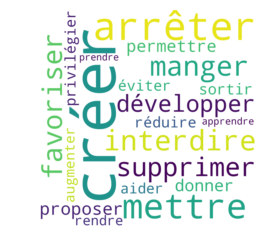

In [95]:
#wordcloud des keywords vp les plus présents
wordcloudkeyword = wordcloud.WordCloud(background_color="white",width=1500,height=1500, max_words=20,relative_scaling=0.5,normalize_plurals=False).generate_from_frequencies(keywordsvpcount)
plt.imshow(wordcloudkeyword,interpolation='bilinear')
plt.axis("off")
plt.show()

In [26]:
def get_prop_with_vp_kw(kw,props):
    l=[]
    for i in range(len(props)) : 
        if kw in vppattern[props[i]] :
            l.append((props[i],solutions[i]))
    return l

In [27]:
print("kw vp ?")
rep=input()
for prop,solution in get_prop_with_vp_kw(rep,props) :
    print(prop,solution)
print(len(get_prop_with_vp_kw(rep,props)))

kw vp ?
penser
Il faut que les Esat et Entreprises Adaptées aménagent les temps de travail, plutôt que de ne penser que rendement. Temps partiels réclamés  orientation de politique générale
Il faut que nos politiques et concitoyens arrêtent de penser à des solutions pour nous à notre place nan
Il faut arrêter de penser aux parents et leur envie, et voir objectivement si l'école et les AVS sont favorables pour tel ou tel enfant nan
Il faut dans tout projet penser aux personnes en situation de handicap dès le départ et à toutes les étapes nan
Il faut aussi penser aux personnes handicapées en institution. La France est très en retard pour les prises en charge nan
Il faut penser un nouveau modèle social et sociétal. Apprenez de notre différence, vous seriez surpris de voir votre propre handicap. nan
Il faut penser un nouveau modèle social et sociétal. Apprenez de notre différence, vous seriez surpris de voir votre propre handicap. nan
Il faut penser que ne pas pouvoir travailler ou travail

In [6]:
###########################################################################################
###########################################################################################
###########################################################################################
data = pd.read_csv('handi_alim_rgds_we_aines_.csv', encoding='utf-8')
props=list(data['content'])
keywordsvp=list(data['keywords_lemma'])
solutions=list(data['solution_clean'])
solutions2vp=defaultdict(lambda:defaultdict(int))
keywordsvpcount=defaultdict(int)
vp2solutioncount=defaultdict(lambda:defaultdict(int))
for i in range(len(props)) : 
    if not isinstance(keywordsvp[i],float) :
        for kw in keywordsvp[i].split('|'):
            keywordsvpcount[kw]+=1
            vp2solutioncount[kw][solutions[i]]+=1
            solutions2vp[solutions[i]][kw]+=1

In [7]:
#renvoie une liste ordonnée des keywords les plus présents
sortedkeywordvpcounts=sorted(keywordsvpcount.items(), key=lambda x: x[1], reverse=True)
print(sortedkeywordvpcounts[:100])
print('\n')
#print("VP")
#print(sortedkeywordvpcounts[:20])

[('sortir', 1688), ('arrêter', 750), ('créer', 741), ('manger', 729), ('mettre', 605), ('interdire', 539), ('permettre', 505), ('favoriser', 495), ('proposer', 474), ('supprimer', 441), ('prendre', 424), ('développer', 399), ('donner', 384), ('privilégier', 352), ('aider', 336), ('réduire', 322), ('éviter', 288), ('adapter', 279), ('rendre', 274), ('respecter', 264), ('augmenter', 262), ('apprendre', 260), ('acheter', 257), ('limiter', 234), ('former', 218), ('cuisiner', 199), ('taxer', 195), ('frer', 183), ('imposer', 177), ('harmoniser', 173), ('revenir', 169), ('faciliter', 167), ('valoriser', 166), ('sensibiliser', 163), ('payer', 160), ('éduquer', 157), ('diminuer', 155), ('obliger', 153), ('vivre', 149), ('vendre', 147), ('consommer', 145), ('pouvoir', 144), ('encourager', 143), ('revoir', 138), ('baisser', 137), ('transformer', 135), ('accompagner', 133), ('utiliser', 130), ('reconnaître', 128), ('améliorer', 128), ('stopper', 127), ('comprendre', 122), ('laisser', 120), ('insta

In [8]:
#répartition des enjeux pour les keywords les plus fréquents
solutionscount=defaultdict(int)
vp2solutioncount=defaultdict(lambda:defaultdict(int))
for i in range(len(props)) : 
    keyvp=[a for a,b in sortedkeywordvpcounts]
    for vb in set(vppattern[props[i]]) : 
        if vb in keyvp : 
            vp2solutioncount[vb][solutions[i]]+=1
    solutionscount[solutions[i]]+=1

NameError: name 'vppattern' is not defined

In [8]:
#solutions les plus fréquentes pour les keywords vp les plus présents
for k,v in vp2solutioncount.items() : 
    print(k)
    sortedsolution=sorted(vp2solutioncount[k].items(), key=lambda x: x[1], reverse=True)
    print(sortedsolution)
    print('\n')

plutôt bien
[('harmonisation', 1)]


enfin appliquer
[('harmonisation', 2), ('orientation de politique générale', 1)]


commencer
[('sensibilisation et communication', 10), ('harmonisation', 7), ('reform of the EU institutions', 5), ('comportements individuels', 4), ('orientation de politique générale', 4), ('réforme des politiques publiques', 3), ('None', 3), ('régulation', 2), ('EU competences', 2), ('RSE', 1), ('responsabilisation', 1)]


appliquer
[('sanctions', 18), ('harmonisation', 13), ('taxation', 12), ('régulation', 11), ('None', 5), ('sensibilisation et communication', 5), ('orientation de politique générale', 4), ('aménagement des espaces', 3), ('réforme des politiques publiques', 2), ('budget', 2), ('national competences', 2), ('insertion', 1), ('participation citoyenne', 1), ('sortie euro et Europe', 1), ('coopération intergouvernementale', 1), ('diplomatic decisions & treaties', 1), ('reform of the EU institutions', 1), ('simplification', 1), ('land development', 1)]


c

[('régulation', 21), ('sanctions', 7), ('european protectionism', 5), ('None', 4), ('reform of the EU institutions', 4), ('réforme des politiques publiques', 3), ('sortie euro et Europe', 3), ('national competences', 3), ('insertion', 2), ('aides et subventions', 2), ('orientation de politique générale', 2), ('aménagement des espaces', 1), ('sensibilisation et communication', 1), ('protectionnisme économique', 1), ('responsabilisation', 1), ('participation citoyenne', 1), ('pan-European major projects', 1), ('engagement associatif', 1)]


scolariser
[('insertion', 7)]


reconsidérer
[('aides et subventions', 1), ('None', 1), ('régulation', 1)]


soutenir financièremer
[('aides et subventions', 3), ('régulation', 1)]


dépister
[('formation', 1), ('réforme des politiques publiques', 1)]


destiner
[('sanctions', 3), ('régulation', 2), ('insertion', 1), ('orientation de politique générale', 1), ('aménagement des espaces', 1), ('comportements individuels', 1), ('sensibilisation et communi

[('aménagement des espaces', 1)]


n’
[('aménagement des espaces', 1), ('réforme des politiques publiques', 1), ('comportements individuels', 1), ('reform of the EU institutions', 1), ('sortie euro et Europe', 1), ('couverture sociale', 1), ('aides et subventions', 1)]


afficher visiblemer
[('aménagement des espaces', 1)]


joindre
[('aménagement des espaces', 1), ('régulation', 1)]


beaucoup stricte
[('sanctions', 1)]


obligatoirement consacrer
[('budget', 1)]


faire
[('sanctions', 5), ('réforme des politiques publiques', 1), ('reform of the EU institutions', 1), ('régulation', 1)]


refaire
[('simplification', 3), ('réforme des politiques publiques', 2), ('sortie euro et Europe', 2), ('aménagement des espaces', 1), ('comportements individuels', 1), ('sensibilisation et communication', 1), ('reform of the EU institutions', 1), ('None', 1)]


puisse circuler
[('aménagement des espaces', 1)]


roulant partout
[('aménagement des espaces', 1)]


promouvoir notammer
[('sensibilisation 

rééduquer
[('sensibilisation et communication', 3), ('comportements individuels', 1)]


frais plutôt
[('sensibilisation et communication', 1)]


récolter
[('sensibilisation et communication', 4), ('taxation', 1)]


déguster bien sûr
[('sensibilisation et communication', 1)]


besoin
[('comportements individuels', 10), ('european protectionism', 2), ('aides et subventions', 1), ('None', 1)]


cuisiner davantage
[('comportements individuels', 1)]


borner
[('sensibilisation et communication', 1)]


mieux consommer
[('comportements individuels', 3), ('sensibilisation et communication', 2)]


totalement changer
[('comportements individuels', 1)]


sélectionner
[('régulation', 3), ('comportements individuels', 1), ('None', 1), ('sensibilisation et communication', 1), ('harmonisation', 1)]


bien manger bonnes habituder
[('sensibilisation et communication', 1)]


consommer bêtemer
[('sensibilisation et communication', 1)]


ré-apprendre
[('sensibilisation et communication', 1)]


préparée un


risquer
[('sensibilisation et communication', 1), ('sanctions', 1), ('régulation', 1)]


dire exactemer
[('sensibilisation et communication', 1)]


tromper
[('régulation', 3), ('sensibilisation et communication', 1)]


décrypter
[('sensibilisation et communication', 2)]


vendus contienner
[('contrôle qualité', 1)]


informer beaucoup mieux
[('sensibilisation et communication', 1)]


précise nettemer
[('régulation', 1)]


sanctionner lourdemer
[('régulation', 1), ('sanctions', 1)]


puisse savoir précisémer
[('sensibilisation et communication', 1)]


calculée scientifiquemer
[('contrôle qualité', 1)]


obligatoirement connaître
[('régulation', 1)]


veut rien dire
[('sensibilisation et communication', 1)]


systématiquement exprimer
[('sensibilisation et communication', 1)]


populariser
[('sensibilisation et communication', 1)]


alerter
[('sensibilisation et communication', 3), ('régulation', 1)]


citer
[('régulation', 1)]


issu
[('reform of the EU institutions', 3), ('sensibilisa


ficher
[('sanctions', 2), ('régulation', 1)]


tremper
[('sanctions', 1)]


contrôler régulièremer
[('régulation', 1)]


réorganiser
[('reform of the EU institutions', 2), ('régulation', 1), ("transformation de l'administration", 1)]


acquitter
[('régulation', 1)]


sanctionner systématiquemer
[('sanctions', 1)]


dorer
[('budget', 1), ('reform of the EU institutions', 1), ('régulation', 1)]


mieux lutter
[('sanctions', 1), ('reform of the EU institutions', 1)]


impliquer davantage
[('participation citoyenne', 1)]


bloque
[('participation citoyenne', 1)]


approuver
[('participation citoyenne', 3)]


puissent influencer
[('régulation', 1)]


précéder
[('participation citoyenne', 1)]


davantage participer
[('participation citoyenne', 1)]


élue europe sociale
[('participation citoyenne', 1)]


verse
[('orientation de politique générale', 1)]


souvent consulter
[('sensibilisation et communication', 1)]


débattre
[('participation citoyenne', 1)]


communique systématiquemer
[('sen

résorber
[('orientation de politique générale', 1)]


forme
[('pan-European major projects', 1)]


allier
[('pan-European major projects', 1), ('intergénérationnel', 1)]


étudié bien sûr
[('harmonisation', 1)]


forger
[('None', 1), ('harmonisation', 1)]


veut dire ensemble
[('harmonisation', 1)]


détachés doivent relever intégralemer
[('régulation', 1)]


doivent effectuer
[('national competences', 1)]


favoriser partout
[('sensibilisation et communication', 1)]


installent ber
[('national competences', 1)]


supprime
[('régulation', 1), ('simplification', 1)]


largement baisser
[('budget', 1)]


minimum
[('harmonisation', 1)]


puisse vivre dignemer
[('harmonisation', 1)]


pourraient travailler
[('régulation', 1)]


brime
[('harmonisation', 1)]


co-décider
[('orientation de politique générale', 1)]


équivaloir
[('harmonisation', 1), ('social protection & public services', 1), ('régulation', 1), ('EU competences', 1), ('budget', 1)]


puissent profiter
[('harmonisation', 1)]


écouter parler
[('comportements individuels', 1)]


aller demander
[('régulation', 1)]


déjeuner
[('intergénérationnel', 1)]


autant mobiliser
[('politique sociale', 1)]


stationnement gêner
[('politique sociale', 1)]


conduire contrôler
[('régulation', 1)]


parler clairemer
[('comportements individuels', 1)]


matin réveiller
[('participation citoyenne', 1)]


emmener marcher
[('participation citoyenne', 1)]


surmédicaliser
[('politique sociale', 1), ('régulation', 1)]


estiment suffisamment vécu
[('régulation', 1)]


désirent mourir
[('régulation', 1)]


dignemer
[('régulation', 1)]


autorise
[('politique sociale', 1)]


partir dignemer
[('politique sociale', 1)]


mourir dignemer
[('régulation', 1)]


formaliser
[('régulation', 1)]


appliquer mieux sinon améliorer
[('politique sociale', 1)]


parfois difficile respectueux
[('politique sociale', 1)]


veulent partir
[('régulation', 1)]


souvent lier
[('sensibilisation et communication', 1)]


voté veux tard
[('régulation', 

appliquer
[('sanctions', 18), ('harmonisation', 13), ('taxation', 12), ('régulation', 11), ('None', 5), ('sensibilisation et communication', 5), ('orientation de politique générale', 4), ('aménagement des espaces', 3), ('réforme des politiques publiques', 2), ('budget', 2), ('national competences', 2), ('insertion', 1), ('participation citoyenne', 1), ('sortie euro et Europe', 1), ('coopération intergouvernementale', 1), ('diplomatic decisions & treaties', 1), ('reform of the EU institutions', 1), ('simplification', 1), ('land development', 1)]


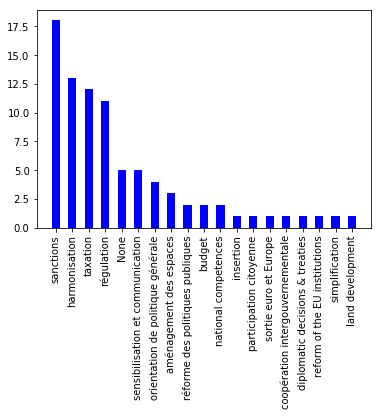



concerner
[('sensibilisation et communication', 14), ('régulation', 11), ('None', 7), ('formation', 5), ('orientation de politique générale', 5), ('réforme des politiques publiques', 5), ('participation citoyenne', 4), ('national competences', 3), ('aides et subventions', 2), ('reform of the EU institutions', 2), ('sanctions', 1), ('harmonisation', 1), ('aménagement des espaces', 1), ('budget', 1), ('comportements individuels', 1), ('simplification', 1), ('e-santé', 1), ('sortie euro et Europe', 1), ('pan-European major projects', 1)]


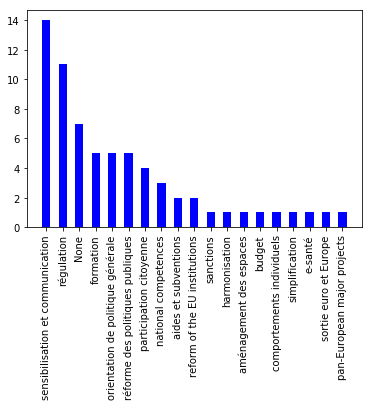



créer
[('reform of the EU institutions', 81), ('sensibilisation et communication', 55), ('réforme des politiques publiques', 54), ('EU competences', 52), ('politique sociale', 52), ('régulation', 41), ('harmonisation', 36), ('orientation de politique générale', 35), ('budget', 34), ('participation citoyenne', 29), ('aides et subventions', 28), ('None', 28), ('coopération intergouvernementale', 24), ('aménagement des espaces', 22), ('pan-European major projects', 21), ('aménagement du territoire', 19), ('taxation', 15), ('sanctions', 14), ('formation', 13), ('intergénérationnel', 11), ('comportements individuels', 10), ('social protection & public services', 8), ('insertion', 7), ('national competences', 7), ('simplification', 6), ('couverture sociale', 6), ('RSE', 5), ('sortie euro et Europe', 5), ('land development', 4), ('redistribution & répartition', 3), ('diplomatic decisions & treaties', 3), ('e-santé', 2), ("transformation de l'administration", 2), ('fiscalité & cotisations', 

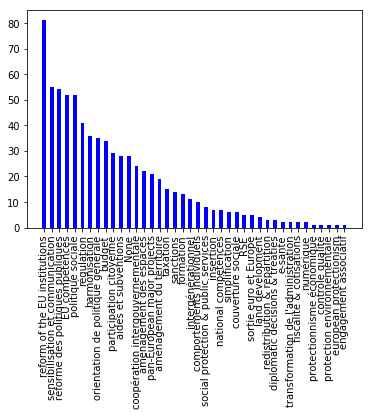



éviter
[('comportements individuels', 81), ('régulation', 44), ('harmonisation', 32), ('sensibilisation et communication', 22), ('orientation de politique générale', 18), ('None', 11), ('sanctions', 9), ('aides et subventions', 9), ('budget', 8), ('simplification', 5), ('politique sociale', 5), ('réforme des politiques publiques', 4), ('protection environnementale', 4), ('reform of the EU institutions', 4), ('taxation', 4), ('formation', 3), ('aménagement des espaces', 3), ('protectionnisme économique', 3), ('diplomatic decisions & treaties', 3), ('national competences', 3), ('coopération intergouvernementale', 2), ("transformation de l'administration", 2), ('contrôle qualité', 1), ('redistribution & répartition', 1), ('action européenne', 1), ('participation citoyenne', 1), ('social protection & public services', 1), ('european protectionism', 1), ('intergénérationnel', 1), ('engagement associatif', 1), ('couverture sociale', 1)]


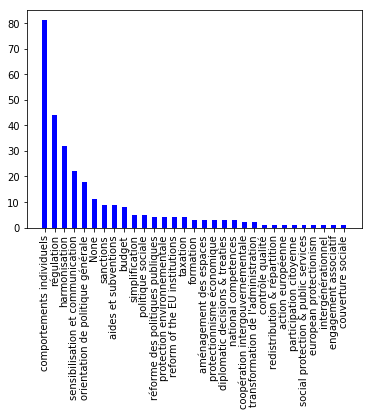



aider
[('aides et subventions', 100), ('None', 28), ('réforme des politiques publiques', 27), ('politique sociale', 20), ('orientation de politique générale', 16), ('sensibilisation et communication', 15), ('comportements individuels', 15), ('régulation', 13), ('insertion', 12), ('formation', 11), ('budget', 11), ('coopération intergouvernementale', 8), ('accompagnement & coaching', 7), ('aménagement des espaces', 6), ('participation citoyenne', 5), ('RSE', 5), ("transformation de l'administration", 5), ('protectionnisme économique', 4), ('harmonisation', 3), ('taxation', 3), ('social protection & public services', 3), ('couverture sociale', 3), ('intergénérationnel', 3), ('simplification', 2), ('sanctions', 2), ('sortie euro et Europe', 1), ('action européenne', 1), ('contrôle qualité', 1), ('redistribution & répartition', 1), ('european protectionism', 1), ('land development', 1), ('pan-European major projects', 1), ('numérique', 1), ('fiscalité & cotisations', 1)]


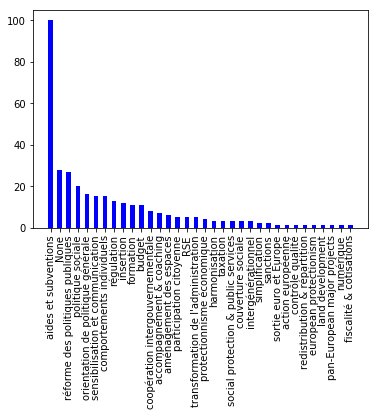



vivre
[('aides et subventions', 21), ('comportements individuels', 19), ('sensibilisation et communication', 16), ('régulation', 14), ('réforme des politiques publiques', 13), ('budget', 13), ('None', 11), ('politique sociale', 11), ('orientation de politique générale', 8), ('pan-European major projects', 3), ('insertion', 2), ('participation citoyenne', 2), ('RSE', 2), ('sortie euro et Europe', 2), ('recherche', 2), ('formation', 1), ('action européenne', 1), ('protectionnisme économique', 1), ('protection environnementale', 1), ('sanctions', 1), ('taxation', 1), ('reform of the EU institutions', 1), ('fiscalité & cotisations', 1), ('intergénérationnel', 1), ('couverture sociale', 1)]


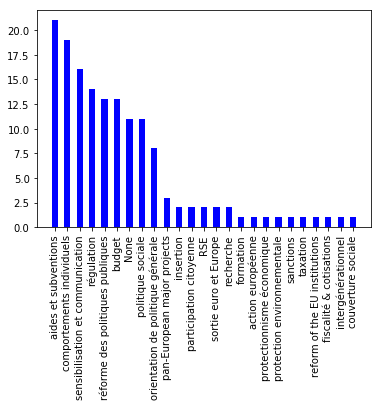



inclure
[('insertion', 15), ('réforme des politiques publiques', 10), ('sensibilisation et communication', 9), ('aides et subventions', 4), ('formation', 3), ('orientation de politique générale', 3), ('participation citoyenne', 3), ('harmonisation', 2), ('None', 2), ('taxation', 2), ('régulation', 2), ('pan-European major projects', 2), ('contrôle qualité', 1), ('reform of the EU institutions', 1), ('comportements individuels', 1), ('fiscalité & cotisations', 1), ('intergénérationnel', 1), ('politique sociale', 1)]


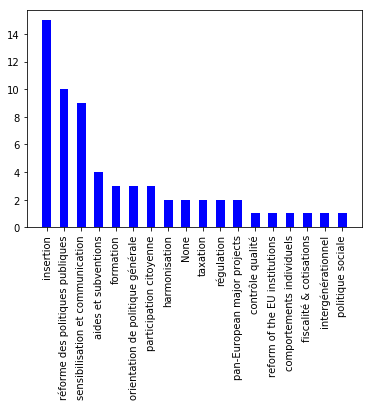



prendre
[('sensibilisation et communication', 62), ('comportements individuels', 51), ('réforme des politiques publiques', 45), ('aides et subventions', 43), ('régulation', 37), ('orientation de politique générale', 24), ('politique sociale', 23), ('budget', 20), ('reform of the EU institutions', 20), ('None', 19), ('participation citoyenne', 15), ('couverture sociale', 9), ('sanctions', 8), ('national competences', 6), ('harmonisation', 6), ('formation', 5), ('simplification', 4), ('insertion', 3), ('redistribution & répartition', 3), ('taxation', 3), ('pan-European major projects', 2), ('EU competences', 2), ('coopération intergouvernementale', 2), ('social protection & public services', 2), ("transformation de l'administration", 2), ('aménagement des espaces', 1), ('protectionnisme économique', 1), ('accompagnement & coaching', 1), ('sortie euro et Europe', 1), ('RSE', 1), ('fiscalité & cotisations', 1), ('numérique', 1), ('recherche', 1)]


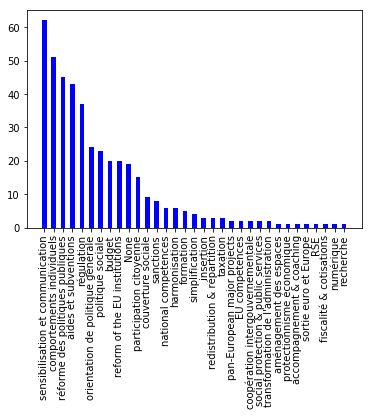



utiliser
[('régulation', 33), ('comportements individuels', 24), ('sanctions', 15), ('sensibilisation et communication', 12), ('réforme des politiques publiques', 6), ('budget', 5), ('None', 5), ('taxation', 5), ('aides et subventions', 4), ('aménagement du territoire', 3), ('orientation de politique générale', 2), ('RSE', 2), ('land development', 2), ('european protectionism', 2), ('formation', 1), ('insertion', 1), ('protectionnisme économique', 1), ('contrôle qualité', 1), ('participation citoyenne', 1), ('harmonisation', 1), ('national competences', 1), ('reform of the EU institutions', 1), ('social protection & public services', 1), ('recherche', 1)]


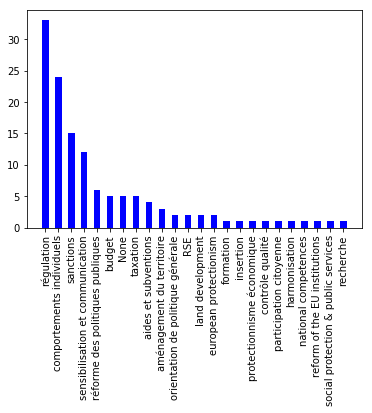



former
[('formation', 110), ('sensibilisation et communication', 45), ('réforme des politiques publiques', 10), ('insertion', 8), ('budget', 6), ('aides et subventions', 5), ('régulation', 5), ('politique sociale', 5), ('aménagement des espaces', 4), ('orientation de politique générale', 4), ('participation citoyenne', 4), ('harmonisation', 2), ('accompagnement & coaching', 2), ('reform of the EU institutions', 2), ('simplification', 1), ('None', 1), ('EU competences', 1), ('RSE', 1), ('comportements individuels', 1), ('couverture sociale', 1)]


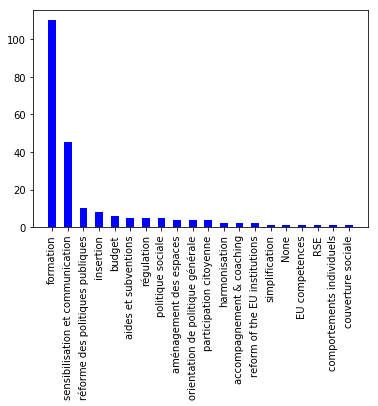



sensibiliser
[('sensibilisation et communication', 142), ('insertion', 6), ('formation', 5), ('orientation de politique générale', 3), ('aménagement des espaces', 1), ('sanctions', 1), ('aides et subventions', 1), ('accompagnement & coaching', 1), ('régulation', 1), ('politique sociale', 1), ('numérique', 1)]


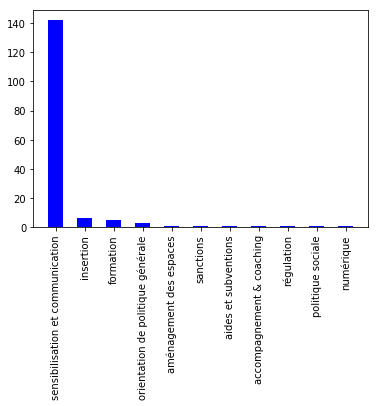



informer
[('sensibilisation et communication', 82), ('formation', 5), ('insertion', 3), ('comportements individuels', 3), ('simplification', 2), ('régulation', 2), ('sanctions', 1), ('accompagnement & coaching', 1)]


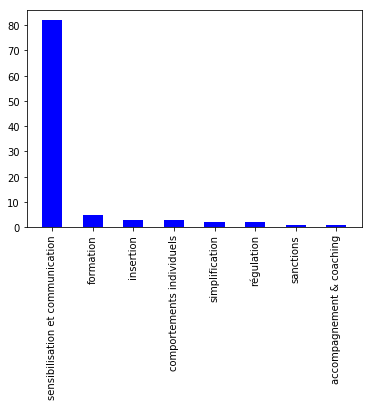



interdire
[('régulation', 327), ('sanctions', 131), ('reform of the EU institutions', 15), ('protectionnisme économique', 9), ('réforme des politiques publiques', 6), ('taxation', 6), ('orientation de politique générale', 6), ('contrôle qualité', 5), ('european protectionism', 5), ('protection environnementale', 4), ('None', 3), ('sensibilisation et communication', 2), ('aides et subventions', 2), ('sortie euro et Europe', 2), ('diplomatic decisions & treaties', 2), ('land development', 2), ('harmonisation', 2), ('budget', 2), ('national competences', 2), ('social protection & public services', 2), ('action européenne', 1), ('comportements individuels', 1), ('participation citoyenne', 1), ('fiscalité & cotisations', 1)]


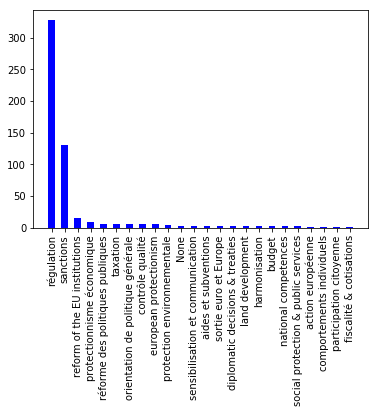



servir
[('régulation', 12), ('None', 4), ('comportements individuels', 4), ('sanctions', 2), ('réforme des politiques publiques', 2), ('sensibilisation et communication', 2), ('reform of the EU institutions', 2), ('taxation', 2), ('RSE', 1), ('protection environnementale', 1), ('orientation de politique générale', 1), ('sortie euro et Europe', 1), ('harmonisation', 1), ('EU competences', 1), ('pan-European major projects', 1), ('national competences', 1)]


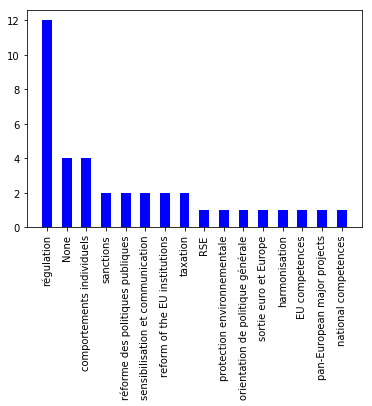



rembourser
[('aides et subventions', 17), ('réforme des politiques publiques', 8), ('budget', 4), ('régulation', 1), ('taxation', 1), ('pan-European major projects', 1), ('orientation de politique générale', 1), ('sanctions', 1), ('couverture sociale', 1)]


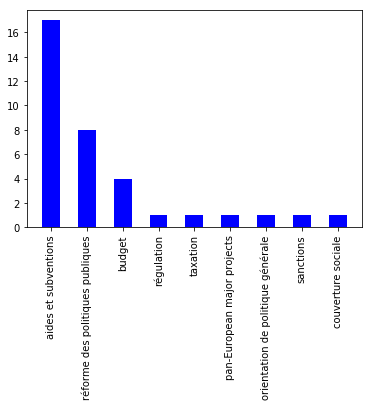



trouver
[('orientation de politique générale', 12), ('réforme des politiques publiques', 9), ('sensibilisation et communication', 8), ('comportements individuels', 8), ('None', 7), ('insertion', 5), ('aides et subventions', 5), ('régulation', 5), ('budget', 4), ('formation', 2), ('aménagement des espaces', 2), ('protectionnisme économique', 2), ('pan-European major projects', 2), ('politique sociale', 2), ('redistribution & répartition', 1), ('EU competences', 1), ('coopération intergouvernementale', 1), ('RSE', 1)]


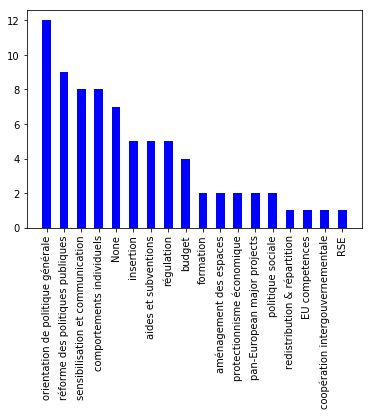



adapter
[('aménagement des espaces', 55), ('politique sociale', 33), ('insertion', 28), ('réforme des politiques publiques', 25), ('aides et subventions', 22), ('formation', 20), ('None', 15), ('orientation de politique générale', 13), ('sensibilisation et communication', 13), ('budget', 11), ('simplification', 6), ('comportements individuels', 6), ('régulation', 6), ('intergénérationnel', 5), ('harmonisation', 4), ('participation citoyenne', 3), ('taxation', 2), ('couverture sociale', 2), ('fiscalité & cotisations', 2), ('aménagement du territoire', 1), ('coopération intergouvernementale', 1), ('social protection & public services', 1), ('national competences', 1), ('RSE', 1), ("transformation de l'administration", 1), ('recherche', 1), ('engagement associatif', 1)]


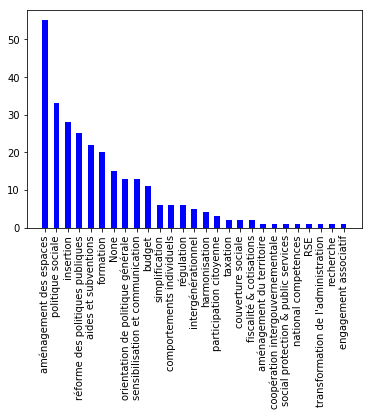



savoir
[('sensibilisation et communication', 28), ('comportements individuels', 17), ('régulation', 10), ('réforme des politiques publiques', 4), ('None', 3), ('formation', 3), ('orientation de politique générale', 2), ('insertion', 2), ('aménagement des espaces', 2), ('aides et subventions', 2), ('protectionnisme économique', 2), ('sortie euro et Europe', 2), ('sanctions', 2), ('politique sociale', 2), ('accompagnement & coaching', 1), ('european protectionism', 1), ('harmonisation', 1), ('social protection & public services', 1), ('participation citoyenne', 1), ('couverture sociale', 1)]


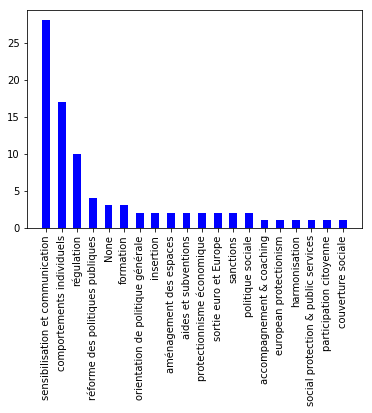



lutter
[('sanctions', 24), ('régulation', 24), ('sensibilisation et communication', 12), ('orientation de politique générale', 7), ('pan-European major projects', 6), ('politique sociale', 6), ('taxation', 5), ('harmonisation', 5), ('participation citoyenne', 3), ('coopération intergouvernementale', 3), ('intergénérationnel', 3), ('None', 2), ('comportements individuels', 2), ('redistribution & répartition', 2), ('aides et subventions', 2), ('budget', 2), ('réforme des politiques publiques', 1), ('accompagnement & coaching', 1), ('sortie euro et Europe', 1), ('reform of the EU institutions', 1), ('RSE', 1), ('EU competences', 1), ('national competences', 1), ('land development', 1), ('numérique', 1), ('fiscalité & cotisations', 1)]


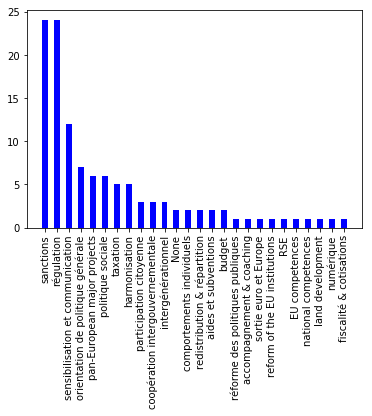



élever
[('comportements individuels', 12), ('régulation', 9), ('sensibilisation et communication', 4), ('orientation de politique générale', 4), ('harmonisation', 4), ('sanctions', 2), ('réforme des politiques publiques', 1), ('protectionnisme économique', 1), ('sortie euro et Europe', 1), ('None', 1), ('contrôle qualité', 1), ('taxation', 1), ('fiscalité & cotisations', 1), ('budget', 1)]


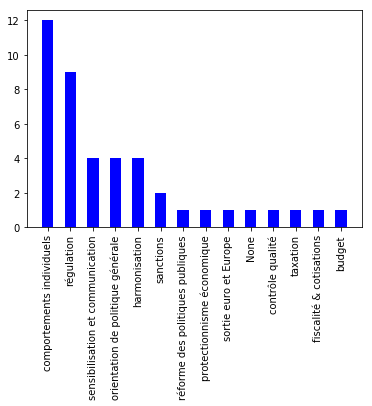



reconnaître
[('réforme des politiques publiques', 47), ('sensibilisation et communication', 27), ('None', 7), ('politique sociale', 7), ('comportements individuels', 5), ('harmonisation', 5), ('participation citoyenne', 5), ('aides et subventions', 4), ('orientation de politique générale', 3), ('insertion', 2), ('aménagement des espaces', 2), ('simplification', 2), ('régulation', 2), ('sanctions', 2), ('formation', 2), ('reform of the EU institutions', 1), ('national competences', 1), ('coopération intergouvernementale', 1), ('budget', 1), ('intergénérationnel', 1), ('couverture sociale', 1)]


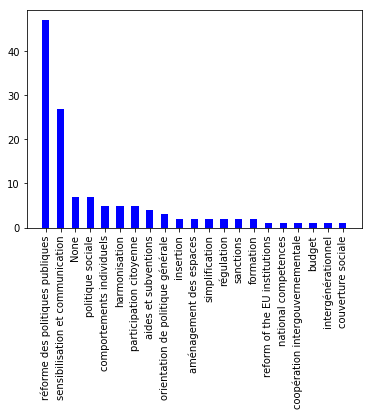



faciliter
[('simplification', 33), ('politique sociale', 19), ('insertion', 15), ('aménagement des espaces', 12), ('aides et subventions', 11), ('orientation de politique générale', 10), ('None', 9), ('réforme des politiques publiques', 7), ('sensibilisation et communication', 7), ('régulation', 6), ('formation', 4), ('harmonisation', 4), ('budget', 4), ('comportements individuels', 4), ('coopération intergouvernementale', 4), ('sanctions', 3), ('couverture sociale', 2), ('intergénérationnel', 2), ("transformation de l'administration", 2), ('protectionnisme économique', 1), ('aménagement du territoire', 1), ('redistribution & répartition', 1), ('accompagnement & coaching', 1), ('participation citoyenne', 1), ('taxation', 1), ('pan-European major projects', 1), ('fiscalité & cotisations', 1), ('engagement associatif', 1)]


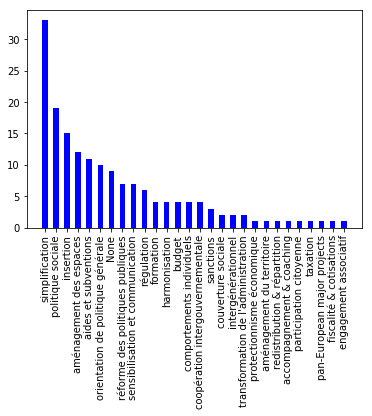



enseigner
[('sensibilisation et communication', 40), ('réforme des politiques publiques', 2), ('sanctions', 2), ('comportements individuels', 2), ('formation', 1), ('aménagement des espaces', 1), ('régulation', 1), ('reform of the EU institutions', 1), ('orientation de politique générale', 1), ('harmonisation', 1)]


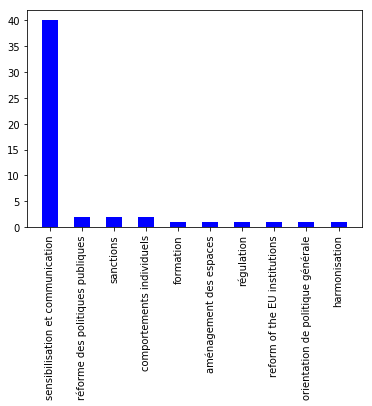



augmenter
[('budget', 56), ('réforme des politiques publiques', 29), ('taxation', 26), ('aides et subventions', 22), ('régulation', 19), ('None', 17), ('politique sociale', 13), ('orientation de politique générale', 10), ('social protection & public services', 10), ('sanctions', 8), ('formation', 8), ('comportements individuels', 7), ('harmonisation', 6), ('sensibilisation et communication', 5), ('redistribution & répartition', 4), ('insertion', 3), ('aménagement des espaces', 3), ('RSE', 3), ('national competences', 3), ('protectionnisme économique', 2), ('coopération intergouvernementale', 2), ('reform of the EU institutions', 2), ('participation citoyenne', 1), ('EU competences', 1), ('diplomatic decisions & treaties', 1), ('intergénérationnel', 1)]


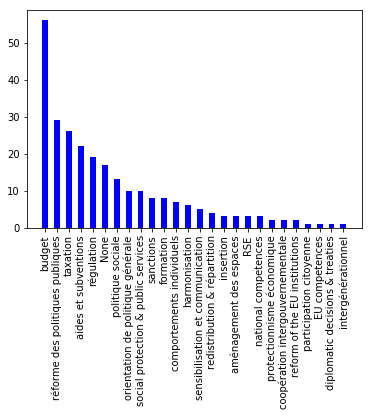



permettre
[('None', 53), ('régulation', 50), ('aides et subventions', 48), ('politique sociale', 45), ('sensibilisation et communication', 43), ('réforme des politiques publiques', 38), ('orientation de politique générale', 30), ('insertion', 29), ('comportements individuels', 25), ('budget', 21), ('aménagement des espaces', 16), ('participation citoyenne', 14), ('formation', 10), ('simplification', 9), ('harmonisation', 9), ('taxation', 7), ('reform of the EU institutions', 7), ('social protection & public services', 7), ('aménagement du territoire', 6), ('couverture sociale', 6), ('redistribution & répartition', 4), ('coopération intergouvernementale', 4), ('national competences', 4), ('sortie euro et Europe', 3), ('pan-European major projects', 3), ('fiscalité & cotisations', 3), ('sanctions', 2), ('recherche', 2), ('protection environnementale', 1), ('EU competences', 1), ('diplomatic decisions & treaties', 1), ('land development', 1), ('intergénérationnel', 1), ('RSE', 1), ('eng

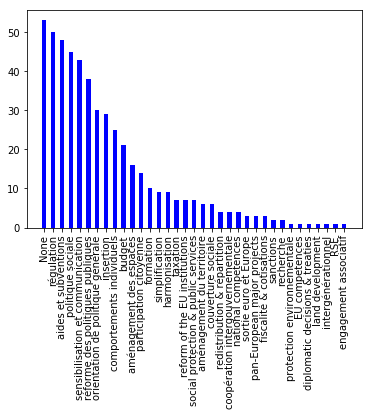



soutenir
[('aides et subventions', 21), ('politique sociale', 13), ('None', 9), ('orientation de politique générale', 7), ('insertion', 5), ('comportements individuels', 5), ('budget', 3), ('protectionnisme économique', 3), ('régulation', 2), ('formation', 2), ('participation citoyenne', 2), ('simplification', 1), ('sensibilisation et communication', 1), ('aménagement du territoire', 1), ('RSE', 1), ('pan-European major projects', 1), ('reform of the EU institutions', 1), ('taxation', 1), ('diplomatic decisions & treaties', 1), ('intergénérationnel', 1)]


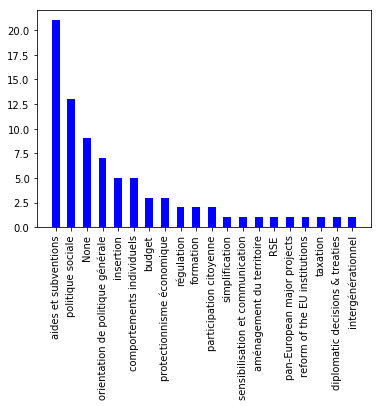



donner
[('sensibilisation et communication', 70), ('aides et subventions', 53), ('budget', 29), ('régulation', 28), ('participation citoyenne', 24), ('orientation de politique générale', 22), ('réforme des politiques publiques', 22), ('None', 20), ('reform of the EU institutions', 19), ('politique sociale', 17), ('comportements individuels', 15), ('harmonisation', 10), ('insertion', 5), ('formation', 5), ('sanctions', 5), ('RSE', 4), ('redistribution & répartition', 4), ('taxation', 4), ('social protection & public services', 4), ('couverture sociale', 4), ('aménagement du territoire', 3), ('protectionnisme économique', 3), ('EU competences', 3), ('aménagement des espaces', 2), ('simplification', 2), ('pan-European major projects', 2), ('accompagnement & coaching', 1), ('responsabilisation', 1), ('national competences', 1), ('coopération intergouvernementale', 1), ('european protectionism', 1)]


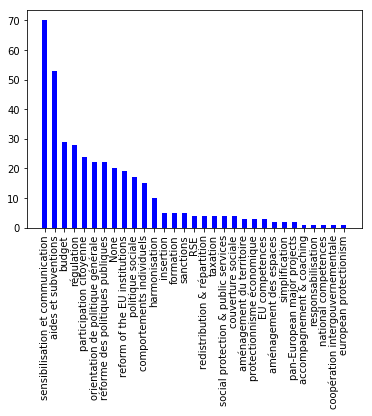



travailler
[('orientation de politique générale', 16), ('réforme des politiques publiques', 15), ('comportements individuels', 11), ('sensibilisation et communication', 10), ('aides et subventions', 9), ('régulation', 9), ('insertion', 6), ('None', 5), ('protectionnisme économique', 5), ('formation', 3), ('budget', 3), ('simplification', 2), ('protection environnementale', 2), ('pan-European major projects', 2), ('sanctions', 2), ('politique sociale', 2), ('aménagement des espaces', 1), ('aménagement du territoire', 1), ('reform of the EU institutions', 1), ('participation citoyenne', 1), ('taxation', 1), ('social protection & public services', 1), ('sortie euro et Europe', 1), ('european protectionism', 1), ('fiscalité & cotisations', 1), ("transformation de l'administration", 1)]


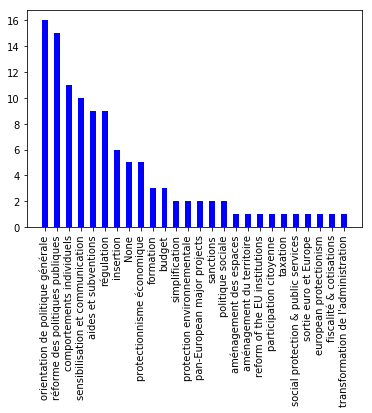



promouvoir
[('sensibilisation et communication', 40), ('orientation de politique générale', 20), ('régulation', 4), ('politique sociale', 4), ('réforme des politiques publiques', 2), ('aides et subventions', 2), ('participation citoyenne', 2), ('insertion', 1), ('budget', 1), ('None', 1), ('contrôle qualité', 1), ('sanctions', 1), ('pan-European major projects', 1), ('harmonisation', 1), ('coopération intergouvernementale', 1), ('taxation', 1), ('intergénérationnel', 1)]


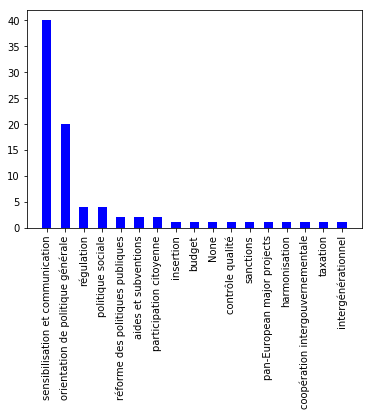



laisser
[('régulation', 17), ('comportements individuels', 14), ('orientation de politique générale', 12), ('réforme des politiques publiques', 9), ('politique sociale', 9), ('None', 8), ('participation citoyenne', 8), ('national competences', 8), ('sensibilisation et communication', 5), ('insertion', 4), ('harmonisation', 3), ('reform of the EU institutions', 3), ('budget', 3), ('formation', 2), ('sanctions', 2), ('coopération intergouvernementale', 2), ('EU competences', 2), ('social protection & public services', 2), ('simplification', 1), ('sortie euro et Europe', 1), ('pan-European major projects', 1), ('aides et subventions', 1), ('engagement associatif', 1), ('intergénérationnel', 1), ('couverture sociale', 1)]


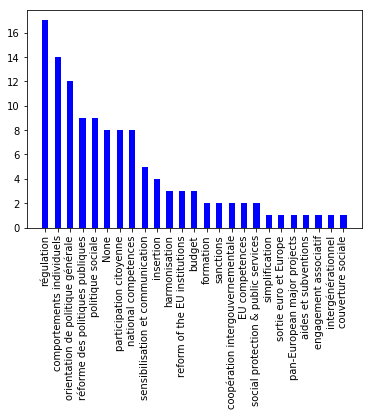



favoriser
[('comportements individuels', 73), ('None', 66), ('orientation de politique générale', 41), ('sensibilisation et communication', 40), ('aides et subventions', 40), ('régulation', 36), ('politique sociale', 34), ('insertion', 24), ('réforme des politiques publiques', 16), ('taxation', 14), ('aménagement du territoire', 12), ('participation citoyenne', 11), ('harmonisation', 9), ('sanctions', 8), ('protectionnisme économique', 8), ('intergénérationnel', 8), ('pan-European major projects', 7), ('aménagement des espaces', 6), ('RSE', 5), ('coopération intergouvernementale', 5), ('national competences', 5), ('formation', 4), ('budget', 4), ('european protectionism', 4), ('simplification', 2), ('reform of the EU institutions', 2), ('land development', 2), ('diplomatic decisions & treaties', 2), ('couverture sociale', 2), ('redistribution & répartition', 1), ('action européenne', 1), ('sortie euro et Europe', 1), ('EU competences', 1), ('engagement associatif', 1)]


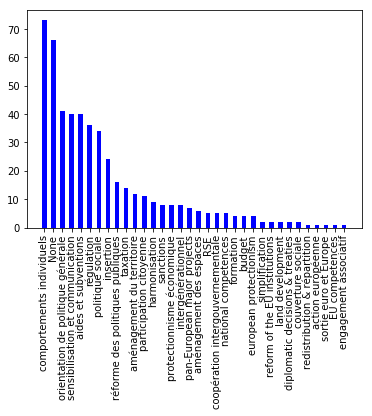



développer
[('politique sociale', 70), ('sensibilisation et communication', 41), ('None', 40), ('orientation de politique générale', 38), ('aides et subventions', 21), ('budget', 19), ('régulation', 18), ('réforme des politiques publiques', 16), ('participation citoyenne', 14), ('aménagement du territoire', 12), ('intergénérationnel', 12), ('comportements individuels', 11), ('coopération intergouvernementale', 11), ('harmonisation', 9), ('land development', 7), ('aménagement des espaces', 6), ('social protection & public services', 6), ('formation', 6), ('insertion', 5), ('pan-European major projects', 5), ('RSE', 4), ('numérique', 4), ('couverture sociale', 4), ('national competences', 3), ('protection environnementale', 2), ('taxation', 2), ('european protectionism', 2), ('simplification', 1), ('protectionnisme économique', 1), ('redistribution & répartition', 1), ('contrôle qualité', 1), ('accompagnement & coaching', 1), ('diplomatic decisions & treaties', 1), ('EU competences', 1

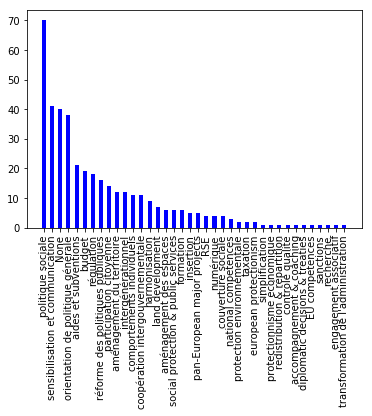



communiquer
[('sensibilisation et communication', 21), ('insertion', 1), ('formation', 1), ('régulation', 1), ('None', 1), ('comportements individuels', 1)]


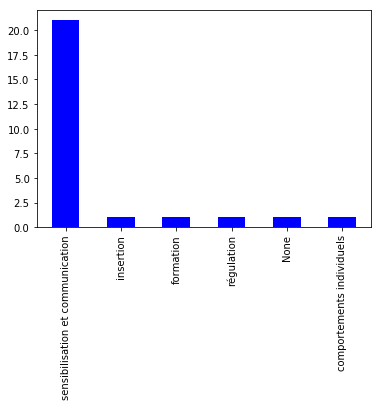



encourager
[('sensibilisation et communication', 33), ('aides et subventions', 22), ('orientation de politique générale', 14), ('régulation', 11), ('None', 11), ('comportements individuels', 10), ('taxation', 6), ('politique sociale', 5), ('intergénérationnel', 5), ('insertion', 3), ('sanctions', 3), ('réforme des politiques publiques', 3), ('participation citoyenne', 3), ('harmonisation', 2), ('budget', 2), ('coopération intergouvernementale', 2), ('simplification', 1), ('protectionnisme économique', 1), ('protection environnementale', 1), ('aménagement du territoire', 1), ('accompagnement & coaching', 1), ('reform of the EU institutions', 1), ('formation', 1), ('engagement associatif', 1)]


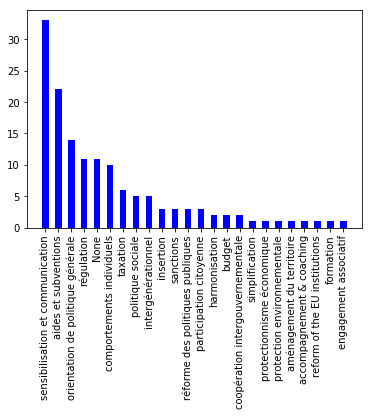



intégrer
[('sensibilisation et communication', 25), ('insertion', 15), ('régulation', 9), ('orientation de politique générale', 8), ('formation', 5), ('aides et subventions', 5), ('participation citoyenne', 5), ('réforme des politiques publiques', 5), ('diplomatic decisions & treaties', 5), ('comportements individuels', 4), ('None', 3), ('coopération intergouvernementale', 3), ('reform of the EU institutions', 2), ('harmonisation', 2), ('intergénérationnel', 2), ('simplification', 1), ('RSE', 1), ('protectionnisme économique', 1), ('taxation', 1), ('budget', 1), ('engagement associatif', 1), ('numérique', 1), ('politique sociale', 1)]


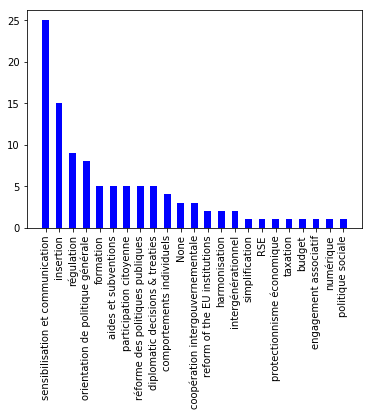



considérer
[('sensibilisation et communication', 30), ('régulation', 9), ('comportements individuels', 7), ('insertion', 5), ('None', 5), ('réforme des politiques publiques', 5), ('orientation de politique générale', 2), ('formation', 2), ('sanctions', 1), ('harmonisation', 1), ('aides et subventions', 1), ('taxation', 1), ('politique sociale', 1), ('budget', 1)]


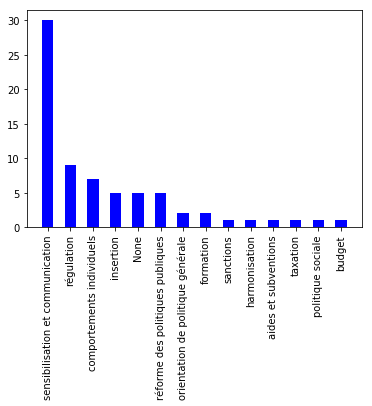



accompagner
[('politique sociale', 16), ('sensibilisation et communication', 15), ('insertion', 14), ('aides et subventions', 14), ('réforme des politiques publiques', 13), ('None', 13), ('budget', 12), ('formation', 12), ('orientation de politique générale', 7), ('régulation', 5), ('comportements individuels', 4), ('participation citoyenne', 2), ('harmonisation', 1), ('sanctions', 1), ('accompagnement & coaching', 1), ('coopération intergouvernementale', 1), ('RSE', 1), ('fiscalité & cotisations', 1)]


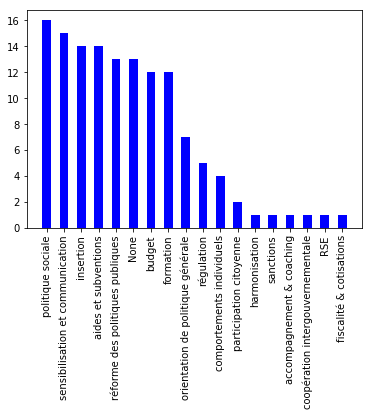



répondre
[('budget', 36), ('sensibilisation et communication', 6), ('orientation de politique générale', 4), ('politique sociale', 3), ('sanctions', 2), ('aménagement des espaces', 2), ('insertion', 1), ('harmonisation', 1), ('None', 1), ('simplification', 1), ('réforme des politiques publiques', 1), ('accompagnement & coaching', 1), ('EU competences', 1), ('formation', 1), ('comportements individuels', 1)]


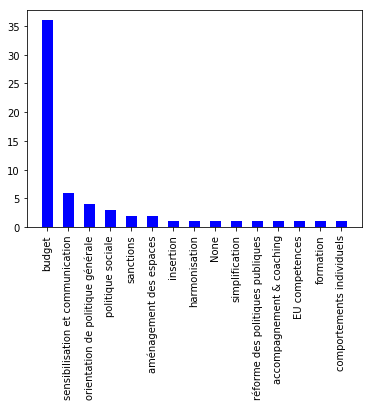



respecter
[('sanctions', 41), ('comportements individuels', 40), ('sensibilisation et communication', 39), ('régulation', 37), ('None', 18), ('orientation de politique générale', 12), ('national competences', 12), ('politique sociale', 10), ('taxation', 9), ('participation citoyenne', 8), ('harmonisation', 5), ('réforme des politiques publiques', 3), ('aménagement des espaces', 3), ('protectionnisme économique', 3), ('sortie euro et Europe', 3), ('budget', 3), ('insertion', 2), ('contrôle qualité', 2), ('reform of the EU institutions', 2), ('EU competences', 2), ('european protectionism', 2), ('simplification', 1), ('redistribution & répartition', 1), ('RSE', 1), ('diplomatic decisions & treaties', 1), ('pan-European major projects', 1), ('coopération intergouvernementale', 1), ('formation', 1), ('aides et subventions', 1)]


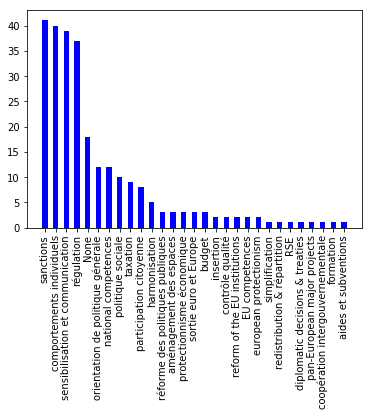



mettre
[('sensibilisation et communication', 102), ('régulation', 74), ('orientation de politique générale', 59), ('harmonisation', 36), ('réforme des politiques publiques', 34), ('None', 32), ('participation citoyenne', 32), ('sanctions', 29), ('comportements individuels', 23), ('taxation', 19), ('politique sociale', 19), ('aides et subventions', 18), ('reform of the EU institutions', 16), ('aménagement des espaces', 14), ('budget', 12), ('insertion', 9), ('formation', 8), ('aménagement du territoire', 8), ('sortie euro et Europe', 5), ('simplification', 4), ('redistribution & répartition', 4), ('coopération intergouvernementale', 4), ('pan-European major projects', 4), ('intergénérationnel', 4), ('RSE', 3), ('contrôle qualité', 3), ('protectionnisme économique', 3), ('EU competences', 3), ('european protectionism', 3), ('fiscalité & cotisations', 3), ('couverture sociale', 3), ('engagement associatif', 3), ('protection environnementale', 2), ('accompagnement & coaching', 2), ('dipl

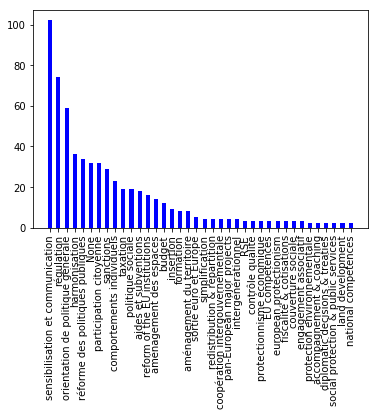



expliquer
[('sensibilisation et communication', 56), ('None', 1), ('comportements individuels', 1), ('régulation', 1), ('accompagnement & coaching', 1), ('participation citoyenne', 1), ('aides et subventions', 1), ('formation', 1), ("transformation de l'administration", 1)]


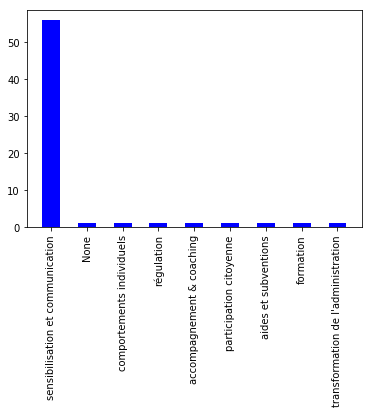



obliger
[('régulation', 56), ('sanctions', 15), ('aménagement des espaces', 12), ('réforme des politiques publiques', 9), ('harmonisation', 7), ('None', 7), ('orientation de politique générale', 7), ('sensibilisation et communication', 4), ('reform of the EU institutions', 4), ('politique sociale', 4), ('insertion', 3), ('comportements individuels', 3), ('participation citoyenne', 3), ('RSE', 3), ('taxation', 3), ('aides et subventions', 2), ('formation', 2), ('couverture sociale', 2), ('budget', 1), ('contrôle qualité', 1), ('accompagnement & coaching', 1), ('national competences', 1), ('EU competences', 1), ('european protectionism', 1), ('social protection & public services', 1)]


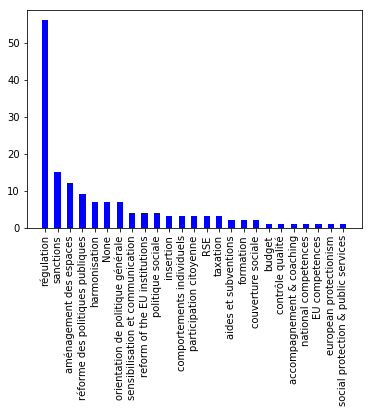



revoir
[('régulation', 34), ('réforme des politiques publiques', 25), ('orientation de politique générale', 11), ('None', 9), ('reform of the EU institutions', 8), ('sensibilisation et communication', 7), ('budget', 7), ('formation', 6), ('harmonisation', 5), ('aides et subventions', 4), ('comportements individuels', 3), ('diplomatic decisions & treaties', 3), ('social protection & public services', 3), ('simplification', 2), ('politique sociale', 2), ('insertion', 1), ('RSE', 1), ('action européenne', 1), ('national competences', 1), ('taxation', 1), ('EU competences', 1), ('pan-European major projects', 1), ("transformation de l'administration", 1), ('couverture sociale', 1)]


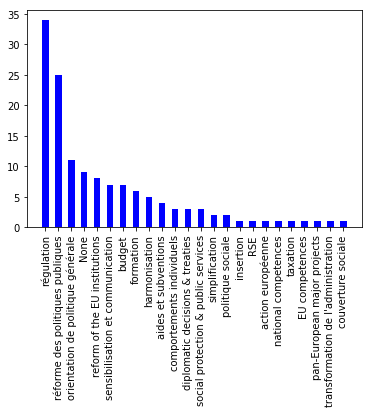



comprendre
[('sensibilisation et communication', 52), ('comportements individuels', 18), ('réforme des politiques publiques', 8), ('formation', 5), ('harmonisation', 5), ('orientation de politique générale', 4), ('sanctions', 4), ('insertion', 3), ('régulation', 3), ('simplification', 3), ('politique sociale', 3), ('None', 2), ('accompagnement & coaching', 2), ('aménagement des espaces', 1), ('aides et subventions', 1), ('budget', 1), ('protection environnementale', 1), ('aménagement du territoire', 1), ('national competences', 1), ('reform of the EU institutions', 1), ('taxation', 1), ('intergénérationnel', 1), ('RSE', 1)]


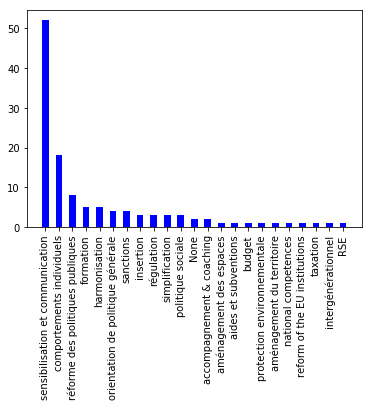



aménager
[('aménagement des espaces', 15), ('aides et subventions', 5), ('orientation de politique générale', 2), ('insertion', 2), ('comportements individuels', 2), ('aménagement du territoire', 2), ('budget', 2), ('sensibilisation et communication', 1), ('None', 1), ('RSE', 1), ('social protection & public services', 1), ('sanctions', 1)]


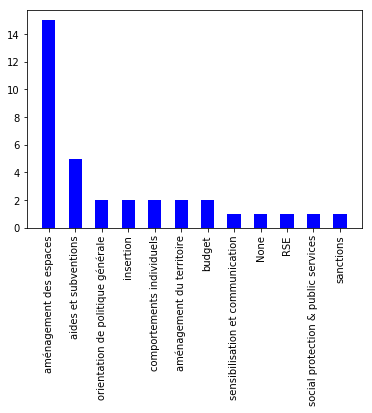



penser
[('réforme des politiques publiques', 12), ('sensibilisation et communication', 11), ('orientation de politique générale', 8), ('budget', 8), ('aides et subventions', 7), ('social protection & public services', 7), ('None', 5), ('régulation', 5), ('comportements individuels', 5), ('aménagement des espaces', 4), ('harmonisation', 4), ('participation citoyenne', 3), ('formation', 2), ('insertion', 1), ('RSE', 1), ('aménagement du territoire', 1), ('accompagnement & coaching', 1), ('reform of the EU institutions', 1), ('sortie euro et Europe', 1), ('national competences', 1), ('pan-European major projects', 1), ('politique sociale', 1), ('fiscalité & cotisations', 1)]


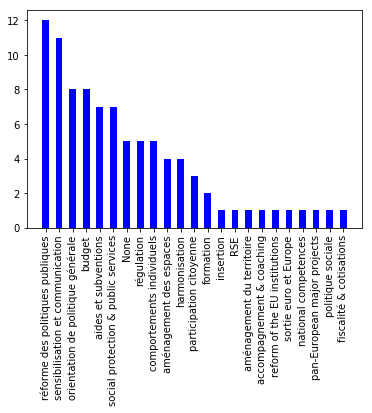



pouvoir
[('sensibilisation et communication', 16), ('insertion', 12), ('aides et subventions', 12), ('réforme des politiques publiques', 10), ('None', 10), ('budget', 9), ('orientation de politique générale', 9), ('participation citoyenne', 9), ('régulation', 9), ('harmonisation', 7), ('politique sociale', 7), ('comportements individuels', 6), ('aménagement des espaces', 4), ('aménagement du territoire', 3), ('national competences', 3), ('formation', 2), ('coopération intergouvernementale', 2), ('reform of the EU institutions', 2), ('RSE', 1), ('protection environnementale', 1), ('taxation', 1), ('accompagnement & coaching', 1), ('sanctions', 1), ('sortie euro et Europe', 1), ('simplification', 1), ('land development', 1), ('numérique', 1), ('couverture sociale', 1), ('fiscalité & cotisations', 1), ("transformation de l'administration", 1)]


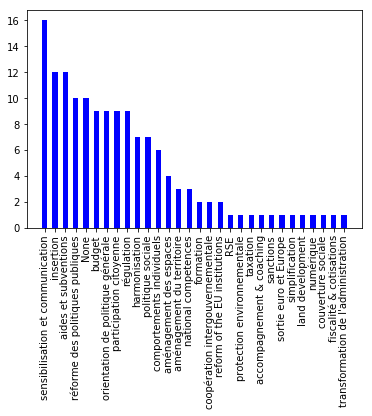



rendre
[('régulation', 45), ('sensibilisation et communication', 35), ('None', 25), ('réforme des politiques publiques', 22), ('aides et subventions', 18), ('aménagement des espaces', 17), ('orientation de politique générale', 16), ('politique sociale', 15), ('harmonisation', 13), ('budget', 9), ('taxation', 8), ('sanctions', 7), ('reform of the EU institutions', 6), ('formation', 5), ('comportements individuels', 4), ('contrôle qualité', 4), ('RSE', 4), ('sortie euro et Europe', 4), ('participation citoyenne', 3), ('national competences', 3), ('insertion', 2), ('simplification', 1), ('redistribution & répartition', 1), ('aménagement du territoire', 1), ('action européenne', 1), ('protection environnementale', 1), ('european protectionism', 1), ('coopération intergouvernementale', 1), ('pan-European major projects', 1), ('couverture sociale', 1)]


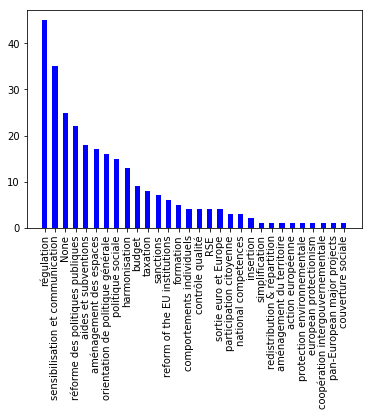



sortir
[('sortie euro et Europe', 1600), ('orientation de politique générale', 18), ('régulation', 12), ('None', 7), ('sensibilisation et communication', 7), ('reform of the EU institutions', 5), ('budget', 3), ('réforme des politiques publiques', 3), ('aides et subventions', 3), ('diplomatic decisions & treaties', 3), ('EU competences', 3), ('comportements individuels', 3), ('european protectionism', 3), ('insertion', 2), ('national competences', 2), ('pan-European major projects', 2), ('simplification', 1), ('aménagement des espaces', 1), ('redistribution & répartition', 1), ('protectionnisme économique', 1), ('sanctions', 1), ('participation citoyenne', 1), ('coopération intergouvernementale', 1), ('taxation', 1), ('social protection & public services', 1), ('engagement associatif', 1), ('recherche', 1), ('couverture sociale', 1)]


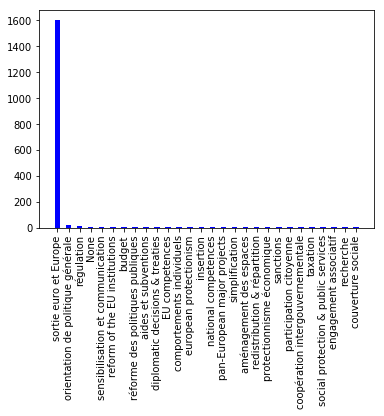



maintenir
[('politique sociale', 18), ('None', 5), ('aides et subventions', 5), ('réforme des politiques publiques', 4), ('sensibilisation et communication', 4), ('couverture sociale', 4), ('aménagement des espaces', 3), ('régulation', 3), ('insertion', 2), ('budget', 2), ('intergénérationnel', 2), ('orientation de politique générale', 1), ('national competences', 1), ('social protection & public services', 1), ('recherche', 1)]


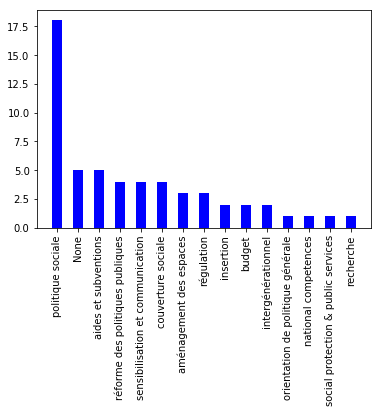



refuser
[('régulation', 11), ('sanctions', 8), ('orientation de politique générale', 3), ('réforme des politiques publiques', 2), ('comportements individuels', 2), ('reform of the EU institutions', 2), ('sensibilisation et communication', 1), ('None', 1), ('participation citoyenne', 1), ('diplomatic decisions & treaties', 1), ('sortie euro et Europe', 1)]


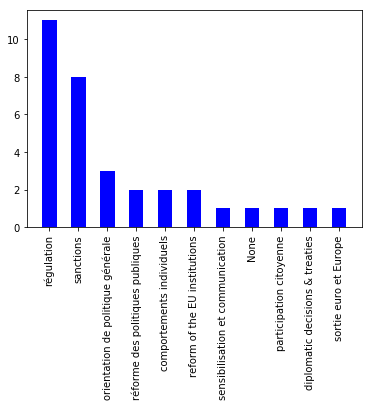



mieux informer
[('sensibilisation et communication', 22), ('aides et subventions', 1)]


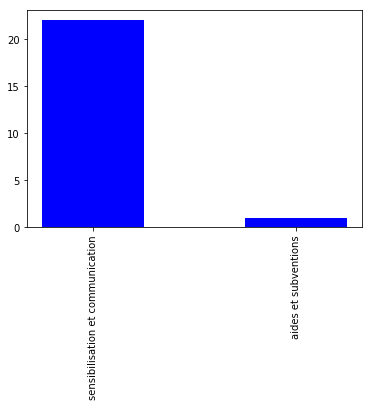



revaloriser
[('sensibilisation et communication', 14), ('politique sociale', 12), ('budget', 9), ('réforme des politiques publiques', 7), ('régulation', 4), ('orientation de politique générale', 3), ('social protection & public services', 3), ('None', 2), ('harmonisation', 1), ('formation', 1), ('RSE', 1)]


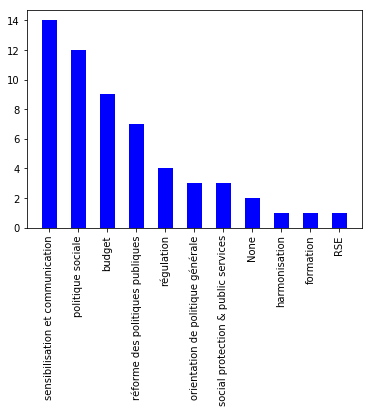



réserver
[('aménagement des espaces', 13), ('sanctions', 11), ('harmonisation', 4), ('orientation de politique générale', 3), ('régulation', 3), ('sensibilisation et communication', 2), ('aménagement du territoire', 2), ('réforme des politiques publiques', 1), ('insertion', 1), ('None', 1)]


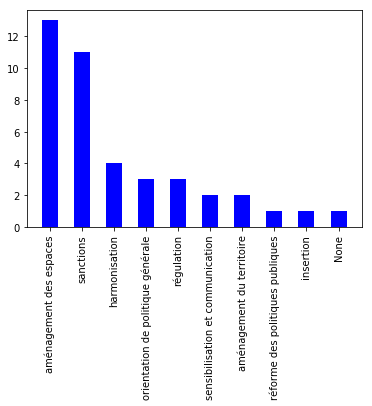



imposer
[('régulation', 68), ('orientation de politique générale', 14), ('taxation', 13), ('sensibilisation et communication', 12), ('sanctions', 9), ('réforme des politiques publiques', 7), ('harmonisation', 7), ('comportements individuels', 6), ('None', 5), ('insertion', 4), ('aménagement des espaces', 4), ('reform of the EU institutions', 4), ('RSE', 4), ('sortie euro et Europe', 3), ('simplification', 2), ('protectionnisme économique', 2), ('action européenne', 2), ('contrôle qualité', 2), ('participation citoyenne', 2), ('national competences', 2), ('protection environnementale', 1), ('aménagement du territoire', 1), ('budget', 1), ('formation', 1), ('numérique', 1)]


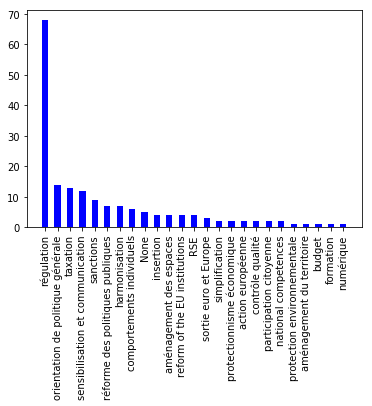



autoriser
[('régulation', 29), ('politique sociale', 5), ('sensibilisation et communication', 4), ('orientation de politique générale', 3), ('insertion', 2), ('réforme des politiques publiques', 2), ('sortie euro et Europe', 2), ('redistribution & répartition', 2), ('budget', 2), ('reform of the EU institutions', 2), ('EU competences', 1), ('harmonisation', 1), ('diplomatic decisions & treaties', 1), ('comportements individuels', 1)]


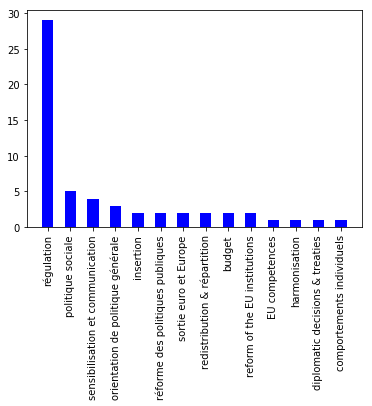



payer
[('régulation', 44), ('taxation', 33), ('comportements individuels', 11), ('harmonisation', 10), ('sanctions', 8), ('budget', 8), ('reform of the EU institutions', 8), ('réforme des politiques publiques', 6), ('aides et subventions', 6), ('politique sociale', 6), ('None', 3), ('protectionnisme économique', 2), ('RSE', 2), ('orientation de politique générale', 2), ('social protection & public services', 2), ('insertion', 1), ('redistribution & répartition', 1), ('sensibilisation et communication', 1), ('sortie euro et Europe', 1), ('diplomatic decisions & treaties', 1), ('national competences', 1), ('EU competences', 1), ('european protectionism', 1), ('fiscalité & cotisations', 1)]


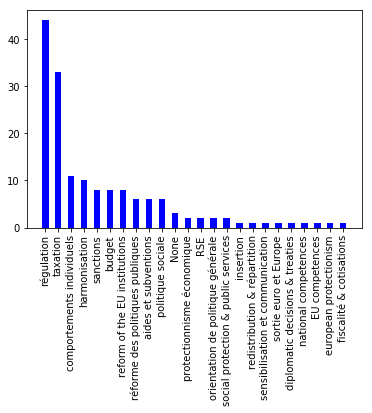



arrêter
[('régulation', 261), ('comportements individuels', 102), ('sensibilisation et communication', 59), ('None', 51), ('orientation de politique générale', 49), ('réforme des politiques publiques', 44), ('sanctions', 44), ('protectionnisme économique', 26), ('budget', 12), ('simplification', 12), ('aides et subventions', 9), ('reform of the EU institutions', 9), ('harmonisation', 8), ('taxation', 8), ('national competences', 8), ('RSE', 7), ('sortie euro et Europe', 5), ('pan-European major projects', 5), ('protection environnementale', 3), ('participation citoyenne', 3), ('european protectionism', 3), ('insertion', 2), ('coopération intergouvernementale', 2), ('social protection & public services', 2), ('intergénérationnel', 2), ('formation', 2), ('politique sociale', 2), ('aménagement des espaces', 1), ('action européenne', 1), ('redistribution & répartition', 1), ('aménagement du territoire', 1), ('contrôle qualité', 1), ('responsabilisation', 1), ('EU competences', 1), ('dipl

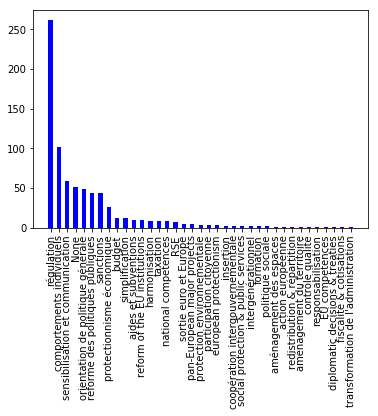



sanctionner
[('sanctions', 21), ('régulation', 2), ('orientation de politique générale', 2), ('sensibilisation et communication', 2), ('harmonisation', 2), ('comportements individuels', 1), ('participation citoyenne', 1), ('taxation', 1), ('formation', 1)]


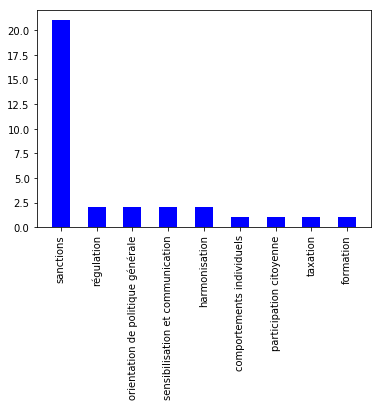



accepter
[('comportements individuels', 25), ('régulation', 10), ('None', 7), ('sensibilisation et communication', 7), ('insertion', 5), ('participation citoyenne', 3), ('orientation de politique générale', 3), ('reform of the EU institutions', 2), ('réforme des politiques publiques', 1), ('RSE', 1), ('redistribution & répartition', 1), ('contrôle qualité', 1), ('EU competences', 1), ('coopération intergouvernementale', 1), ('intergénérationnel', 1), ('politique sociale', 1), ('couverture sociale', 1)]


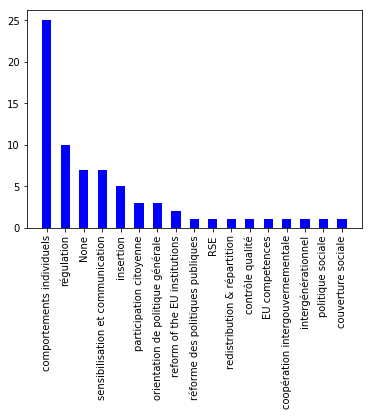



punir
[('sanctions', 22), ('accompagnement & coaching', 1), ('aides et subventions', 1)]


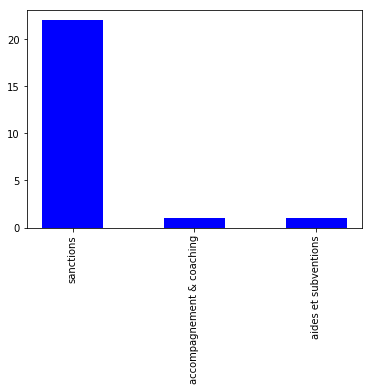



financer
[('budget', 17), ('aides et subventions', 12), ('taxation', 9), ('coopération intergouvernementale', 5), ('harmonisation', 4), ('sensibilisation et communication', 4), ('régulation', 4), ('EU competences', 3), ('reform of the EU institutions', 3), ('couverture sociale', 3), ('réforme des politiques publiques', 2), ('sanctions', 2), ('pan-European major projects', 2), ('orientation de politique générale', 2), ('formation', 1), ('aménagement des espaces', 1), ('national competences', 1), ('intergénérationnel', 1), ('politique sociale', 1), ('fiscalité & cotisations', 1), ('RSE', 1)]


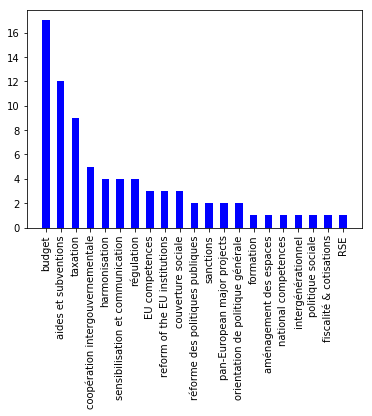



vouloir
[('comportements individuels', 15), ('aides et subventions', 7), ('régulation', 7), ('sensibilisation et communication', 6), ('orientation de politique générale', 4), ('insertion', 3), ('reform of the EU institutions', 3), ('participation citoyenne', 3), ('politique sociale', 3), ('aménagement des espaces', 1), ('formation', 1), ('réforme des politiques publiques', 1), ('None', 1), ('sanctions', 1), ('accompagnement & coaching', 1), ('pan-European major projects', 1), ('sortie euro et Europe', 1), ('european protectionism', 1), ('national competences', 1), ('budget', 1), ("transformation de l'administration", 1)]


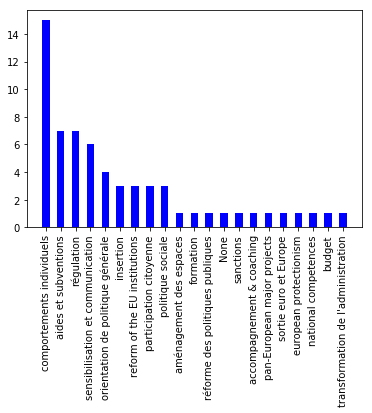



baisser
[('régulation', 47), ('taxation', 27), ('None', 15), ('réforme des politiques publiques', 13), ('budget', 7), ('orientation de politique générale', 7), ('comportements individuels', 3), ('redistribution & répartition', 3), ('harmonisation', 3), ('sensibilisation et communication', 2), ('aides et subventions', 2), ('RSE', 2), ('protectionnisme économique', 2), ('insertion', 1), ('social protection & public services', 1), ('land development', 1), ('couverture sociale', 1)]


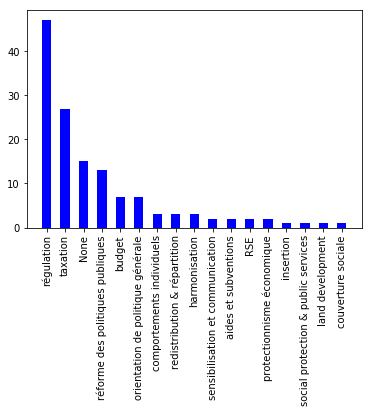



protéger
[('régulation', 19), ('orientation de politique générale', 10), ('european protectionism', 9), ('sanctions', 7), ('pan-European major projects', 6), ('réforme des politiques publiques', 5), ('sensibilisation et communication', 5), ('land development', 5), ('insertion', 4), ('protection environnementale', 4), ('social protection & public services', 4), ('coopération intergouvernementale', 4), ('None', 3), ('reform of the EU institutions', 3), ('comportements individuels', 2), ('EU competences', 2), ('politique sociale', 2), ('aménagement des espaces', 1), ('aménagement du territoire', 1), ('protectionnisme économique', 1), ('contrôle qualité', 1), ('harmonisation', 1), ('aides et subventions', 1), ('national competences', 1)]


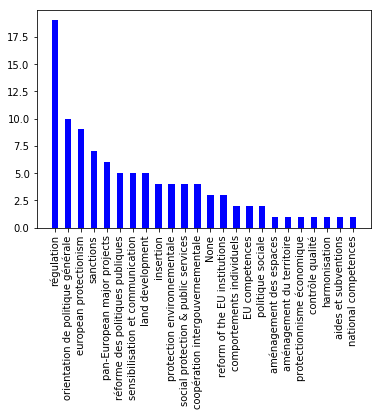



privilégier
[('comportements individuels', 181), ('None', 48), ('orientation de politique générale', 35), ('protectionnisme économique', 18), ('régulation', 18), ('sensibilisation et communication', 13), ('aides et subventions', 9), ('politique sociale', 6), ('sanctions', 5), ('harmonisation', 4), ('insertion', 3), ('european protectionism', 3), ('aménagement du territoire', 2), ('social protection & public services', 2), ('taxation', 2), ('aménagement des espaces', 1), ('RSE', 1), ('redistribution & répartition', 1)]


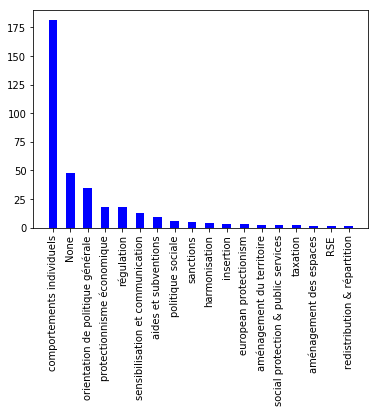



renforcer
[('régulation', 16), ('sensibilisation et communication', 12), ('sanctions', 11), ('harmonisation', 7), ('politique sociale', 7), ('coopération intergouvernementale', 6), ('orientation de politique générale', 4), ('reform of the EU institutions', 4), ('None', 4), ('budget', 3), ('EU competences', 3), ('aides et subventions', 2), ('formation', 2), ('contrôle qualité', 2), ('réforme des politiques publiques', 1), ('insertion', 1), ('comportements individuels', 1), ('protectionnisme économique', 1), ('participation citoyenne', 1), ('national competences', 1), ('social protection & public services', 1), ('land development', 1), ('european protectionism', 1), ('pan-European major projects', 1), ('couverture sociale', 1)]


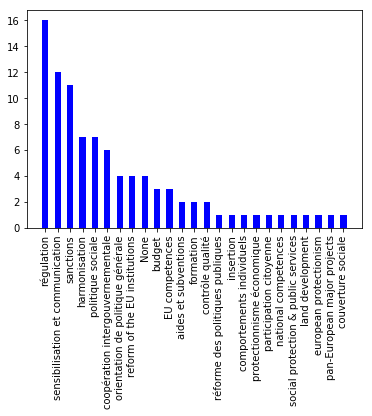



améliorer
[('régulation', 15), ('sensibilisation et communication', 15), ('formation', 11), ('orientation de politique générale', 11), ('aides et subventions', 10), ('None', 9), ('politique sociale', 9), ('réforme des politiques publiques', 7), ('insertion', 5), ('aménagement des espaces', 5), ('contrôle qualité', 4), ('RSE', 4), ('budget', 4), ('harmonisation', 3), ('comportements individuels', 3), ('participation citoyenne', 3), ('couverture sociale', 3), ('coopération intergouvernementale', 2), ('simplification', 1), ('responsabilisation', 1), ('reform of the EU institutions', 1), ('EU competences', 1), ('numérique', 1)]


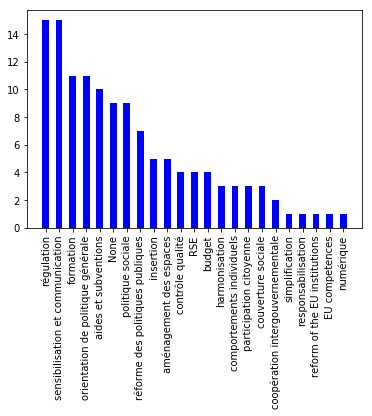



valoriser
[('budget', 47), ('sensibilisation et communication', 32), ('politique sociale', 18), ('réforme des politiques publiques', 11), ('régulation', 11), ('None', 10), ('formation', 8), ('aides et subventions', 8), ('orientation de politique générale', 5), ('comportements individuels', 4), ('taxation', 2), ('social protection & public services', 2), ('insertion', 1), ('simplification', 1), ('contrôle qualité', 1), ('protectionnisme économique', 1), ('harmonisation', 1), ('RSE', 1), ('participation citoyenne', 1), ('intergénérationnel', 1)]


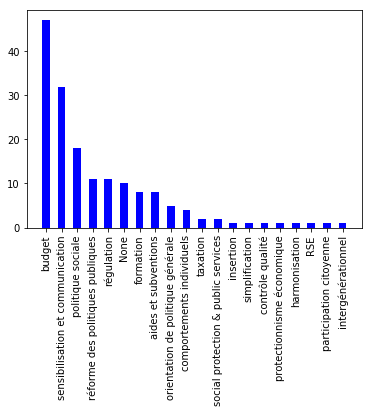



cesser
[('sensibilisation et communication', 16), ('comportements individuels', 16), ('régulation', 12), ('réforme des politiques publiques', 11), ('orientation de politique générale', 8), ('None', 7), ('national competences', 4), ('insertion', 3), ('aides et subventions', 3), ('sortie euro et Europe', 3), ('protectionnisme économique', 2), ('sanctions', 2), ('participation citoyenne', 2), ('harmonisation', 2), ('social protection & public services', 2), ('simplification', 1), ('aménagement du territoire', 1), ('reform of the EU institutions', 1), ('politique sociale', 1)]


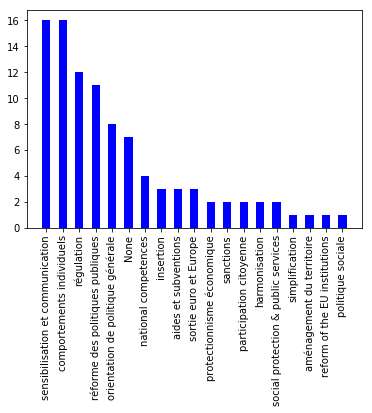



proposer
[('None', 90), ('régulation', 60), ('sensibilisation et communication', 59), ('orientation de politique générale', 53), ('comportements individuels', 28), ('participation citoyenne', 23), ('politique sociale', 21), ('aides et subventions', 17), ('réforme des politiques publiques', 16), ('harmonisation', 13), ('insertion', 10), ('RSE', 9), ('protectionnisme économique', 8), ('budget', 7), ('aménagement du territoire', 7), ('contrôle qualité', 6), ('accompagnement & coaching', 6), ('intergénérationnel', 5), ('aménagement des espaces', 4), ('redistribution & répartition', 4), ('sanctions', 4), ('reform of the EU institutions', 4), ('couverture sociale', 4), ('taxation', 2), ('recherche', 2), ('simplification', 1), ('justice', 1), ('protection environnementale', 1), ('EU competences', 1), ('national competences', 1), ('social protection & public services', 1), ('pan-European major projects', 1), ('sortie euro et Europe', 1), ('diplomatic decisions & treaties', 1), ('fiscalité & 

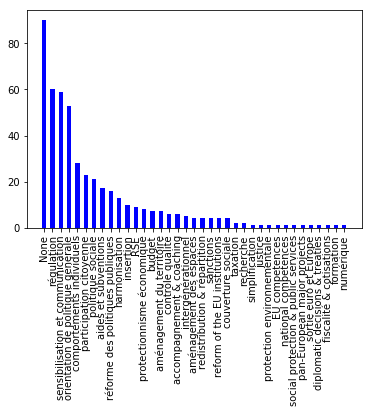



remettre
[('régulation', 32), ('national competences', 16), ('sensibilisation et communication', 12), ('orientation de politique générale', 10), ('None', 6), ('comportements individuels', 5), ('réforme des politiques publiques', 3), ('reform of the EU institutions', 3), ('sortie euro et Europe', 3), ('taxation', 3), ('politique sociale', 3), ('aides et subventions', 2), ('sanctions', 2), ('aménagement du territoire', 2), ('participation citoyenne', 2), ('european protectionism', 2), ('harmonisation', 2), ('insertion', 1), ('redistribution & répartition', 1), ('protection environnementale', 1), ('couverture sociale', 1)]


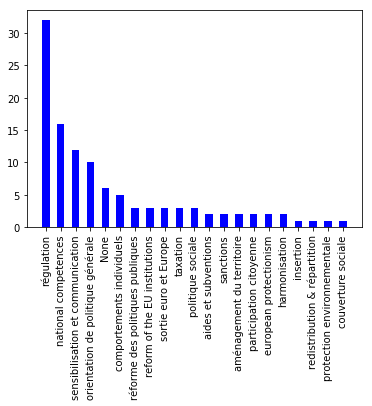



garantir
[('réforme des politiques publiques', 18), ('orientation de politique générale', 12), ('aides et subventions', 7), ('régulation', 7), ('None', 5), ('harmonisation', 4), ('aménagement des espaces', 3), ('budget', 3), ('formation', 2), ('sensibilisation et communication', 2), ('national competences', 2), ('EU competences', 2), ('insertion', 1), ('sanctions', 1), ('action européenne', 1), ('protectionnisme économique', 1), ('contrôle qualité', 1), ('fiscalité & cotisations', 1), ('politique sociale', 1)]


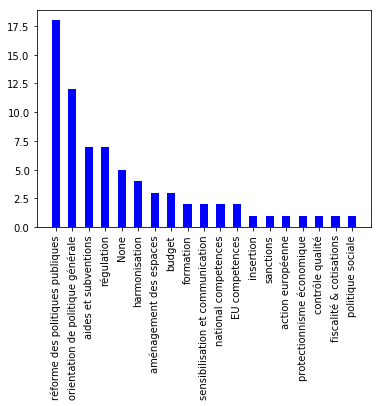



demande
[('budget', 37), ('réforme des politiques publiques', 5), ('aides et subventions', 4), ('sensibilisation et communication', 3), ('régulation', 3), ('politique sociale', 3), ('simplification', 2), ('harmonisation', 2), ('None', 2), ('orientation de politique générale', 2), ('formation', 2), ('sanctions', 1), ('insertion', 1), ('participation citoyenne', 1), ('sortie euro et Europe', 1), ("transformation de l'administration", 1)]


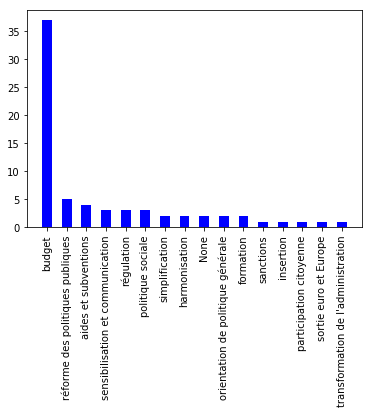



priver
[('régulation', 36), ('réforme des politiques publiques', 7), ('budget', 6), ('sanctions', 5), ('orientation de politique générale', 5), ('aménagement des espaces', 4), ('reform of the EU institutions', 4), ('politique sociale', 4), ('insertion', 3), ('sensibilisation et communication', 3), ('aides et subventions', 3), ('comportements individuels', 2), ('None', 2), ('coopération intergouvernementale', 2), ('EU competences', 2), ('national competences', 2), ('simplification', 1), ('redistribution & répartition', 1), ('contrôle qualité', 1), ('aménagement du territoire', 1), ('formation', 1)]


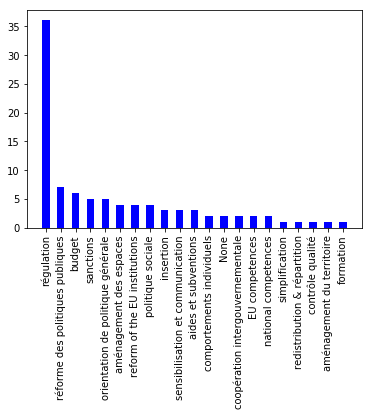



subventionner
[('aides et subventions', 17), ('réforme des politiques publiques', 6), ('régulation', 4), ('sanctions', 2), ('protectionnisme économique', 2), ('taxation', 2), ('simplification', 1), ('redistribution & répartition', 1), ('None', 1)]


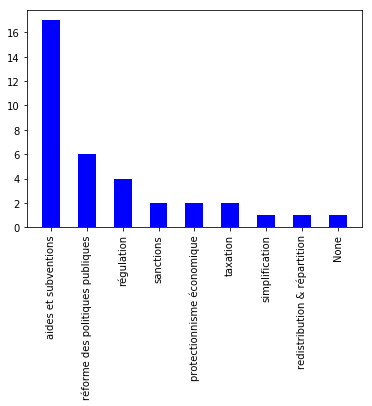



revenir
[('régulation', 32), ('comportements individuels', 23), ('None', 18), ('orientation de politique générale', 15), ('sortie euro et Europe', 15), ('sensibilisation et communication', 7), ('réforme des politiques publiques', 6), ('national competences', 6), ('harmonisation', 5), ('aides et subventions', 5), ('reform of the EU institutions', 5), ('redistribution & répartition', 3), ('RSE', 3), ('sanctions', 3), ('coopération intergouvernementale', 3), ('taxation', 2), ('aménagement du territoire', 2), ('protectionnisme économique', 2), ('simplification', 2), ('participation citoyenne', 2), ('social protection & public services', 2), ('insertion', 1), ('aménagement des espaces', 1), ('budget', 1), ('EU competences', 1), ('european protectionism', 1), ('fiscalité & cotisations', 1), ('intergénérationnel', 1), ('politique sociale', 1)]


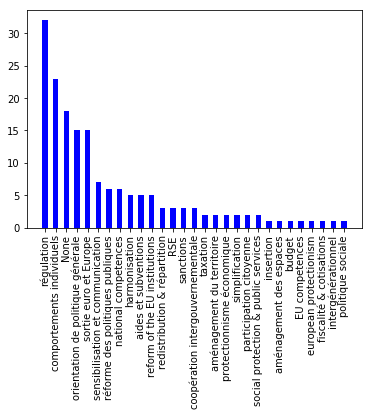



choisir
[('comportements individuels', 14), ('sensibilisation et communication', 10), ('orientation de politique générale', 8), ('None', 5), ('reform of the EU institutions', 5), ('national competences', 4), ('régulation', 4), ('politique sociale', 3), ('réforme des politiques publiques', 2), ('participation citoyenne', 2), ('budget', 2), ('insertion', 1), ('action européenne', 1), ('RSE', 1), ('pan-European major projects', 1), ('harmonisation', 1)]


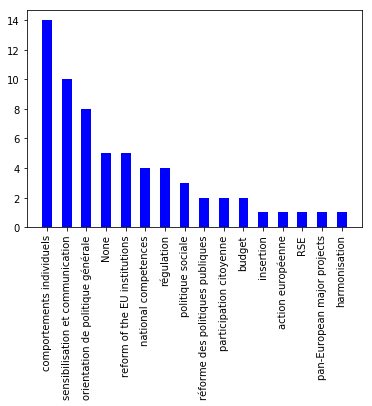



exclure
[('sanctions', 11), ('régulation', 4), ('réforme des politiques publiques', 3), ('insertion', 1), ('formation', 1), ('sensibilisation et communication', 1), ('harmonisation', 1), ('reform of the EU institutions', 1), ('sortie euro et Europe', 1)]


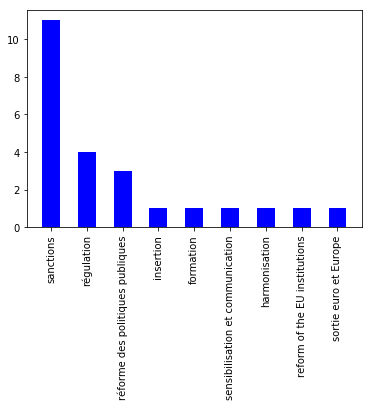



mieux former
[('formation', 18), ('insertion', 2), ('sensibilisation et communication', 2), ('budget', 1)]


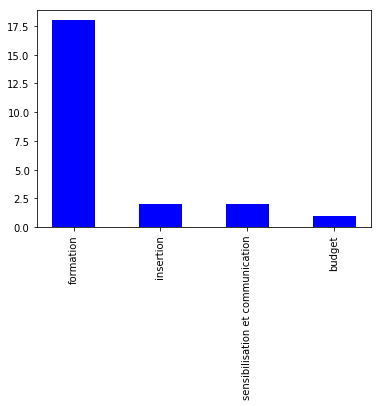



apprendre
[('sensibilisation et communication', 155), ('comportements individuels', 69), ('None', 7), ('orientation de politique générale', 5), ('régulation', 5), ('réforme des politiques publiques', 4), ('accompagnement & coaching', 3), ('responsabilisation', 3), ('harmonisation', 3), ('aménagement du territoire', 2), ('participation citoyenne', 2), ('insertion', 1), ('e-santé', 1)]


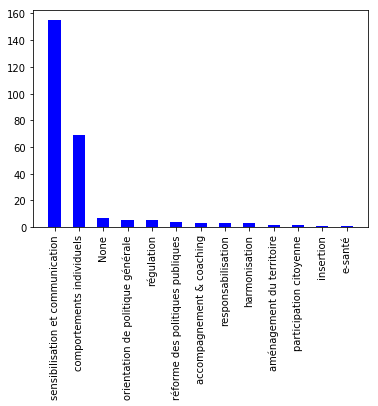



verser
[('réforme des politiques publiques', 12), ('aides et subventions', 7), ('régulation', 7), ('taxation', 2), ('reform of the EU institutions', 2), ('formation', 1), ('harmonisation', 1), ('social protection & public services', 1), ('fiscalité & cotisations', 1), ('couverture sociale', 1)]


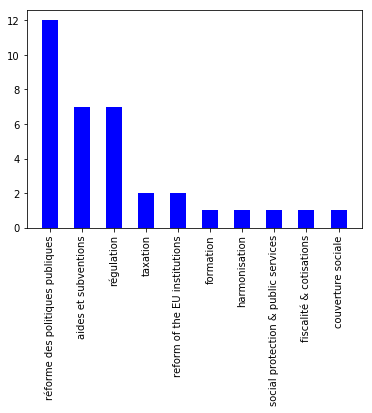



harmoniser
[('harmonisation', 152), ('reform of the EU institutions', 6), ('sensibilisation et communication', 4), ('sanctions', 3), ('régulation', 2), ('orientation de politique générale', 2), ('réforme des politiques publiques', 1), ('social protection & public services', 1), ('fiscalité & cotisations', 1), ('couverture sociale', 1)]


KeyboardInterrupt: 

In [11]:
#solutions les plus fréquentes pour les keywords vp les plus présents
for k,v in vp2solutioncount.items() : 
    sortedsolution=sorted(vp2solutioncount[k].items(), key=lambda x: x[1], reverse=True)
    if(len(sortedsolution)>1):
        if (sortedsolution[0][1]>10) :
            print(k)
            print(sortedsolution)
            graphe = plt.figure()
            x = range(1,len(sortedsolution)+1)
            height = [j for i,j in sortedsolution]
            width = 0.5
            BarName =[i for i,j in sortedsolution]
            pylab.xticks(x, BarName, rotation=90)
            plt.bar(x, height, width, color='b')
            plt.show()
            print('\n')

appliquer
[('sanctions', 18), ('harmonisation', 13), ('taxation', 12), ('régulation', 11), ('None', 5), ('sensibilisation et communication', 5), ('orientation de politique générale', 4), ('aménagement des espaces', 3), ('réforme des politiques publiques', 2), ('budget', 2), ('national competences', 2), ('insertion', 1), ('participation citoyenne', 1), ('sortie euro et Europe', 1), ('coopération intergouvernementale', 1), ('diplomatic decisions & treaties', 1), ('reform of the EU institutions', 1), ('simplification', 1), ('land development', 1)]


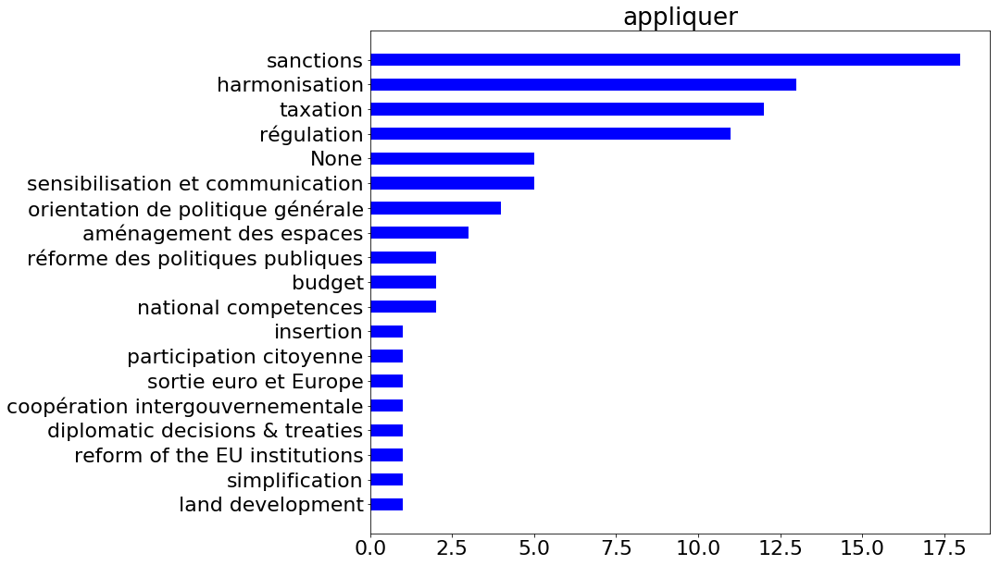



concerner
[('sensibilisation et communication', 14), ('régulation', 11), ('None', 7), ('formation', 5), ('orientation de politique générale', 5), ('réforme des politiques publiques', 5), ('participation citoyenne', 4), ('national competences', 3), ('aides et subventions', 2), ('reform of the EU institutions', 2), ('sanctions', 1), ('harmonisation', 1), ('aménagement des espaces', 1), ('budget', 1), ('comportements individuels', 1), ('simplification', 1), ('e-santé', 1), ('sortie euro et Europe', 1), ('pan-European major projects', 1)]


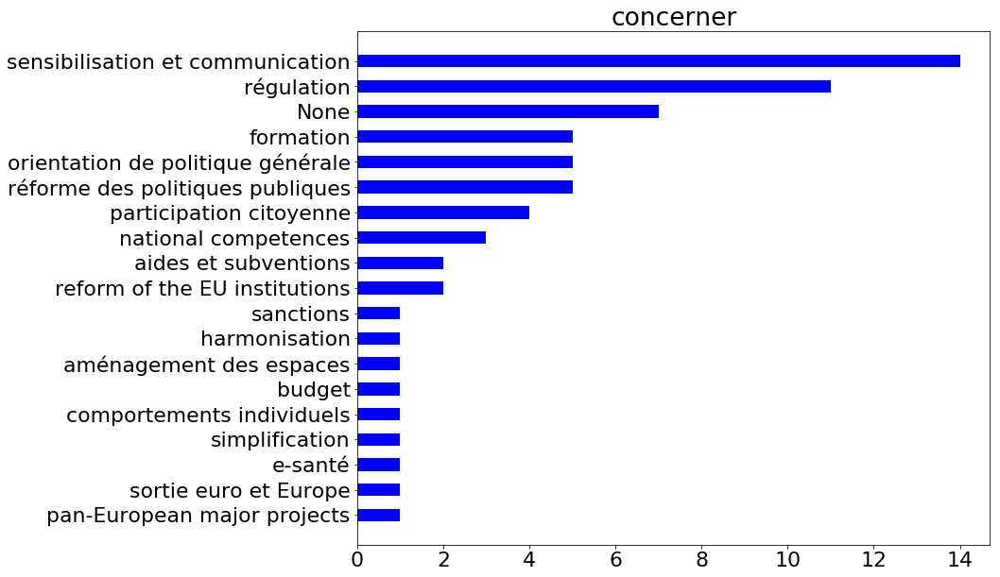



créer
[('reform of the EU institutions', 81), ('sensibilisation et communication', 55), ('réforme des politiques publiques', 54), ('EU competences', 52), ('politique sociale', 52), ('régulation', 41), ('harmonisation', 36), ('orientation de politique générale', 35), ('budget', 34), ('participation citoyenne', 29), ('aides et subventions', 28), ('None', 28), ('coopération intergouvernementale', 24), ('aménagement des espaces', 22), ('pan-European major projects', 21), ('aménagement du territoire', 19), ('taxation', 15), ('sanctions', 14), ('formation', 13), ('intergénérationnel', 11), ('comportements individuels', 10), ('social protection & public services', 8), ('insertion', 7), ('national competences', 7), ('simplification', 6), ('couverture sociale', 6), ('RSE', 5), ('sortie euro et Europe', 5), ('land development', 4), ('redistribution & répartition', 3), ('diplomatic decisions & treaties', 3), ('e-santé', 2), ("transformation de l'administration", 2), ('fiscalité & cotisations', 

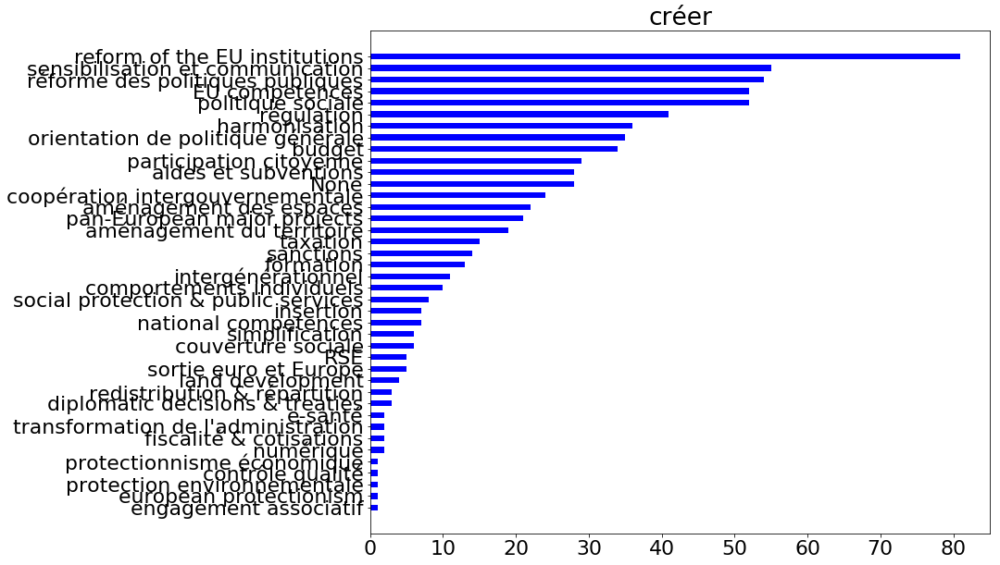



éviter
[('comportements individuels', 81), ('régulation', 44), ('harmonisation', 32), ('sensibilisation et communication', 22), ('orientation de politique générale', 18), ('None', 11), ('sanctions', 9), ('aides et subventions', 9), ('budget', 8), ('simplification', 5), ('politique sociale', 5), ('réforme des politiques publiques', 4), ('protection environnementale', 4), ('reform of the EU institutions', 4), ('taxation', 4), ('formation', 3), ('aménagement des espaces', 3), ('protectionnisme économique', 3), ('diplomatic decisions & treaties', 3), ('national competences', 3), ('coopération intergouvernementale', 2), ("transformation de l'administration", 2), ('contrôle qualité', 1), ('redistribution & répartition', 1), ('action européenne', 1), ('participation citoyenne', 1), ('social protection & public services', 1), ('european protectionism', 1), ('intergénérationnel', 1), ('engagement associatif', 1), ('couverture sociale', 1)]


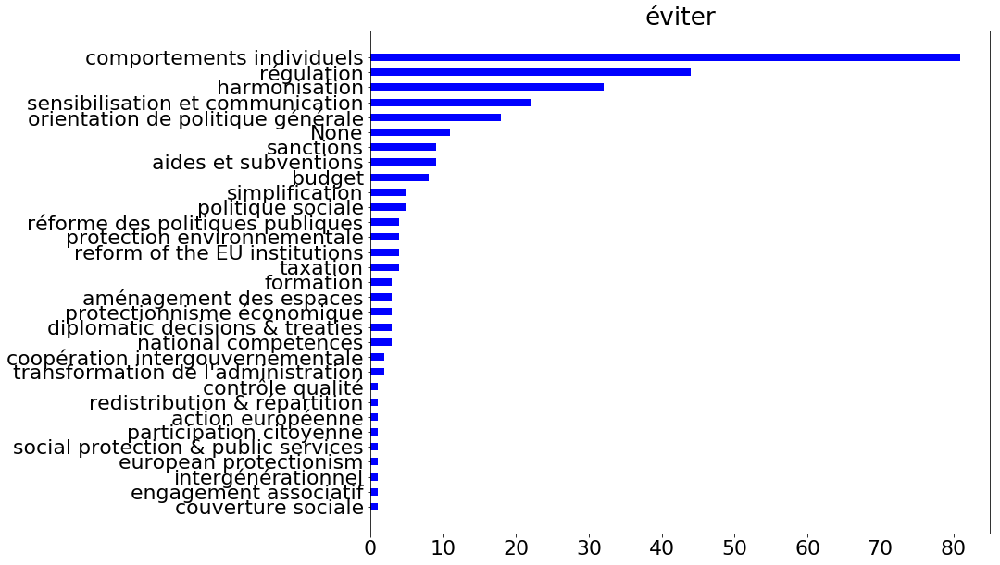



aider
[('aides et subventions', 100), ('None', 28), ('réforme des politiques publiques', 27), ('politique sociale', 20), ('orientation de politique générale', 16), ('sensibilisation et communication', 15), ('comportements individuels', 15), ('régulation', 13), ('insertion', 12), ('formation', 11), ('budget', 11), ('coopération intergouvernementale', 8), ('accompagnement & coaching', 7), ('aménagement des espaces', 6), ('participation citoyenne', 5), ('RSE', 5), ("transformation de l'administration", 5), ('protectionnisme économique', 4), ('harmonisation', 3), ('taxation', 3), ('social protection & public services', 3), ('couverture sociale', 3), ('intergénérationnel', 3), ('simplification', 2), ('sanctions', 2), ('sortie euro et Europe', 1), ('action européenne', 1), ('contrôle qualité', 1), ('redistribution & répartition', 1), ('european protectionism', 1), ('land development', 1), ('pan-European major projects', 1), ('numérique', 1), ('fiscalité & cotisations', 1)]


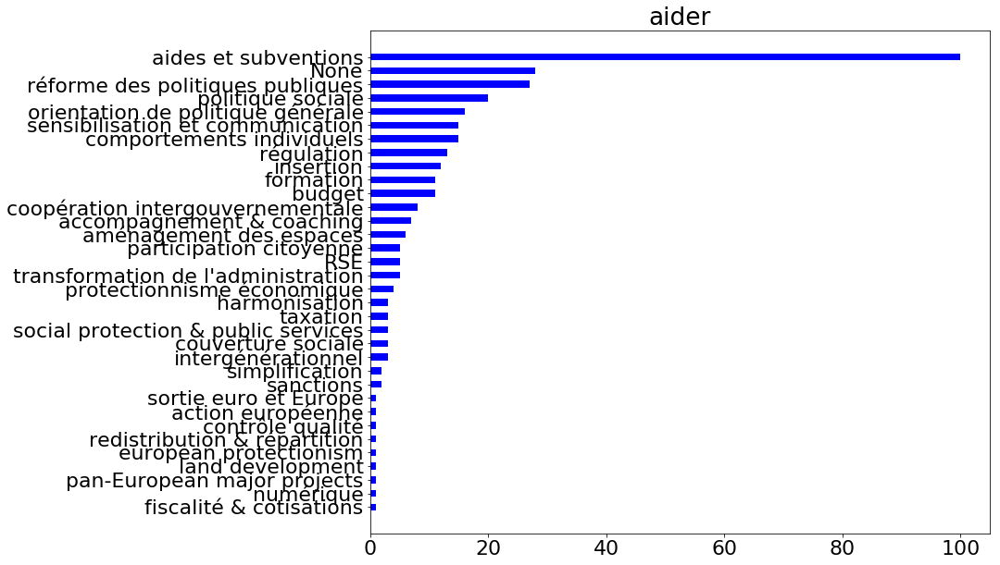



vivre
[('aides et subventions', 21), ('comportements individuels', 19), ('sensibilisation et communication', 16), ('régulation', 14), ('réforme des politiques publiques', 13), ('budget', 13), ('None', 11), ('politique sociale', 11), ('orientation de politique générale', 8), ('pan-European major projects', 3), ('insertion', 2), ('participation citoyenne', 2), ('RSE', 2), ('sortie euro et Europe', 2), ('recherche', 2), ('formation', 1), ('action européenne', 1), ('protectionnisme économique', 1), ('protection environnementale', 1), ('sanctions', 1), ('taxation', 1), ('reform of the EU institutions', 1), ('fiscalité & cotisations', 1), ('intergénérationnel', 1), ('couverture sociale', 1)]


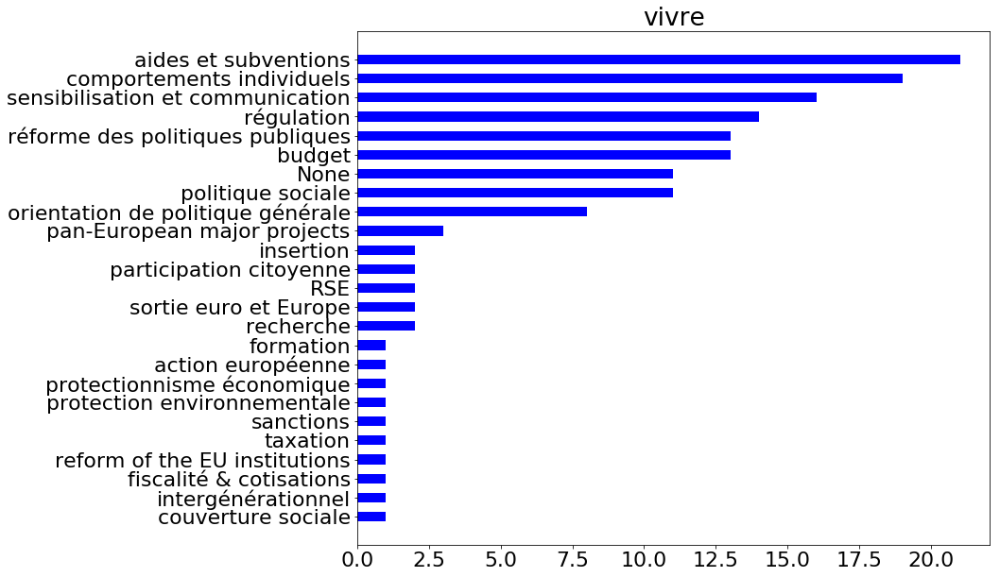



inclure
[('insertion', 15), ('réforme des politiques publiques', 10), ('sensibilisation et communication', 9), ('aides et subventions', 4), ('formation', 3), ('orientation de politique générale', 3), ('participation citoyenne', 3), ('harmonisation', 2), ('None', 2), ('taxation', 2), ('régulation', 2), ('pan-European major projects', 2), ('contrôle qualité', 1), ('reform of the EU institutions', 1), ('comportements individuels', 1), ('fiscalité & cotisations', 1), ('intergénérationnel', 1), ('politique sociale', 1)]


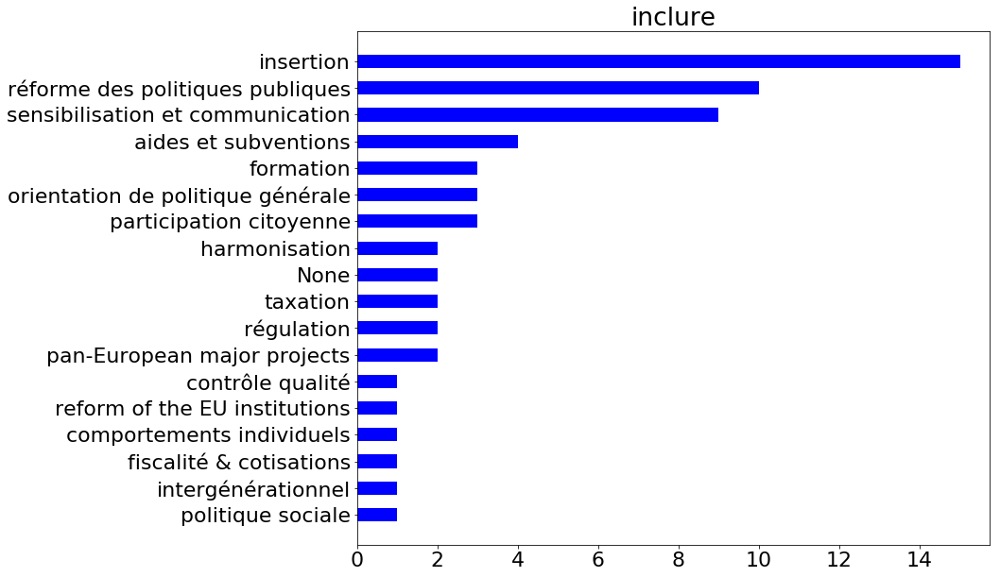



prendre
[('sensibilisation et communication', 62), ('comportements individuels', 51), ('réforme des politiques publiques', 45), ('aides et subventions', 43), ('régulation', 37), ('orientation de politique générale', 24), ('politique sociale', 23), ('budget', 20), ('reform of the EU institutions', 20), ('None', 19), ('participation citoyenne', 15), ('couverture sociale', 9), ('sanctions', 8), ('national competences', 6), ('harmonisation', 6), ('formation', 5), ('simplification', 4), ('insertion', 3), ('redistribution & répartition', 3), ('taxation', 3), ('pan-European major projects', 2), ('EU competences', 2), ('coopération intergouvernementale', 2), ('social protection & public services', 2), ("transformation de l'administration", 2), ('aménagement des espaces', 1), ('protectionnisme économique', 1), ('accompagnement & coaching', 1), ('sortie euro et Europe', 1), ('RSE', 1), ('fiscalité & cotisations', 1), ('numérique', 1), ('recherche', 1)]


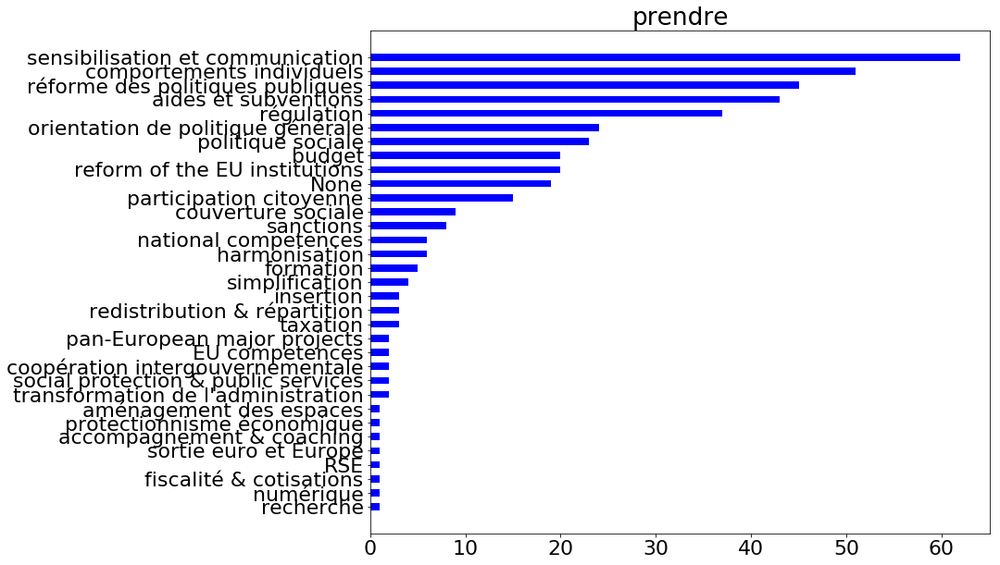



utiliser
[('régulation', 33), ('comportements individuels', 24), ('sanctions', 15), ('sensibilisation et communication', 12), ('réforme des politiques publiques', 6), ('budget', 5), ('None', 5), ('taxation', 5), ('aides et subventions', 4), ('aménagement du territoire', 3), ('orientation de politique générale', 2), ('RSE', 2), ('land development', 2), ('european protectionism', 2), ('formation', 1), ('insertion', 1), ('protectionnisme économique', 1), ('contrôle qualité', 1), ('participation citoyenne', 1), ('harmonisation', 1), ('national competences', 1), ('reform of the EU institutions', 1), ('social protection & public services', 1), ('recherche', 1)]


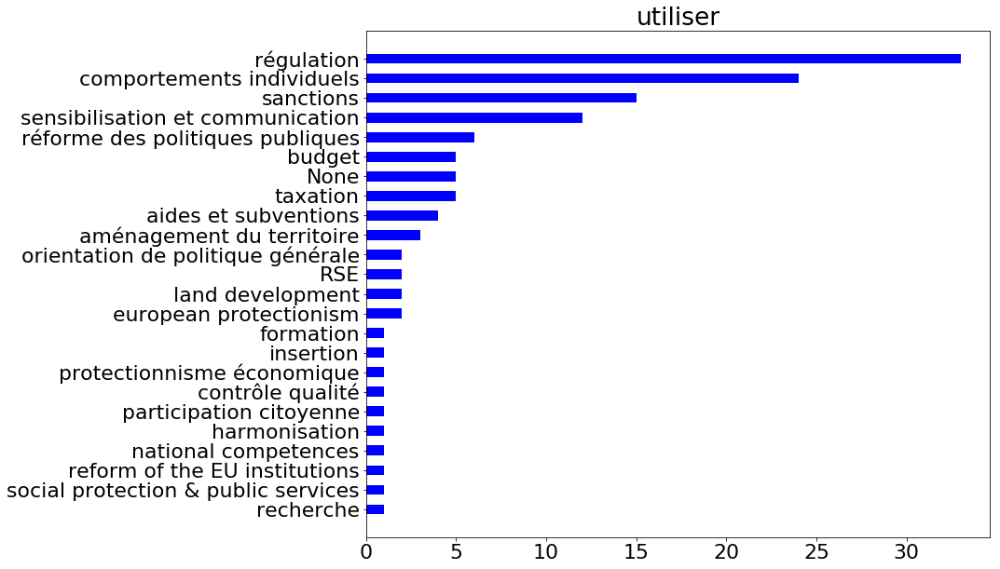



former
[('formation', 110), ('sensibilisation et communication', 45), ('réforme des politiques publiques', 10), ('insertion', 8), ('budget', 6), ('aides et subventions', 5), ('régulation', 5), ('politique sociale', 5), ('aménagement des espaces', 4), ('orientation de politique générale', 4), ('participation citoyenne', 4), ('harmonisation', 2), ('accompagnement & coaching', 2), ('reform of the EU institutions', 2), ('simplification', 1), ('None', 1), ('EU competences', 1), ('RSE', 1), ('comportements individuels', 1), ('couverture sociale', 1)]


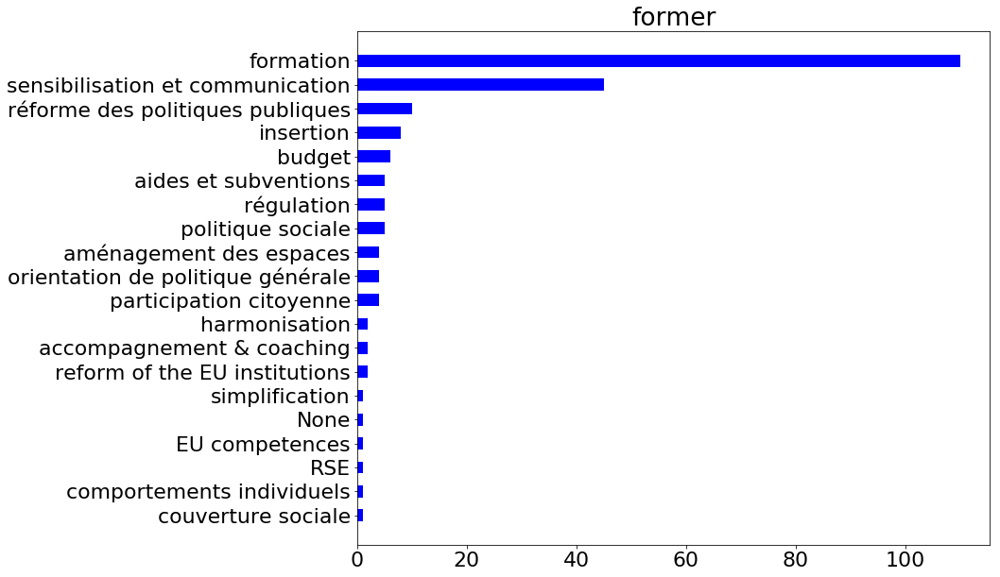



sensibiliser
[('sensibilisation et communication', 142), ('insertion', 6), ('formation', 5), ('orientation de politique générale', 3), ('aménagement des espaces', 1), ('sanctions', 1), ('aides et subventions', 1), ('accompagnement & coaching', 1), ('régulation', 1), ('politique sociale', 1), ('numérique', 1)]


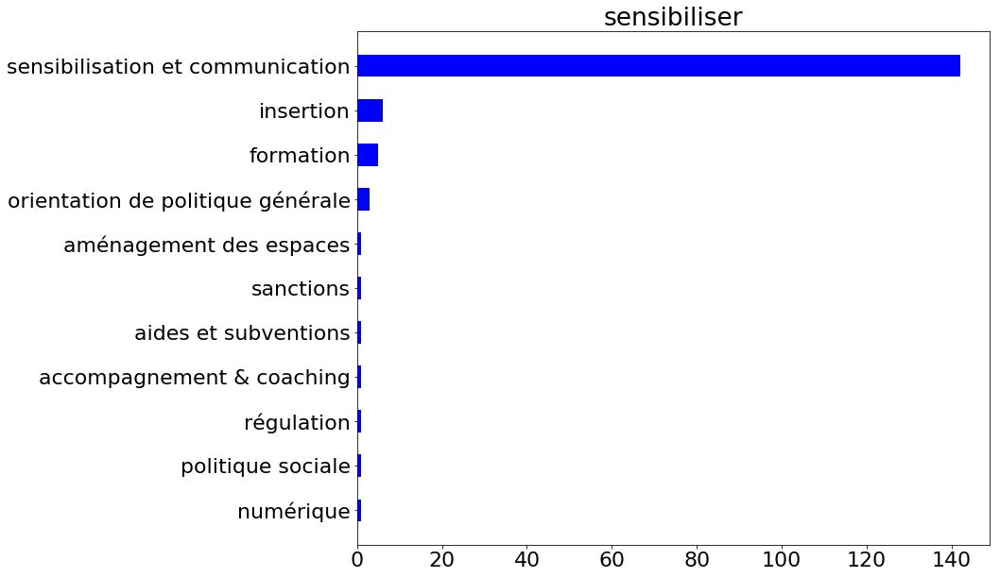



informer
[('sensibilisation et communication', 82), ('formation', 5), ('insertion', 3), ('comportements individuels', 3), ('simplification', 2), ('régulation', 2), ('sanctions', 1), ('accompagnement & coaching', 1)]


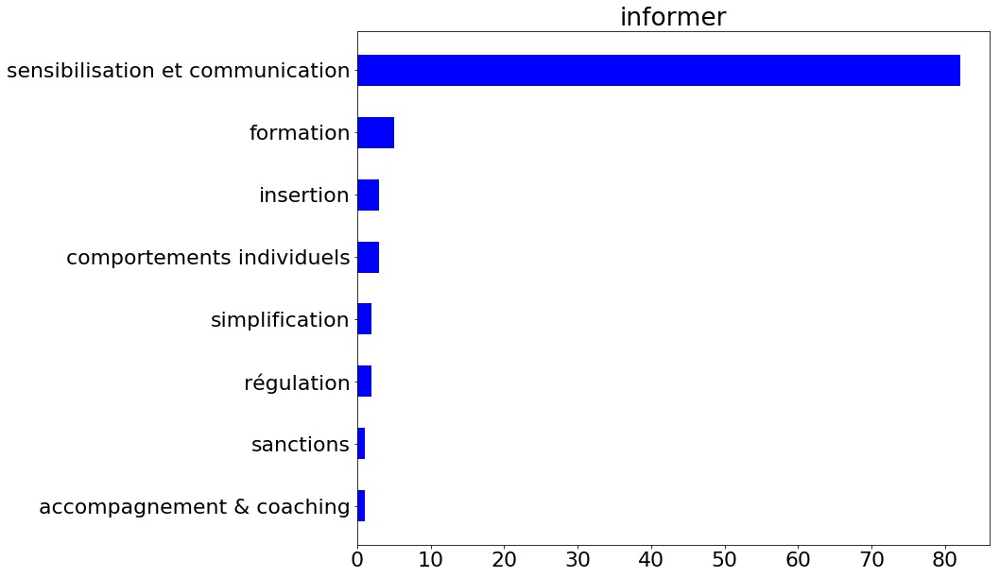



interdire
[('régulation', 327), ('sanctions', 131), ('reform of the EU institutions', 15), ('protectionnisme économique', 9), ('réforme des politiques publiques', 6), ('taxation', 6), ('orientation de politique générale', 6), ('contrôle qualité', 5), ('european protectionism', 5), ('protection environnementale', 4), ('None', 3), ('sensibilisation et communication', 2), ('aides et subventions', 2), ('sortie euro et Europe', 2), ('diplomatic decisions & treaties', 2), ('land development', 2), ('harmonisation', 2), ('budget', 2), ('national competences', 2), ('social protection & public services', 2), ('action européenne', 1), ('comportements individuels', 1), ('participation citoyenne', 1), ('fiscalité & cotisations', 1)]


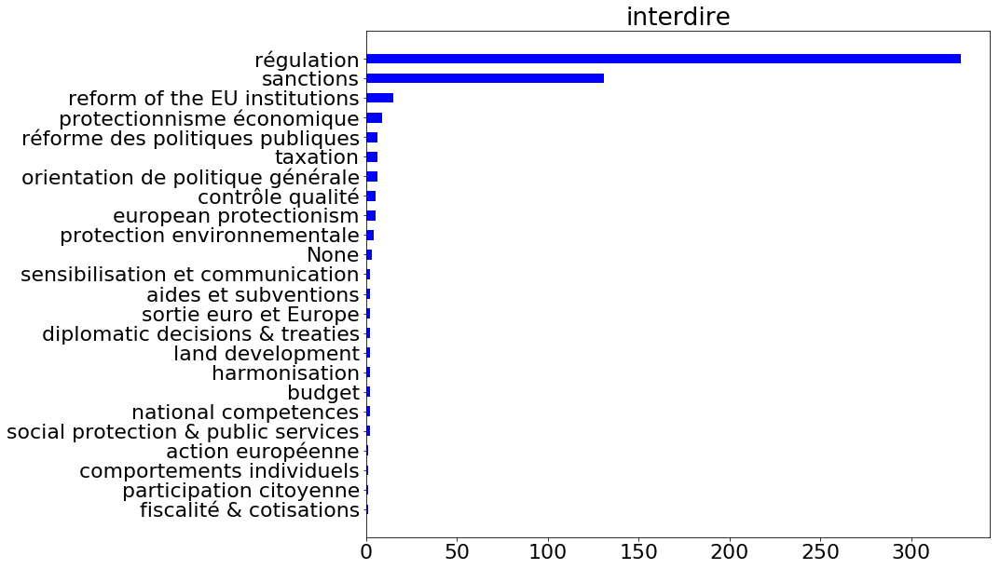



servir
[('régulation', 12), ('None', 4), ('comportements individuels', 4), ('sanctions', 2), ('réforme des politiques publiques', 2), ('sensibilisation et communication', 2), ('reform of the EU institutions', 2), ('taxation', 2), ('RSE', 1), ('protection environnementale', 1), ('orientation de politique générale', 1), ('sortie euro et Europe', 1), ('harmonisation', 1), ('EU competences', 1), ('pan-European major projects', 1), ('national competences', 1)]


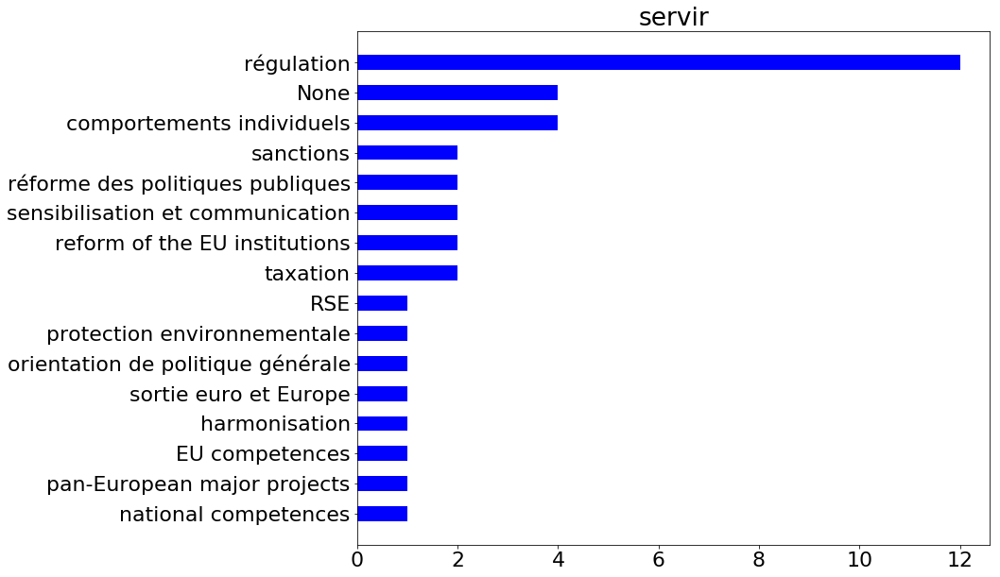



rembourser
[('aides et subventions', 17), ('réforme des politiques publiques', 8), ('budget', 4), ('régulation', 1), ('taxation', 1), ('pan-European major projects', 1), ('orientation de politique générale', 1), ('sanctions', 1), ('couverture sociale', 1)]


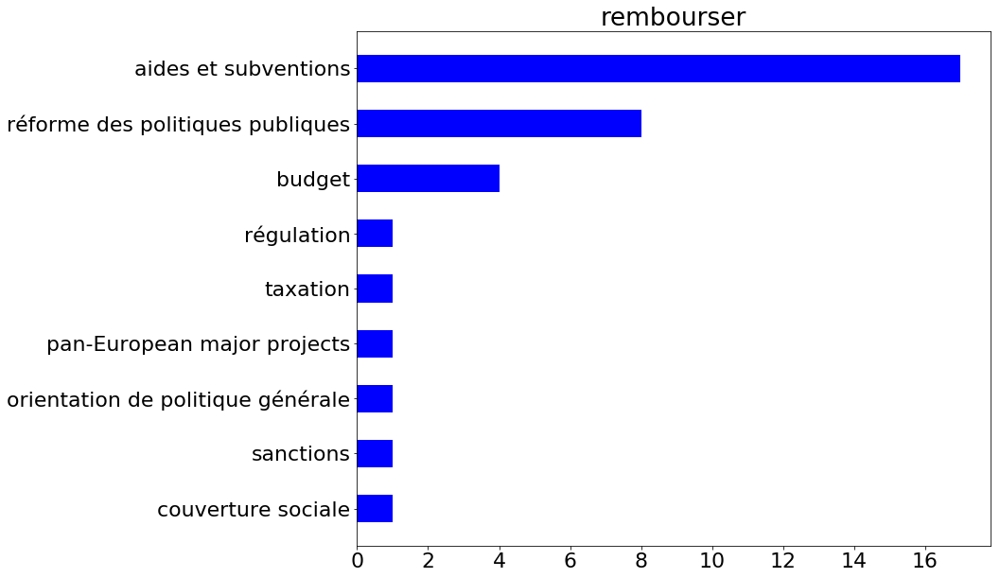



trouver
[('orientation de politique générale', 12), ('réforme des politiques publiques', 9), ('sensibilisation et communication', 8), ('comportements individuels', 8), ('None', 7), ('insertion', 5), ('aides et subventions', 5), ('régulation', 5), ('budget', 4), ('formation', 2), ('aménagement des espaces', 2), ('protectionnisme économique', 2), ('pan-European major projects', 2), ('politique sociale', 2), ('redistribution & répartition', 1), ('EU competences', 1), ('coopération intergouvernementale', 1), ('RSE', 1)]


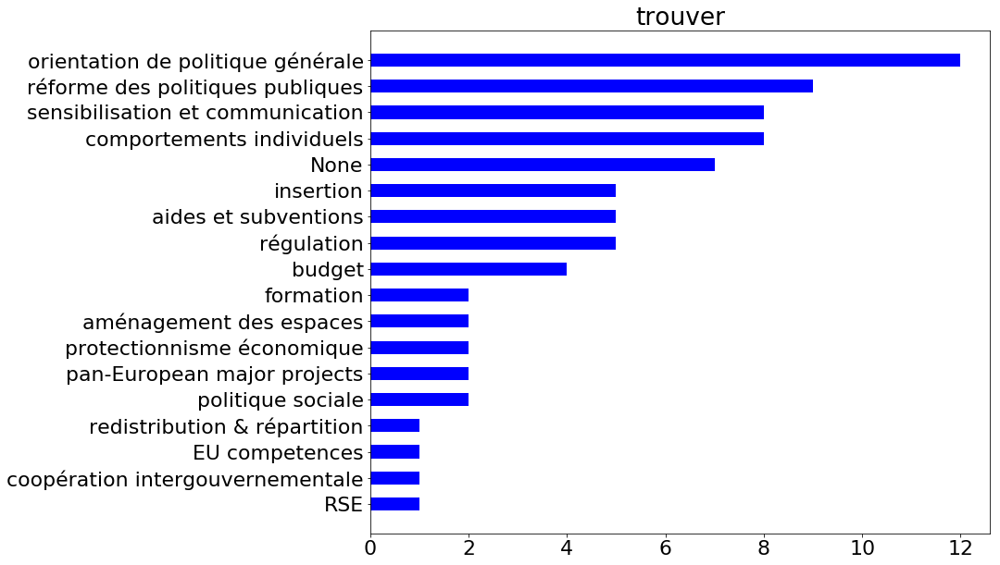



adapter
[('aménagement des espaces', 55), ('politique sociale', 33), ('insertion', 28), ('réforme des politiques publiques', 25), ('aides et subventions', 22), ('formation', 20), ('None', 15), ('orientation de politique générale', 13), ('sensibilisation et communication', 13), ('budget', 11), ('simplification', 6), ('comportements individuels', 6), ('régulation', 6), ('intergénérationnel', 5), ('harmonisation', 4), ('participation citoyenne', 3), ('taxation', 2), ('couverture sociale', 2), ('fiscalité & cotisations', 2), ('aménagement du territoire', 1), ('coopération intergouvernementale', 1), ('social protection & public services', 1), ('national competences', 1), ('RSE', 1), ("transformation de l'administration", 1), ('recherche', 1), ('engagement associatif', 1)]


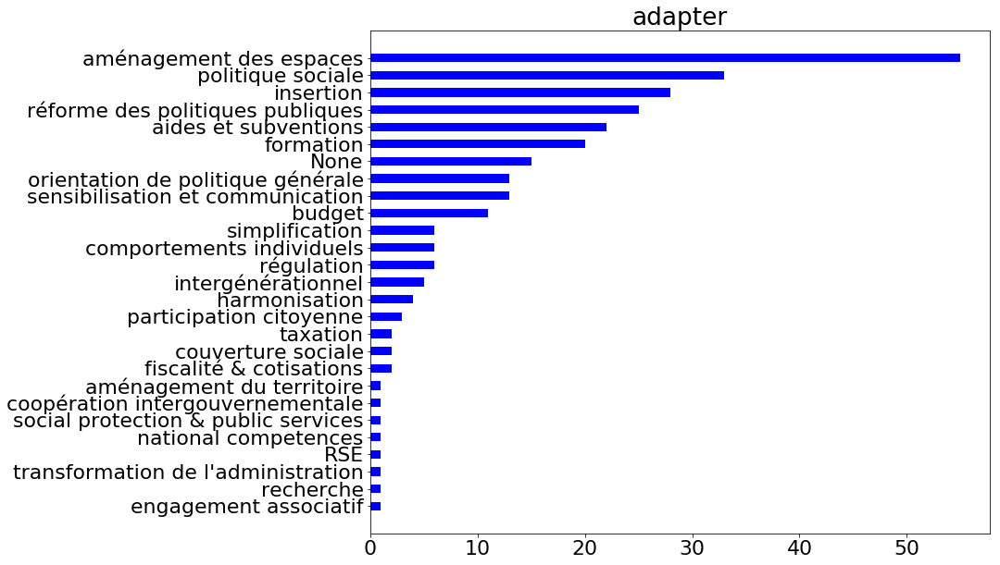



savoir
[('sensibilisation et communication', 28), ('comportements individuels', 17), ('régulation', 10), ('réforme des politiques publiques', 4), ('None', 3), ('formation', 3), ('orientation de politique générale', 2), ('insertion', 2), ('aménagement des espaces', 2), ('aides et subventions', 2), ('protectionnisme économique', 2), ('sortie euro et Europe', 2), ('sanctions', 2), ('politique sociale', 2), ('accompagnement & coaching', 1), ('european protectionism', 1), ('harmonisation', 1), ('social protection & public services', 1), ('participation citoyenne', 1), ('couverture sociale', 1)]


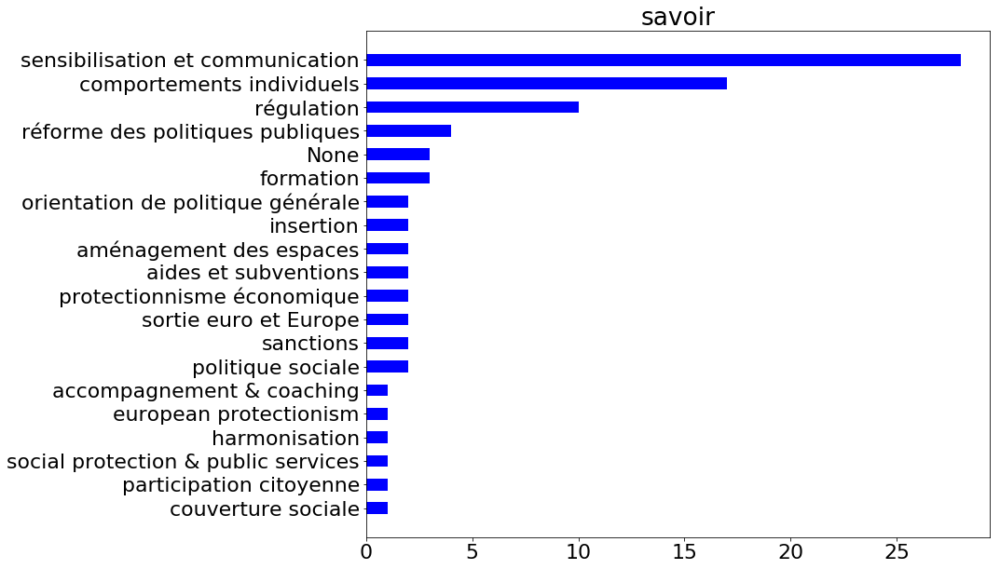



lutter
[('sanctions', 24), ('régulation', 24), ('sensibilisation et communication', 12), ('orientation de politique générale', 7), ('pan-European major projects', 6), ('politique sociale', 6), ('taxation', 5), ('harmonisation', 5), ('participation citoyenne', 3), ('coopération intergouvernementale', 3), ('intergénérationnel', 3), ('None', 2), ('comportements individuels', 2), ('redistribution & répartition', 2), ('aides et subventions', 2), ('budget', 2), ('réforme des politiques publiques', 1), ('accompagnement & coaching', 1), ('sortie euro et Europe', 1), ('reform of the EU institutions', 1), ('RSE', 1), ('EU competences', 1), ('national competences', 1), ('land development', 1), ('numérique', 1), ('fiscalité & cotisations', 1)]


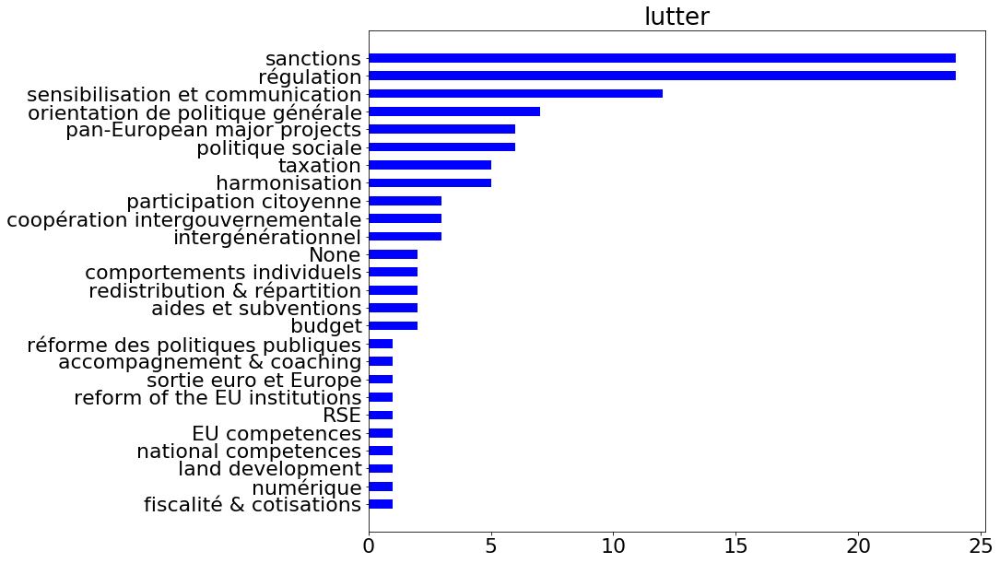



élever
[('comportements individuels', 12), ('régulation', 9), ('sensibilisation et communication', 4), ('orientation de politique générale', 4), ('harmonisation', 4), ('sanctions', 2), ('réforme des politiques publiques', 1), ('protectionnisme économique', 1), ('sortie euro et Europe', 1), ('None', 1), ('contrôle qualité', 1), ('taxation', 1), ('fiscalité & cotisations', 1), ('budget', 1)]


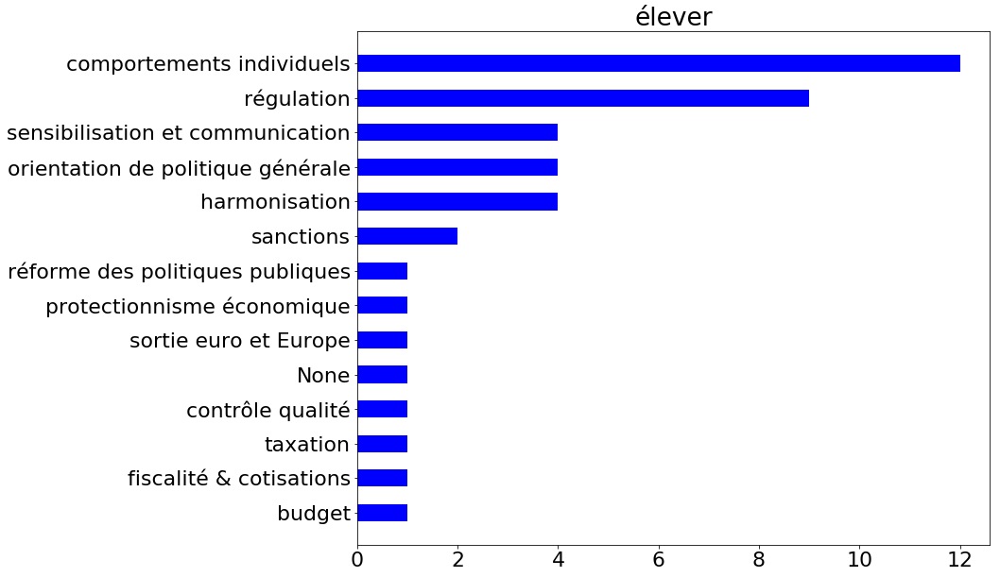



reconnaître
[('réforme des politiques publiques', 47), ('sensibilisation et communication', 27), ('None', 7), ('politique sociale', 7), ('comportements individuels', 5), ('harmonisation', 5), ('participation citoyenne', 5), ('aides et subventions', 4), ('orientation de politique générale', 3), ('insertion', 2), ('aménagement des espaces', 2), ('simplification', 2), ('régulation', 2), ('sanctions', 2), ('formation', 2), ('reform of the EU institutions', 1), ('national competences', 1), ('coopération intergouvernementale', 1), ('budget', 1), ('intergénérationnel', 1), ('couverture sociale', 1)]


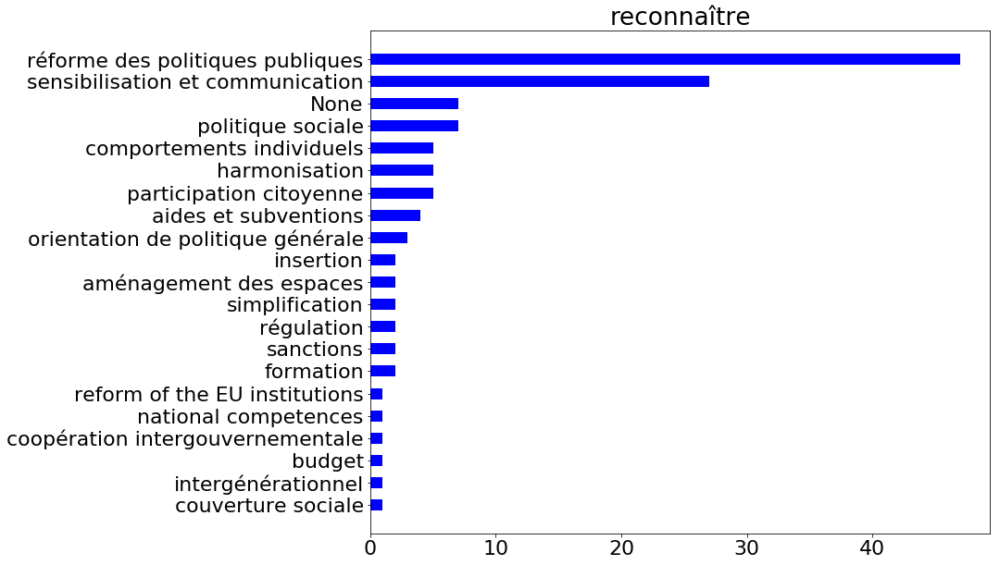



faciliter
[('simplification', 33), ('politique sociale', 19), ('insertion', 15), ('aménagement des espaces', 12), ('aides et subventions', 11), ('orientation de politique générale', 10), ('None', 9), ('réforme des politiques publiques', 7), ('sensibilisation et communication', 7), ('régulation', 6), ('formation', 4), ('harmonisation', 4), ('budget', 4), ('comportements individuels', 4), ('coopération intergouvernementale', 4), ('sanctions', 3), ('couverture sociale', 2), ('intergénérationnel', 2), ("transformation de l'administration", 2), ('protectionnisme économique', 1), ('aménagement du territoire', 1), ('redistribution & répartition', 1), ('accompagnement & coaching', 1), ('participation citoyenne', 1), ('taxation', 1), ('pan-European major projects', 1), ('fiscalité & cotisations', 1), ('engagement associatif', 1)]


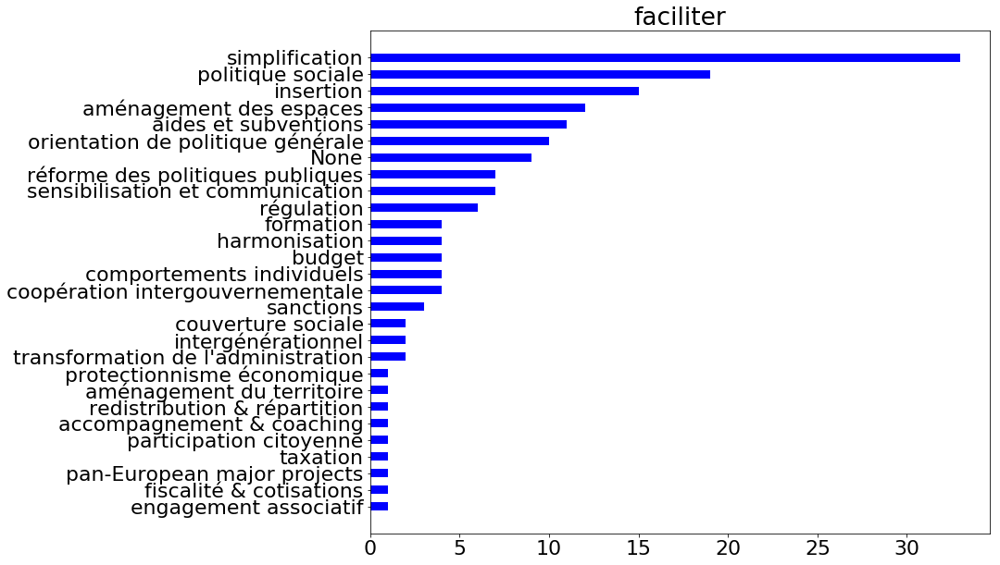



enseigner
[('sensibilisation et communication', 40), ('réforme des politiques publiques', 2), ('sanctions', 2), ('comportements individuels', 2), ('formation', 1), ('aménagement des espaces', 1), ('régulation', 1), ('reform of the EU institutions', 1), ('orientation de politique générale', 1), ('harmonisation', 1)]


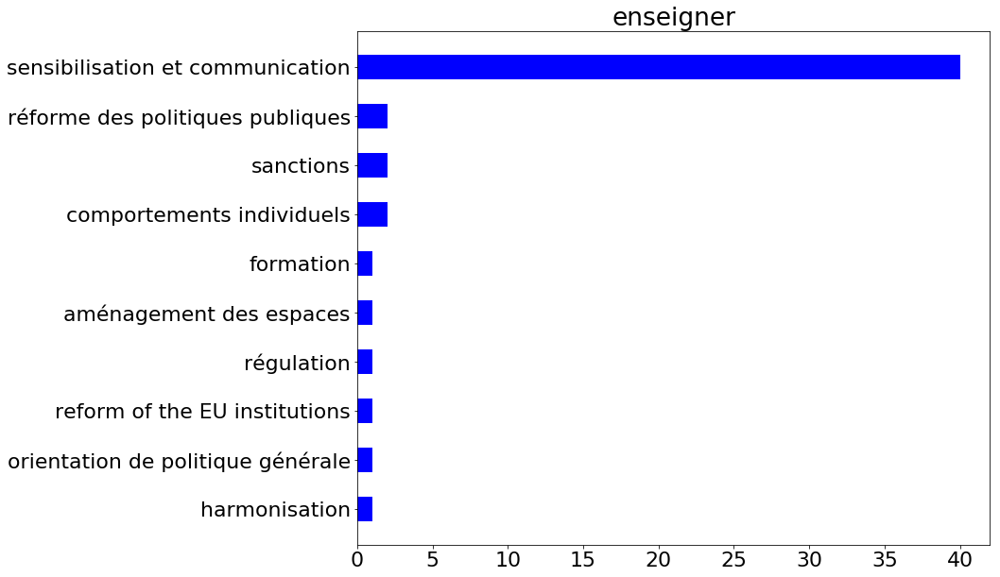



augmenter
[('budget', 56), ('réforme des politiques publiques', 29), ('taxation', 26), ('aides et subventions', 22), ('régulation', 19), ('None', 17), ('politique sociale', 13), ('orientation de politique générale', 10), ('social protection & public services', 10), ('sanctions', 8), ('formation', 8), ('comportements individuels', 7), ('harmonisation', 6), ('sensibilisation et communication', 5), ('redistribution & répartition', 4), ('insertion', 3), ('aménagement des espaces', 3), ('RSE', 3), ('national competences', 3), ('protectionnisme économique', 2), ('coopération intergouvernementale', 2), ('reform of the EU institutions', 2), ('participation citoyenne', 1), ('EU competences', 1), ('diplomatic decisions & treaties', 1), ('intergénérationnel', 1)]


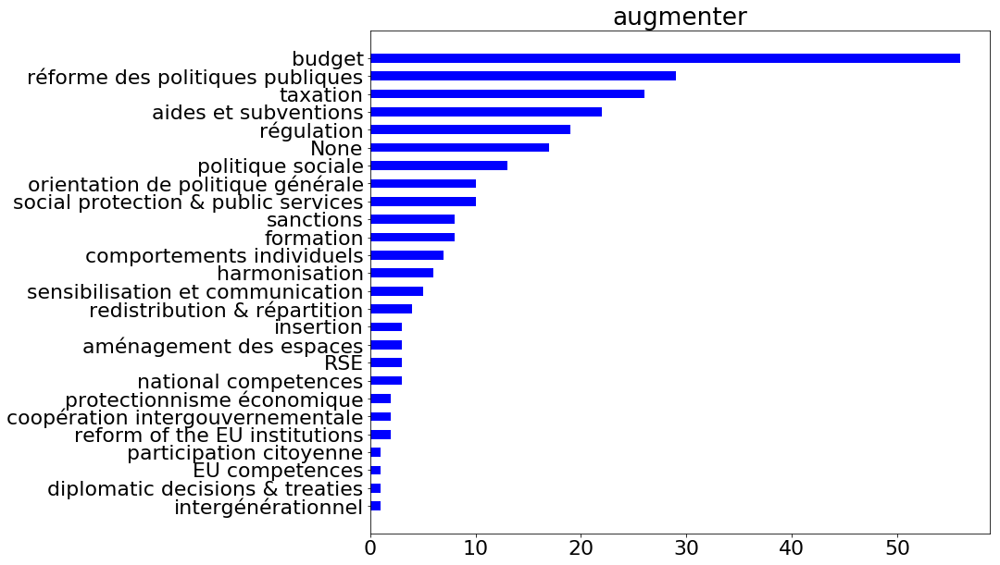



permettre
[('None', 53), ('régulation', 50), ('aides et subventions', 48), ('politique sociale', 45), ('sensibilisation et communication', 43), ('réforme des politiques publiques', 38), ('orientation de politique générale', 30), ('insertion', 29), ('comportements individuels', 25), ('budget', 21), ('aménagement des espaces', 16), ('participation citoyenne', 14), ('formation', 10), ('simplification', 9), ('harmonisation', 9), ('taxation', 7), ('reform of the EU institutions', 7), ('social protection & public services', 7), ('aménagement du territoire', 6), ('couverture sociale', 6), ('redistribution & répartition', 4), ('coopération intergouvernementale', 4), ('national competences', 4), ('sortie euro et Europe', 3), ('pan-European major projects', 3), ('fiscalité & cotisations', 3), ('sanctions', 2), ('recherche', 2), ('protection environnementale', 1), ('EU competences', 1), ('diplomatic decisions & treaties', 1), ('land development', 1), ('intergénérationnel', 1), ('RSE', 1), ('eng

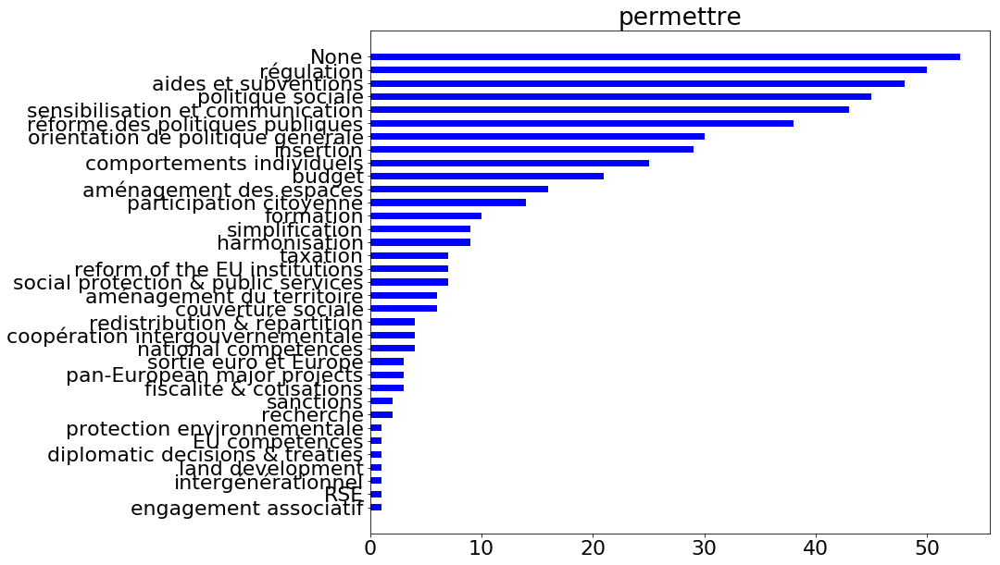



soutenir
[('aides et subventions', 21), ('politique sociale', 13), ('None', 9), ('orientation de politique générale', 7), ('insertion', 5), ('comportements individuels', 5), ('budget', 3), ('protectionnisme économique', 3), ('régulation', 2), ('formation', 2), ('participation citoyenne', 2), ('simplification', 1), ('sensibilisation et communication', 1), ('aménagement du territoire', 1), ('RSE', 1), ('pan-European major projects', 1), ('reform of the EU institutions', 1), ('taxation', 1), ('diplomatic decisions & treaties', 1), ('intergénérationnel', 1)]


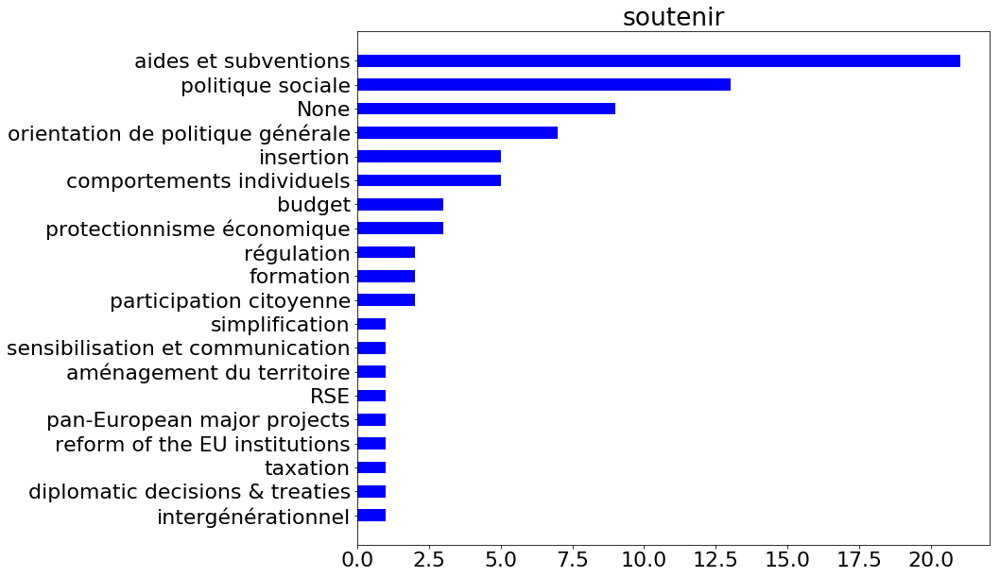



donner
[('sensibilisation et communication', 70), ('aides et subventions', 53), ('budget', 29), ('régulation', 28), ('participation citoyenne', 24), ('orientation de politique générale', 22), ('réforme des politiques publiques', 22), ('None', 20), ('reform of the EU institutions', 19), ('politique sociale', 17), ('comportements individuels', 15), ('harmonisation', 10), ('insertion', 5), ('formation', 5), ('sanctions', 5), ('RSE', 4), ('redistribution & répartition', 4), ('taxation', 4), ('social protection & public services', 4), ('couverture sociale', 4), ('aménagement du territoire', 3), ('protectionnisme économique', 3), ('EU competences', 3), ('aménagement des espaces', 2), ('simplification', 2), ('pan-European major projects', 2), ('accompagnement & coaching', 1), ('responsabilisation', 1), ('national competences', 1), ('coopération intergouvernementale', 1), ('european protectionism', 1)]


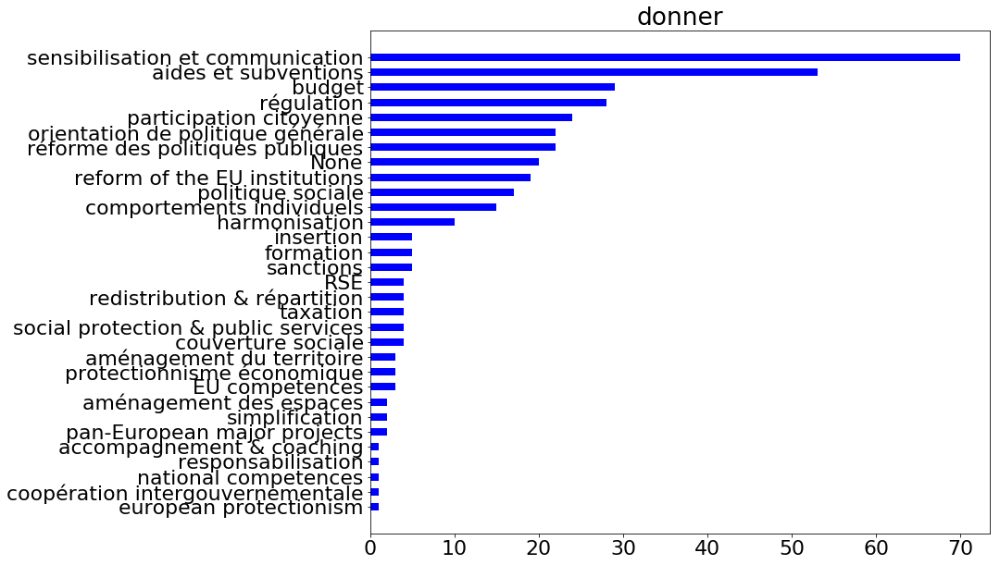



travailler
[('orientation de politique générale', 16), ('réforme des politiques publiques', 15), ('comportements individuels', 11), ('sensibilisation et communication', 10), ('aides et subventions', 9), ('régulation', 9), ('insertion', 6), ('None', 5), ('protectionnisme économique', 5), ('formation', 3), ('budget', 3), ('simplification', 2), ('protection environnementale', 2), ('pan-European major projects', 2), ('sanctions', 2), ('politique sociale', 2), ('aménagement des espaces', 1), ('aménagement du territoire', 1), ('reform of the EU institutions', 1), ('participation citoyenne', 1), ('taxation', 1), ('social protection & public services', 1), ('sortie euro et Europe', 1), ('european protectionism', 1), ('fiscalité & cotisations', 1), ("transformation de l'administration", 1)]


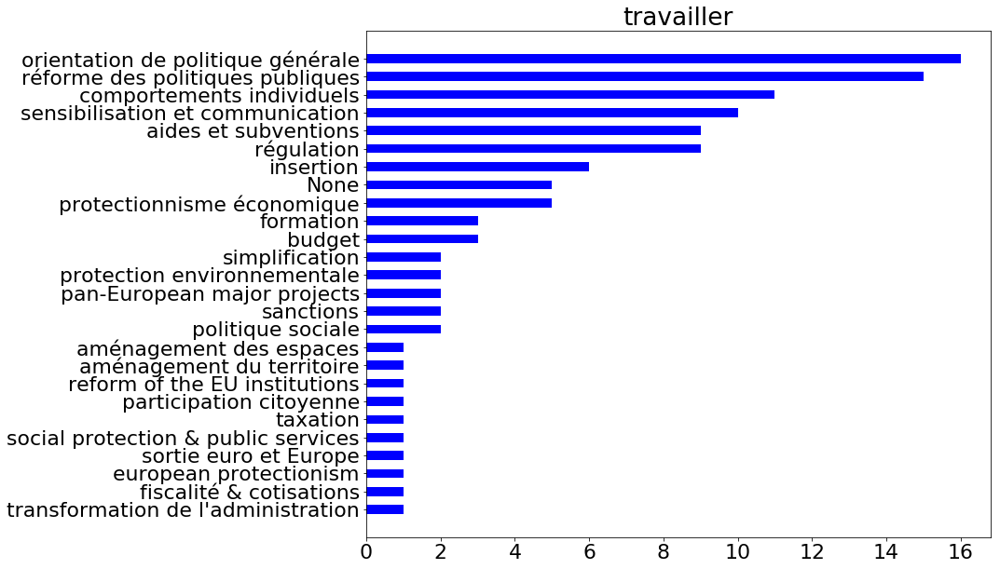



promouvoir
[('sensibilisation et communication', 40), ('orientation de politique générale', 20), ('régulation', 4), ('politique sociale', 4), ('réforme des politiques publiques', 2), ('aides et subventions', 2), ('participation citoyenne', 2), ('insertion', 1), ('budget', 1), ('None', 1), ('contrôle qualité', 1), ('sanctions', 1), ('pan-European major projects', 1), ('harmonisation', 1), ('coopération intergouvernementale', 1), ('taxation', 1), ('intergénérationnel', 1)]


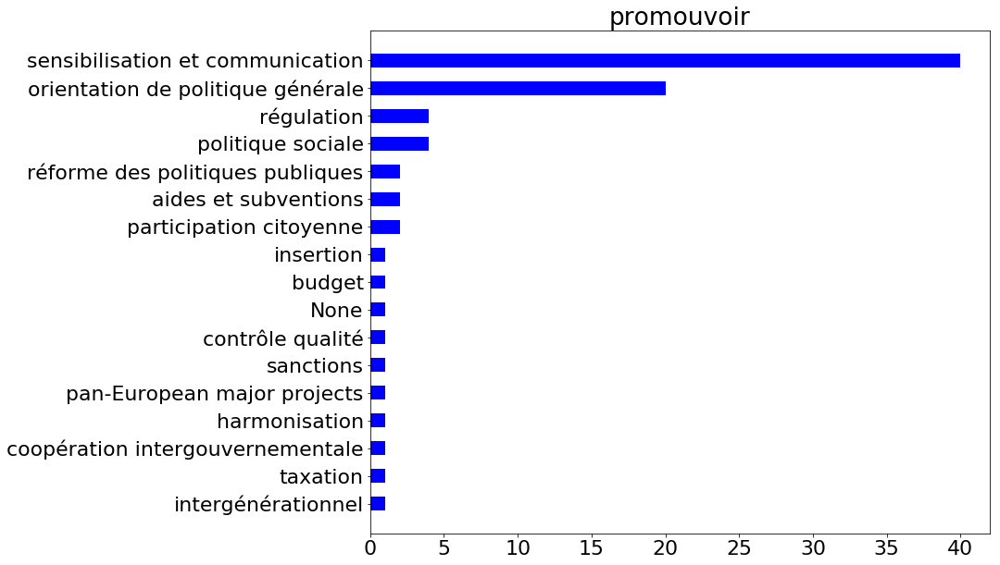



laisser
[('régulation', 17), ('comportements individuels', 14), ('orientation de politique générale', 12), ('réforme des politiques publiques', 9), ('politique sociale', 9), ('None', 8), ('participation citoyenne', 8), ('national competences', 8), ('sensibilisation et communication', 5), ('insertion', 4), ('harmonisation', 3), ('reform of the EU institutions', 3), ('budget', 3), ('formation', 2), ('sanctions', 2), ('coopération intergouvernementale', 2), ('EU competences', 2), ('social protection & public services', 2), ('simplification', 1), ('sortie euro et Europe', 1), ('pan-European major projects', 1), ('aides et subventions', 1), ('engagement associatif', 1), ('intergénérationnel', 1), ('couverture sociale', 1)]


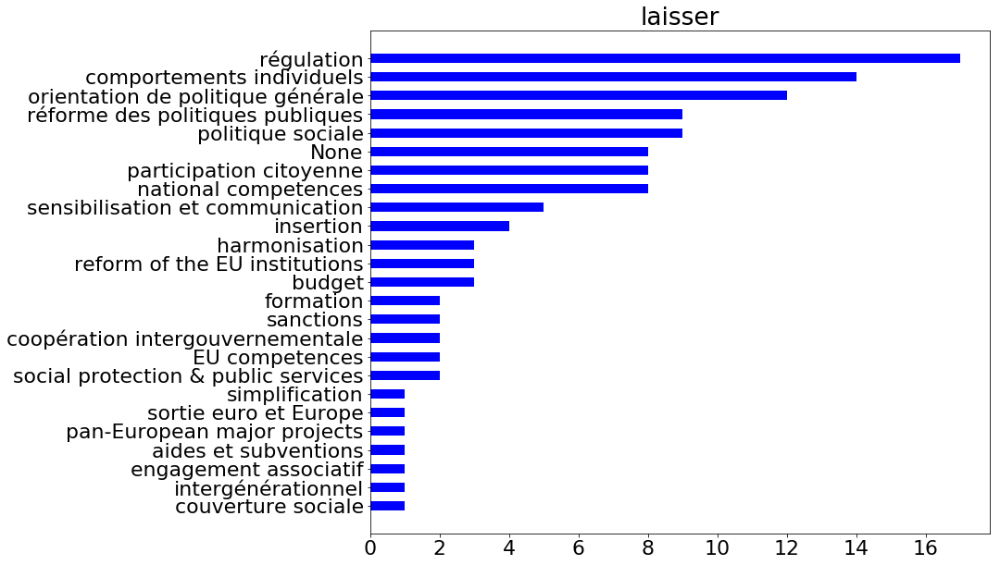



favoriser
[('comportements individuels', 73), ('None', 66), ('orientation de politique générale', 41), ('sensibilisation et communication', 40), ('aides et subventions', 40), ('régulation', 36), ('politique sociale', 34), ('insertion', 24), ('réforme des politiques publiques', 16), ('taxation', 14), ('aménagement du territoire', 12), ('participation citoyenne', 11), ('harmonisation', 9), ('sanctions', 8), ('protectionnisme économique', 8), ('intergénérationnel', 8), ('pan-European major projects', 7), ('aménagement des espaces', 6), ('RSE', 5), ('coopération intergouvernementale', 5), ('national competences', 5), ('formation', 4), ('budget', 4), ('european protectionism', 4), ('simplification', 2), ('reform of the EU institutions', 2), ('land development', 2), ('diplomatic decisions & treaties', 2), ('couverture sociale', 2), ('redistribution & répartition', 1), ('action européenne', 1), ('sortie euro et Europe', 1), ('EU competences', 1), ('engagement associatif', 1)]


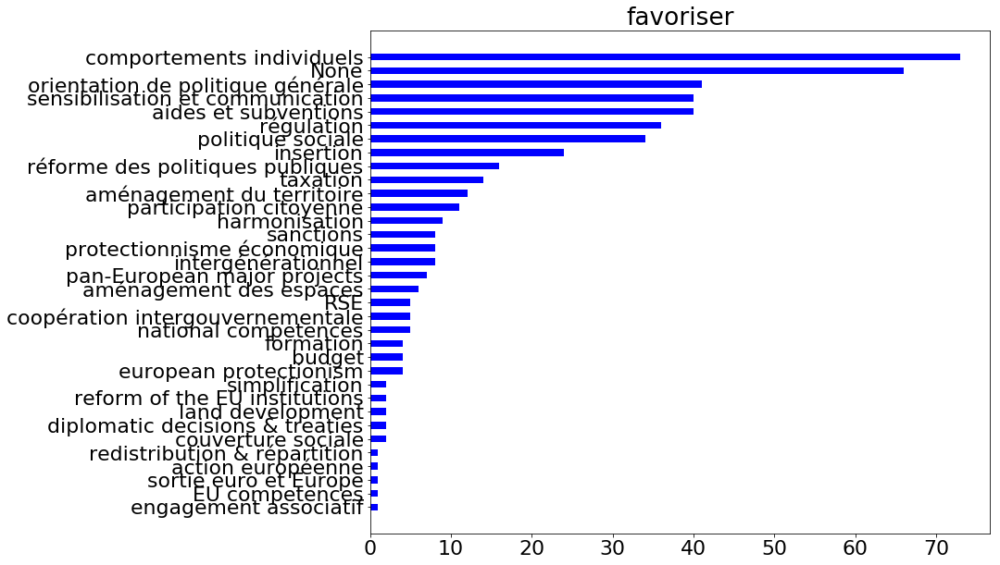



développer
[('politique sociale', 70), ('sensibilisation et communication', 41), ('None', 40), ('orientation de politique générale', 38), ('aides et subventions', 21), ('budget', 19), ('régulation', 18), ('réforme des politiques publiques', 16), ('participation citoyenne', 14), ('aménagement du territoire', 12), ('intergénérationnel', 12), ('comportements individuels', 11), ('coopération intergouvernementale', 11), ('harmonisation', 9), ('land development', 7), ('aménagement des espaces', 6), ('social protection & public services', 6), ('formation', 6), ('insertion', 5), ('pan-European major projects', 5), ('RSE', 4), ('numérique', 4), ('couverture sociale', 4), ('national competences', 3), ('protection environnementale', 2), ('taxation', 2), ('european protectionism', 2), ('simplification', 1), ('protectionnisme économique', 1), ('redistribution & répartition', 1), ('contrôle qualité', 1), ('accompagnement & coaching', 1), ('diplomatic decisions & treaties', 1), ('EU competences', 1

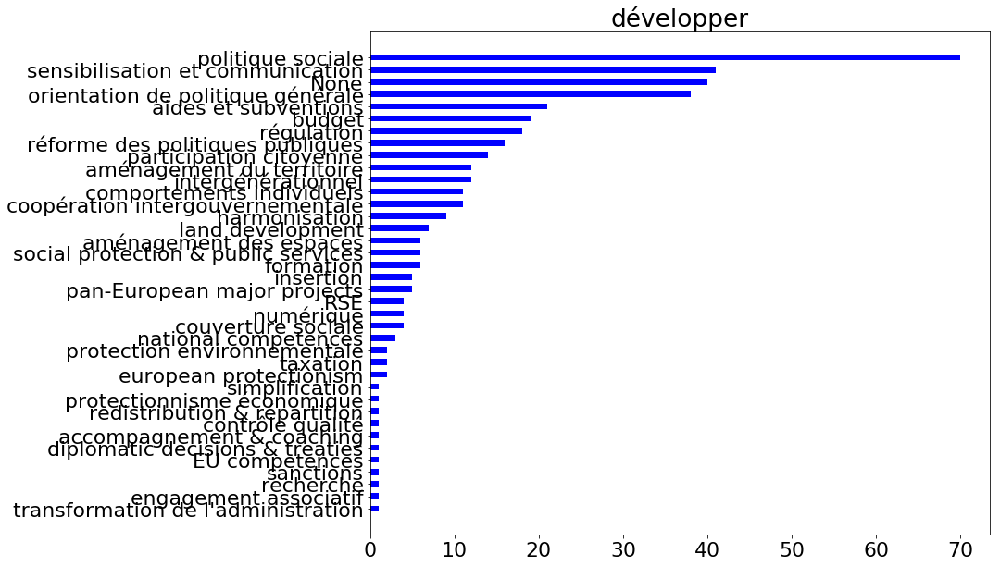



communiquer
[('sensibilisation et communication', 21), ('insertion', 1), ('formation', 1), ('régulation', 1), ('None', 1), ('comportements individuels', 1)]


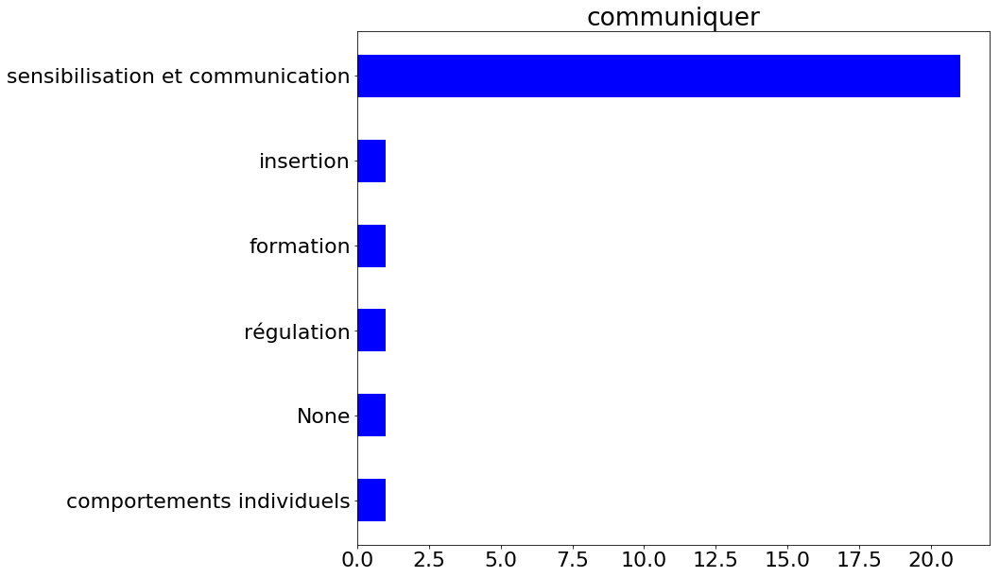



encourager
[('sensibilisation et communication', 33), ('aides et subventions', 22), ('orientation de politique générale', 14), ('régulation', 11), ('None', 11), ('comportements individuels', 10), ('taxation', 6), ('politique sociale', 5), ('intergénérationnel', 5), ('insertion', 3), ('sanctions', 3), ('réforme des politiques publiques', 3), ('participation citoyenne', 3), ('harmonisation', 2), ('budget', 2), ('coopération intergouvernementale', 2), ('simplification', 1), ('protectionnisme économique', 1), ('protection environnementale', 1), ('aménagement du territoire', 1), ('accompagnement & coaching', 1), ('reform of the EU institutions', 1), ('formation', 1), ('engagement associatif', 1)]


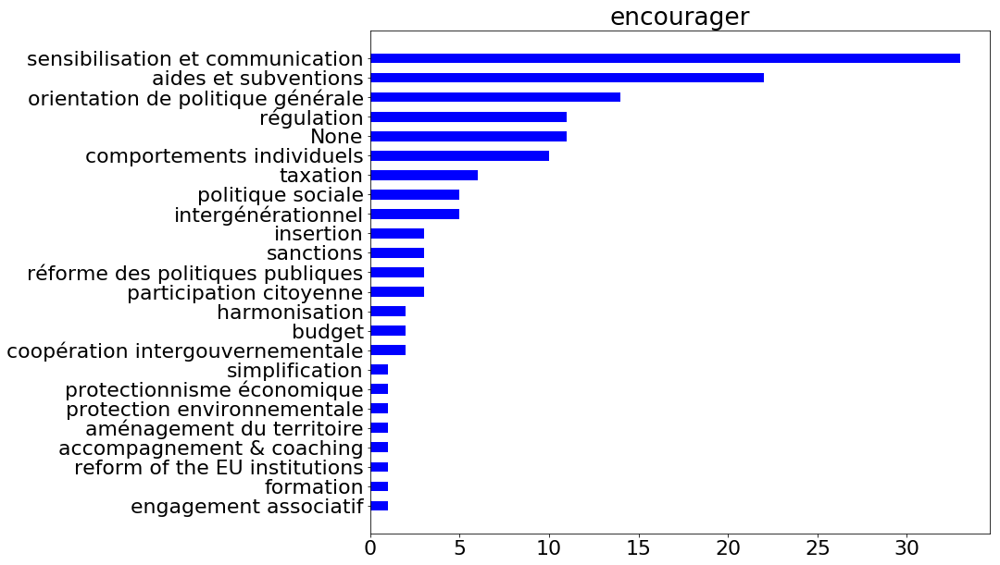



intégrer
[('sensibilisation et communication', 25), ('insertion', 15), ('régulation', 9), ('orientation de politique générale', 8), ('formation', 5), ('aides et subventions', 5), ('participation citoyenne', 5), ('réforme des politiques publiques', 5), ('diplomatic decisions & treaties', 5), ('comportements individuels', 4), ('None', 3), ('coopération intergouvernementale', 3), ('reform of the EU institutions', 2), ('harmonisation', 2), ('intergénérationnel', 2), ('simplification', 1), ('RSE', 1), ('protectionnisme économique', 1), ('taxation', 1), ('budget', 1), ('engagement associatif', 1), ('numérique', 1), ('politique sociale', 1)]


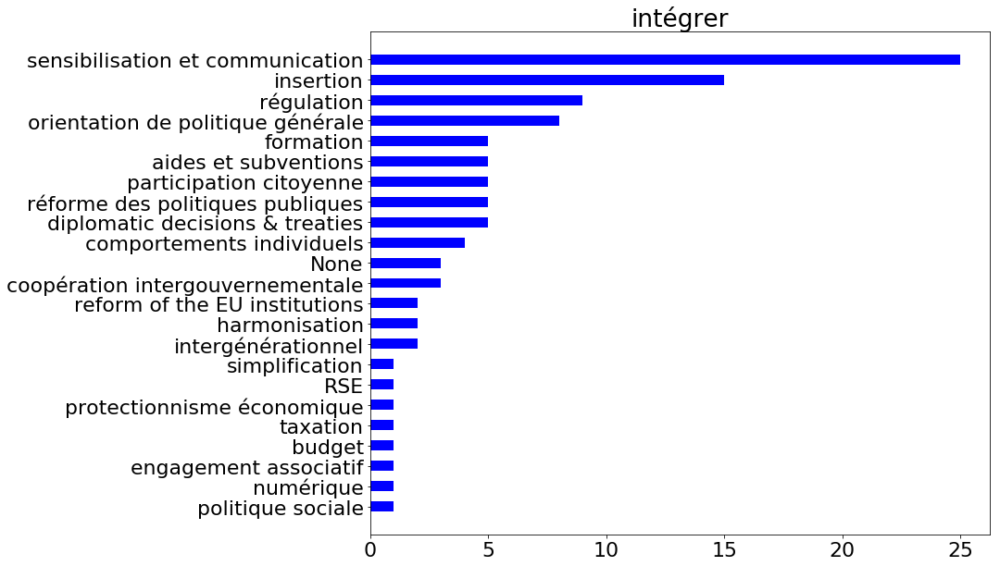



considérer
[('sensibilisation et communication', 30), ('régulation', 9), ('comportements individuels', 7), ('insertion', 5), ('None', 5), ('réforme des politiques publiques', 5), ('orientation de politique générale', 2), ('formation', 2), ('sanctions', 1), ('harmonisation', 1), ('aides et subventions', 1), ('taxation', 1), ('politique sociale', 1), ('budget', 1)]


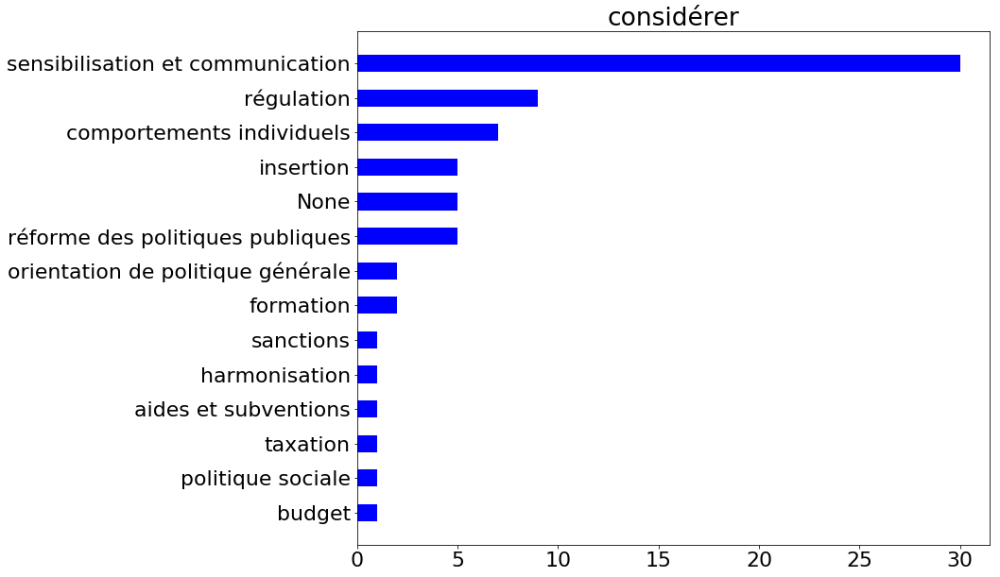



accompagner
[('politique sociale', 16), ('sensibilisation et communication', 15), ('insertion', 14), ('aides et subventions', 14), ('réforme des politiques publiques', 13), ('None', 13), ('budget', 12), ('formation', 12), ('orientation de politique générale', 7), ('régulation', 5), ('comportements individuels', 4), ('participation citoyenne', 2), ('harmonisation', 1), ('sanctions', 1), ('accompagnement & coaching', 1), ('coopération intergouvernementale', 1), ('RSE', 1), ('fiscalité & cotisations', 1)]


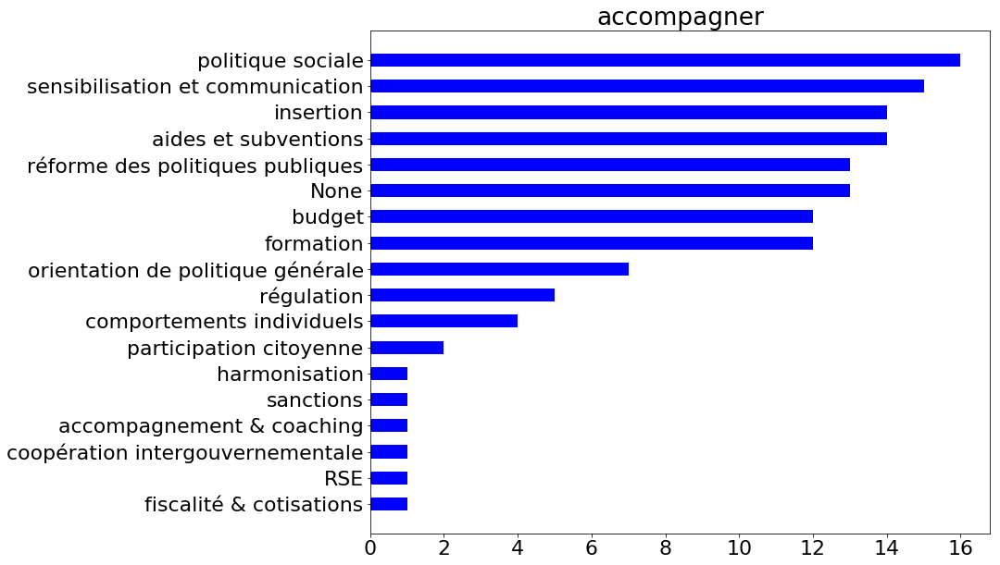



répondre
[('budget', 36), ('sensibilisation et communication', 6), ('orientation de politique générale', 4), ('politique sociale', 3), ('sanctions', 2), ('aménagement des espaces', 2), ('insertion', 1), ('harmonisation', 1), ('None', 1), ('simplification', 1), ('réforme des politiques publiques', 1), ('accompagnement & coaching', 1), ('EU competences', 1), ('formation', 1), ('comportements individuels', 1)]


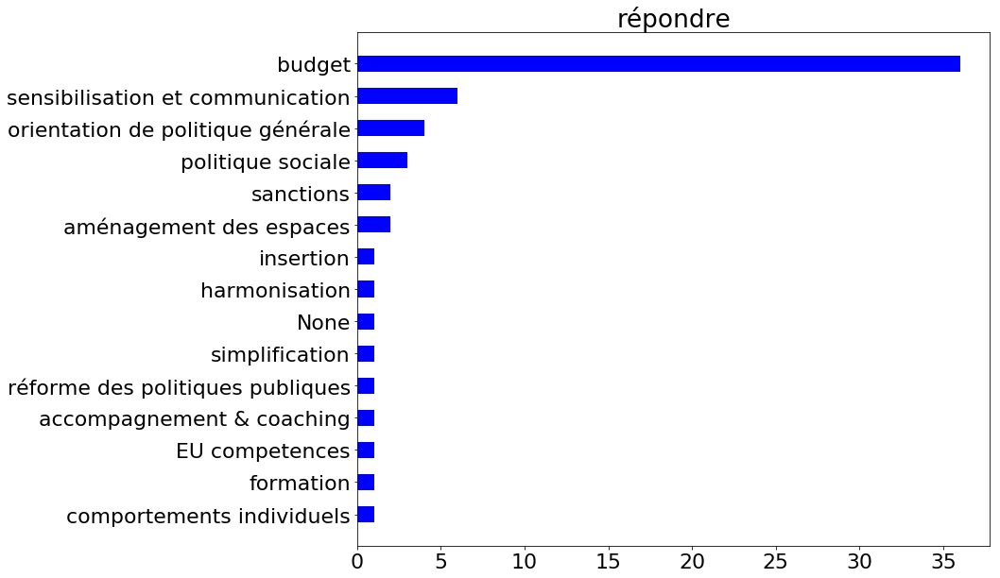



respecter
[('sanctions', 41), ('comportements individuels', 40), ('sensibilisation et communication', 39), ('régulation', 37), ('None', 18), ('orientation de politique générale', 12), ('national competences', 12), ('politique sociale', 10), ('taxation', 9), ('participation citoyenne', 8), ('harmonisation', 5), ('réforme des politiques publiques', 3), ('aménagement des espaces', 3), ('protectionnisme économique', 3), ('sortie euro et Europe', 3), ('budget', 3), ('insertion', 2), ('contrôle qualité', 2), ('reform of the EU institutions', 2), ('EU competences', 2), ('european protectionism', 2), ('simplification', 1), ('redistribution & répartition', 1), ('RSE', 1), ('diplomatic decisions & treaties', 1), ('pan-European major projects', 1), ('coopération intergouvernementale', 1), ('formation', 1), ('aides et subventions', 1)]


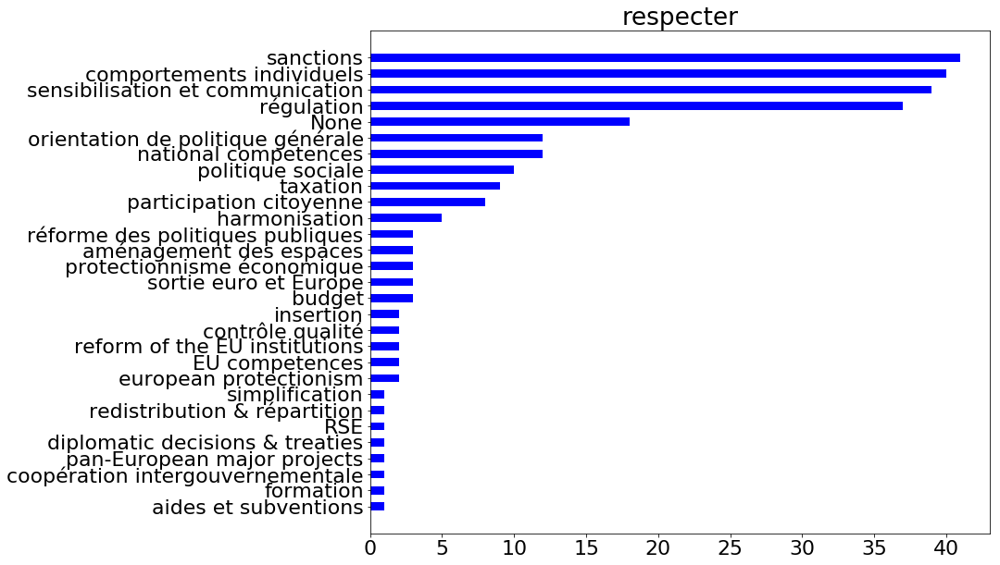



mettre
[('sensibilisation et communication', 102), ('régulation', 74), ('orientation de politique générale', 59), ('harmonisation', 36), ('réforme des politiques publiques', 34), ('None', 32), ('participation citoyenne', 32), ('sanctions', 29), ('comportements individuels', 23), ('taxation', 19), ('politique sociale', 19), ('aides et subventions', 18), ('reform of the EU institutions', 16), ('aménagement des espaces', 14), ('budget', 12), ('insertion', 9), ('formation', 8), ('aménagement du territoire', 8), ('sortie euro et Europe', 5), ('simplification', 4), ('redistribution & répartition', 4), ('coopération intergouvernementale', 4), ('pan-European major projects', 4), ('intergénérationnel', 4), ('RSE', 3), ('contrôle qualité', 3), ('protectionnisme économique', 3), ('EU competences', 3), ('european protectionism', 3), ('fiscalité & cotisations', 3), ('couverture sociale', 3), ('engagement associatif', 3), ('protection environnementale', 2), ('accompagnement & coaching', 2), ('dipl

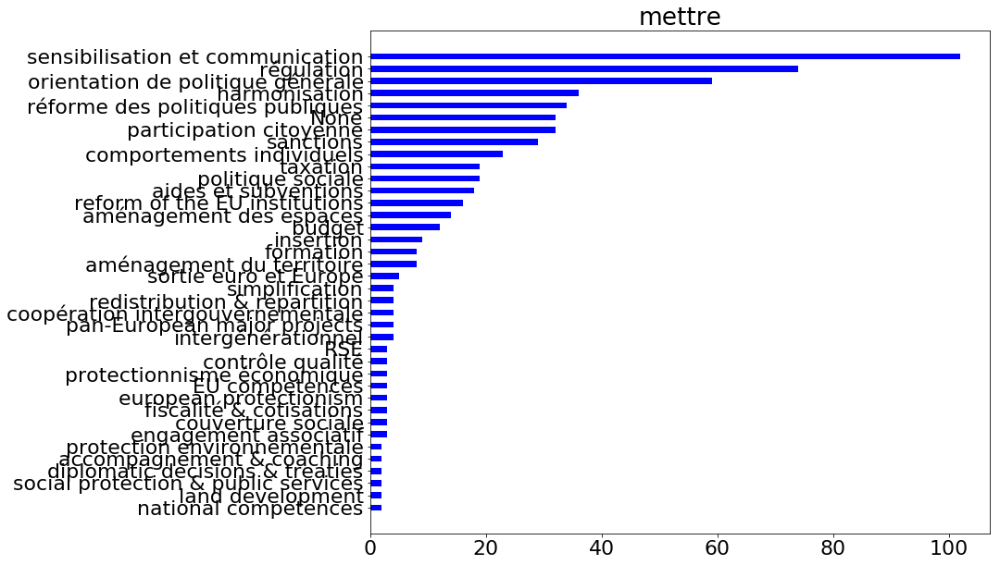



expliquer
[('sensibilisation et communication', 56), ('None', 1), ('comportements individuels', 1), ('régulation', 1), ('accompagnement & coaching', 1), ('participation citoyenne', 1), ('aides et subventions', 1), ('formation', 1), ("transformation de l'administration", 1)]


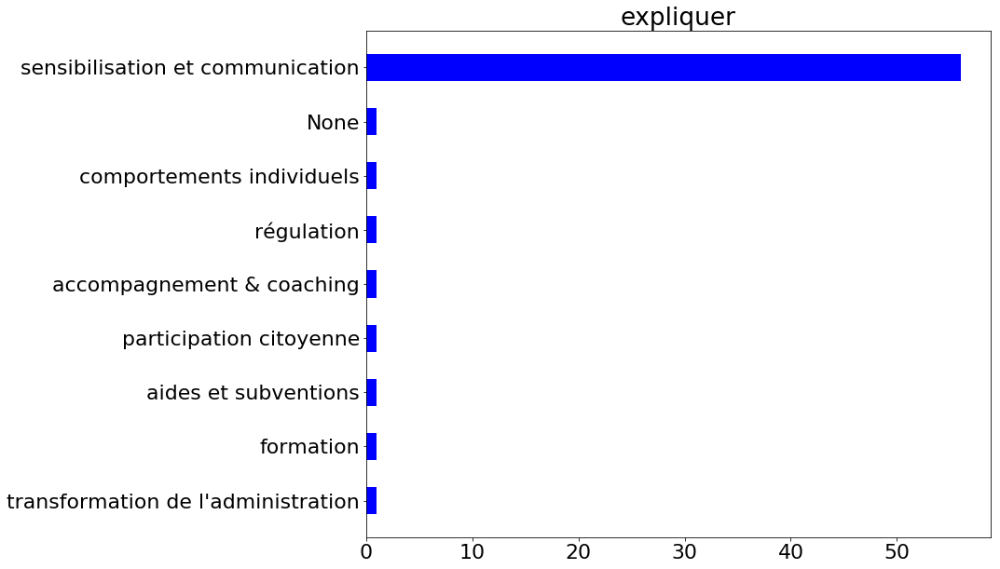



obliger
[('régulation', 56), ('sanctions', 15), ('aménagement des espaces', 12), ('réforme des politiques publiques', 9), ('harmonisation', 7), ('None', 7), ('orientation de politique générale', 7), ('sensibilisation et communication', 4), ('reform of the EU institutions', 4), ('politique sociale', 4), ('insertion', 3), ('comportements individuels', 3), ('participation citoyenne', 3), ('RSE', 3), ('taxation', 3), ('aides et subventions', 2), ('formation', 2), ('couverture sociale', 2), ('budget', 1), ('contrôle qualité', 1), ('accompagnement & coaching', 1), ('national competences', 1), ('EU competences', 1), ('european protectionism', 1), ('social protection & public services', 1)]


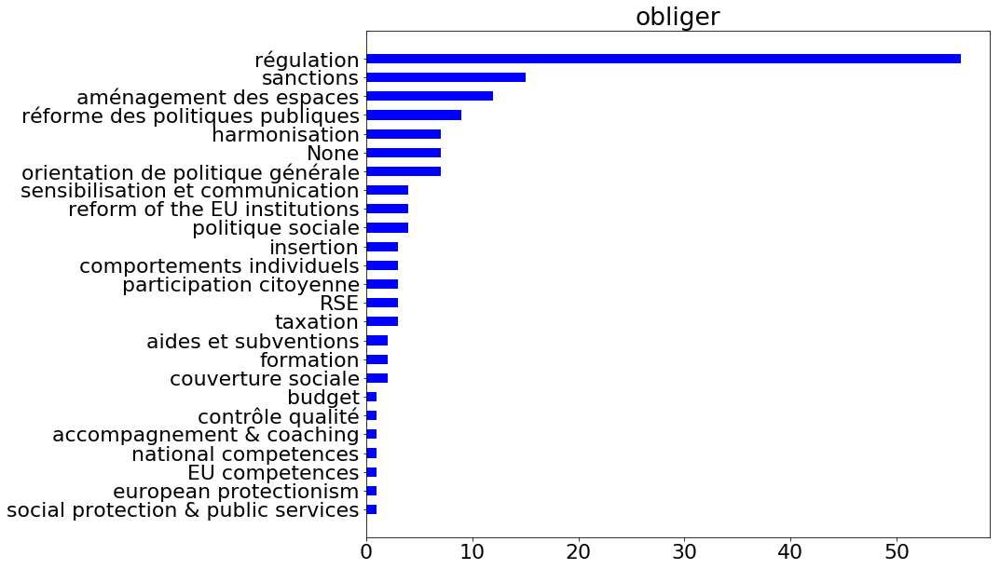



revoir
[('régulation', 34), ('réforme des politiques publiques', 25), ('orientation de politique générale', 11), ('None', 9), ('reform of the EU institutions', 8), ('sensibilisation et communication', 7), ('budget', 7), ('formation', 6), ('harmonisation', 5), ('aides et subventions', 4), ('comportements individuels', 3), ('diplomatic decisions & treaties', 3), ('social protection & public services', 3), ('simplification', 2), ('politique sociale', 2), ('insertion', 1), ('RSE', 1), ('action européenne', 1), ('national competences', 1), ('taxation', 1), ('EU competences', 1), ('pan-European major projects', 1), ("transformation de l'administration", 1), ('couverture sociale', 1)]


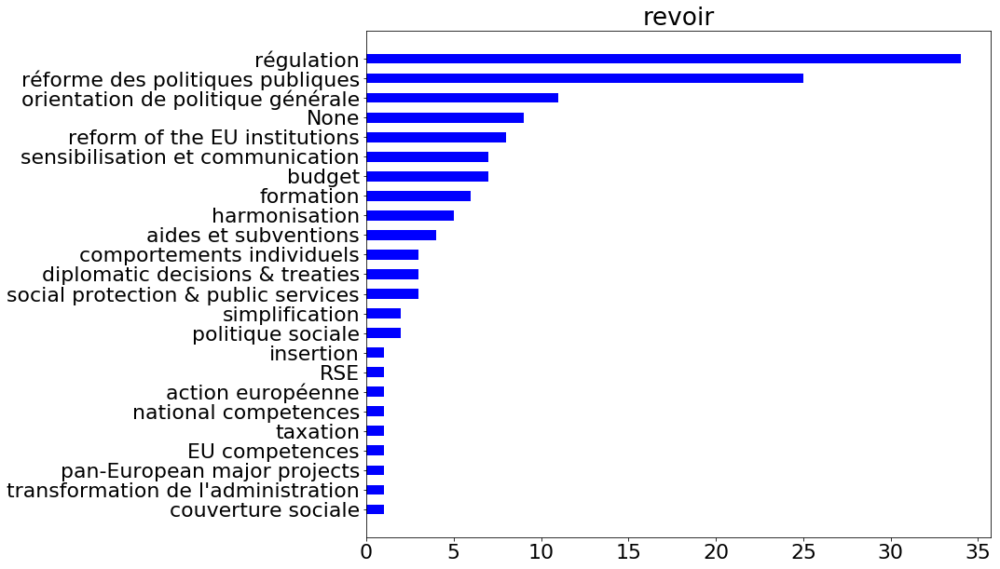



comprendre
[('sensibilisation et communication', 52), ('comportements individuels', 18), ('réforme des politiques publiques', 8), ('formation', 5), ('harmonisation', 5), ('orientation de politique générale', 4), ('sanctions', 4), ('insertion', 3), ('régulation', 3), ('simplification', 3), ('politique sociale', 3), ('None', 2), ('accompagnement & coaching', 2), ('aménagement des espaces', 1), ('aides et subventions', 1), ('budget', 1), ('protection environnementale', 1), ('aménagement du territoire', 1), ('national competences', 1), ('reform of the EU institutions', 1), ('taxation', 1), ('intergénérationnel', 1), ('RSE', 1)]


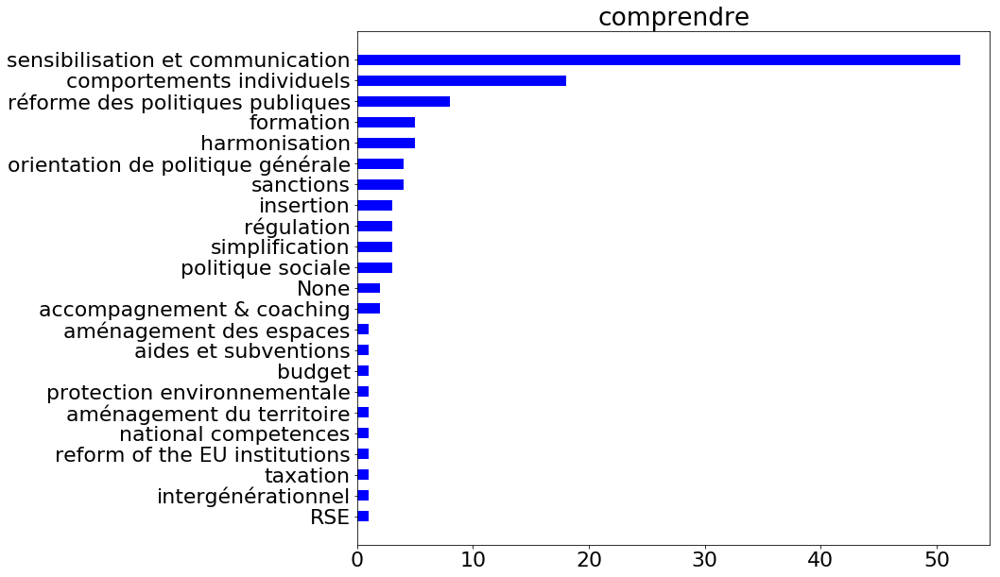



aménager
[('aménagement des espaces', 15), ('aides et subventions', 5), ('orientation de politique générale', 2), ('insertion', 2), ('comportements individuels', 2), ('aménagement du territoire', 2), ('budget', 2), ('sensibilisation et communication', 1), ('None', 1), ('RSE', 1), ('social protection & public services', 1), ('sanctions', 1)]


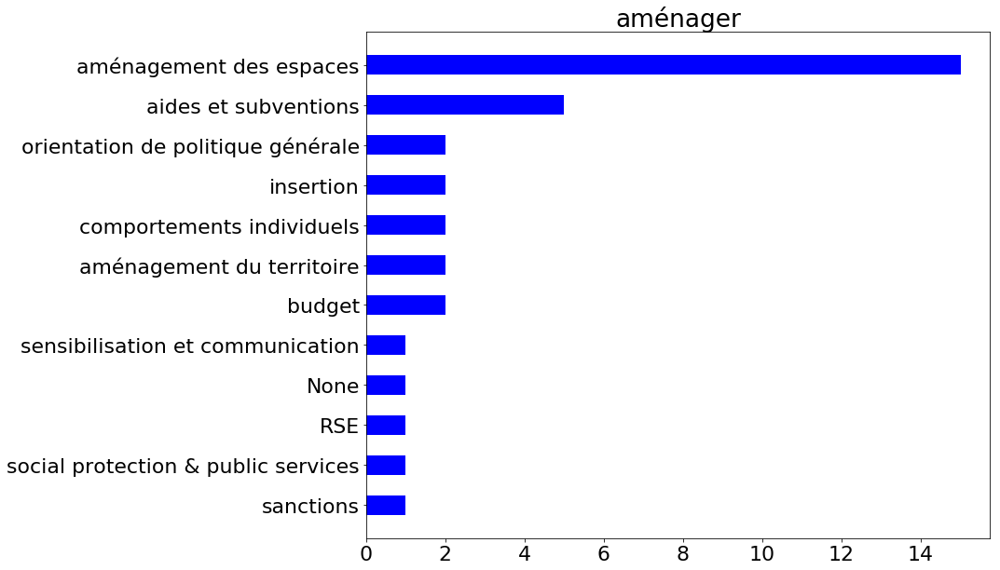



penser
[('réforme des politiques publiques', 12), ('sensibilisation et communication', 11), ('orientation de politique générale', 8), ('budget', 8), ('aides et subventions', 7), ('social protection & public services', 7), ('None', 5), ('régulation', 5), ('comportements individuels', 5), ('aménagement des espaces', 4), ('harmonisation', 4), ('participation citoyenne', 3), ('formation', 2), ('insertion', 1), ('RSE', 1), ('aménagement du territoire', 1), ('accompagnement & coaching', 1), ('reform of the EU institutions', 1), ('sortie euro et Europe', 1), ('national competences', 1), ('pan-European major projects', 1), ('politique sociale', 1), ('fiscalité & cotisations', 1)]


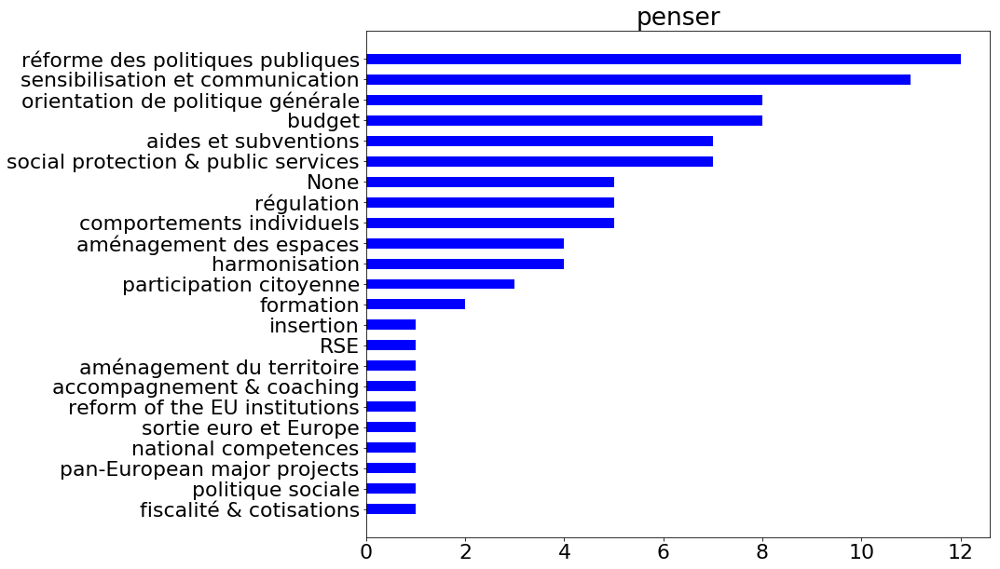



pouvoir
[('sensibilisation et communication', 16), ('insertion', 12), ('aides et subventions', 12), ('réforme des politiques publiques', 10), ('None', 10), ('budget', 9), ('orientation de politique générale', 9), ('participation citoyenne', 9), ('régulation', 9), ('harmonisation', 7), ('politique sociale', 7), ('comportements individuels', 6), ('aménagement des espaces', 4), ('aménagement du territoire', 3), ('national competences', 3), ('formation', 2), ('coopération intergouvernementale', 2), ('reform of the EU institutions', 2), ('RSE', 1), ('protection environnementale', 1), ('taxation', 1), ('accompagnement & coaching', 1), ('sanctions', 1), ('sortie euro et Europe', 1), ('simplification', 1), ('land development', 1), ('numérique', 1), ('couverture sociale', 1), ('fiscalité & cotisations', 1), ("transformation de l'administration", 1)]


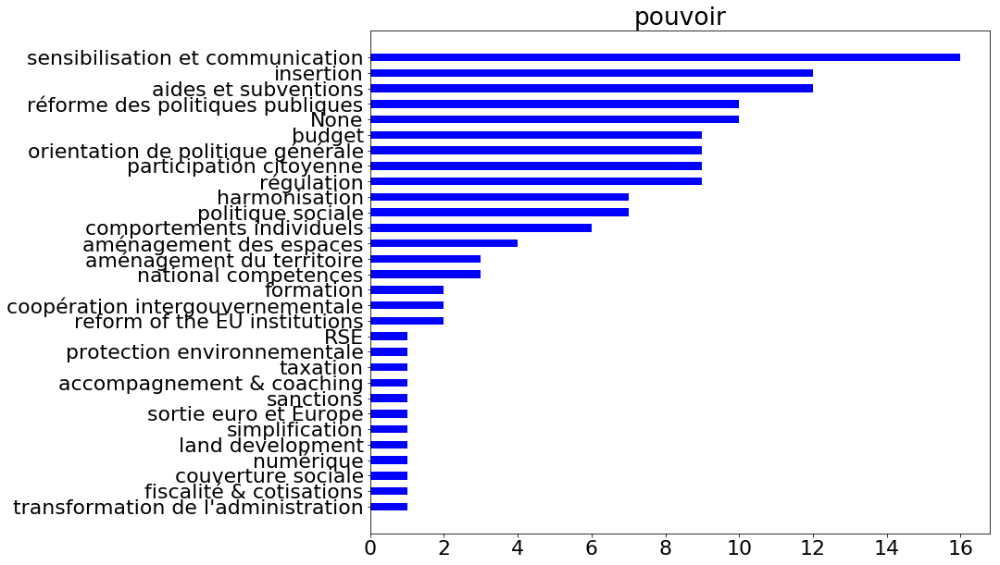



rendre
[('régulation', 45), ('sensibilisation et communication', 35), ('None', 25), ('réforme des politiques publiques', 22), ('aides et subventions', 18), ('aménagement des espaces', 17), ('orientation de politique générale', 16), ('politique sociale', 15), ('harmonisation', 13), ('budget', 9), ('taxation', 8), ('sanctions', 7), ('reform of the EU institutions', 6), ('formation', 5), ('comportements individuels', 4), ('contrôle qualité', 4), ('RSE', 4), ('sortie euro et Europe', 4), ('participation citoyenne', 3), ('national competences', 3), ('insertion', 2), ('simplification', 1), ('redistribution & répartition', 1), ('aménagement du territoire', 1), ('action européenne', 1), ('protection environnementale', 1), ('european protectionism', 1), ('coopération intergouvernementale', 1), ('pan-European major projects', 1), ('couverture sociale', 1)]


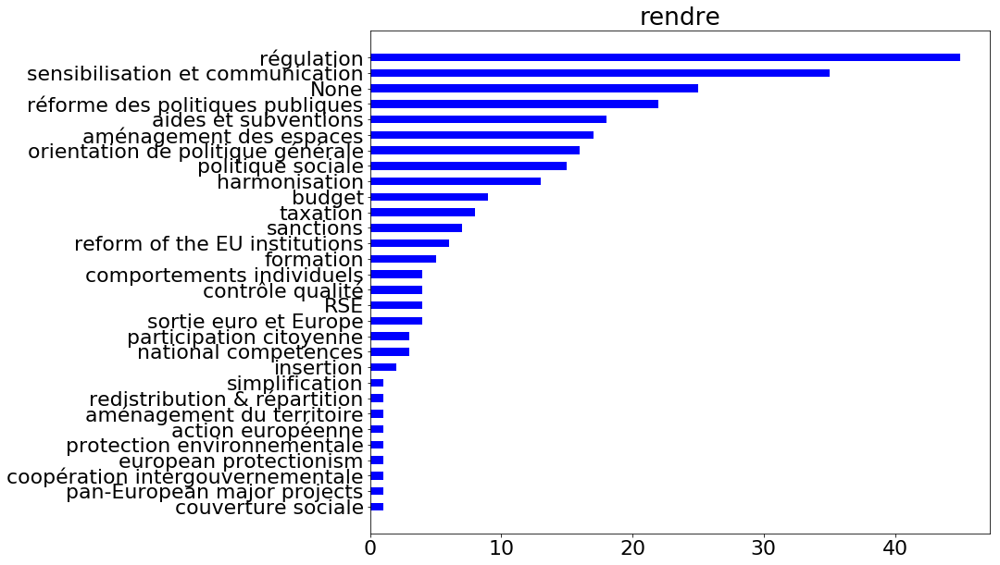



sortir
[('sortie euro et Europe', 1600), ('orientation de politique générale', 18), ('régulation', 12), ('None', 7), ('sensibilisation et communication', 7), ('reform of the EU institutions', 5), ('budget', 3), ('réforme des politiques publiques', 3), ('aides et subventions', 3), ('diplomatic decisions & treaties', 3), ('EU competences', 3), ('comportements individuels', 3), ('european protectionism', 3), ('insertion', 2), ('national competences', 2), ('pan-European major projects', 2), ('simplification', 1), ('aménagement des espaces', 1), ('redistribution & répartition', 1), ('protectionnisme économique', 1), ('sanctions', 1), ('participation citoyenne', 1), ('coopération intergouvernementale', 1), ('taxation', 1), ('social protection & public services', 1), ('engagement associatif', 1), ('recherche', 1), ('couverture sociale', 1)]


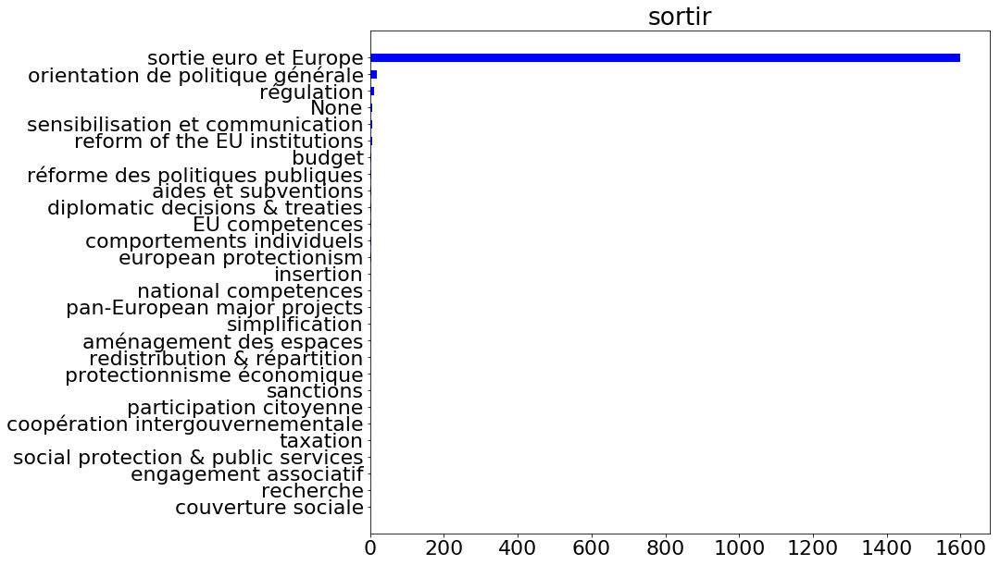



maintenir
[('politique sociale', 18), ('None', 5), ('aides et subventions', 5), ('réforme des politiques publiques', 4), ('sensibilisation et communication', 4), ('couverture sociale', 4), ('aménagement des espaces', 3), ('régulation', 3), ('insertion', 2), ('budget', 2), ('intergénérationnel', 2), ('orientation de politique générale', 1), ('national competences', 1), ('social protection & public services', 1), ('recherche', 1)]


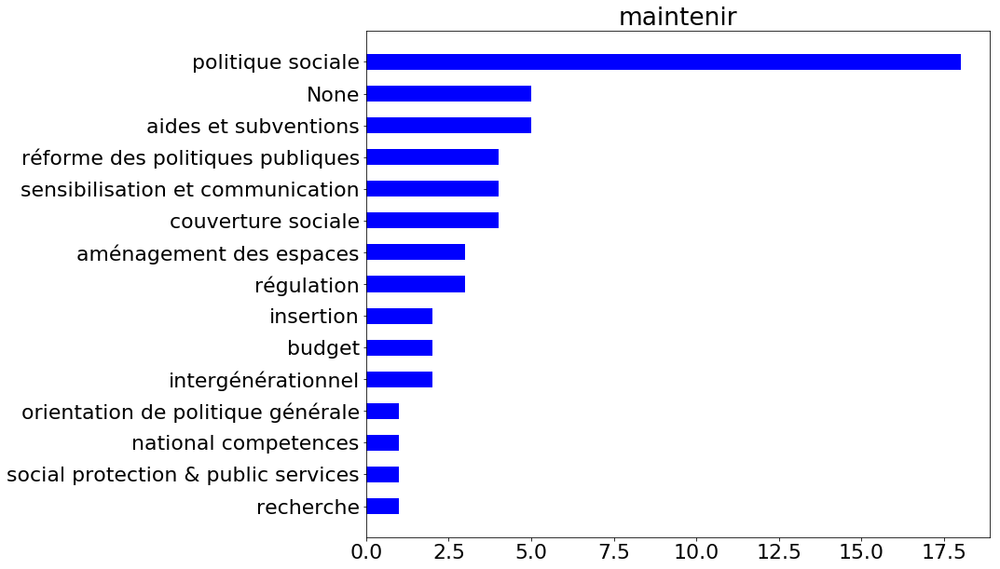



refuser
[('régulation', 11), ('sanctions', 8), ('orientation de politique générale', 3), ('réforme des politiques publiques', 2), ('comportements individuels', 2), ('reform of the EU institutions', 2), ('sensibilisation et communication', 1), ('None', 1), ('participation citoyenne', 1), ('diplomatic decisions & treaties', 1), ('sortie euro et Europe', 1)]


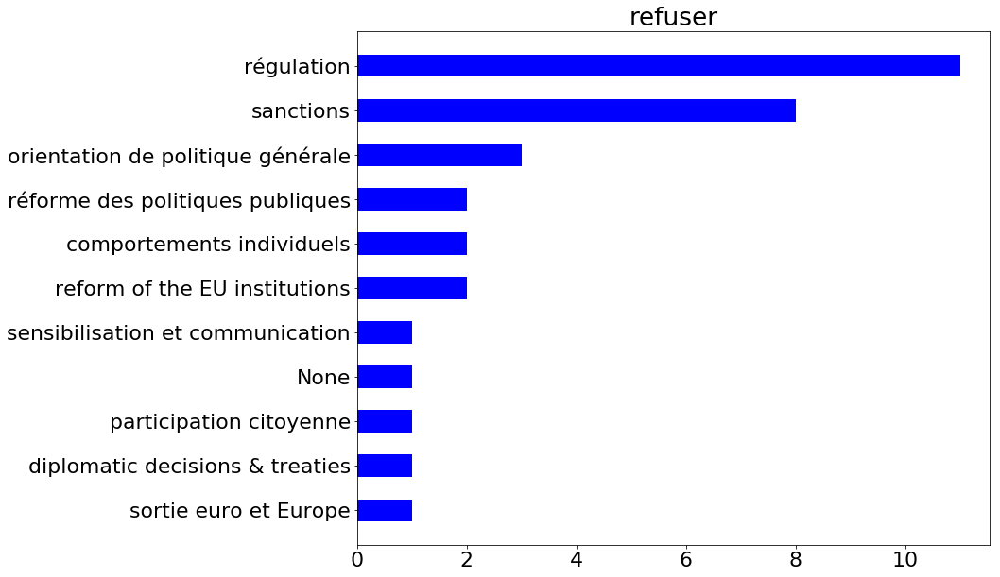



mieux informer
[('sensibilisation et communication', 22), ('aides et subventions', 1)]


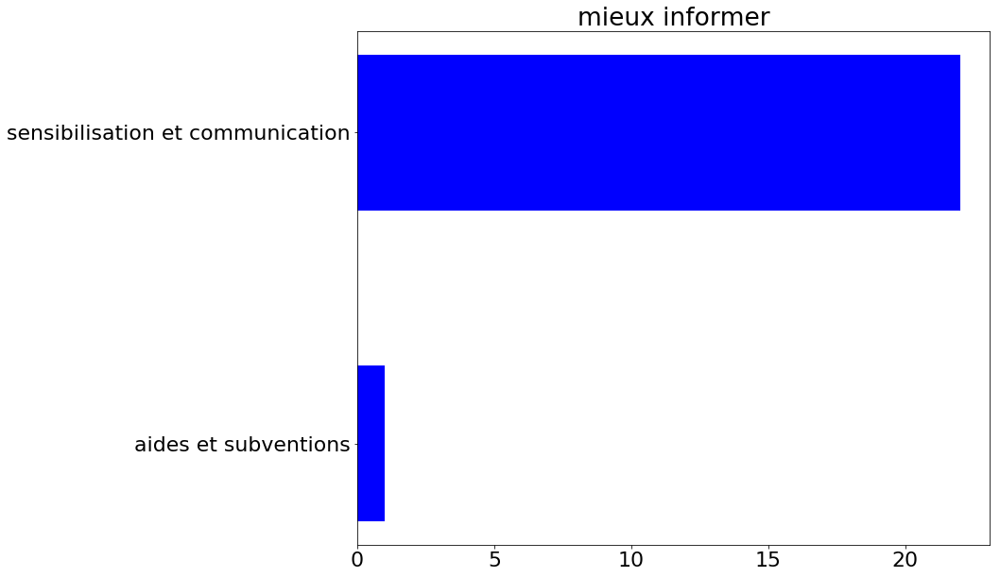



revaloriser
[('sensibilisation et communication', 14), ('politique sociale', 12), ('budget', 9), ('réforme des politiques publiques', 7), ('régulation', 4), ('orientation de politique générale', 3), ('social protection & public services', 3), ('None', 2), ('harmonisation', 1), ('formation', 1), ('RSE', 1)]


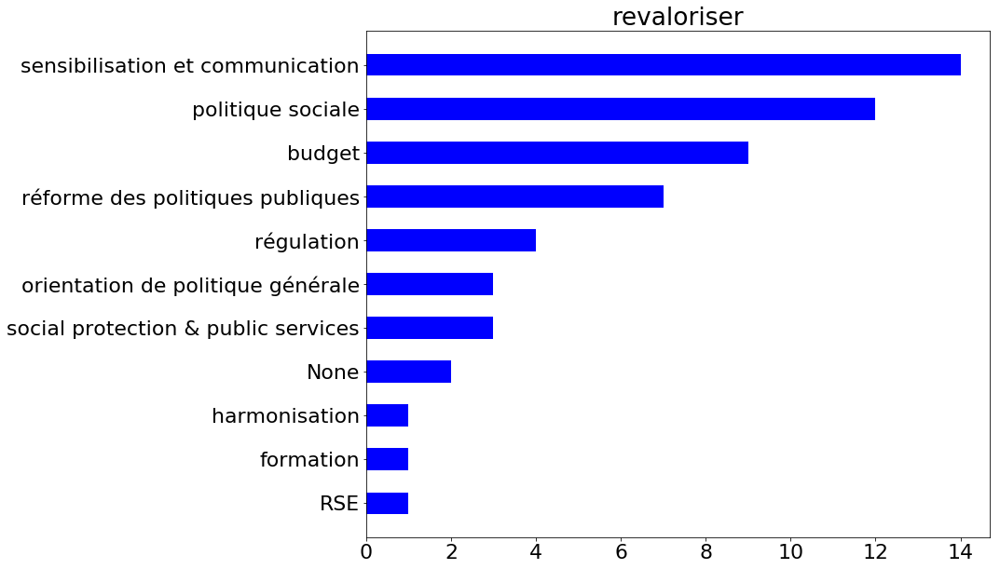



réserver
[('aménagement des espaces', 13), ('sanctions', 11), ('harmonisation', 4), ('orientation de politique générale', 3), ('régulation', 3), ('sensibilisation et communication', 2), ('aménagement du territoire', 2), ('réforme des politiques publiques', 1), ('insertion', 1), ('None', 1)]


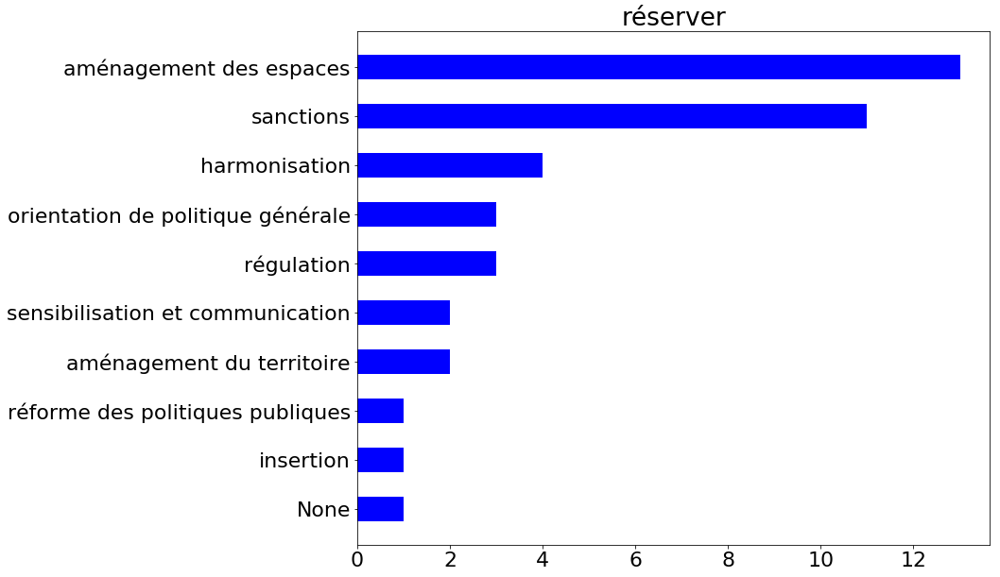



imposer
[('régulation', 68), ('orientation de politique générale', 14), ('taxation', 13), ('sensibilisation et communication', 12), ('sanctions', 9), ('réforme des politiques publiques', 7), ('harmonisation', 7), ('comportements individuels', 6), ('None', 5), ('insertion', 4), ('aménagement des espaces', 4), ('reform of the EU institutions', 4), ('RSE', 4), ('sortie euro et Europe', 3), ('simplification', 2), ('protectionnisme économique', 2), ('action européenne', 2), ('contrôle qualité', 2), ('participation citoyenne', 2), ('national competences', 2), ('protection environnementale', 1), ('aménagement du territoire', 1), ('budget', 1), ('formation', 1), ('numérique', 1)]


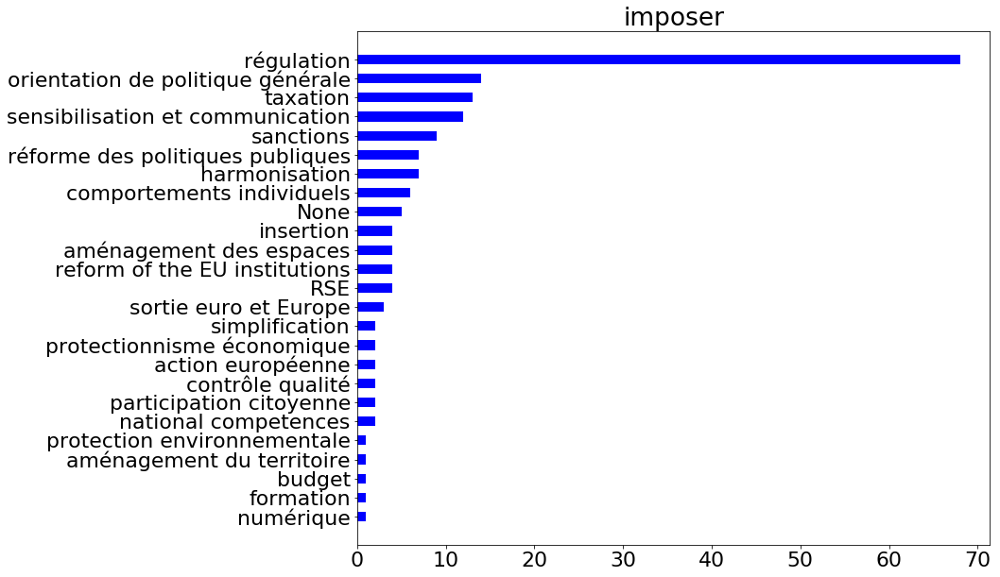



autoriser
[('régulation', 29), ('politique sociale', 5), ('sensibilisation et communication', 4), ('orientation de politique générale', 3), ('insertion', 2), ('réforme des politiques publiques', 2), ('sortie euro et Europe', 2), ('redistribution & répartition', 2), ('budget', 2), ('reform of the EU institutions', 2), ('EU competences', 1), ('harmonisation', 1), ('diplomatic decisions & treaties', 1), ('comportements individuels', 1)]


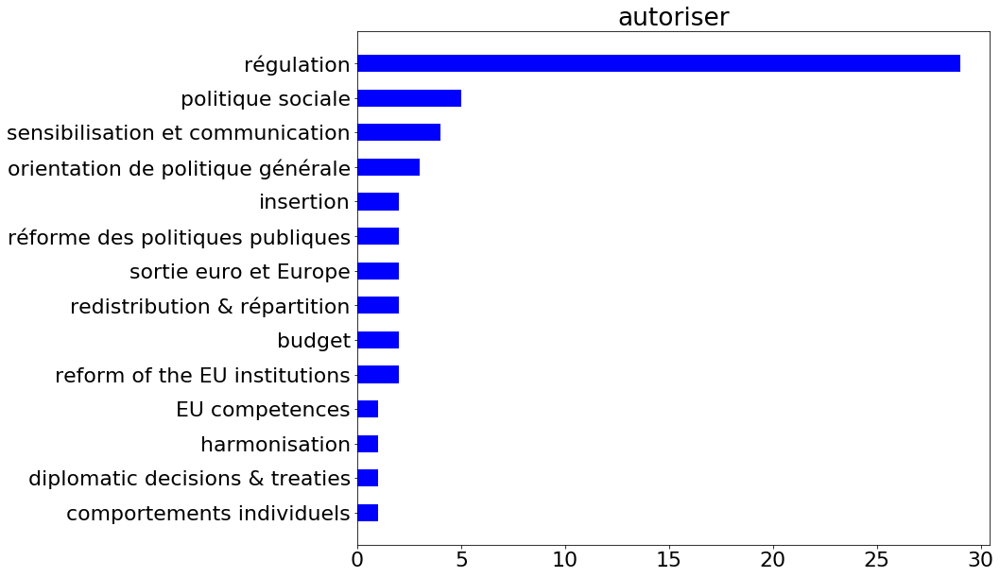



payer
[('régulation', 44), ('taxation', 33), ('comportements individuels', 11), ('harmonisation', 10), ('sanctions', 8), ('budget', 8), ('reform of the EU institutions', 8), ('réforme des politiques publiques', 6), ('aides et subventions', 6), ('politique sociale', 6), ('None', 3), ('protectionnisme économique', 2), ('RSE', 2), ('orientation de politique générale', 2), ('social protection & public services', 2), ('insertion', 1), ('redistribution & répartition', 1), ('sensibilisation et communication', 1), ('sortie euro et Europe', 1), ('diplomatic decisions & treaties', 1), ('national competences', 1), ('EU competences', 1), ('european protectionism', 1), ('fiscalité & cotisations', 1)]


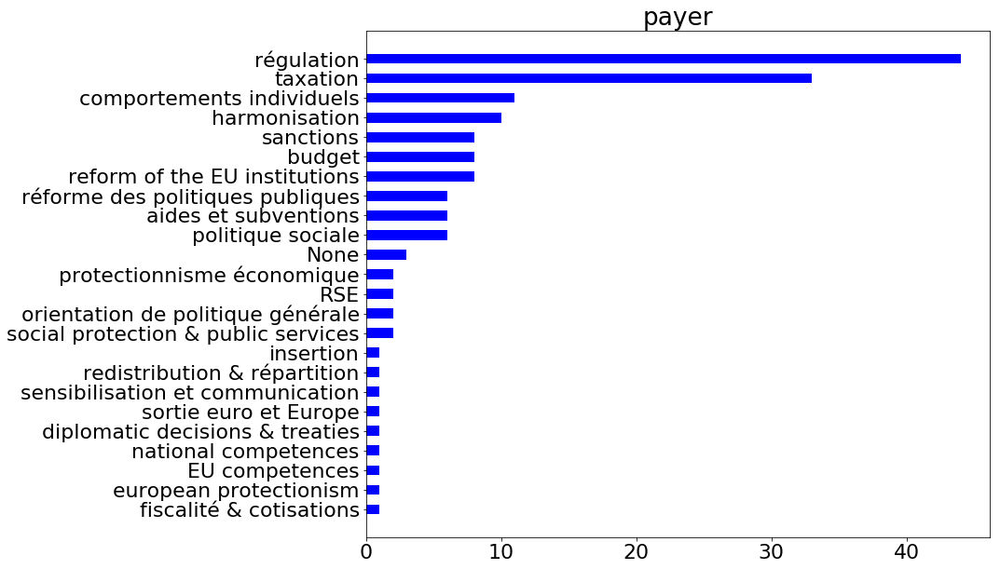



arrêter
[('régulation', 261), ('comportements individuels', 102), ('sensibilisation et communication', 59), ('None', 51), ('orientation de politique générale', 49), ('réforme des politiques publiques', 44), ('sanctions', 44), ('protectionnisme économique', 26), ('budget', 12), ('simplification', 12), ('aides et subventions', 9), ('reform of the EU institutions', 9), ('harmonisation', 8), ('taxation', 8), ('national competences', 8), ('RSE', 7), ('sortie euro et Europe', 5), ('pan-European major projects', 5), ('protection environnementale', 3), ('participation citoyenne', 3), ('european protectionism', 3), ('insertion', 2), ('coopération intergouvernementale', 2), ('social protection & public services', 2), ('intergénérationnel', 2), ('formation', 2), ('politique sociale', 2), ('aménagement des espaces', 1), ('action européenne', 1), ('redistribution & répartition', 1), ('aménagement du territoire', 1), ('contrôle qualité', 1), ('responsabilisation', 1), ('EU competences', 1), ('dipl

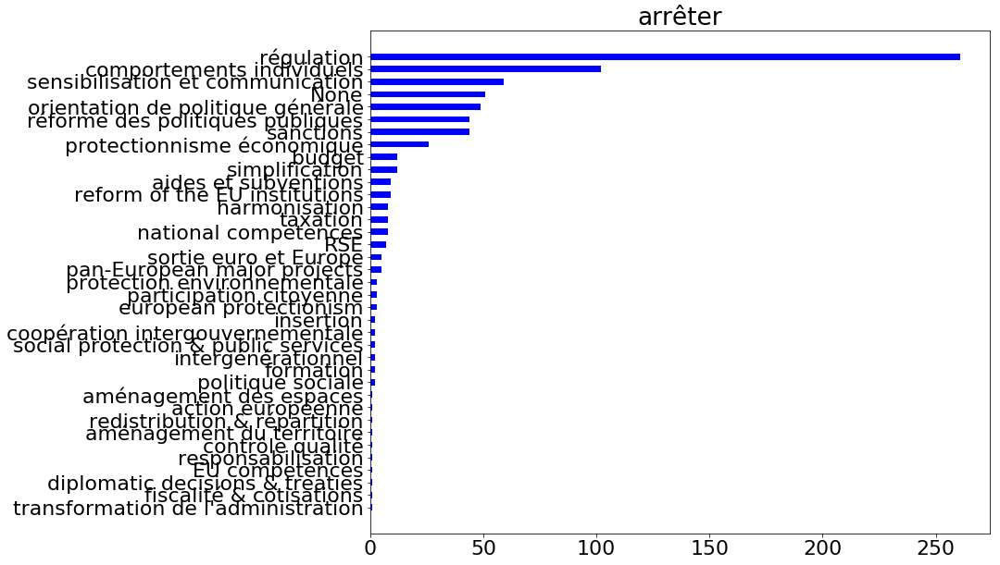



sanctionner
[('sanctions', 21), ('régulation', 2), ('orientation de politique générale', 2), ('sensibilisation et communication', 2), ('harmonisation', 2), ('comportements individuels', 1), ('participation citoyenne', 1), ('taxation', 1), ('formation', 1)]


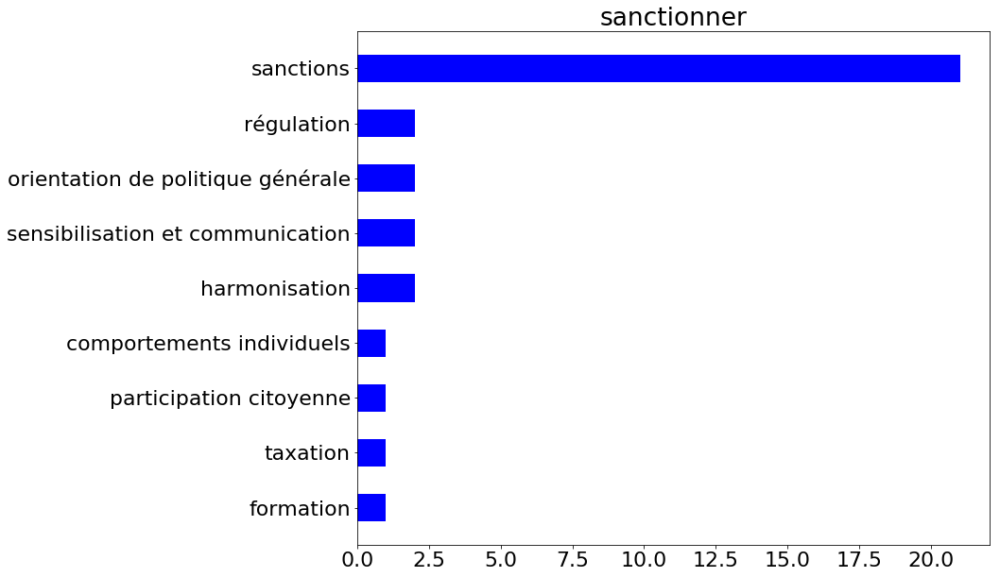



accepter
[('comportements individuels', 25), ('régulation', 10), ('None', 7), ('sensibilisation et communication', 7), ('insertion', 5), ('participation citoyenne', 3), ('orientation de politique générale', 3), ('reform of the EU institutions', 2), ('réforme des politiques publiques', 1), ('RSE', 1), ('redistribution & répartition', 1), ('contrôle qualité', 1), ('EU competences', 1), ('coopération intergouvernementale', 1), ('intergénérationnel', 1), ('politique sociale', 1), ('couverture sociale', 1)]


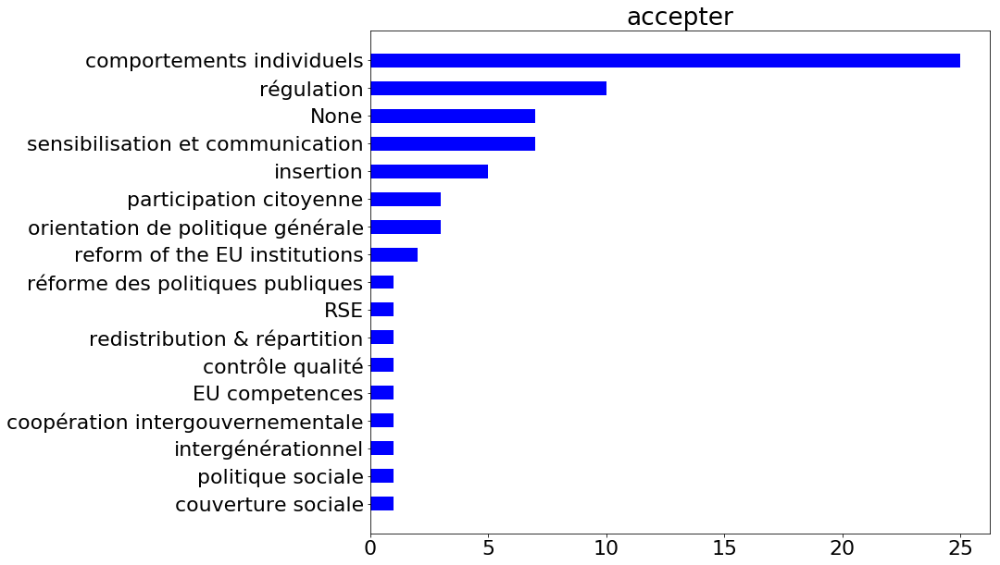



punir
[('sanctions', 22), ('accompagnement & coaching', 1), ('aides et subventions', 1)]


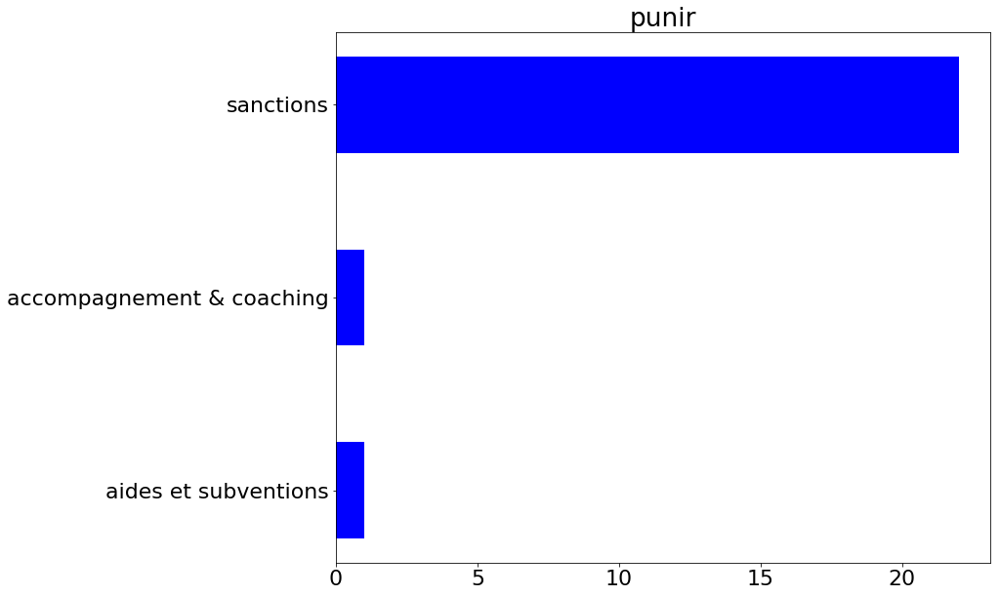



financer
[('budget', 17), ('aides et subventions', 12), ('taxation', 9), ('coopération intergouvernementale', 5), ('harmonisation', 4), ('sensibilisation et communication', 4), ('régulation', 4), ('EU competences', 3), ('reform of the EU institutions', 3), ('couverture sociale', 3), ('réforme des politiques publiques', 2), ('sanctions', 2), ('pan-European major projects', 2), ('orientation de politique générale', 2), ('formation', 1), ('aménagement des espaces', 1), ('national competences', 1), ('intergénérationnel', 1), ('politique sociale', 1), ('fiscalité & cotisations', 1), ('RSE', 1)]


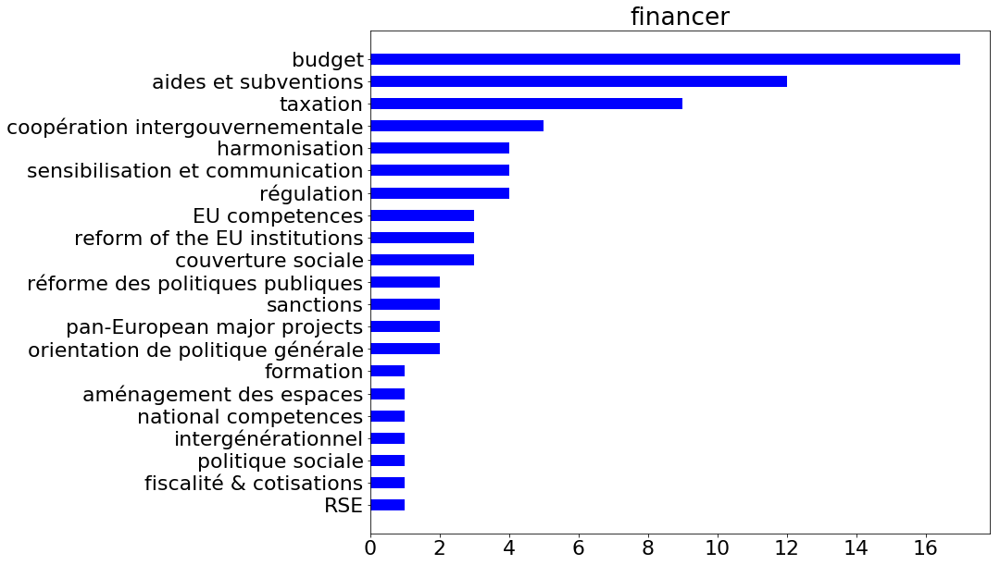



vouloir
[('comportements individuels', 15), ('aides et subventions', 7), ('régulation', 7), ('sensibilisation et communication', 6), ('orientation de politique générale', 4), ('insertion', 3), ('reform of the EU institutions', 3), ('participation citoyenne', 3), ('politique sociale', 3), ('aménagement des espaces', 1), ('formation', 1), ('réforme des politiques publiques', 1), ('None', 1), ('sanctions', 1), ('accompagnement & coaching', 1), ('pan-European major projects', 1), ('sortie euro et Europe', 1), ('european protectionism', 1), ('national competences', 1), ('budget', 1), ("transformation de l'administration", 1)]


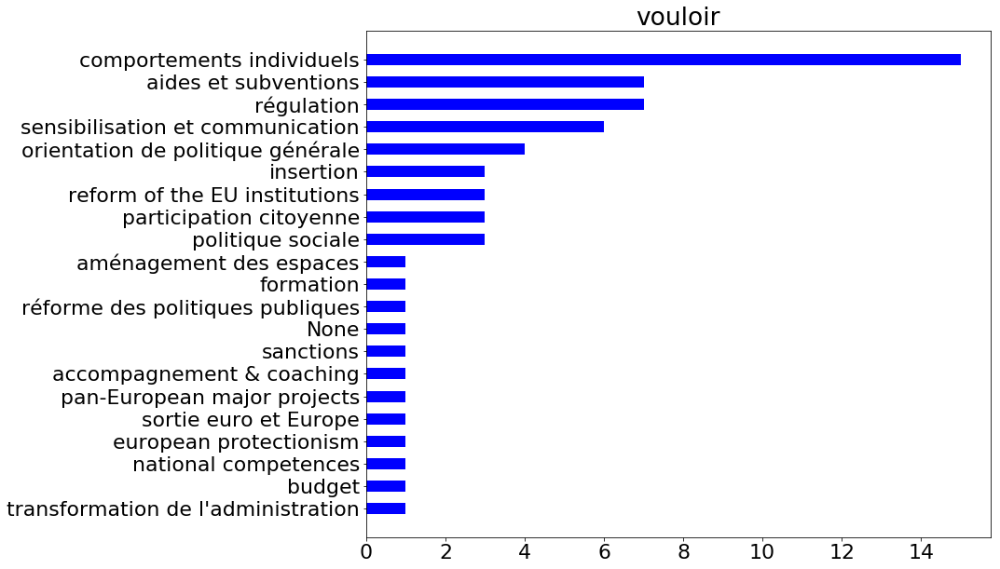



baisser
[('régulation', 47), ('taxation', 27), ('None', 15), ('réforme des politiques publiques', 13), ('budget', 7), ('orientation de politique générale', 7), ('comportements individuels', 3), ('redistribution & répartition', 3), ('harmonisation', 3), ('sensibilisation et communication', 2), ('aides et subventions', 2), ('RSE', 2), ('protectionnisme économique', 2), ('insertion', 1), ('social protection & public services', 1), ('land development', 1), ('couverture sociale', 1)]


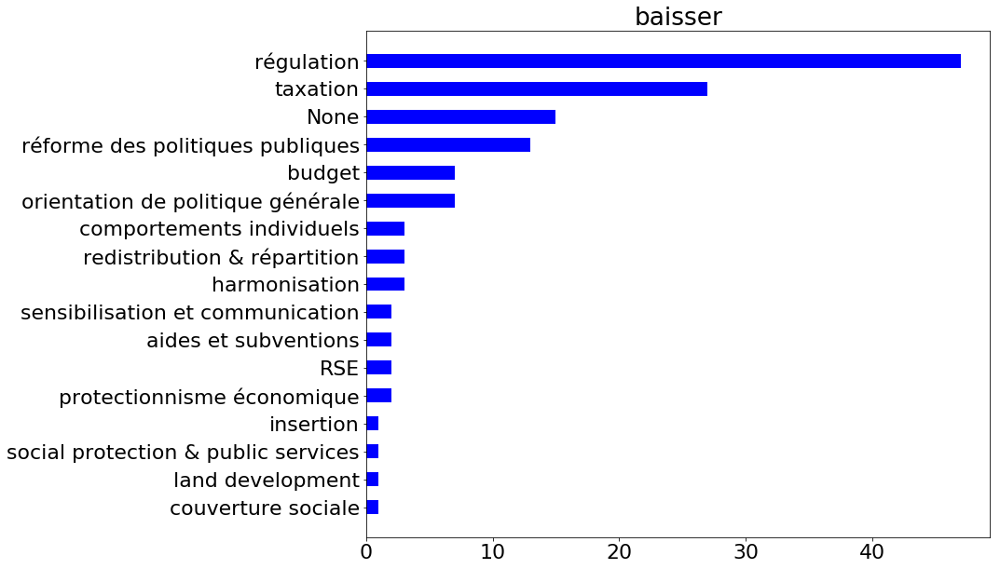



protéger
[('régulation', 19), ('orientation de politique générale', 10), ('european protectionism', 9), ('sanctions', 7), ('pan-European major projects', 6), ('réforme des politiques publiques', 5), ('sensibilisation et communication', 5), ('land development', 5), ('insertion', 4), ('protection environnementale', 4), ('social protection & public services', 4), ('coopération intergouvernementale', 4), ('None', 3), ('reform of the EU institutions', 3), ('comportements individuels', 2), ('EU competences', 2), ('politique sociale', 2), ('aménagement des espaces', 1), ('aménagement du territoire', 1), ('protectionnisme économique', 1), ('contrôle qualité', 1), ('harmonisation', 1), ('aides et subventions', 1), ('national competences', 1)]


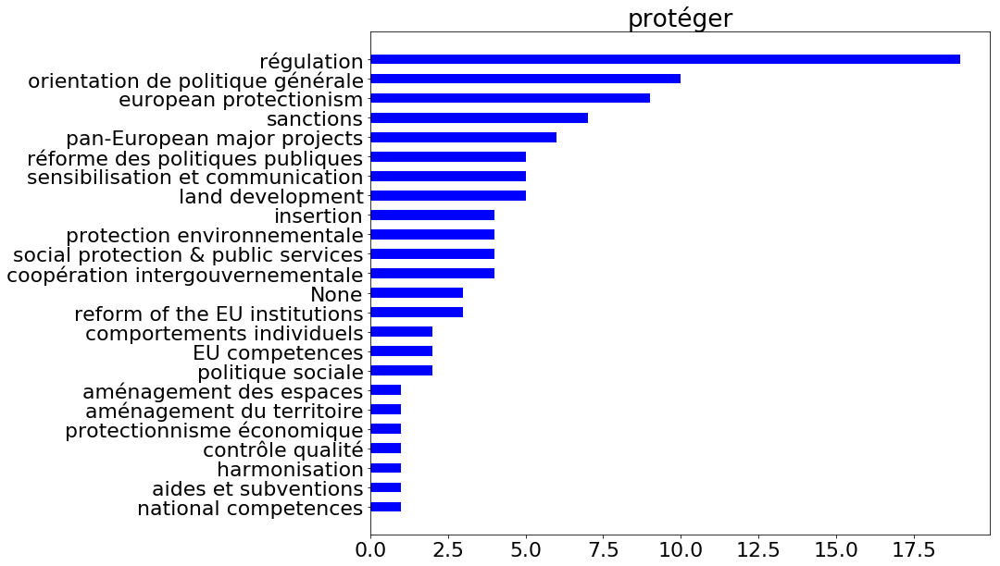



privilégier
[('comportements individuels', 181), ('None', 48), ('orientation de politique générale', 35), ('protectionnisme économique', 18), ('régulation', 18), ('sensibilisation et communication', 13), ('aides et subventions', 9), ('politique sociale', 6), ('sanctions', 5), ('harmonisation', 4), ('insertion', 3), ('european protectionism', 3), ('aménagement du territoire', 2), ('social protection & public services', 2), ('taxation', 2), ('aménagement des espaces', 1), ('RSE', 1), ('redistribution & répartition', 1)]


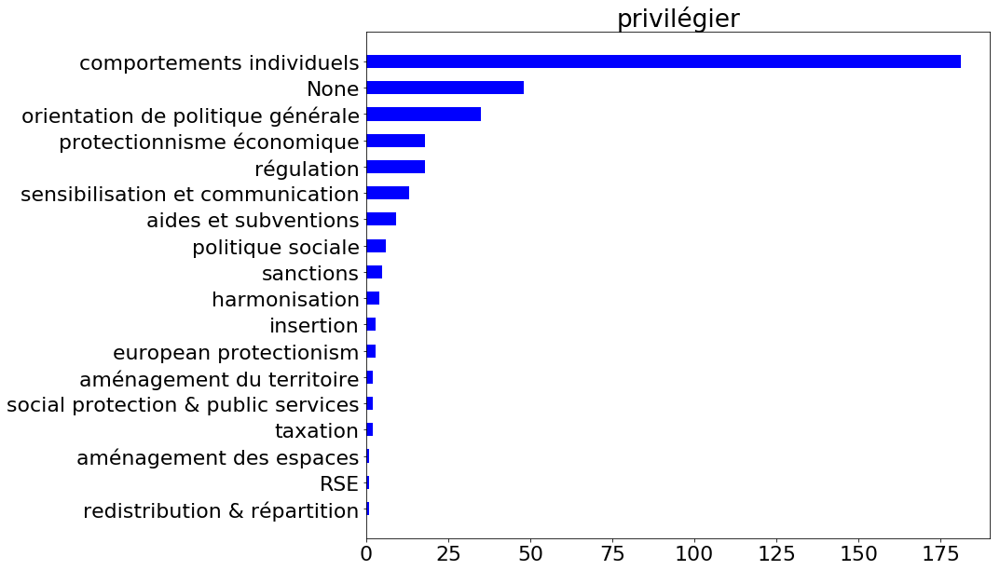



renforcer
[('régulation', 16), ('sensibilisation et communication', 12), ('sanctions', 11), ('harmonisation', 7), ('politique sociale', 7), ('coopération intergouvernementale', 6), ('orientation de politique générale', 4), ('reform of the EU institutions', 4), ('None', 4), ('budget', 3), ('EU competences', 3), ('aides et subventions', 2), ('formation', 2), ('contrôle qualité', 2), ('réforme des politiques publiques', 1), ('insertion', 1), ('comportements individuels', 1), ('protectionnisme économique', 1), ('participation citoyenne', 1), ('national competences', 1), ('social protection & public services', 1), ('land development', 1), ('european protectionism', 1), ('pan-European major projects', 1), ('couverture sociale', 1)]


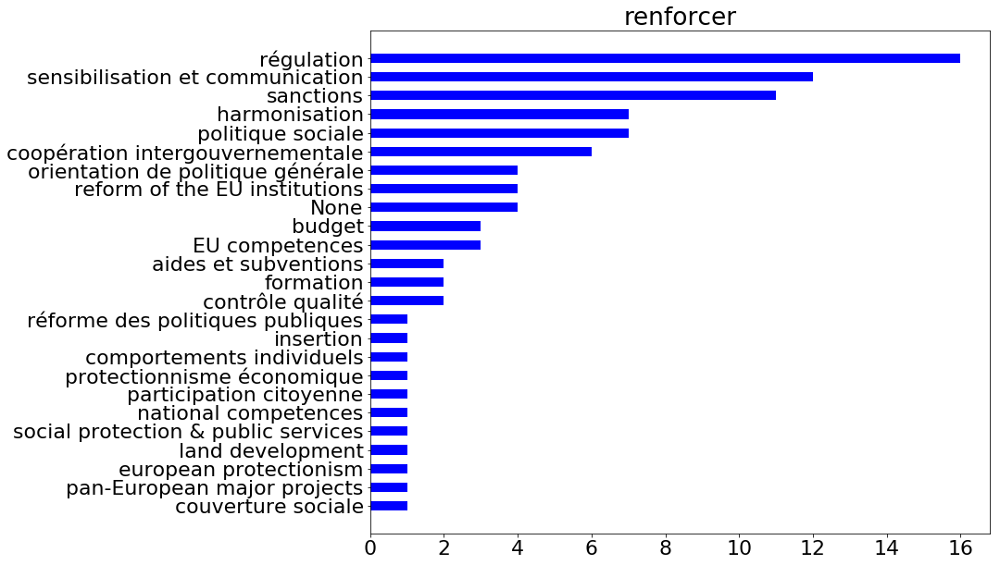



améliorer
[('régulation', 15), ('sensibilisation et communication', 15), ('formation', 11), ('orientation de politique générale', 11), ('aides et subventions', 10), ('None', 9), ('politique sociale', 9), ('réforme des politiques publiques', 7), ('insertion', 5), ('aménagement des espaces', 5), ('contrôle qualité', 4), ('RSE', 4), ('budget', 4), ('harmonisation', 3), ('comportements individuels', 3), ('participation citoyenne', 3), ('couverture sociale', 3), ('coopération intergouvernementale', 2), ('simplification', 1), ('responsabilisation', 1), ('reform of the EU institutions', 1), ('EU competences', 1), ('numérique', 1)]


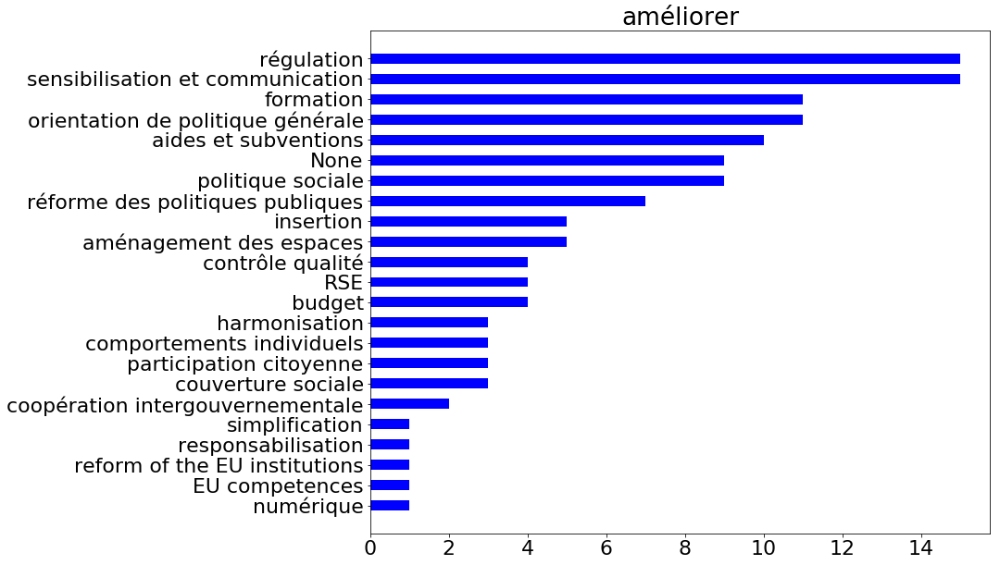



valoriser
[('budget', 47), ('sensibilisation et communication', 32), ('politique sociale', 18), ('réforme des politiques publiques', 11), ('régulation', 11), ('None', 10), ('formation', 8), ('aides et subventions', 8), ('orientation de politique générale', 5), ('comportements individuels', 4), ('taxation', 2), ('social protection & public services', 2), ('insertion', 1), ('simplification', 1), ('contrôle qualité', 1), ('protectionnisme économique', 1), ('harmonisation', 1), ('RSE', 1), ('participation citoyenne', 1), ('intergénérationnel', 1)]


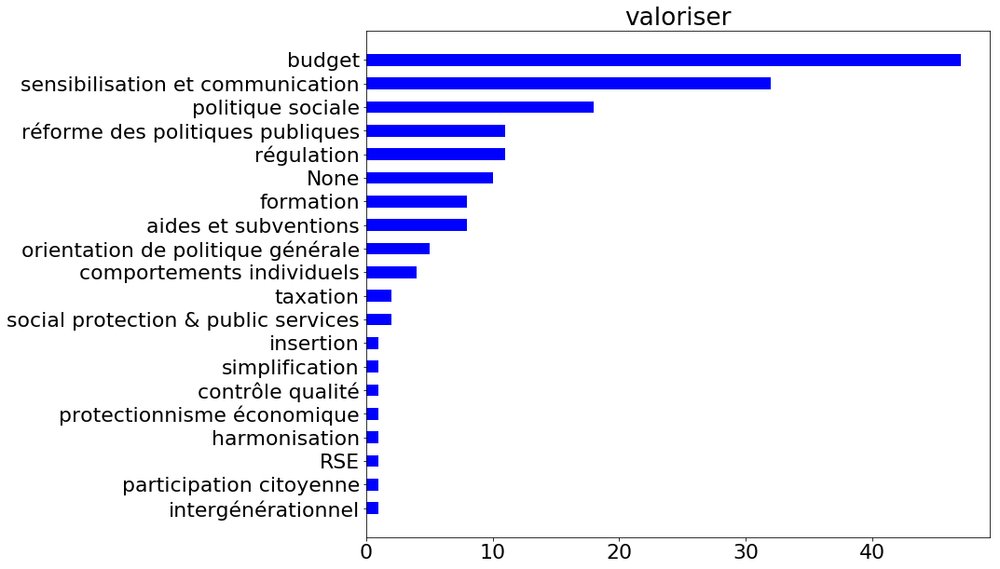



cesser
[('sensibilisation et communication', 16), ('comportements individuels', 16), ('régulation', 12), ('réforme des politiques publiques', 11), ('orientation de politique générale', 8), ('None', 7), ('national competences', 4), ('insertion', 3), ('aides et subventions', 3), ('sortie euro et Europe', 3), ('protectionnisme économique', 2), ('sanctions', 2), ('participation citoyenne', 2), ('harmonisation', 2), ('social protection & public services', 2), ('simplification', 1), ('aménagement du territoire', 1), ('reform of the EU institutions', 1), ('politique sociale', 1)]


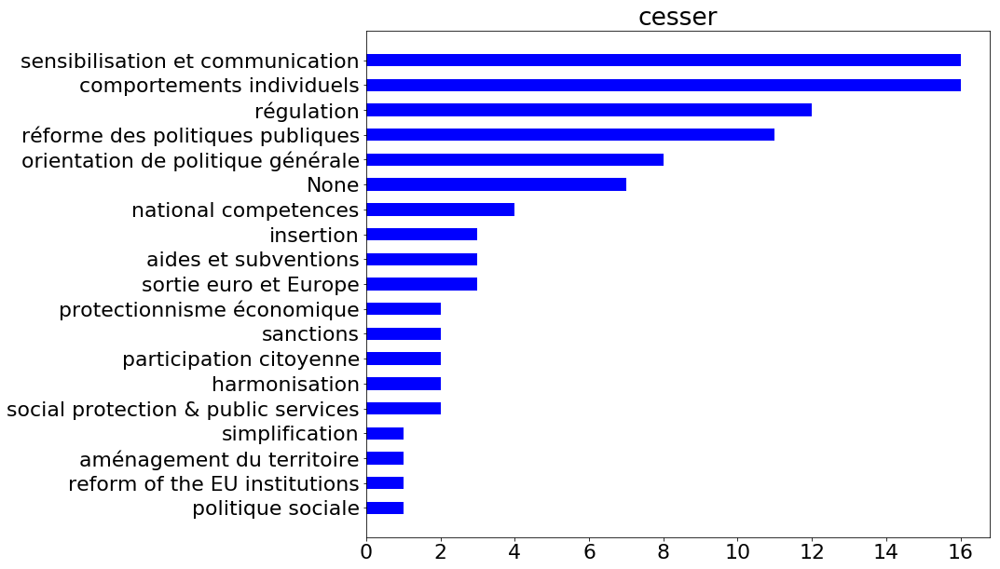



proposer
[('None', 90), ('régulation', 60), ('sensibilisation et communication', 59), ('orientation de politique générale', 53), ('comportements individuels', 28), ('participation citoyenne', 23), ('politique sociale', 21), ('aides et subventions', 17), ('réforme des politiques publiques', 16), ('harmonisation', 13), ('insertion', 10), ('RSE', 9), ('protectionnisme économique', 8), ('budget', 7), ('aménagement du territoire', 7), ('contrôle qualité', 6), ('accompagnement & coaching', 6), ('intergénérationnel', 5), ('aménagement des espaces', 4), ('redistribution & répartition', 4), ('sanctions', 4), ('reform of the EU institutions', 4), ('couverture sociale', 4), ('taxation', 2), ('recherche', 2), ('simplification', 1), ('justice', 1), ('protection environnementale', 1), ('EU competences', 1), ('national competences', 1), ('social protection & public services', 1), ('pan-European major projects', 1), ('sortie euro et Europe', 1), ('diplomatic decisions & treaties', 1), ('fiscalité & 

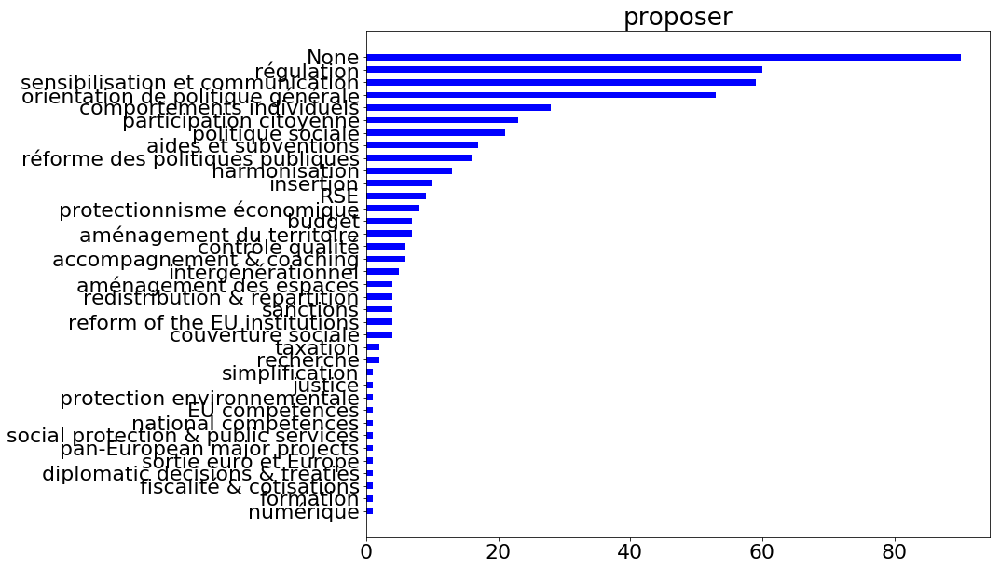



remettre
[('régulation', 32), ('national competences', 16), ('sensibilisation et communication', 12), ('orientation de politique générale', 10), ('None', 6), ('comportements individuels', 5), ('réforme des politiques publiques', 3), ('reform of the EU institutions', 3), ('sortie euro et Europe', 3), ('taxation', 3), ('politique sociale', 3), ('aides et subventions', 2), ('sanctions', 2), ('aménagement du territoire', 2), ('participation citoyenne', 2), ('european protectionism', 2), ('harmonisation', 2), ('insertion', 1), ('redistribution & répartition', 1), ('protection environnementale', 1), ('couverture sociale', 1)]


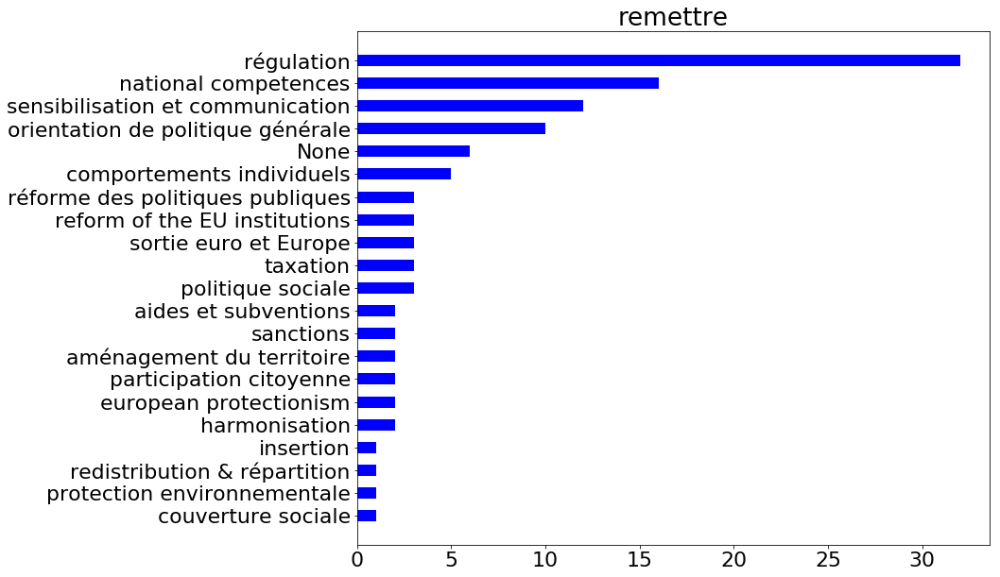



garantir
[('réforme des politiques publiques', 18), ('orientation de politique générale', 12), ('aides et subventions', 7), ('régulation', 7), ('None', 5), ('harmonisation', 4), ('aménagement des espaces', 3), ('budget', 3), ('formation', 2), ('sensibilisation et communication', 2), ('national competences', 2), ('EU competences', 2), ('insertion', 1), ('sanctions', 1), ('action européenne', 1), ('protectionnisme économique', 1), ('contrôle qualité', 1), ('fiscalité & cotisations', 1), ('politique sociale', 1)]


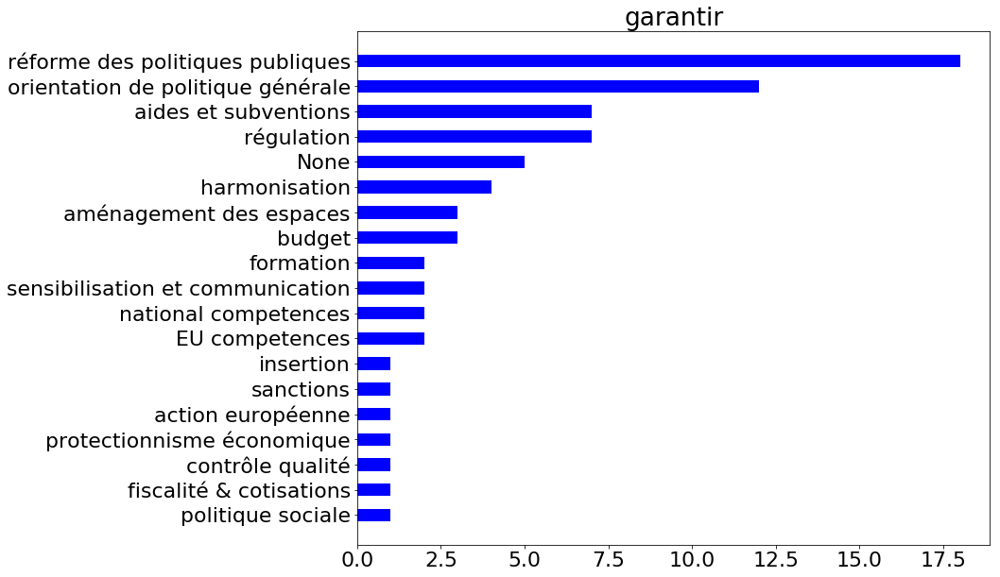



demande
[('budget', 37), ('réforme des politiques publiques', 5), ('aides et subventions', 4), ('sensibilisation et communication', 3), ('régulation', 3), ('politique sociale', 3), ('simplification', 2), ('harmonisation', 2), ('None', 2), ('orientation de politique générale', 2), ('formation', 2), ('sanctions', 1), ('insertion', 1), ('participation citoyenne', 1), ('sortie euro et Europe', 1), ("transformation de l'administration", 1)]


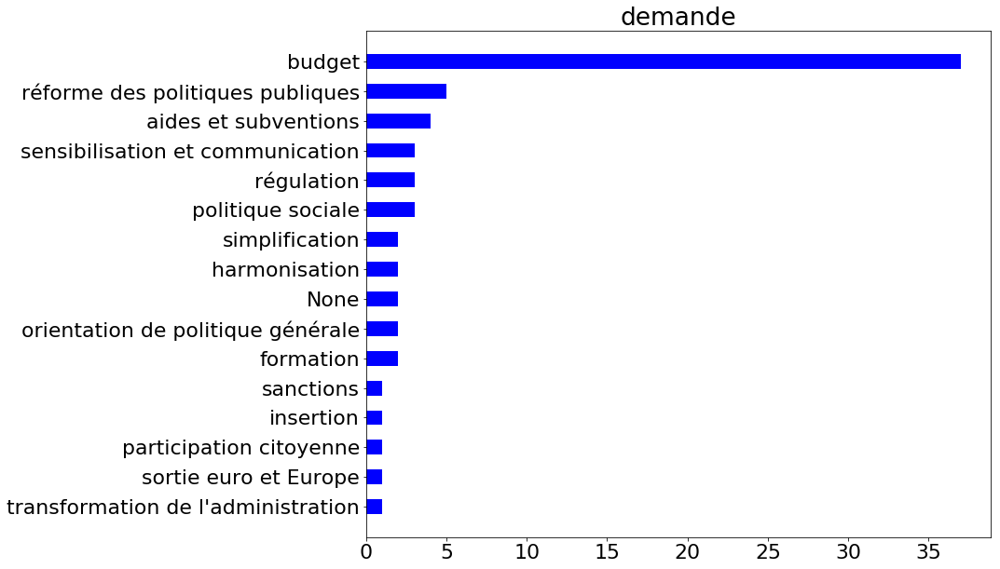



priver
[('régulation', 36), ('réforme des politiques publiques', 7), ('budget', 6), ('sanctions', 5), ('orientation de politique générale', 5), ('aménagement des espaces', 4), ('reform of the EU institutions', 4), ('politique sociale', 4), ('insertion', 3), ('sensibilisation et communication', 3), ('aides et subventions', 3), ('comportements individuels', 2), ('None', 2), ('coopération intergouvernementale', 2), ('EU competences', 2), ('national competences', 2), ('simplification', 1), ('redistribution & répartition', 1), ('contrôle qualité', 1), ('aménagement du territoire', 1), ('formation', 1)]


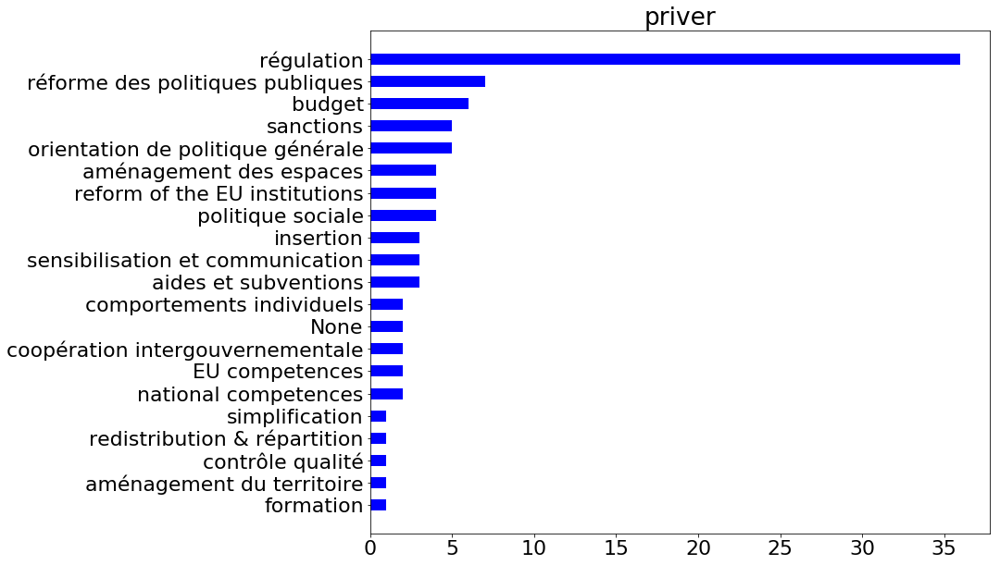



subventionner
[('aides et subventions', 17), ('réforme des politiques publiques', 6), ('régulation', 4), ('sanctions', 2), ('protectionnisme économique', 2), ('taxation', 2), ('simplification', 1), ('redistribution & répartition', 1), ('None', 1)]


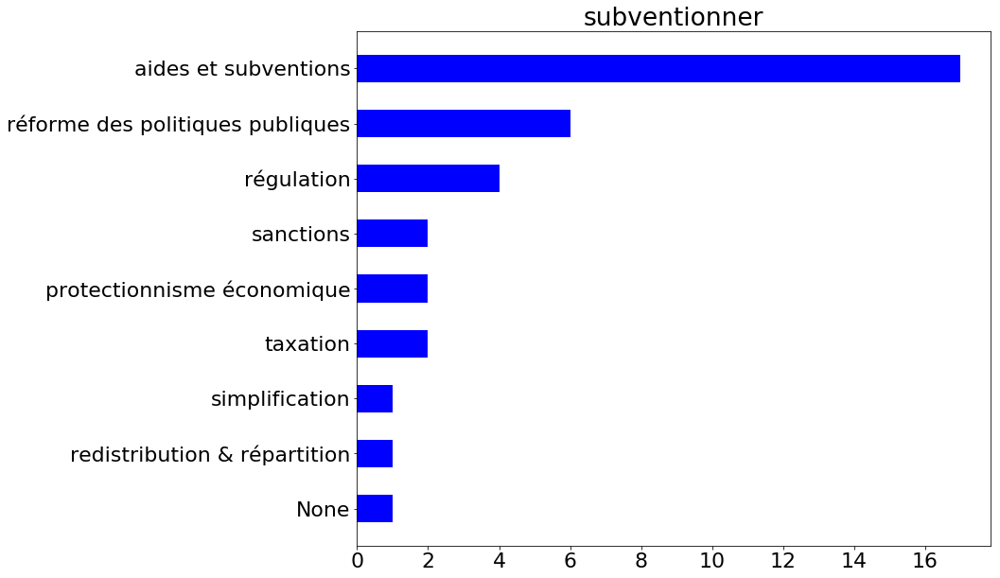



revenir
[('régulation', 32), ('comportements individuels', 23), ('None', 18), ('orientation de politique générale', 15), ('sortie euro et Europe', 15), ('sensibilisation et communication', 7), ('réforme des politiques publiques', 6), ('national competences', 6), ('harmonisation', 5), ('aides et subventions', 5), ('reform of the EU institutions', 5), ('redistribution & répartition', 3), ('RSE', 3), ('sanctions', 3), ('coopération intergouvernementale', 3), ('taxation', 2), ('aménagement du territoire', 2), ('protectionnisme économique', 2), ('simplification', 2), ('participation citoyenne', 2), ('social protection & public services', 2), ('insertion', 1), ('aménagement des espaces', 1), ('budget', 1), ('EU competences', 1), ('european protectionism', 1), ('fiscalité & cotisations', 1), ('intergénérationnel', 1), ('politique sociale', 1)]


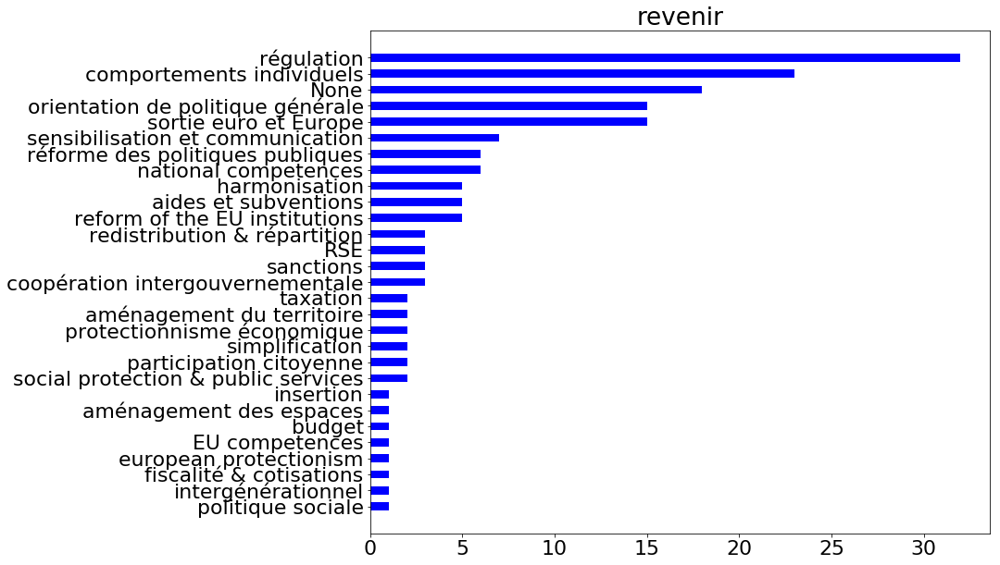



choisir
[('comportements individuels', 14), ('sensibilisation et communication', 10), ('orientation de politique générale', 8), ('None', 5), ('reform of the EU institutions', 5), ('national competences', 4), ('régulation', 4), ('politique sociale', 3), ('réforme des politiques publiques', 2), ('participation citoyenne', 2), ('budget', 2), ('insertion', 1), ('action européenne', 1), ('RSE', 1), ('pan-European major projects', 1), ('harmonisation', 1)]


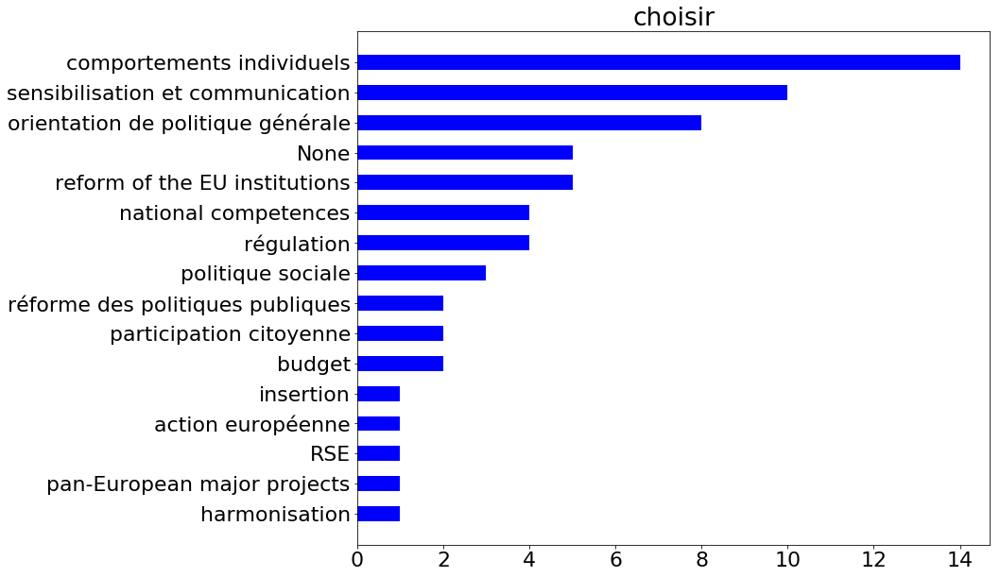



exclure
[('sanctions', 11), ('régulation', 4), ('réforme des politiques publiques', 3), ('insertion', 1), ('formation', 1), ('sensibilisation et communication', 1), ('harmonisation', 1), ('reform of the EU institutions', 1), ('sortie euro et Europe', 1)]


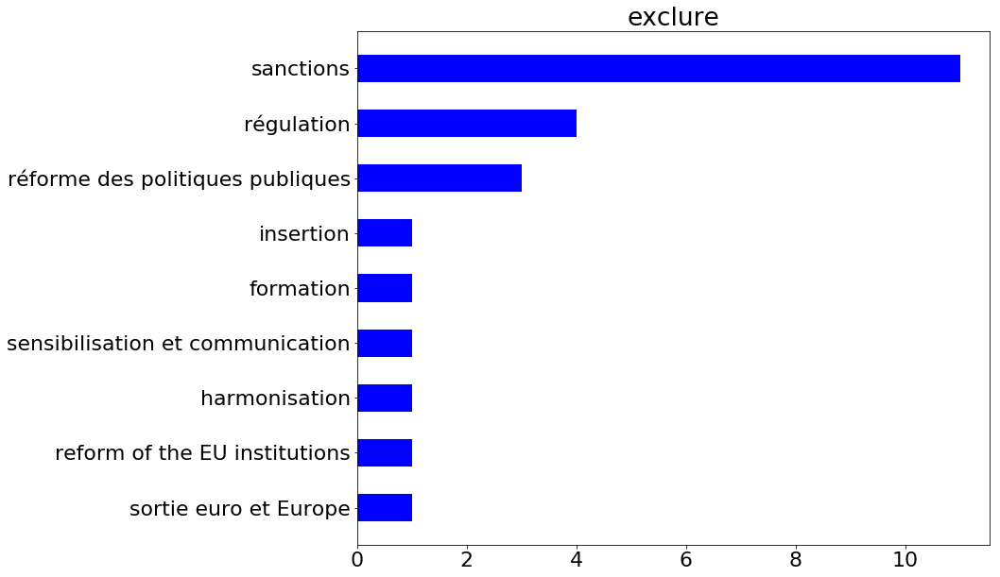



mieux former
[('formation', 18), ('insertion', 2), ('sensibilisation et communication', 2), ('budget', 1)]


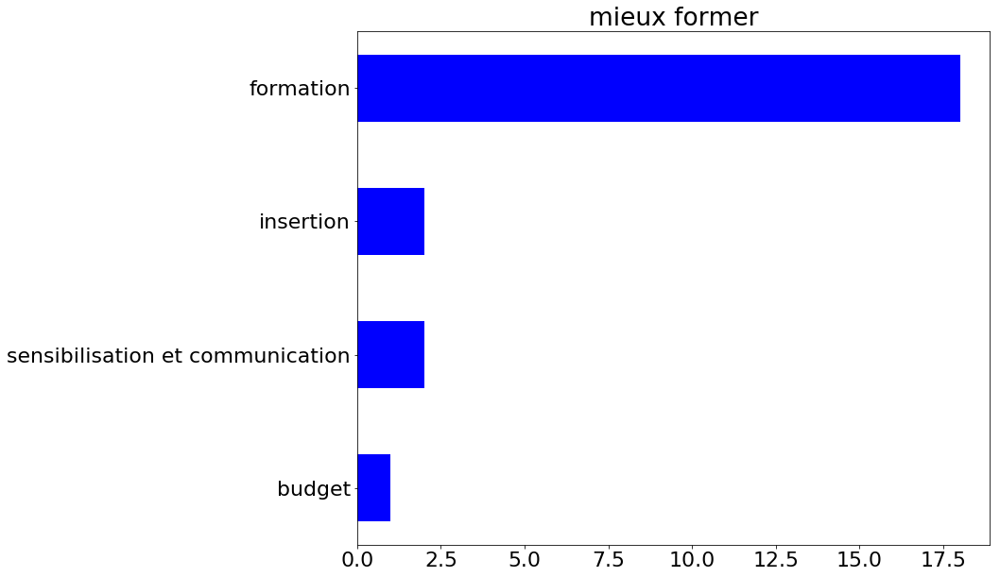



apprendre
[('sensibilisation et communication', 155), ('comportements individuels', 69), ('None', 7), ('orientation de politique générale', 5), ('régulation', 5), ('réforme des politiques publiques', 4), ('accompagnement & coaching', 3), ('responsabilisation', 3), ('harmonisation', 3), ('aménagement du territoire', 2), ('participation citoyenne', 2), ('insertion', 1), ('e-santé', 1)]


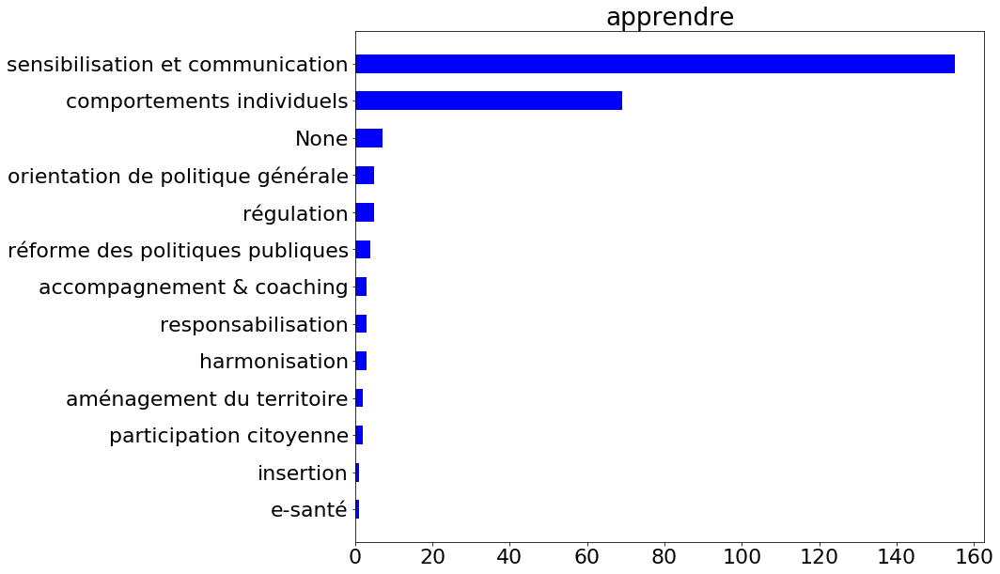



verser
[('réforme des politiques publiques', 12), ('aides et subventions', 7), ('régulation', 7), ('taxation', 2), ('reform of the EU institutions', 2), ('formation', 1), ('harmonisation', 1), ('social protection & public services', 1), ('fiscalité & cotisations', 1), ('couverture sociale', 1)]


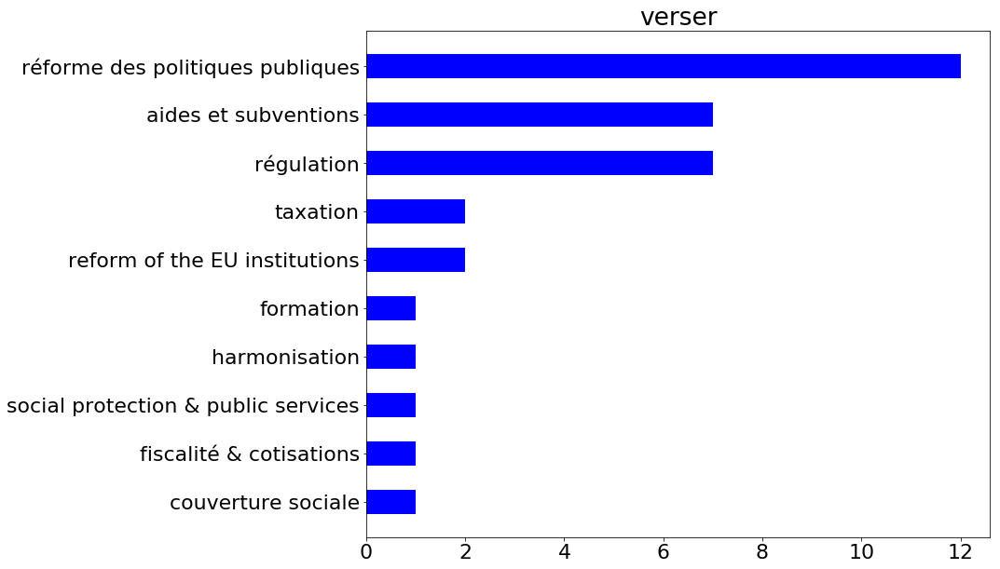



harmoniser
[('harmonisation', 152), ('reform of the EU institutions', 6), ('sensibilisation et communication', 4), ('sanctions', 3), ('régulation', 2), ('orientation de politique générale', 2), ('réforme des politiques publiques', 1), ('social protection & public services', 1), ('fiscalité & cotisations', 1), ('couverture sociale', 1)]


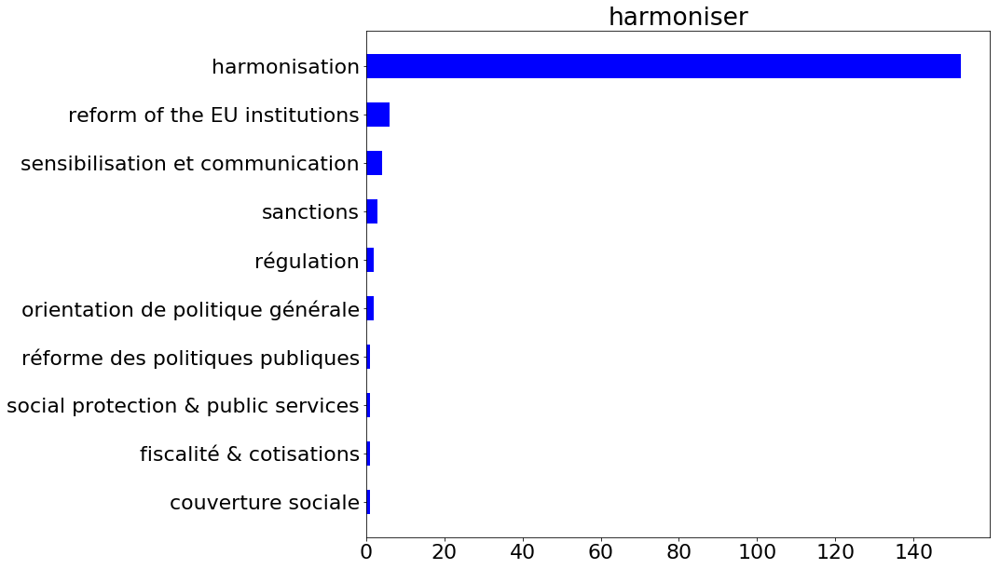



passer
[('régulation', 18), ('comportements individuels', 16), ('sensibilisation et communication', 10), ('aides et subventions', 9), ('orientation de politique générale', 9), ('reform of the EU institutions', 6), ('réforme des politiques publiques', 5), ('None', 5), ('participation citoyenne', 3), ('taxation', 2), ('pan-European major projects', 2), ('budget', 2), ('national competences', 2), ('insertion', 1), ('aménagement des espaces', 1), ('accompagnement & coaching', 1), ('EU competences', 1), ('sanctions', 1), ('coopération intergouvernementale', 1), ('harmonisation', 1), ('european protectionism', 1), ('RSE', 1), ('intergénérationnel', 1)]


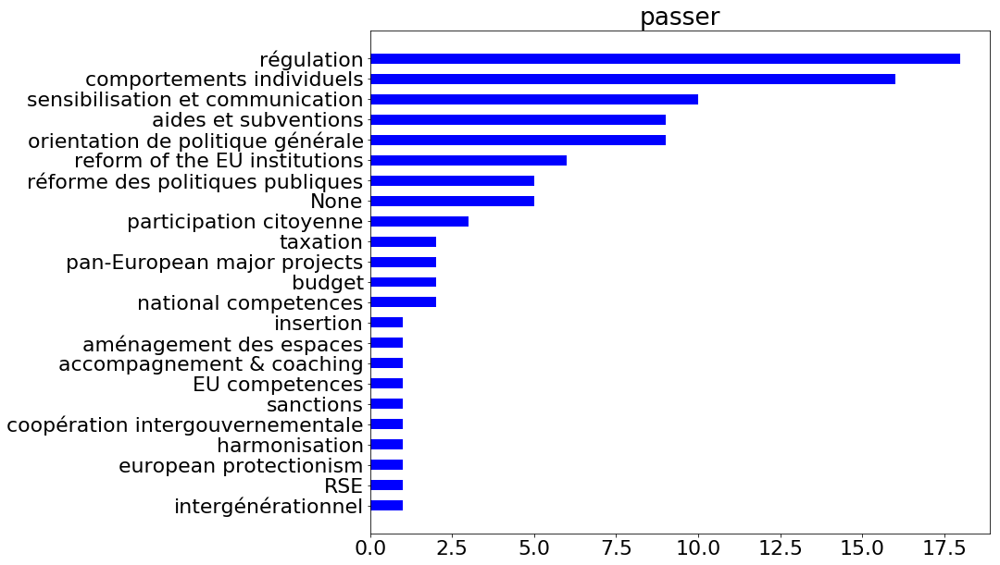



supprimer
[('régulation', 128), ('sortie euro et Europe', 58), ('reform of the EU institutions', 55), ('réforme des politiques publiques', 36), ('sanctions', 34), ('taxation', 24), ('comportements individuels', 14), ('orientation de politique générale', 14), ('None', 13), ('simplification', 11), ('harmonisation', 10), ('budget', 9), ('sensibilisation et communication', 5), ('social protection & public services', 5), ('aides et subventions', 4), ('diplomatic decisions & treaties', 4), ('protectionnisme économique', 3), ('participation citoyenne', 3), ('aménagement des espaces', 2), ('protection environnementale', 2), ('national competences', 2), ('fiscalité & cotisations', 2), ('redistribution & répartition', 1), ('pan-European major projects', 1), ('numérique', 1)]


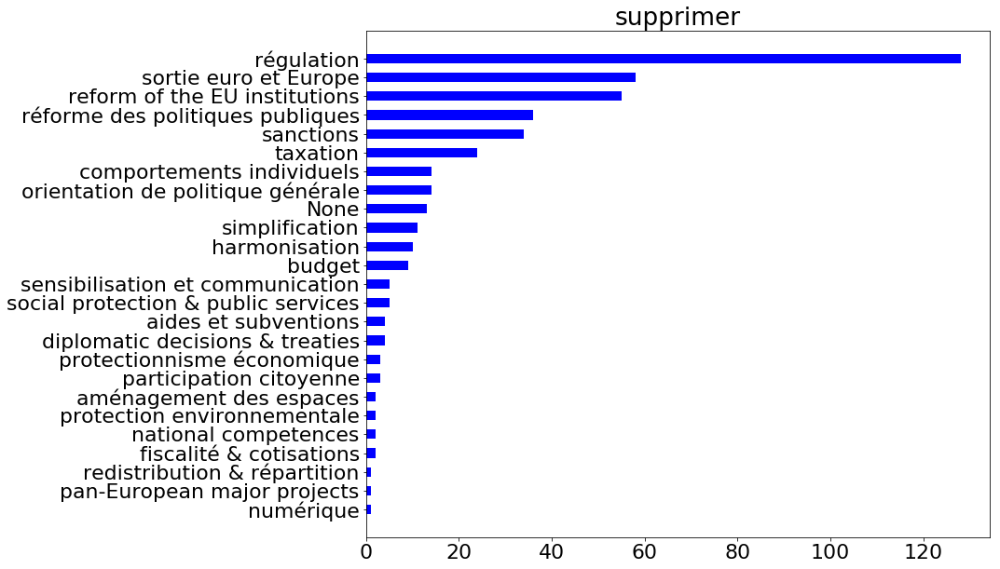



réduire
[('régulation', 70), ('comportements individuels', 64), ('reform of the EU institutions', 23), ('taxation', 19), ('None', 17), ('réforme des politiques publiques', 14), ('orientation de politique générale', 14), ('budget', 14), ('sensibilisation et communication', 12), ('simplification', 12), ('aménagement des espaces', 11), ('harmonisation', 10), ('RSE', 5), ('aides et subventions', 5), ('sanctions', 4), ('politique sociale', 4), ('protectionnisme économique', 3), ('couverture sociale', 3), ('participation citoyenne', 2), ('insertion', 2), ('aménagement du territoire', 2), ('protection environnementale', 2), ('diplomatic decisions & treaties', 2), ('EU competences', 2), ('contrôle qualité', 1), ('accompagnement & coaching', 1), ('national competences', 1), ('pan-European major projects', 1), ('european protectionism', 1), ('intergénérationnel', 1)]


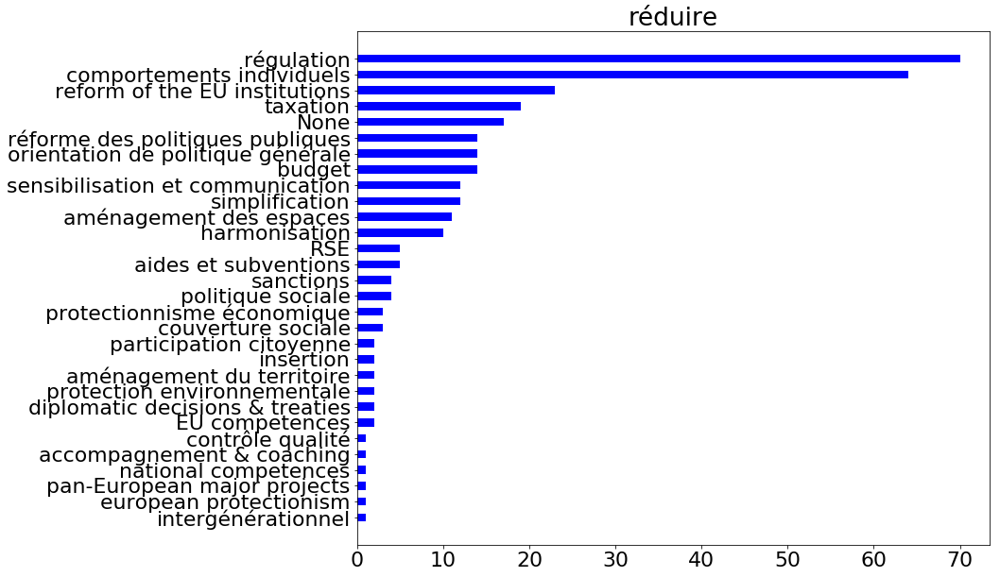



monter
[('réforme des politiques publiques', 13), ('sanctions', 2), ('aménagement des espaces', 2), ('budget', 2), ('régulation', 2), ('social protection & public services', 2), ('simplification', 1), ('participation citoyenne', 1), ('reform of the EU institutions', 1), ('coopération intergouvernementale', 1), ('harmonisation', 1), ("transformation de l'administration", 1), ('couverture sociale', 1)]


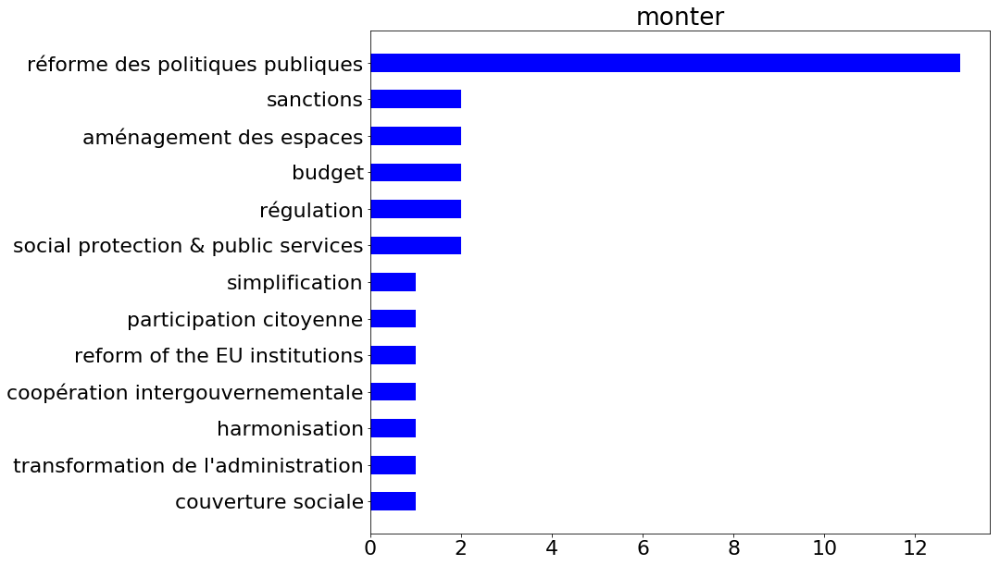



taxer
[('taxation', 163), ('régulation', 8), ('protectionnisme économique', 7), ('sanctions', 4), ('sensibilisation et communication', 3), ('orientation de politique générale', 3), ('harmonisation', 3), ('réforme des politiques publiques', 1), ('EU competences', 1), ('european protectionism', 1), ('sortie euro et Europe', 1)]


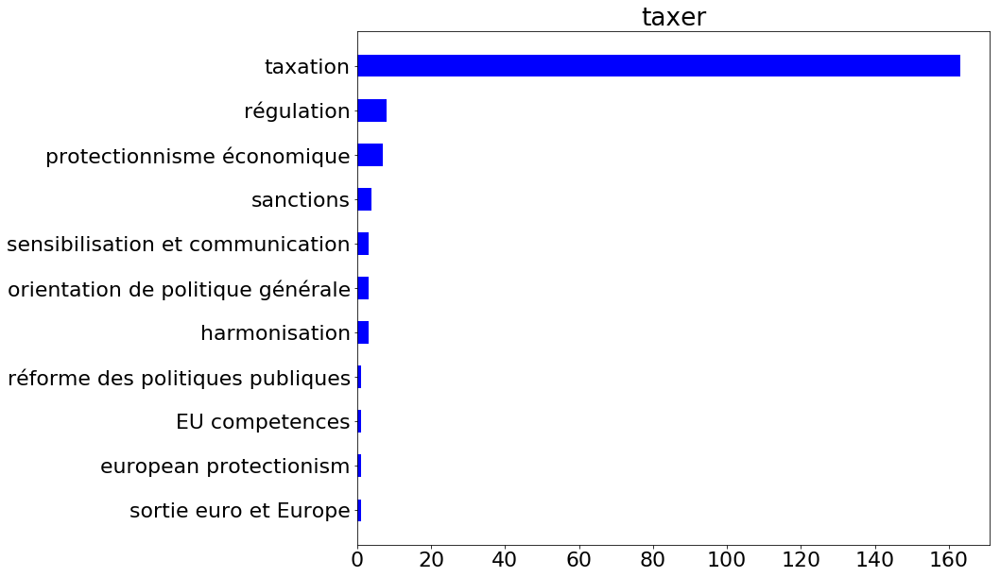



limiter
[('régulation', 99), ('comportements individuels', 24), ('reform of the EU institutions', 14), ('orientation de politique générale', 13), ('None', 11), ('harmonisation', 9), ('taxation', 8), ('sanctions', 7), ('protectionnisme économique', 7), ('sensibilisation et communication', 6), ('european protectionism', 5), ('aides et subventions', 4), ('aménagement du territoire', 3), ('RSE', 3), ('budget', 3), ('land development', 3), ('aménagement des espaces', 2), ('protection environnementale', 2), ('contrôle qualité', 2), ('participation citoyenne', 2), ('réforme des politiques publiques', 1), ('redistribution & répartition', 1), ('sortie euro et Europe', 1), ('diplomatic decisions & treaties', 1), ('national competences', 1), ('social protection & public services', 1), ('politique sociale', 1)]


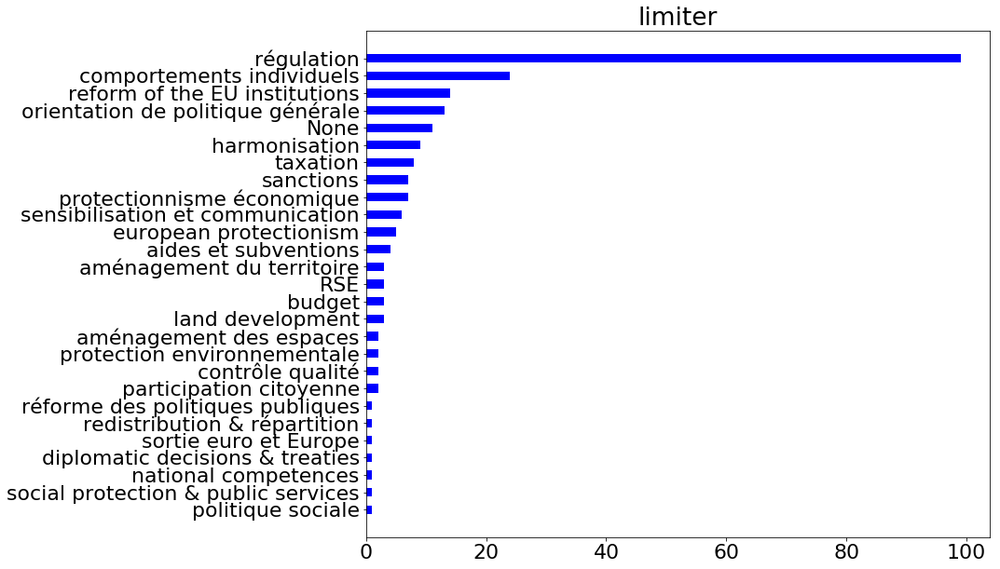



aller
[('comportements individuels', 15), ('orientation de politique générale', 8), ('sensibilisation et communication', 6), ('réforme des politiques publiques', 5), ('régulation', 4), ('politique sociale', 4), ('insertion', 3), ('aides et subventions', 3), ('harmonisation', 3), ('None', 3), ('formation', 2), ('taxation', 2), ('reform of the EU institutions', 2), ('budget', 2), ('sanctions', 1), ('protectionnisme économique', 1), ('aménagement du territoire', 1), ('accompagnement & coaching', 1), ('sortie euro et Europe', 1), ('coopération intergouvernementale', 1), ('participation citoyenne', 1), ('couverture sociale', 1)]


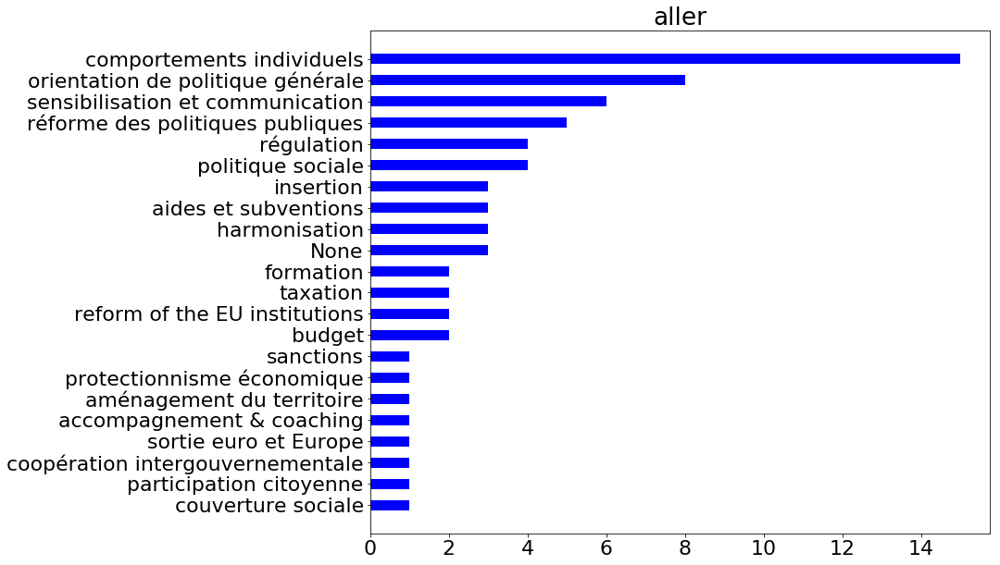



demander
[('régulation', 11), ('sensibilisation et communication', 5), ('sanctions', 4), ('participation citoyenne', 4), ('réforme des politiques publiques', 3), ('None', 2), ('simplification', 2), ('comportements individuels', 2), ('insertion', 1), ('budget', 1), ('aménagement des espaces', 1), ('redistribution & répartition', 1), ('aides et subventions', 1), ('accompagnement & coaching', 1), ('reform of the EU institutions', 1), ('national competences', 1), ('diplomatic decisions & treaties', 1), ('formation', 1), ('fiscalité & cotisations', 1), ('RSE', 1), ("transformation de l'administration", 1)]


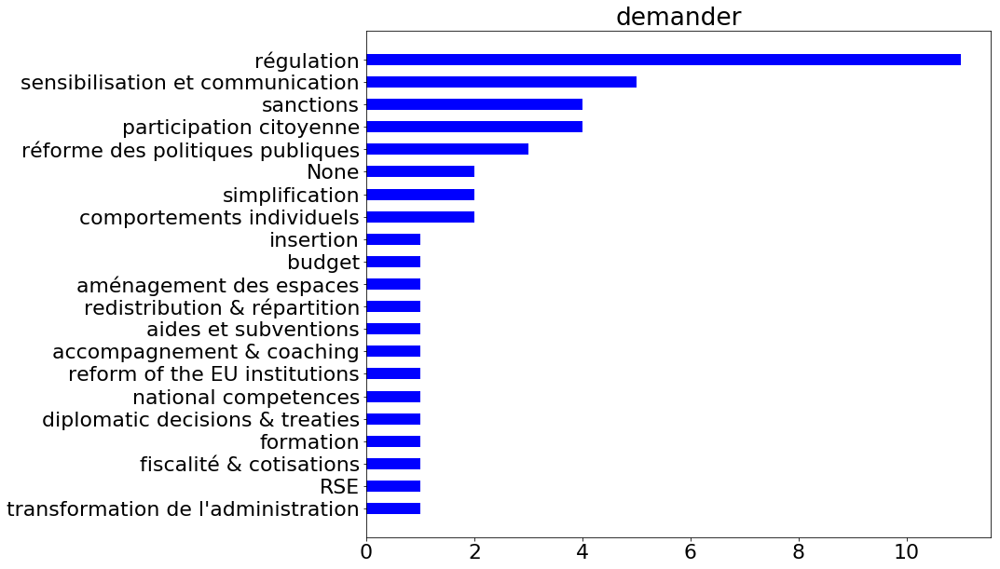



occuper
[('aides et subventions', 13), ('budget', 11), ('politique sociale', 8), ('réforme des politiques publiques', 7), ('formation', 7), ('régulation', 6), ('sensibilisation et communication', 4), ('comportements individuels', 3), ('national competences', 3), ('insertion', 2), ('None', 2), ('sanctions', 2), ('orientation de politique générale', 2), ('intergénérationnel', 2), ('aménagement des espaces', 1), ('accompagnement & coaching', 1), ('couverture sociale', 1), ('RSE', 1), ('participation citoyenne', 1)]


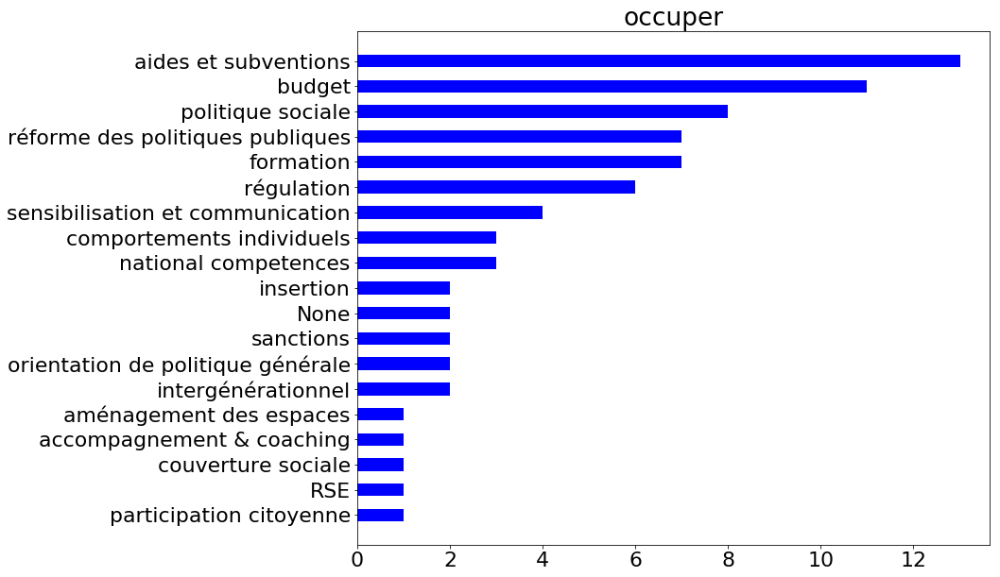



indiquer
[('sensibilisation et communication', 24), ('régulation', 12), ('orientation de politique générale', 1), ('aménagement des espaces', 1), ('contrôle qualité', 1), ('réforme des politiques publiques', 1), ('politique sociale', 1)]


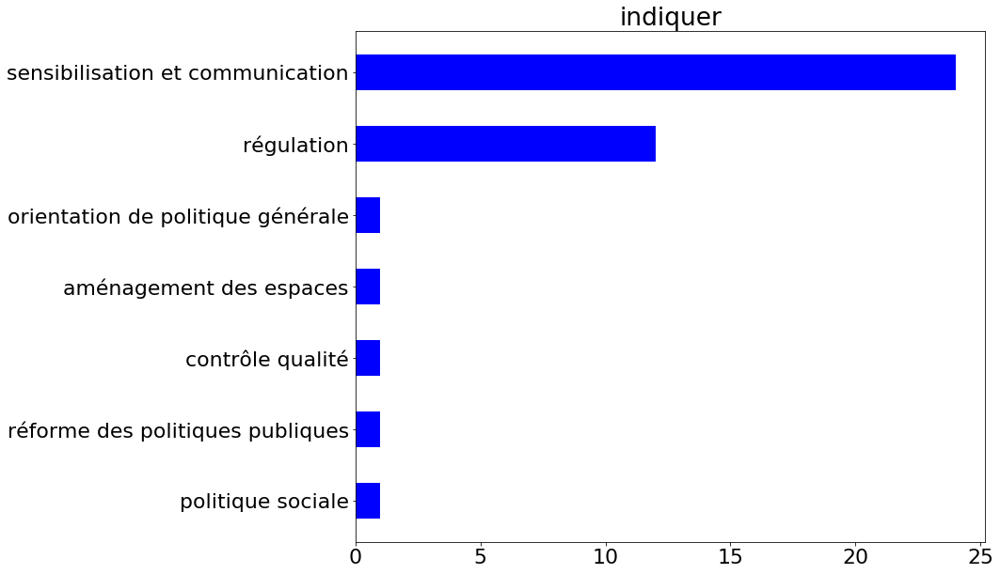



inciter
[('sensibilisation et communication', 23), ('None', 10), ('régulation', 8), ('taxation', 8), ('orientation de politique générale', 4), ('comportements individuels', 4), ('aides et subventions', 3), ('RSE', 3), ('formation', 2), ('sanctions', 2), ('aménagement des espaces', 1), ('réforme des politiques publiques', 1), ('simplification', 1), ('aménagement du territoire', 1), ('land development', 1), ('budget', 1), ('politique sociale', 1)]


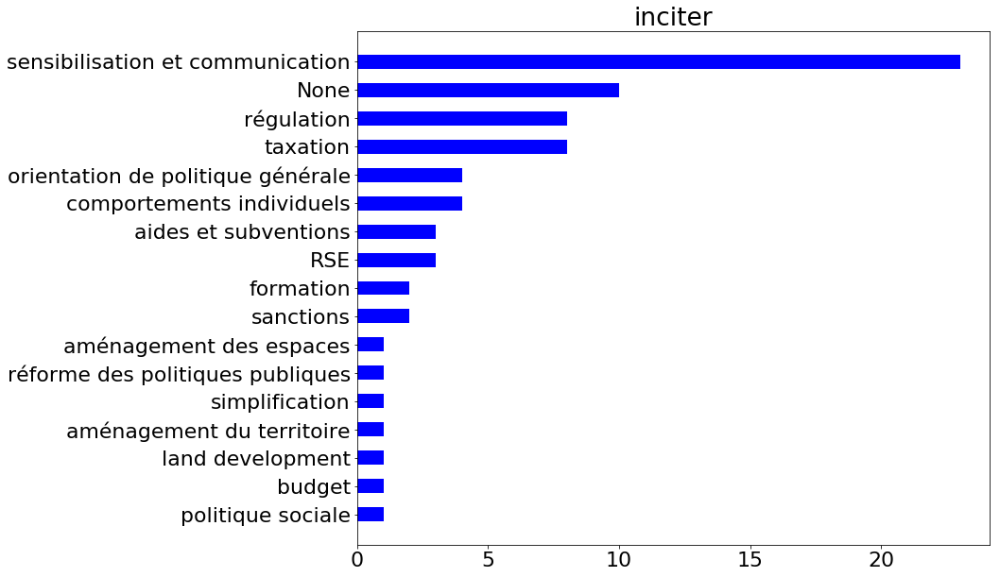



équilibrer
[('sensibilisation et communication', 21), ('comportements individuels', 11), ('None', 4), ('régulation', 4), ('orientation de politique générale', 3), ('réforme des politiques publiques', 1), ('redistribution & répartition', 1), ('harmonisation', 1), ('politique sociale', 1)]


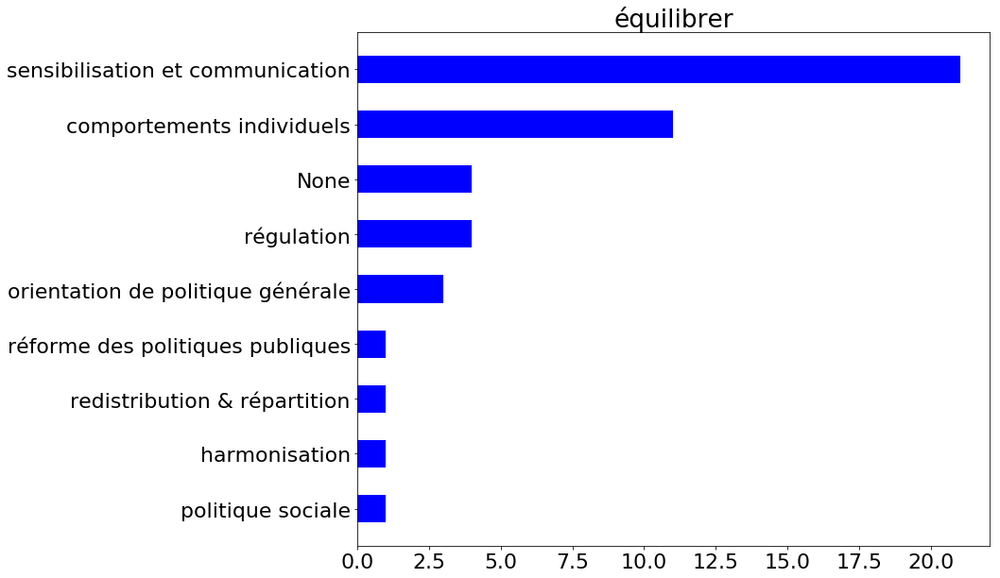



contrôler
[('régulation', 47), ('sanctions', 9), ('contrôle qualité', 4), ('taxation', 4), ('reform of the EU institutions', 3), ('aménagement des espaces', 1), ('protectionnisme économique', 1), ('participation citoyenne', 1), ('sortie euro et Europe', 1), ('simplification', 1), ('national competences', 1), ('european protectionism', 1), ('budget', 1), ('pan-European major projects', 1), ('sensibilisation et communication', 1), ('politique sociale', 1), ('aides et subventions', 1)]


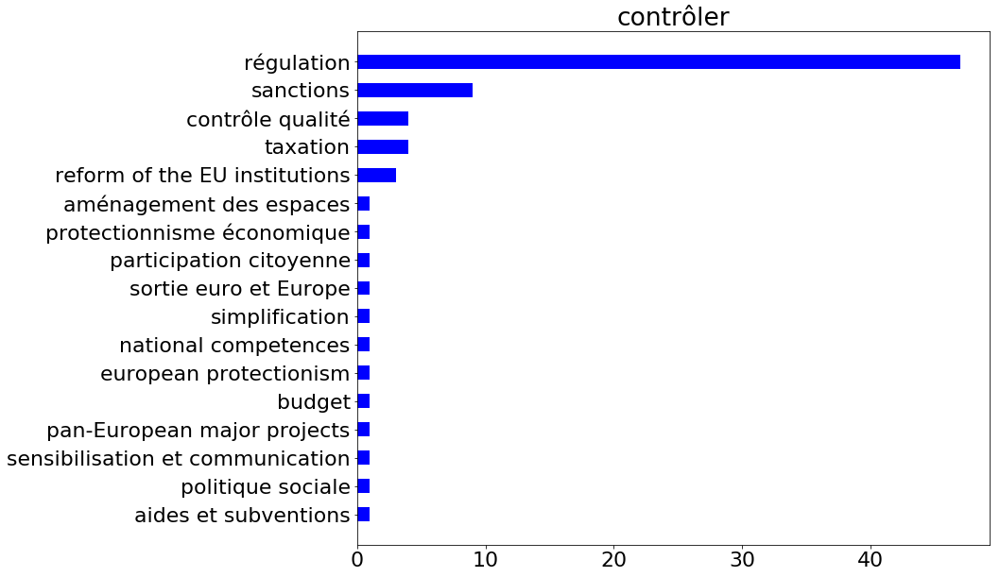



connaître
[('sensibilisation et communication', 23), ('comportements individuels', 6), ('politique sociale', 5), ('régulation', 4), ('réforme des politiques publiques', 3), ('participation citoyenne', 2), ('formation', 2), ('None', 2), ('coopération intergouvernementale', 2), ('aides et subventions', 1), ('orientation de politique générale', 1), ('aménagement des espaces', 1), ('aménagement du territoire', 1), ('accompagnement & coaching', 1), ('budget', 1)]


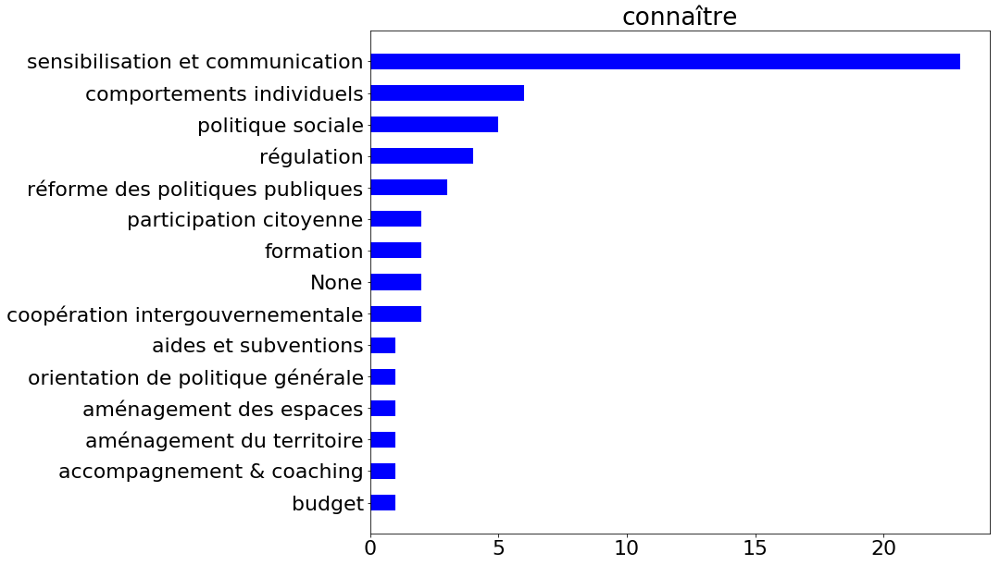



dire
[('sensibilisation et communication', 16), ('None', 6), ('régulation', 5), ('sanctions', 4), ('orientation de politique générale', 4), ('sortie euro et Europe', 4), ('insertion', 3), ('réforme des politiques publiques', 3), ('comportements individuels', 3), ('participation citoyenne', 3), ('aides et subventions', 2), ('reform of the EU institutions', 2), ('harmonisation', 2), ('aménagement des espaces', 1), ('redistribution & répartition', 1), ('accompagnement & coaching', 1), ('taxation', 1), ('pan-European major projects', 1), ('EU competences', 1), ('budget', 1), ('politique sociale', 1)]


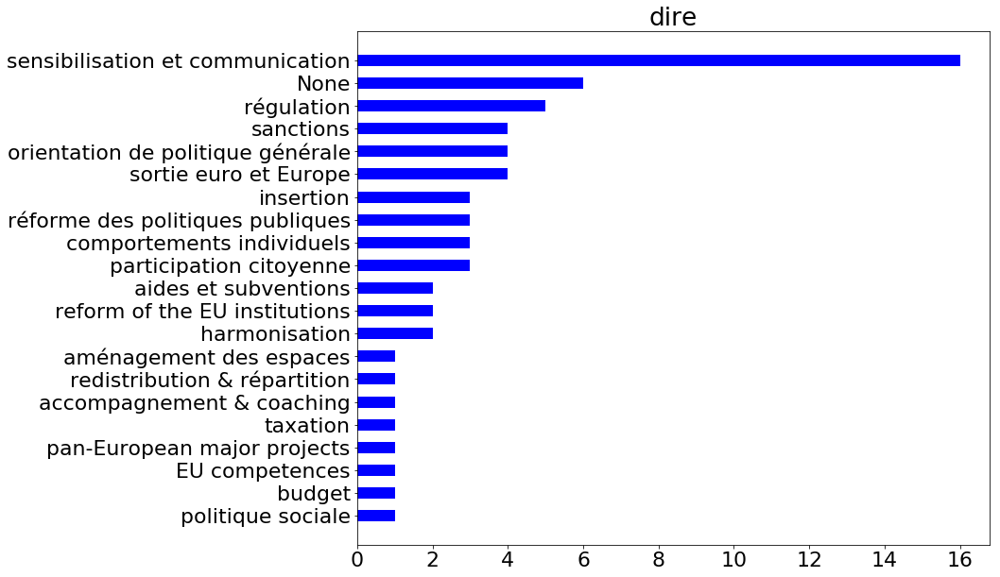



oublier
[('sensibilisation et communication', 11), ('comportements individuels', 5), ('formation', 3), ('politique sociale', 2), ('insertion', 1), ('None', 1), ('sortie euro et Europe', 1)]


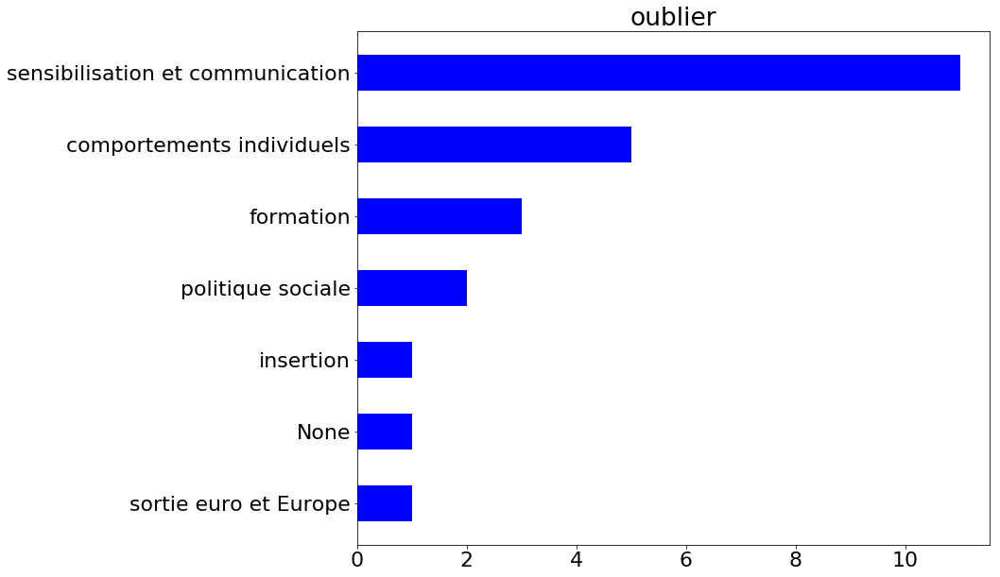



diminuer
[('comportements individuels', 38), ('régulation', 37), ('reform of the EU institutions', 15), ('orientation de politique générale', 12), ('réforme des politiques publiques', 7), ('sensibilisation et communication', 7), ('taxation', 5), ('None', 5), ('simplification', 4), ('aides et subventions', 3), ('protectionnisme économique', 3), ('contrôle qualité', 3), ('budget', 2), ('RSE', 2), ('participation citoyenne', 2), ('insertion', 1), ('redistribution & répartition', 1), ('national competences', 1), ('sanctions', 1), ('harmonisation', 1), ('social protection & public services', 1), ('formation', 1), ('politique sociale', 1), ('intergénérationnel', 1), ('fiscalité & cotisations', 1)]


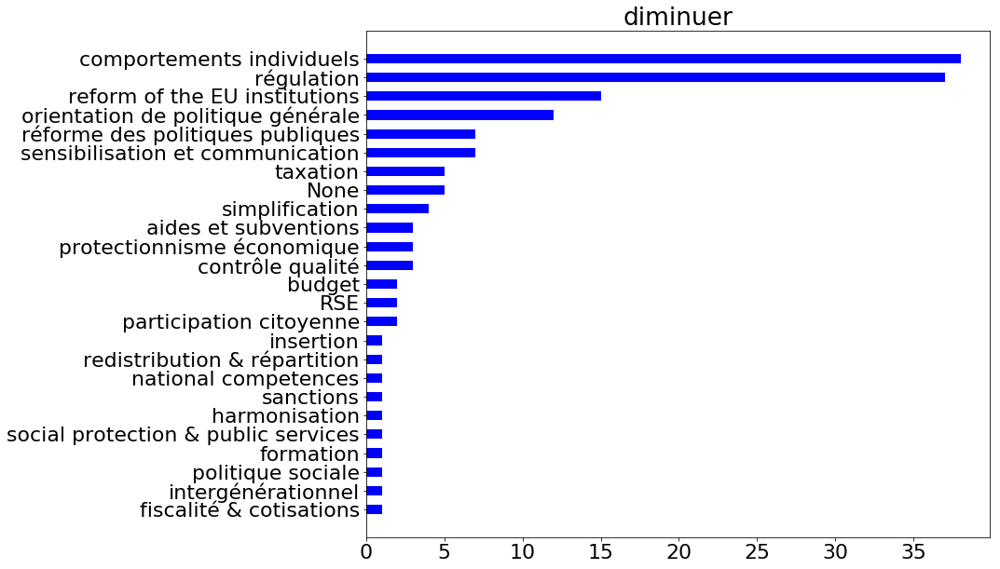



devenir
[('comportements individuels', 11), ('orientation de politique générale', 10), ('EU competences', 8), ('reform of the EU institutions', 6), ('politique sociale', 6), ('None', 5), ('régulation', 5), ('sensibilisation et communication', 4), ('sanctions', 4), ('coopération intergouvernementale', 4), ('national competences', 3), ('formation', 2), ('budget', 2), ('harmonisation', 2), ('réforme des politiques publiques', 2), ('participation citoyenne', 2), ('pan-European major projects', 2), ('insertion', 1), ('aménagement des espaces', 1), ('taxation', 1), ('aménagement du territoire', 1), ('RSE', 1)]


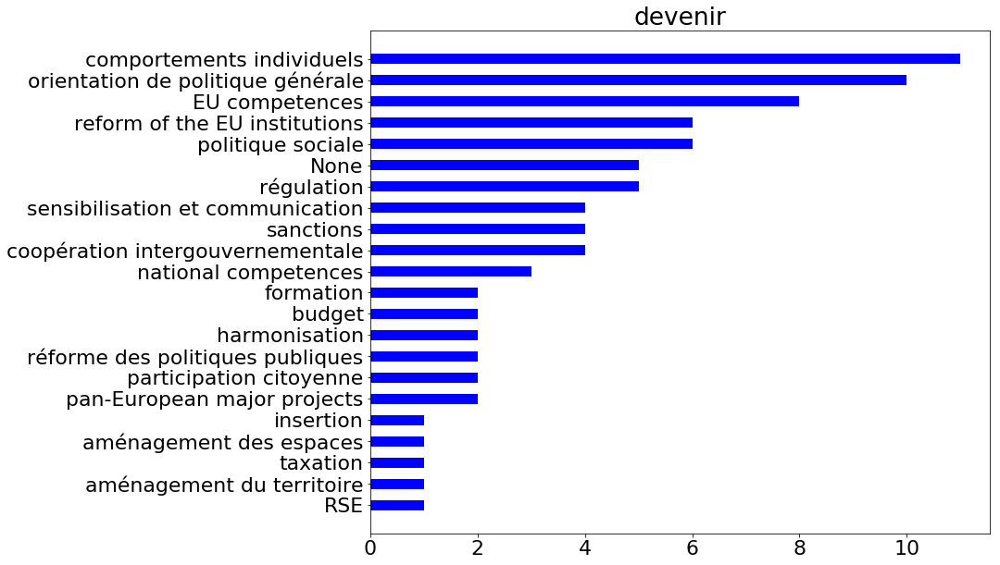



hausse
[('budget', 36), ('sensibilisation et communication', 2), ('politique sociale', 2), ('aides et subventions', 1), ('harmonisation', 1), ('social protection & public services', 1), ('régulation', 1)]


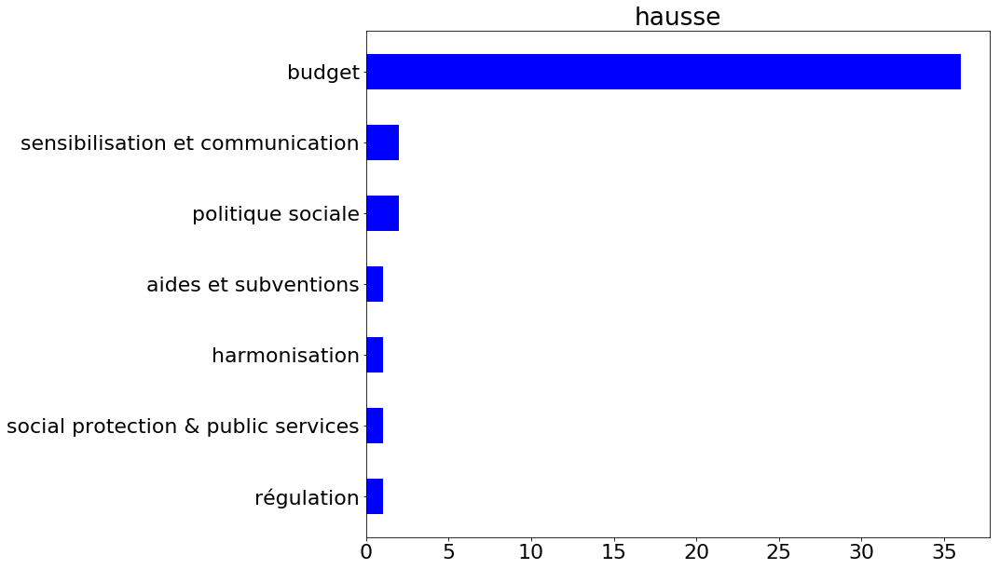



écouter
[('sensibilisation et communication', 20), ('comportements individuels', 14), ('orientation de politique générale', 3), ('participation citoyenne', 3), ('politique sociale', 3), ('aménagement des espaces', 2), ('None', 2), ('aides et subventions', 1), ('pan-European major projects', 1), ('budget', 1), ('régulation', 1)]


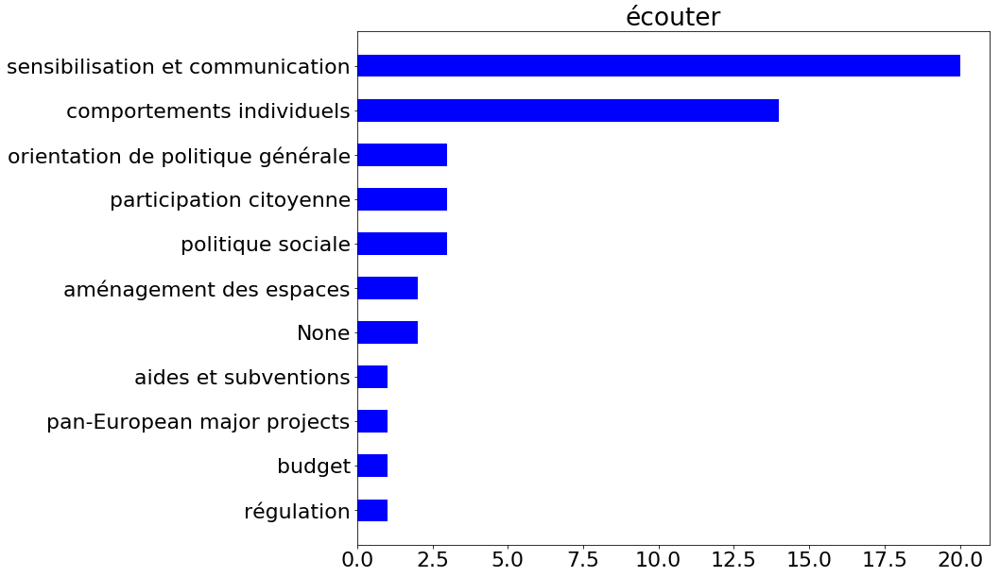



changer
[('sensibilisation et communication', 33), ('comportements individuels', 14), ('régulation', 10), ('orientation de politique générale', 7), ('None', 6), ('reform of the EU institutions', 4), ('insertion', 3), ('harmonisation', 3), ('réforme des politiques publiques', 3), ('participation citoyenne', 3), ('sanctions', 2), ('taxation', 1), ('RSE', 1), ('sortie euro et Europe', 1), ('EU competences', 1), ('diplomatic decisions & treaties', 1), ('pan-European major projects', 1), ('intergénérationnel', 1), ('politique sociale', 1)]


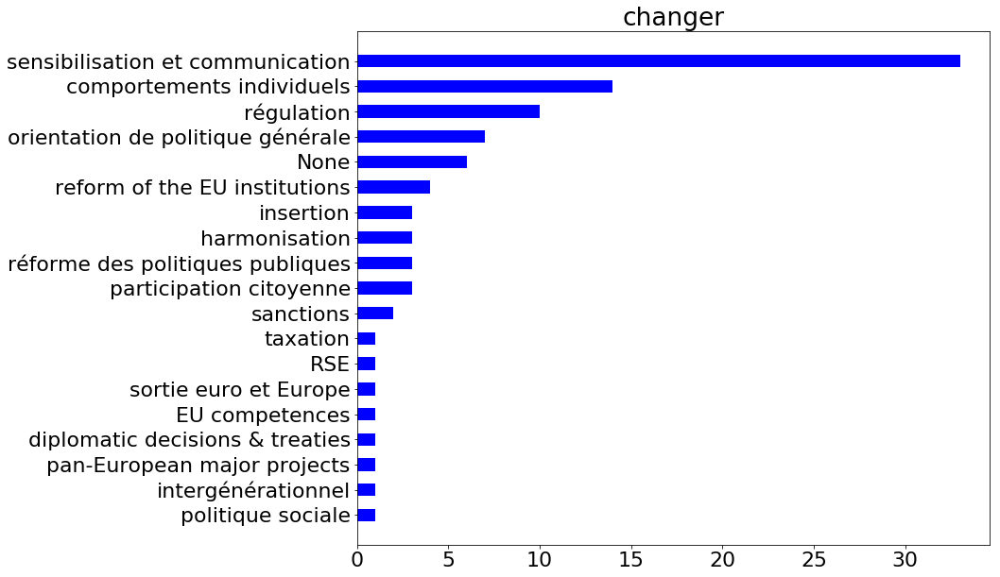



accueillir
[('aménagement des espaces', 13), ('régulation', 11), ('orientation de politique générale', 10), ('aides et subventions', 7), ('politique sociale', 7), ('formation', 6), ('budget', 5), ('insertion', 3), ('coopération intergouvernementale', 3), ('réforme des politiques publiques', 2), ('None', 2), ('national competences', 2), ('sanctions', 1), ('EU competences', 1), ('intergénérationnel', 1)]


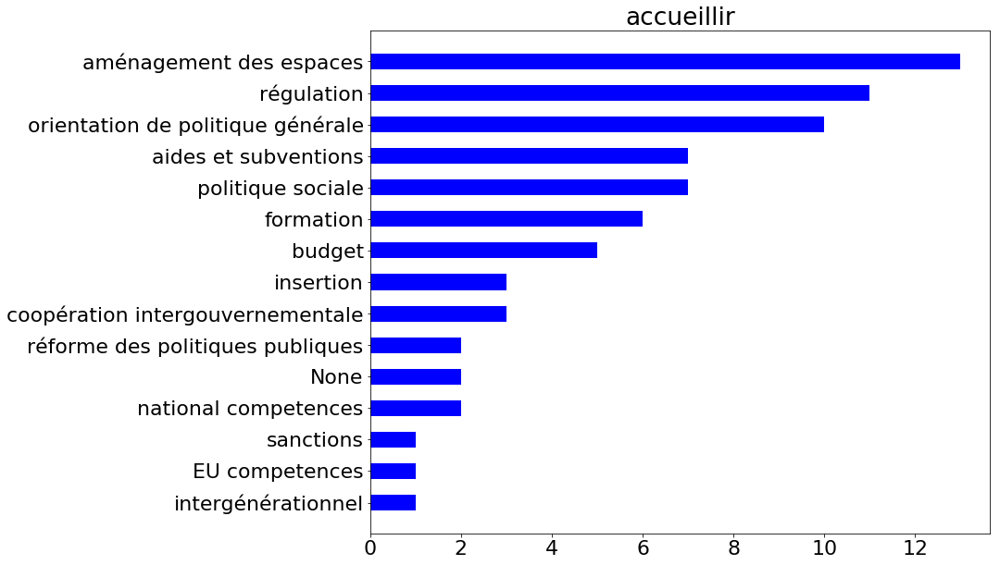



préserver
[('régulation', 11), ('orientation de politique générale', 6), ('None', 4), ('comportements individuels', 3), ('aménagement du territoire', 2), ('sensibilisation et communication', 2), ('sanctions', 1), ('contrôle qualité', 1), ('national competences', 1), ('sortie euro et Europe', 1), ('coopération intergouvernementale', 1), ('taxation', 1), ('participation citoyenne', 1), ('intergénérationnel', 1), ('budget', 1), ('couverture sociale', 1), ('politique sociale', 1)]


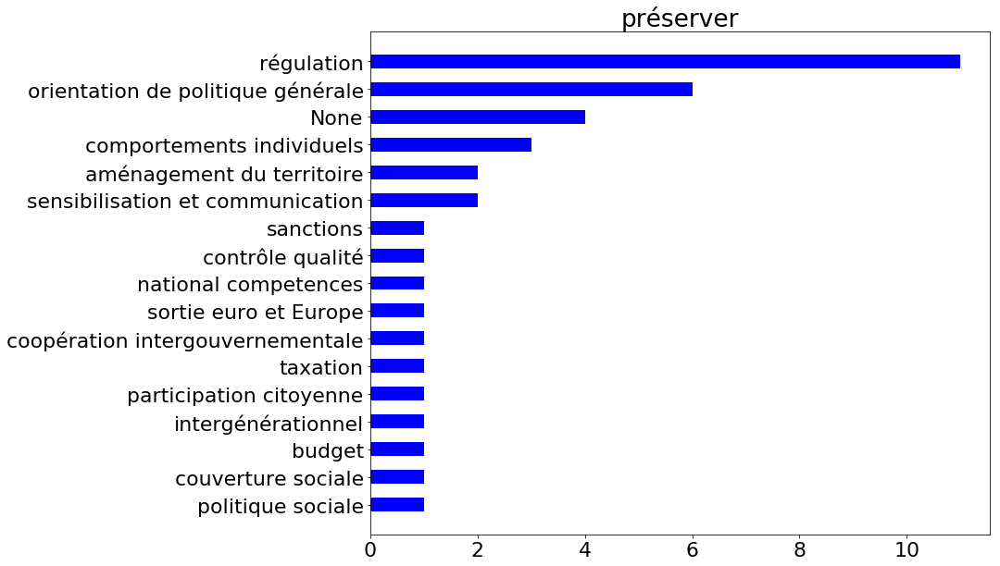



montrer
[('sensibilisation et communication', 19), ('comportements individuels', 3), ('simplification', 1), ('régulation', 1), ('None', 1), ('accompagnement & coaching', 1), ('reform of the EU institutions', 1), ('EU competences', 1), ('orientation de politique générale', 1), ('intergénérationnel', 1)]


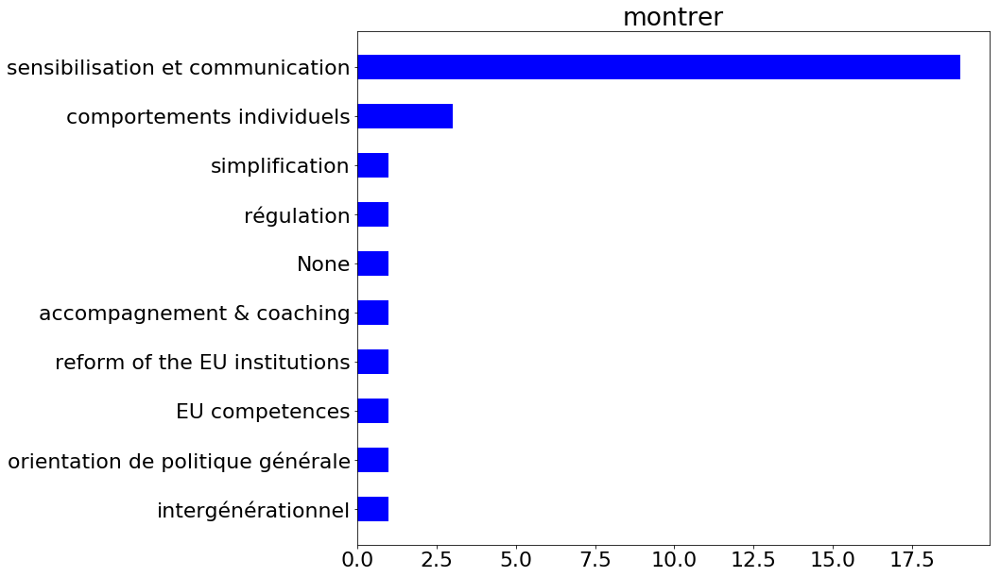



lier
[('sensibilisation et communication', 15), ('régulation', 5), ('insertion', 4), ('orientation de politique générale', 4), ('réforme des politiques publiques', 4), ('formation', 3), ('simplification', 3), ('budget', 2), ('aides et subventions', 2), ('aménagement des espaces', 1), ('None', 1), ('reform of the EU institutions', 1), ('harmonisation', 1), ('sortie euro et Europe', 1), ('pan-European major projects', 1), ('national competences', 1), ('politique sociale', 1), ('couverture sociale', 1)]


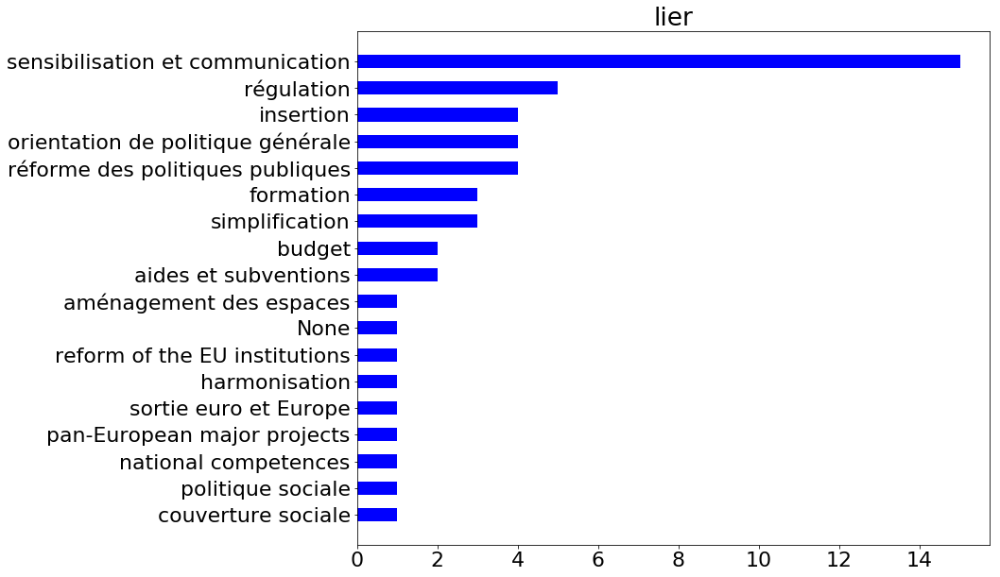



voir
[('sensibilisation et communication', 18), ('None', 8), ('comportements individuels', 7), ('réforme des politiques publiques', 4), ('aides et subventions', 4), ('harmonisation', 4), ('régulation', 4), ('politique sociale', 3), ('orientation de politique générale', 2), ('insertion', 2), ('reform of the EU institutions', 2), ('sanctions', 1), ('protectionnisme économique', 1), ('sortie euro et Europe', 1), ('coopération intergouvernementale', 1), ('budget', 1)]


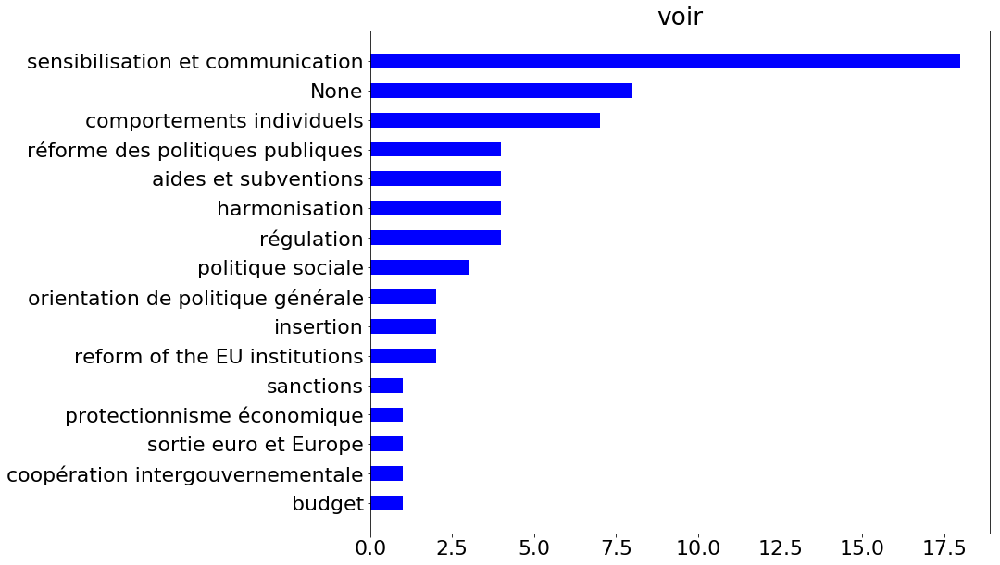



bannir
[('régulation', 21), ('sanctions', 7), ('comportements individuels', 4), ('orientation de politique générale', 3), ('protectionnisme économique', 2), ('réforme des politiques publiques', 1), ('sensibilisation et communication', 1)]


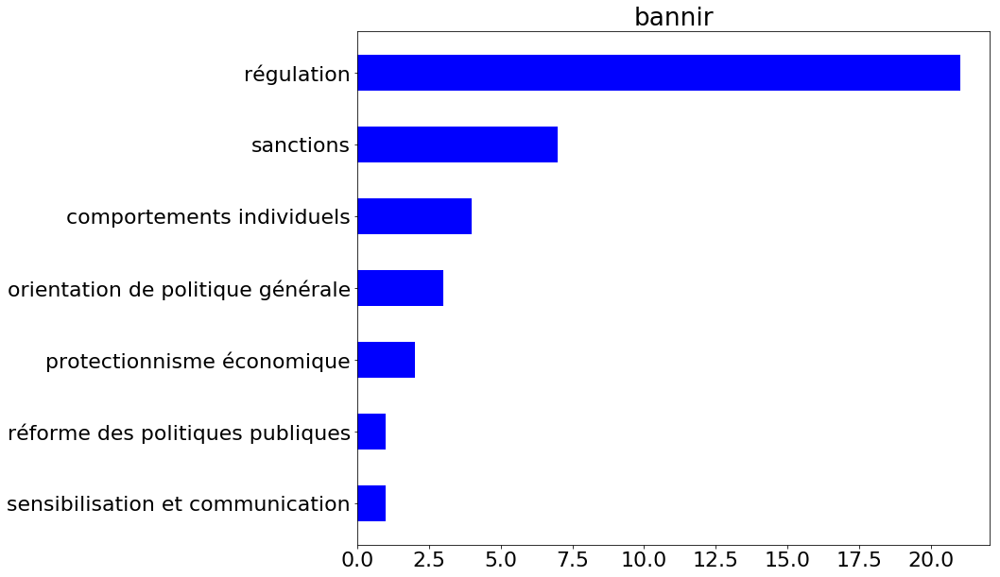



uniformiser
[('harmonisation', 37), ('régulation', 1), ('sensibilisation et communication', 1), ('coopération intergouvernementale', 1), ('politique sociale', 1)]


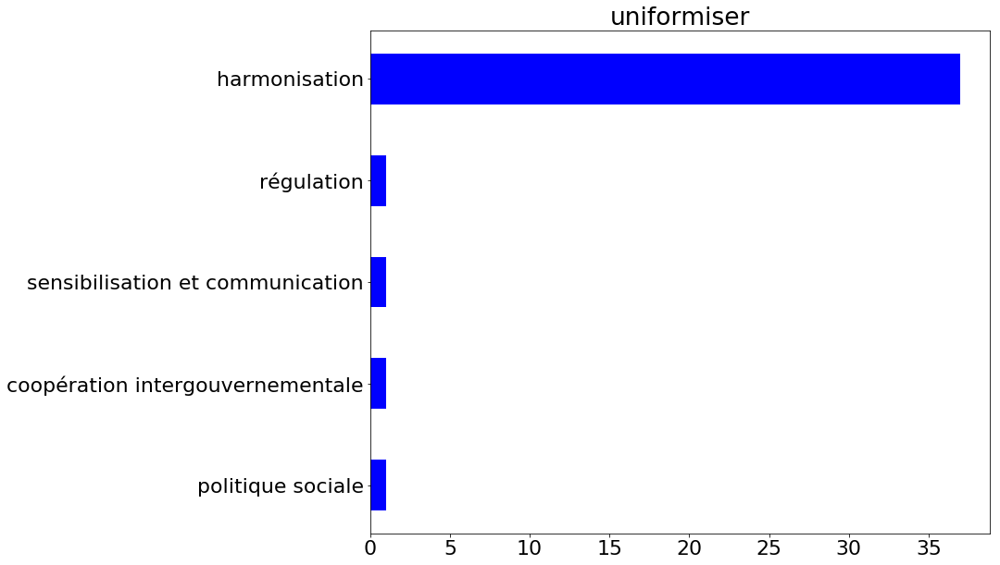



rétablir
[('régulation', 18), ('national competences', 7), ('orientation de politique générale', 5), ('sanctions', 4), ('european protectionism', 4), ('sortie euro et Europe', 4), ('social protection & public services', 4), ('sensibilisation et communication', 2), ('None', 2), ('taxation', 2), ('budget', 2), ('insertion', 1), ('aides et subventions', 1), ('aménagement des espaces', 1), ('action européenne', 1), ('comportements individuels', 1), ('participation citoyenne', 1), ('reform of the EU institutions', 1), ('pan-European major projects', 1), ('couverture sociale', 1), ('fiscalité & cotisations', 1), ('politique sociale', 1)]


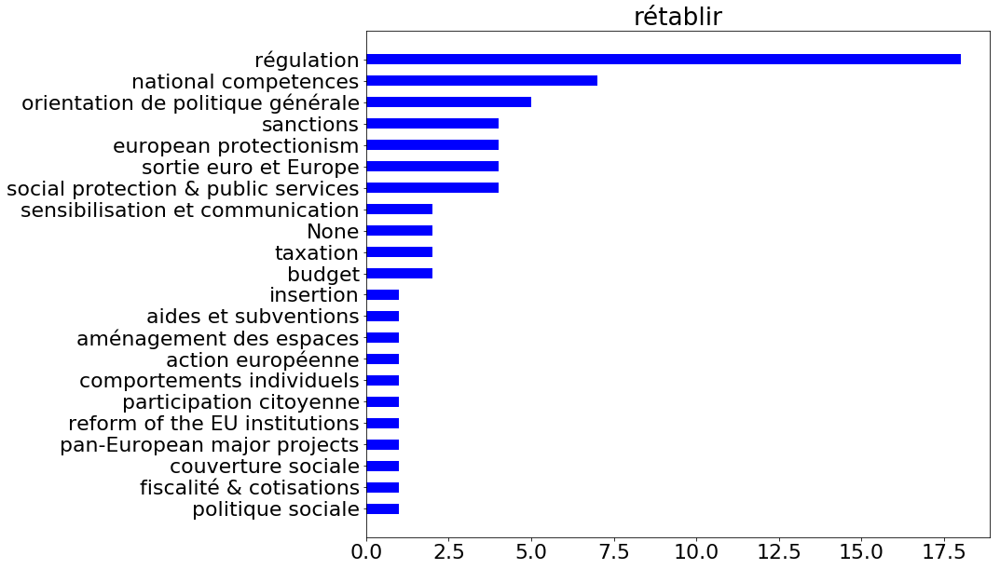



importer
[('protectionnisme économique', 18), ('régulation', 8), ('orientation de politique générale', 5), ('budget', 5), ('comportements individuels', 4), ('None', 4), ('aides et subventions', 2), ('harmonisation', 2), ('european protectionism', 2), ('réforme des politiques publiques', 1), ('aménagement du territoire', 1), ('coopération intergouvernementale', 1), ('taxation', 1), ('responsabilisation', 1), ('sensibilisation et communication', 1), ('EU competences', 1), ('engagement associatif', 1)]


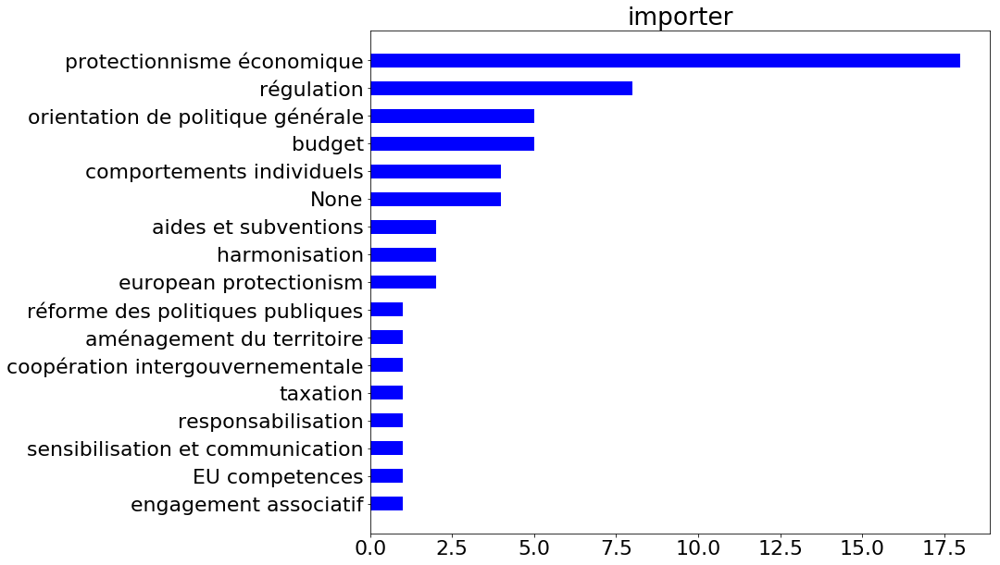



retrouver
[('sortie euro et Europe', 19), ('réforme des politiques publiques', 5), ('comportements individuels', 5), ('national competences', 5), ('sensibilisation et communication', 3), ('aides et subventions', 3), ('None', 3), ('régulation', 3), ('sanctions', 2), ('reform of the EU institutions', 2), ('aménagement des espaces', 1), ('taxation', 1), ('protectionnisme économique', 1), ('EU competences', 1), ('coopération intergouvernementale', 1), ('social protection & public services', 1), ('orientation de politique générale', 1), ('harmonisation', 1), ('couverture sociale', 1)]


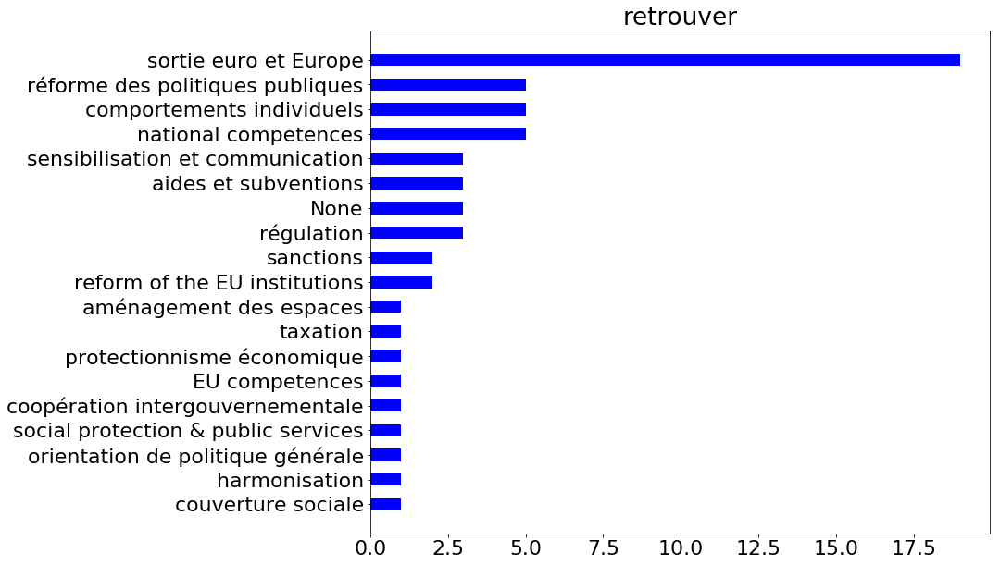



simplifier
[('simplification', 23), ('régulation', 4), ("transformation de l'administration", 4), ('sensibilisation et communication', 2), ('participation citoyenne', 2), ('reform of the EU institutions', 2), ('harmonisation', 2), ('budget', 1), ('aménagement des espaces', 1), ('None', 1), ('sortie euro et Europe', 1), ('politique sociale', 1), ('numérique', 1), ('aides et subventions', 1), ('formation', 1)]


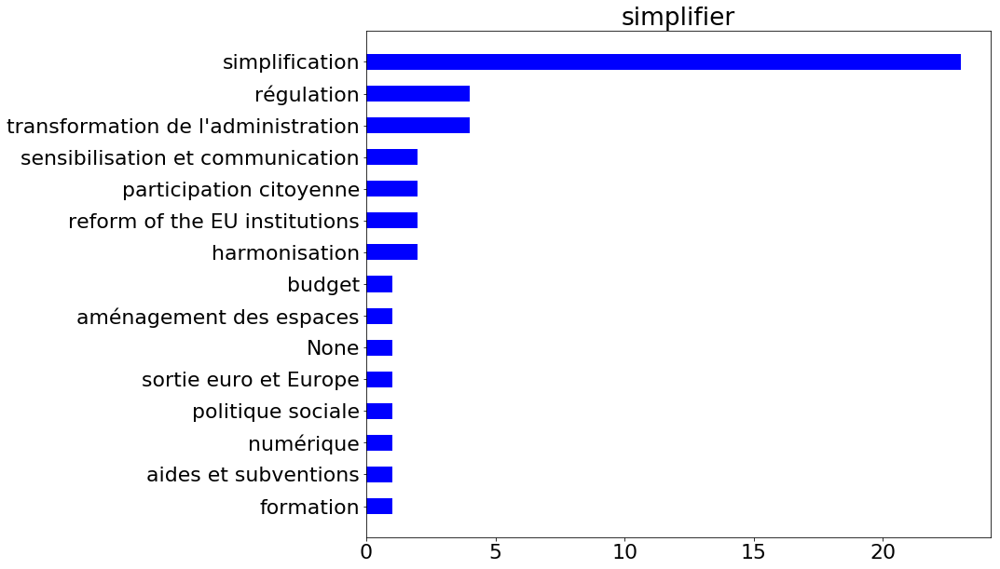



rester
[('politique sociale', 20), ('aides et subventions', 13), ('sensibilisation et communication', 7), ('régulation', 6), ('comportements individuels', 6), ('None', 6), ('budget', 5), ('sortie euro et Europe', 3), ('orientation de politique générale', 2), ('national competences', 2), ('coopération intergouvernementale', 2), ('couverture sociale', 2), ('aménagement des espaces', 1), ('simplification', 1), ('protectionnisme économique', 1), ('harmonisation', 1), ('reform of the EU institutions', 1), ('social protection & public services', 1), ('european protectionism', 1), ('formation', 1), ('fiscalité & cotisations', 1), ('numérique', 1)]


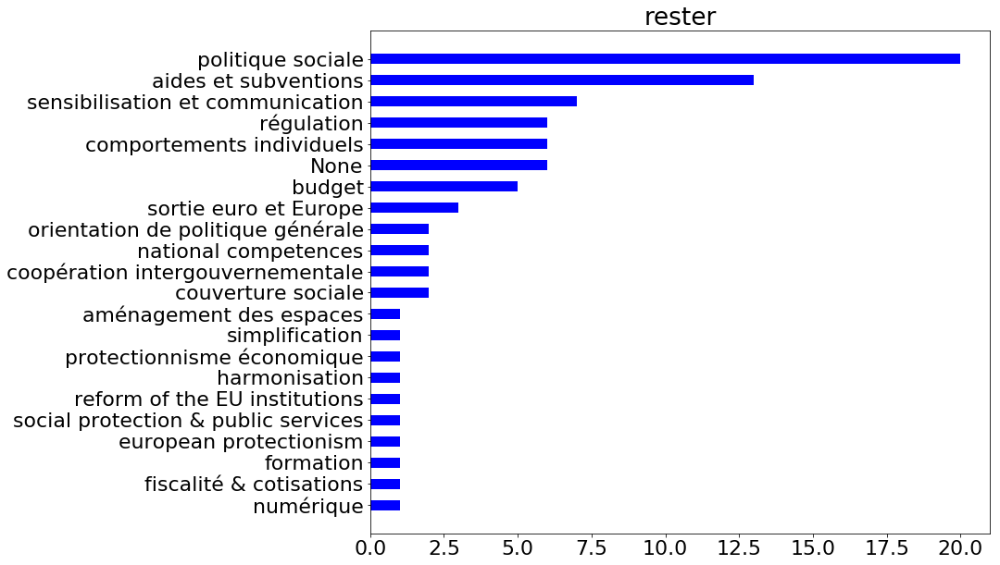



parler
[('sensibilisation et communication', 29), ('comportements individuels', 5), ('régulation', 4), ('reform of the EU institutions', 3), ('aménagement des espaces', 2), ('None', 2), ('diplomatic decisions & treaties', 2), ('harmonisation', 2), ('politique sociale', 2), ('contrôle qualité', 1), ('participation citoyenne', 1), ('pan-European major projects', 1), ('budget', 1), ('formation', 1), ("transformation de l'administration", 1)]


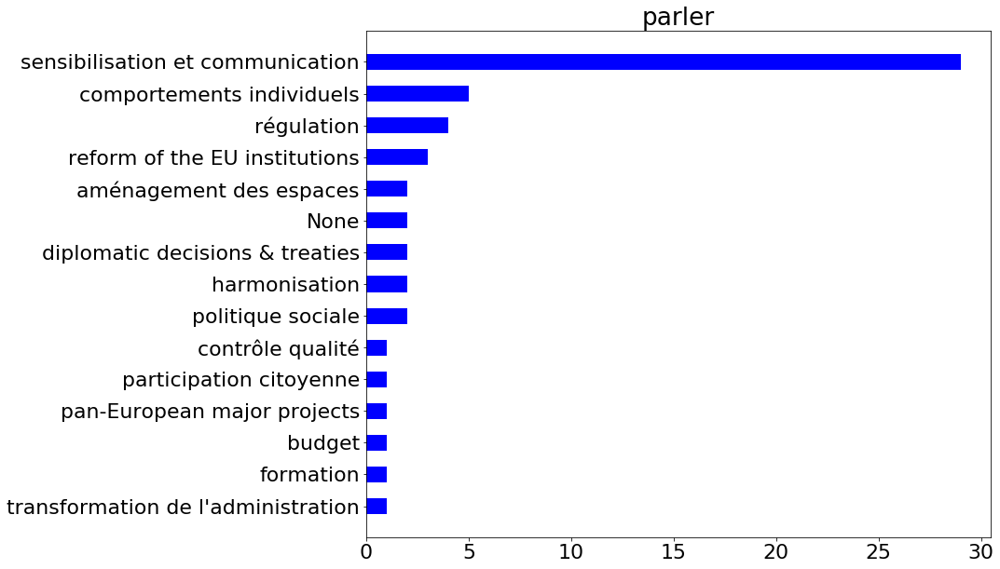



encadrer
[('régulation', 11), ('politique sociale', 3), ('formation', 2), ('réforme des politiques publiques', 2), ('None', 2), ('sanctions', 2), ('budget', 1), ('aménagement du territoire', 1), ('orientation de politique générale', 1), ('reform of the EU institutions', 1), ('harmonisation', 1), ('EU competences', 1)]


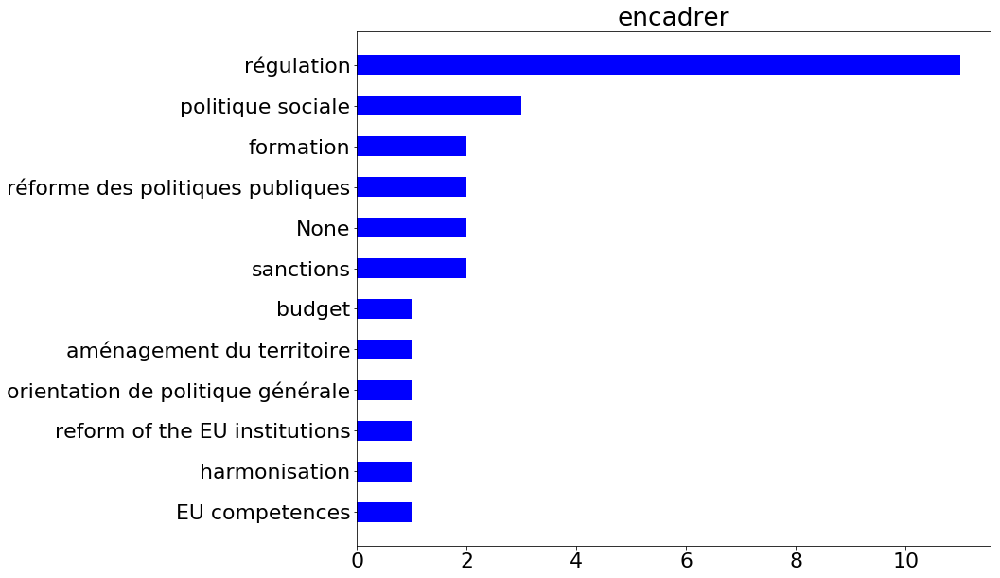



voter
[('participation citoyenne', 15), ('reform of the EU institutions', 12), ('régulation', 6), ('sensibilisation et communication', 5), ('simplification', 3), ('sortie euro et Europe', 3), ('budget', 2), ('harmonisation', 2), ('national competences', 2), ('coopération intergouvernementale', 2), ('None', 1), ('comportements individuels', 1), ('sanctions', 1), ('pan-European major projects', 1), ('EU competences', 1)]


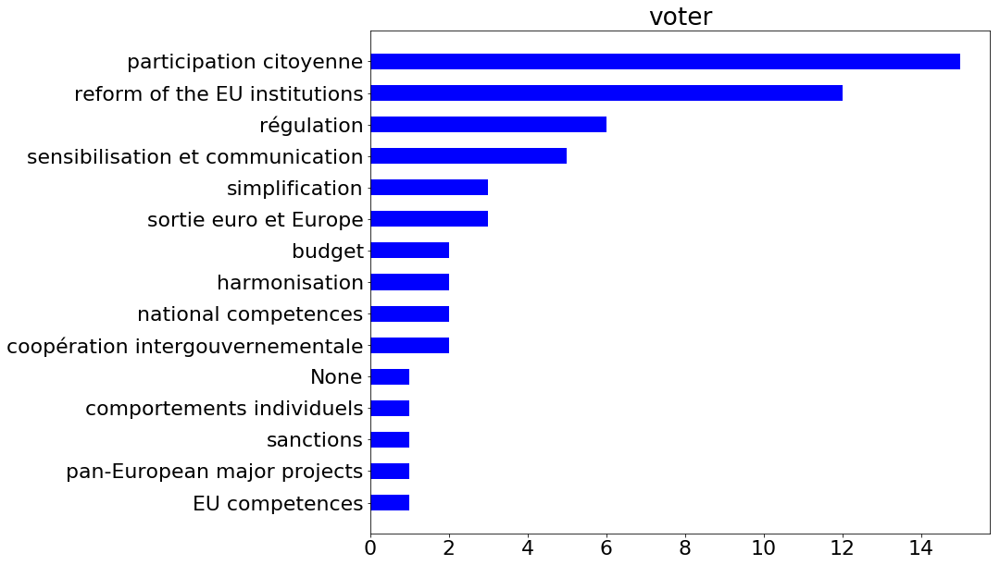



organiser
[('sensibilisation et communication', 18), ('politique sociale', 14), ('participation citoyenne', 8), ('comportements individuels', 7), ('None', 5), ('aménagement du territoire', 4), ('orientation de politique générale', 4), ('coopération intergouvernementale', 3), ('insertion', 2), ('réforme des politiques publiques', 2), ('reform of the EU institutions', 2), ('régulation', 2), ('land development', 2), ('formation', 1), ('protectionnisme économique', 1), ('aides et subventions', 1), ('harmonisation', 1), ('RSE', 1), ('sortie euro et Europe', 1), ('intergénérationnel', 1), ('engagement associatif', 1)]


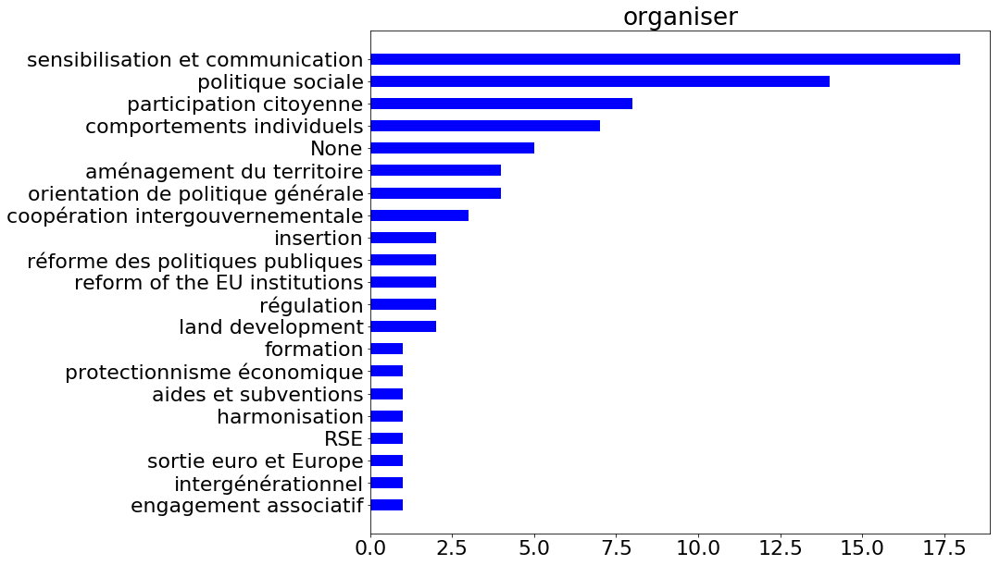



redonner
[('national competences', 13), ('participation citoyenne', 7), ('comportements individuels', 6), ('sensibilisation et communication', 5), ('sortie euro et Europe', 5), ('orientation de politique générale', 4), ('None', 4), ('aides et subventions', 2), ('régulation', 2), ('insertion', 1), ('protection environnementale', 1), ('redistribution & répartition', 1), ('taxation', 1), ('reform of the EU institutions', 1), ('harmonisation', 1), ('land development', 1), ('formation', 1), ('budget', 1), ('politique sociale', 1)]


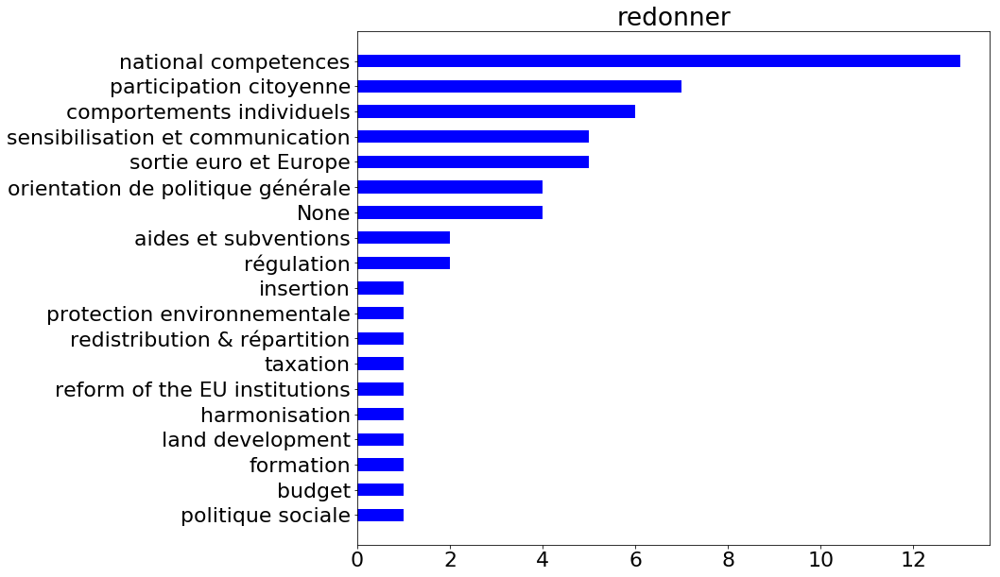



garder
[('aides et subventions', 12), ('national competences', 6), ('politique sociale', 6), ('orientation de politique générale', 5), ('comportements individuels', 5), ('réforme des politiques publiques', 4), ('budget', 4), ('harmonisation', 3), ('None', 3), ('régulation', 3), ('coopération intergouvernementale', 3), ('reform of the EU institutions', 3), ('insertion', 2), ('EU competences', 2), ('social protection & public services', 2), ('sensibilisation et communication', 2), ('sortie euro et Europe', 1), ('couverture sociale', 1), ('engagement associatif', 1), ('fiscalité & cotisations', 1)]


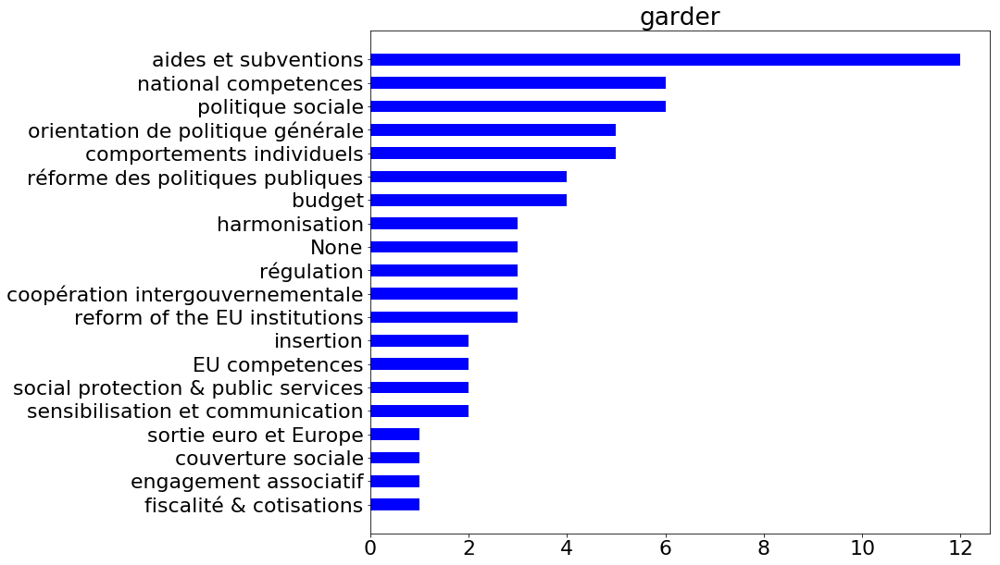



fermer
[('régulation', 21), ('sanctions', 7), ('european protectionism', 5), ('None', 4), ('reform of the EU institutions', 4), ('réforme des politiques publiques', 3), ('sortie euro et Europe', 3), ('national competences', 3), ('insertion', 2), ('aides et subventions', 2), ('orientation de politique générale', 2), ('aménagement des espaces', 1), ('sensibilisation et communication', 1), ('protectionnisme économique', 1), ('responsabilisation', 1), ('participation citoyenne', 1), ('pan-European major projects', 1), ('engagement associatif', 1)]


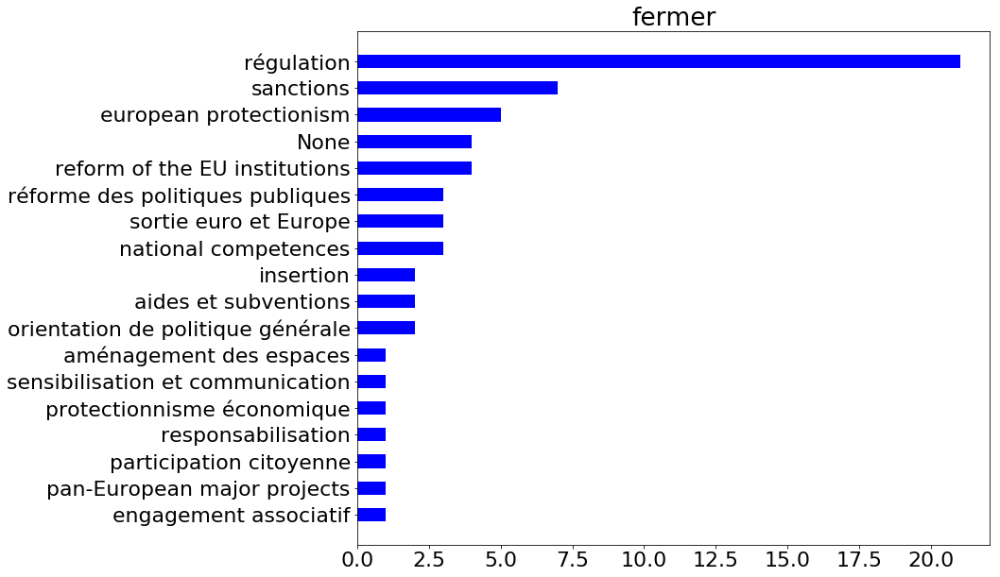



déler
[('simplification', 13), ('None', 4), ('réforme des politiques publiques', 2), ('sanctions', 2), ('régulation', 1)]


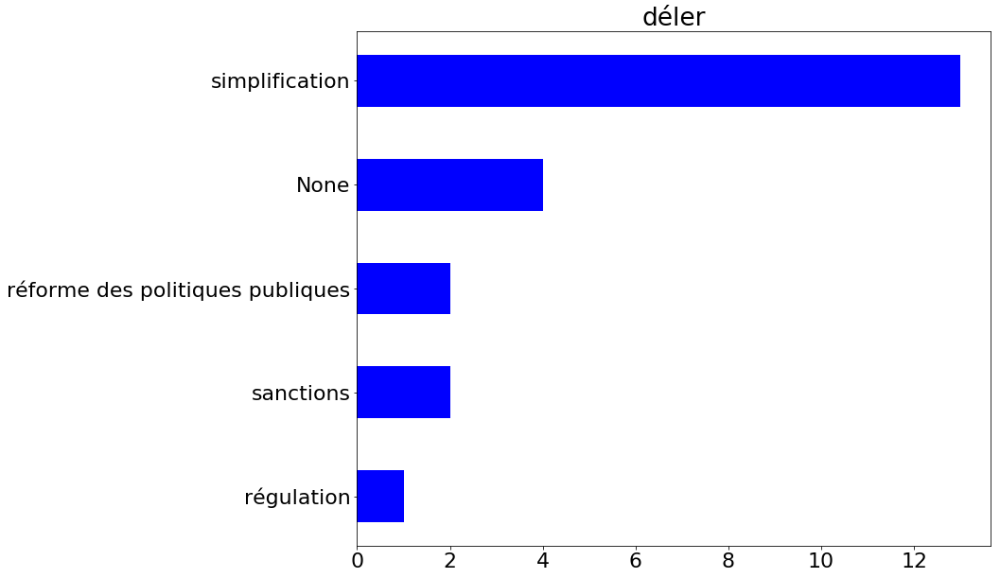



stopper
[('régulation', 72), ('orientation de politique générale', 12), ('sanctions', 11), ('comportements individuels', 4), ('harmonisation', 4), ('None', 3), ('social protection & public services', 3), ('aides et subventions', 2), ('protectionnisme économique', 2), ('réforme des politiques publiques', 2), ('protection environnementale', 2), ('participation citoyenne', 2), ('european protectionism', 2), ('contrôle qualité', 1), ('EU competences', 1), ('reform of the EU institutions', 1), ('coopération intergouvernementale', 1), ('national competences', 1), ('politique sociale', 1)]


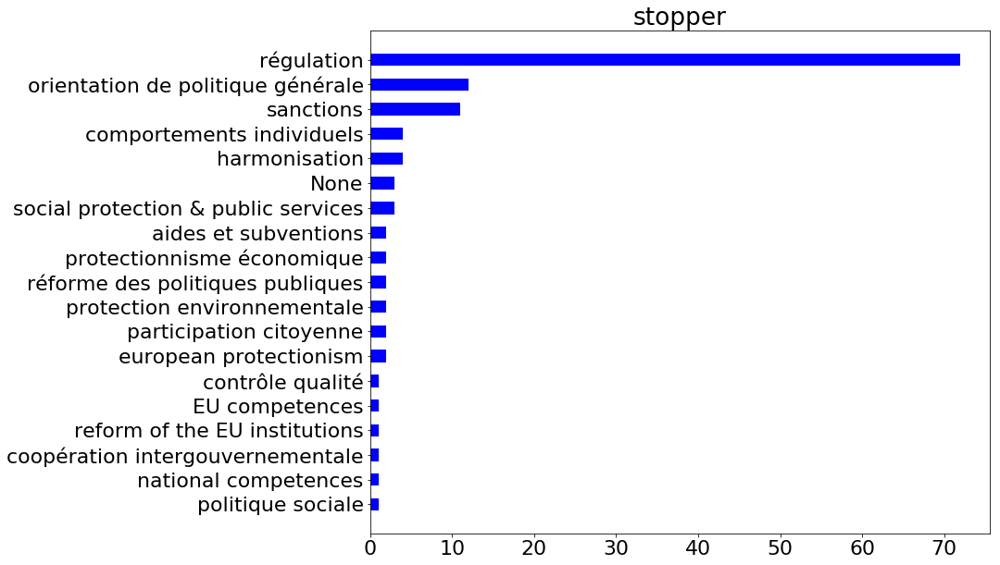



légaliser
[('régulation', 13), ('réforme des politiques publiques', 7), ('sanctions', 1), ('None', 1), ('orientation de politique générale', 1)]


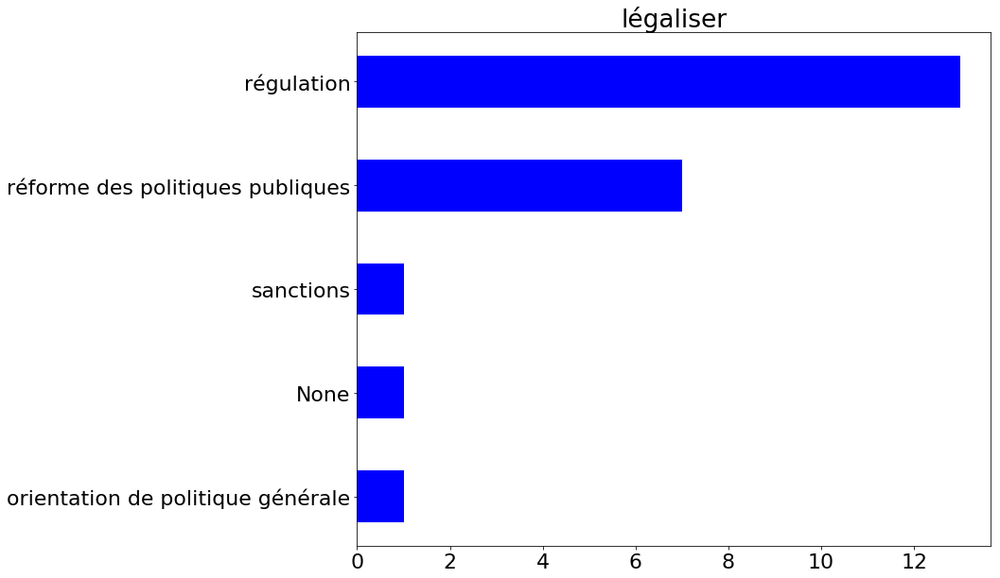



venir
[('comportements individuels', 23), ('protectionnisme économique', 13), ('sensibilisation et communication', 10), ('régulation', 10), ('orientation de politique générale', 8), ('participation citoyenne', 7), ('None', 7), ('taxation', 6), ('protection environnementale', 5), ('sanctions', 4), ('reform of the EU institutions', 3), ('action européenne', 2), ('harmonisation', 2), ('contrôle qualité', 2), ('budget', 2), ('politique sociale', 2), ('european protectionism', 1), ('social protection & public services', 1)]


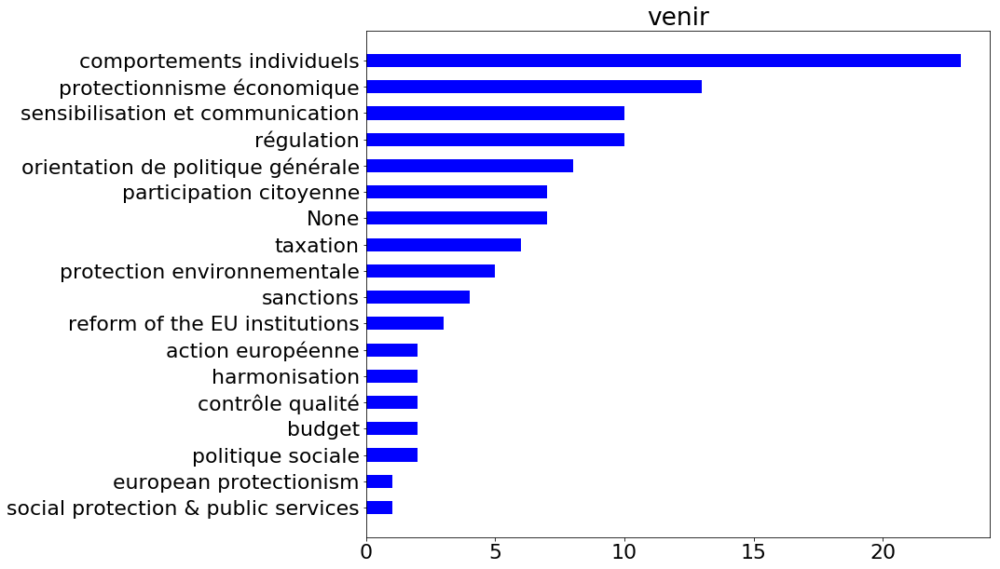



frer
[('comportements individuels', 60), ('sensibilisation et communication', 27), ('régulation', 22), ('None', 17), ('orientation de politique générale', 11), ('aides et subventions', 9), ('réforme des politiques publiques', 8), ('budget', 4), ('taxation', 4), ('protectionnisme économique', 3), ('reform of the EU institutions', 3), ('sanctions', 3), ('harmonisation', 2), ('couverture sociale', 2), ('politique sociale', 2), ('redistribution & répartition', 1), ('aménagement du territoire', 1), ('protection environnementale', 1), ('accompagnement & coaching', 1), ('simplification', 1), ('formation', 1)]


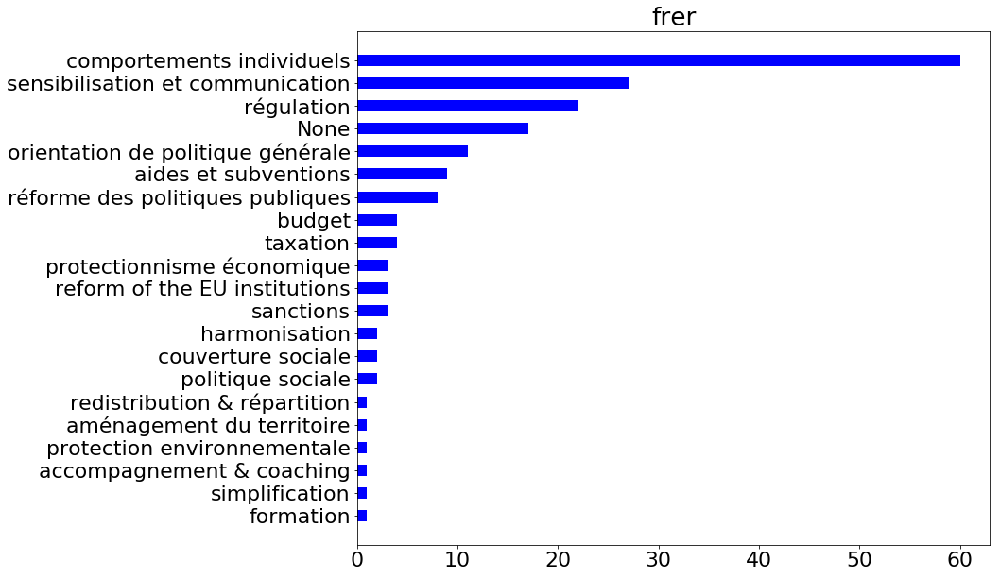



vendre
[('régulation', 46), ('None', 23), ('comportements individuels', 21), ('sensibilisation et communication', 8), ('sanctions', 7), ('orientation de politique générale', 6), ('taxation', 6), ('protectionnisme économique', 6), ('RSE', 5), ('protection environnementale', 4), ('harmonisation', 3), ('budget', 3), ('aides et subventions', 2), ('réforme des politiques publiques', 2), ('insertion', 1), ('participation citoyenne', 1), ('sortie euro et Europe', 1), ('couverture sociale', 1), ('fiscalité & cotisations', 1)]


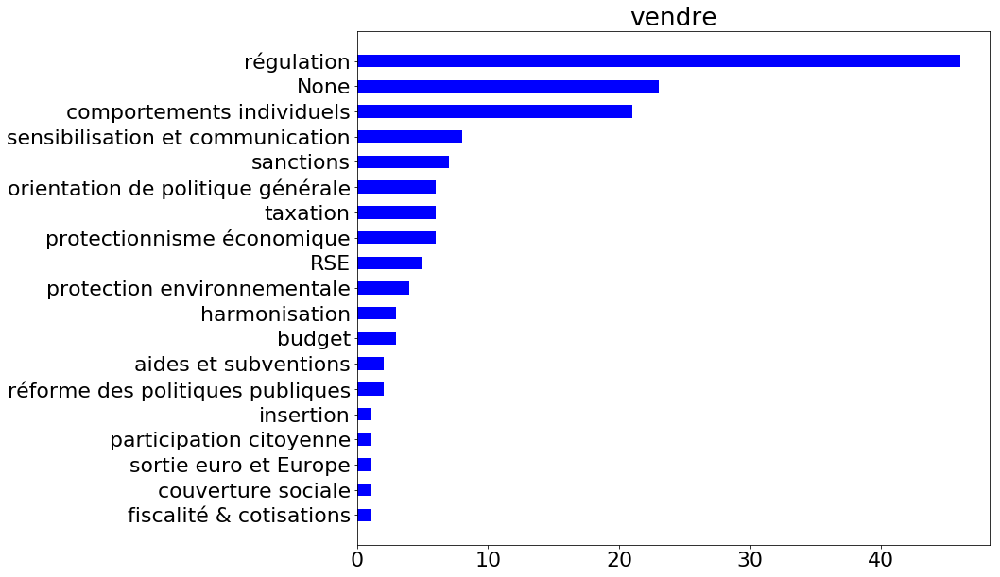



partager
[('sensibilisation et communication', 16), ('participation citoyenne', 11), ('comportements individuels', 8), ('aménagement du territoire', 8), ('harmonisation', 5), ('politique sociale', 5), ('None', 4), ('régulation', 4), ('intergénérationnel', 3), ('insertion', 2), ('orientation de politique générale', 2), ('aménagement des espaces', 2), ('aides et subventions', 2), ('coopération intergouvernementale', 2), ('budget', 1), ('réforme des politiques publiques', 1), ('sortie euro et Europe', 1), ('pan-European major projects', 1), ('social protection & public services', 1), ('land development', 1)]


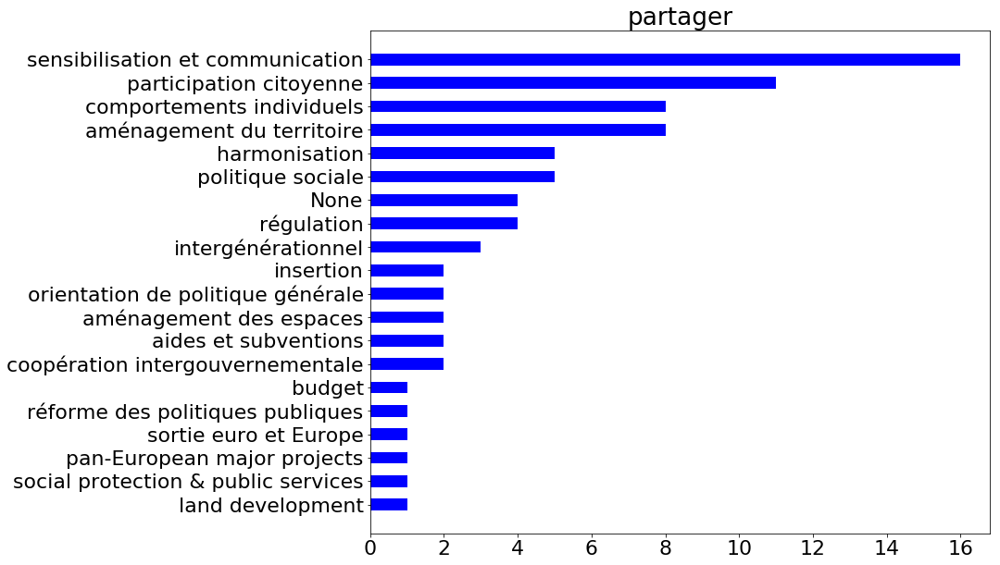



préparer
[('comportements individuels', 41), ('régulation', 15), ('sensibilisation et communication', 13), ('orientation de politique générale', 3), ('None', 2), ('contrôle qualité', 2), ('reform of the EU institutions', 1), ('pan-European major projects', 1), ('social protection & public services', 1), ('aides et subventions', 1)]


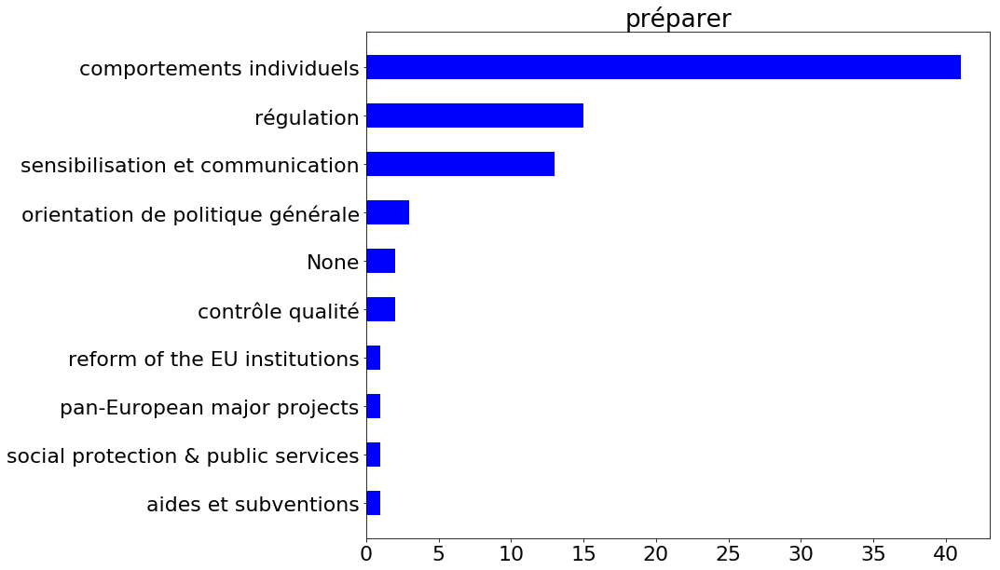



instaurer
[('harmonisation', 17), ('régulation', 15), ('participation citoyenne', 15), ('sensibilisation et communication', 11), ('taxation', 11), ('reform of the EU institutions', 11), ('réforme des politiques publiques', 6), ('sanctions', 6), ('orientation de politique générale', 5), ('RSE', 4), ('social protection & public services', 3), ('pan-European major projects', 3), ('EU competences', 2), ('budget', 2), ('simplification', 1), ('contrôle qualité', 1), ('sortie euro et Europe', 1), ('european protectionism', 1), ('comportements individuels', 1), ('aides et subventions', 1), ('politique sociale', 1), ('intergénérationnel', 1), ('couverture sociale', 1)]


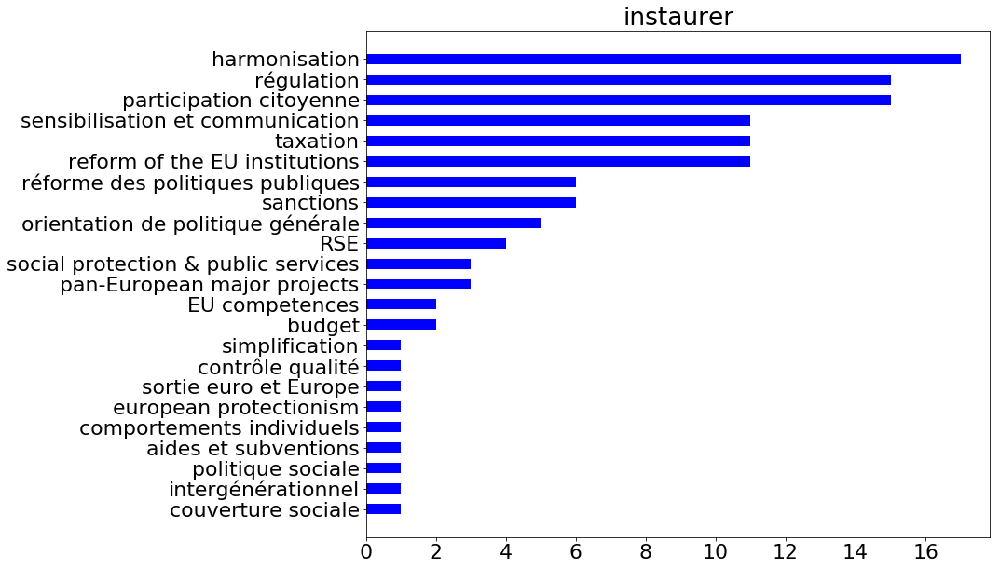



éduquer
[('sensibilisation et communication', 141), ('comportements individuels', 5), ('orientation de politique générale', 2), ('régulation', 2), ('insertion', 1), ('sanctions', 1), ('formation', 1), ('simplification', 1), ('aménagement du territoire', 1), ('harmonisation', 1), ('intergénérationnel', 1)]


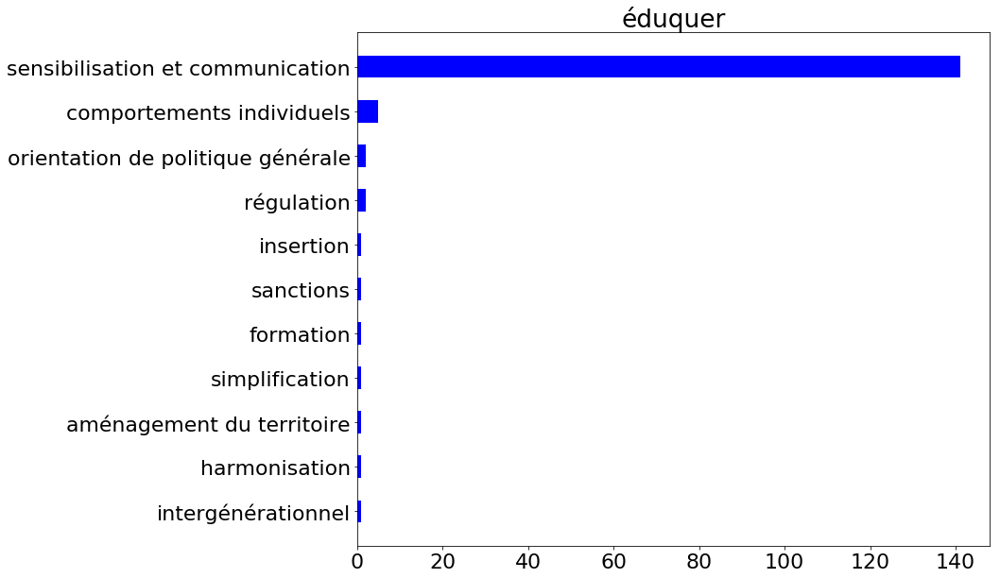



enlever
[('régulation', 13), ('reform of the EU institutions', 5), ('réforme des politiques publiques', 4), ('taxation', 4), ('orientation de politique générale', 2), ('insertion', 1), ('None', 1), ('contrôle qualité', 1), ('comportements individuels', 1)]


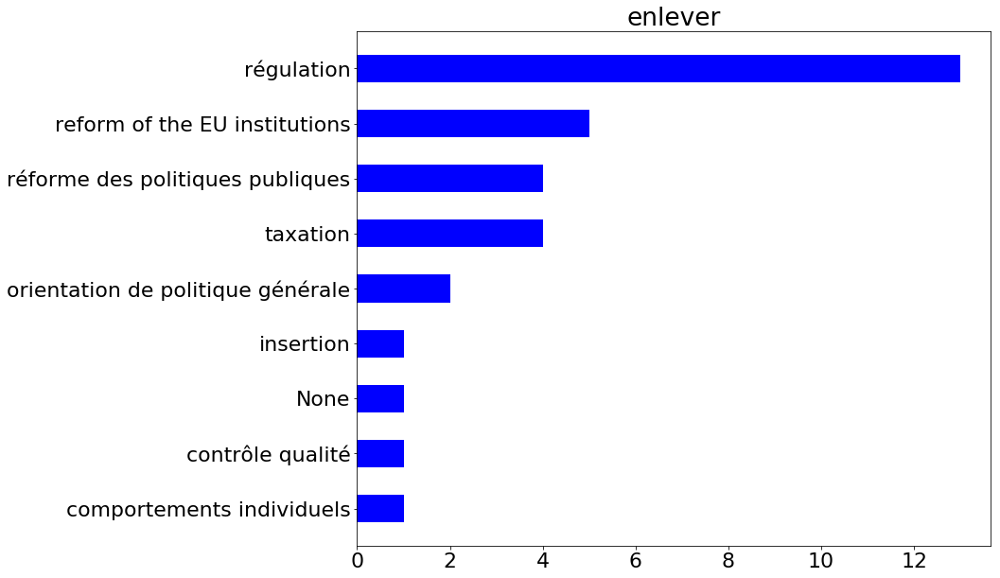



croire
[('sensibilisation et communication', 12), ('None', 3), ('comportements individuels', 2), ('régulation', 2), ('sanctions', 1), ('simplification', 1), ('aides et subventions', 1), ('harmonisation', 1)]


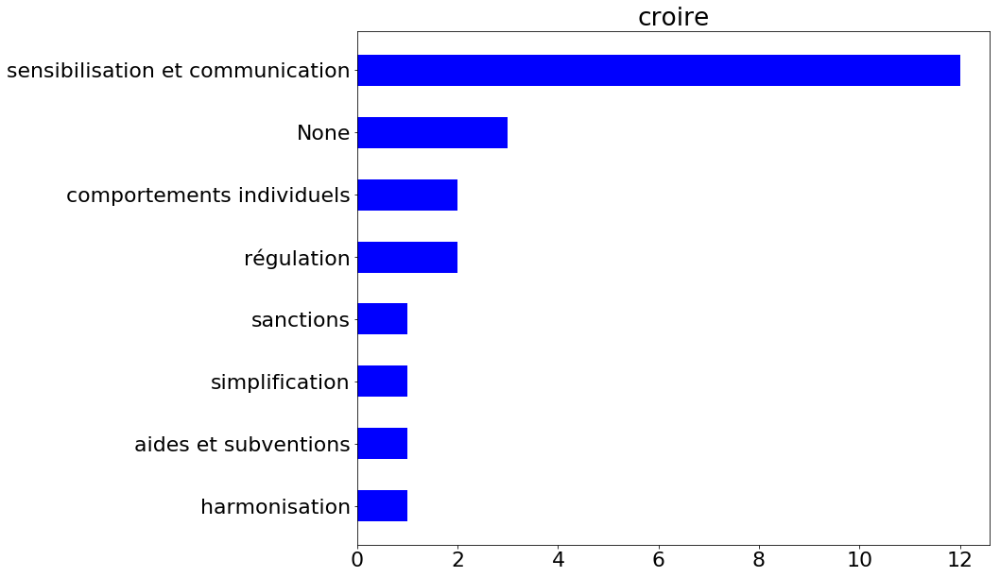



cultiver
[('comportements individuels', 15), ('sensibilisation et communication', 13), ('régulation', 11), ('aménagement du territoire', 8), ('None', 6), ('participation citoyenne', 3), ('contrôle qualité', 1), ('protection environnementale', 1), ('réforme des politiques publiques', 1)]


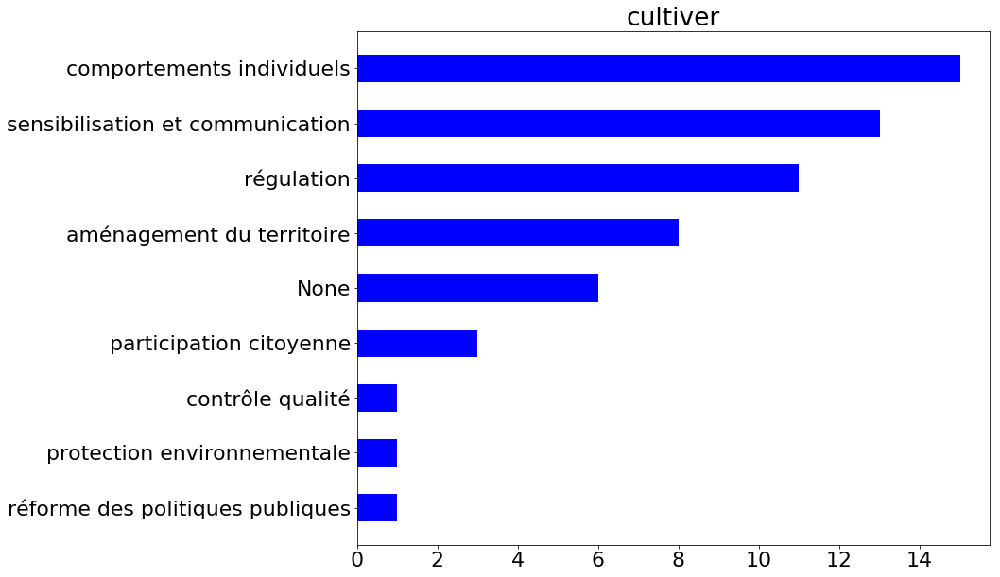



transformer
[('régulation', 40), ('comportements individuels', 37), ('sensibilisation et communication', 25), ('taxation', 10), ('None', 5), ('orientation de politique générale', 3), ('reform of the EU institutions', 3), ('réforme des politiques publiques', 2), ('aides et subventions', 2), ('contrôle qualité', 1), ('harmonisation', 1), ('protectionnisme économique', 1), ('RSE', 1), ('sanctions', 1), ('aménagement du territoire', 1), ('participation citoyenne', 1), ('politique sociale', 1)]


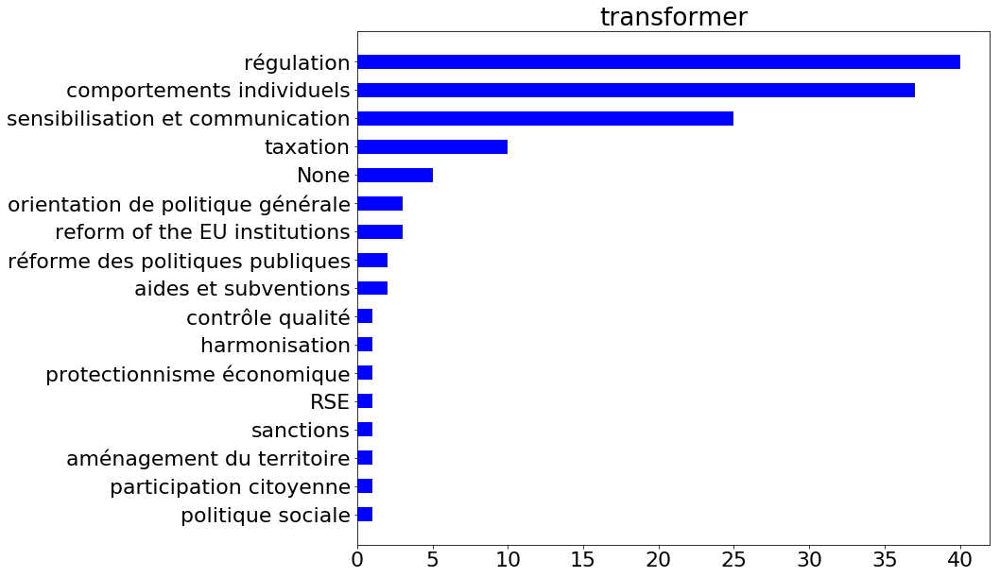



empêcher
[('régulation', 15), ('sanctions', 6), ('orientation de politique générale', 2), ('sensibilisation et communication', 2), ('reform of the EU institutions', 2), ('harmonisation', 2), ('taxation', 2), ('pan-European major projects', 2), ('coopération intergouvernementale', 1), ('sortie euro et Europe', 1), ('european protectionism', 1), ('EU competences', 1), ('national competences', 1)]


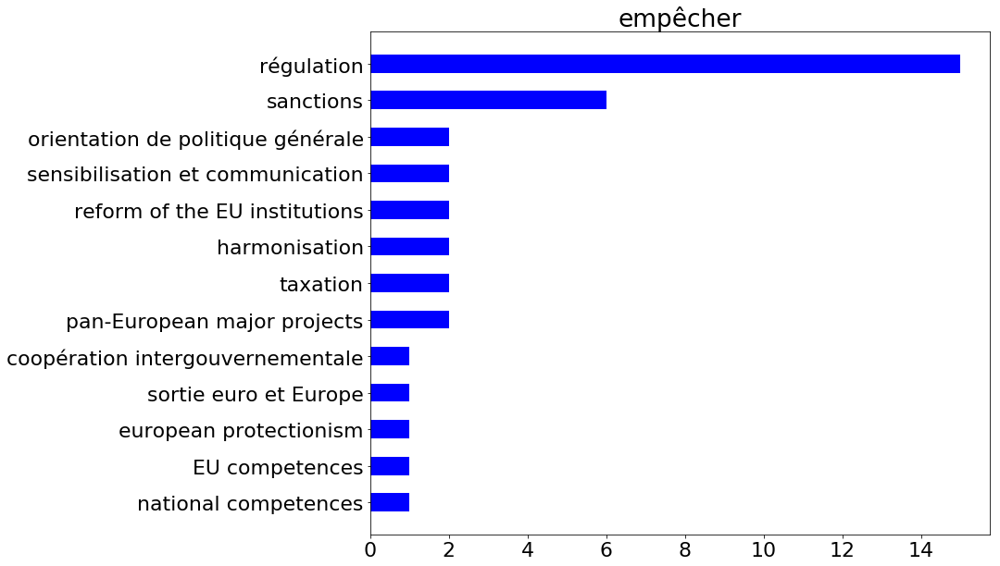



reste
[('régulation', 11), ('aides et subventions', 6), ('comportements individuels', 5), ('national competences', 5), ('couverture sociale', 5), ('sensibilisation et communication', 2), ('réforme des politiques publiques', 2), ('harmonisation', 2), ('politique sociale', 2), ('aménagement des espaces', 1), ('redistribution & répartition', 1), ('orientation de politique générale', 1), ('coopération intergouvernementale', 1), ('reform of the EU institutions', 1), ('pan-European major projects', 1), ('fiscalité & cotisations', 1)]


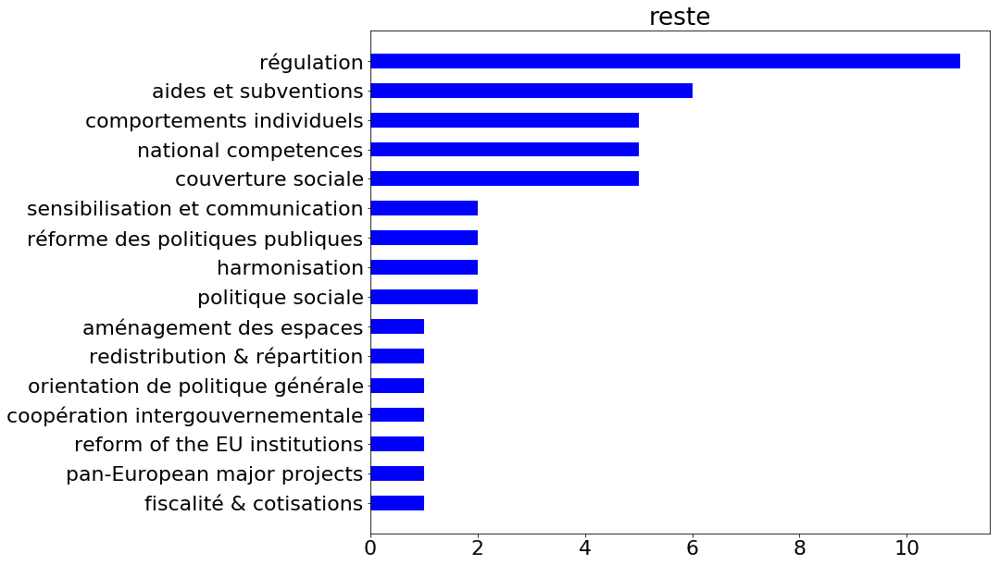



remplacer
[('régulation', 11), ('reform of the EU institutions', 10), ('comportements individuels', 9), ('None', 8), ('aménagement du territoire', 6), ('taxation', 6), ('sensibilisation et communication', 5), ('orientation de politique générale', 5), ('participation citoyenne', 5), ('réforme des politiques publiques', 2), ('aides et subventions', 1), ('protection environnementale', 1), ('action européenne', 1), ('sortie euro et Europe', 1), ('coopération intergouvernementale', 1), ('sanctions', 1), ('harmonisation', 1), ('EU competences', 1), ('simplification', 1), ('budget', 1)]


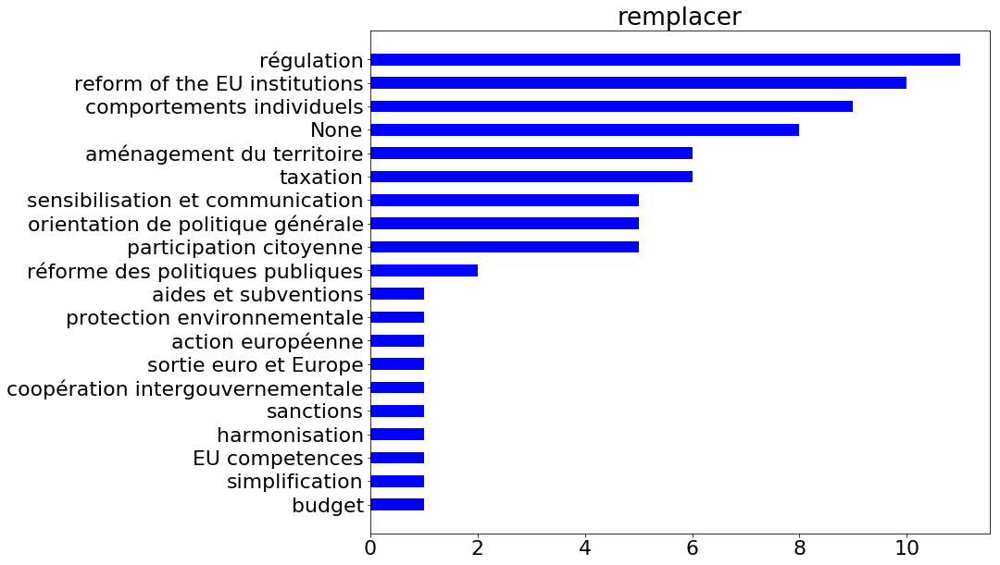



introduire
[('sensibilisation et communication', 12), ('None', 4), ('participation citoyenne', 2), ('harmonisation', 2), ('aides et subventions', 1), ('réforme des politiques publiques', 1), ('comportements individuels', 1), ('régulation', 1), ('reform of the EU institutions', 1), ('taxation', 1), ('orientation de politique générale', 1), ('european protectionism', 1), ('politique sociale', 1)]


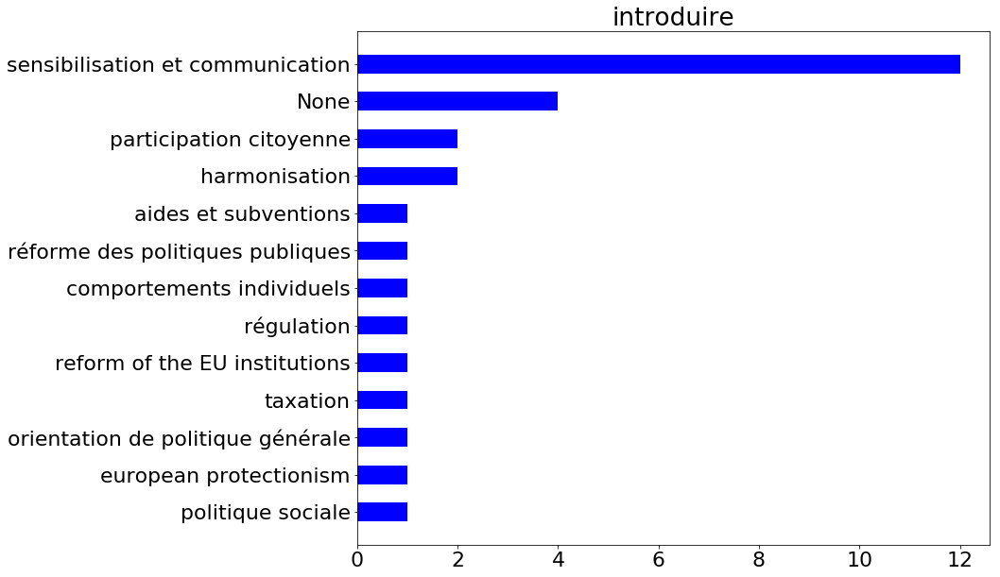



afficher
[('sensibilisation et communication', 21), ('régulation', 4), ('contrôle qualité', 2), ('réforme des politiques publiques', 2), ('None', 2), ('insertion', 1), ('aménagement des espaces', 1), ('orientation de politique générale', 1)]


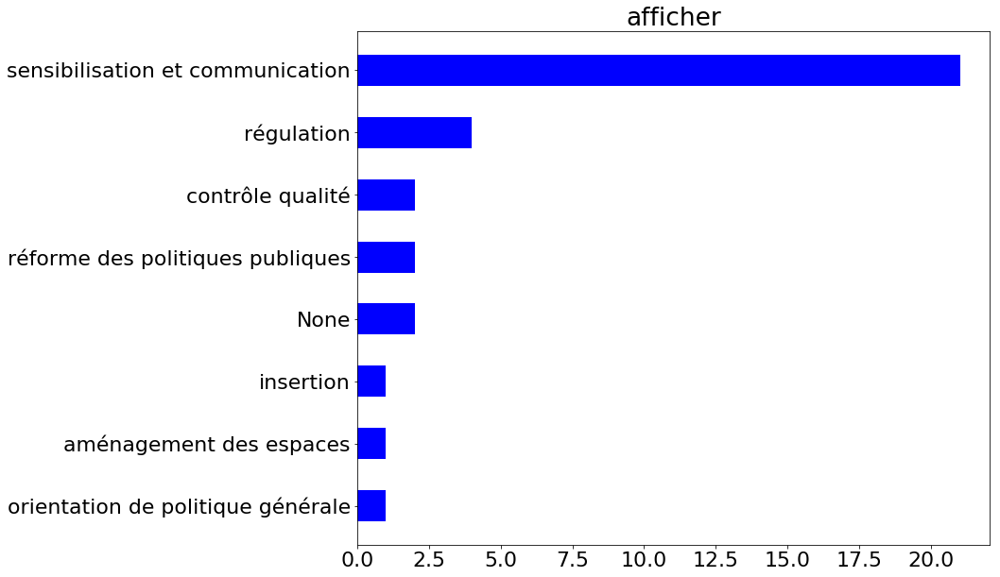



plafonner
[('régulation', 13), ('budget', 2), ('reform of the EU institutions', 2), ('harmonisation', 1), ('politique sociale', 1)]


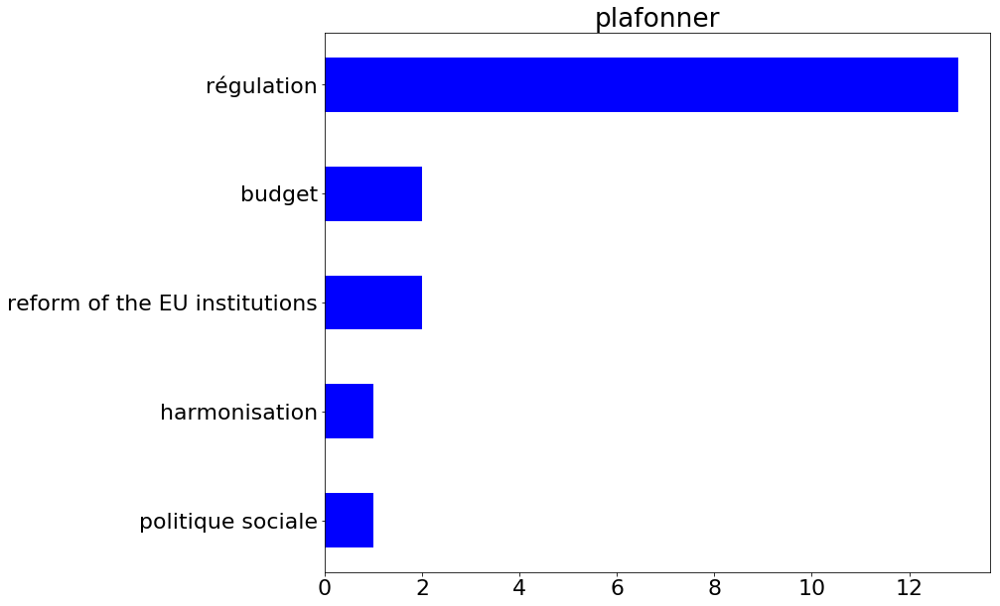



acheter
[('comportements individuels', 153), ('sensibilisation et communication', 22), ('None', 20), ('régulation', 19), ('protectionnisme économique', 17), ('réforme des politiques publiques', 4), ('orientation de politique générale', 4), ('RSE', 3), ('aides et subventions', 2), ('redistribution & répartition', 2), ('taxation', 2), ('aménagement des espaces', 1), ('simplification', 1), ('contrôle qualité', 1), ('harmonisation', 1), ('participation citoyenne', 1), ('sanctions', 1), ('protection environnementale', 1), ('EU competences', 1), ('european protectionism', 1)]


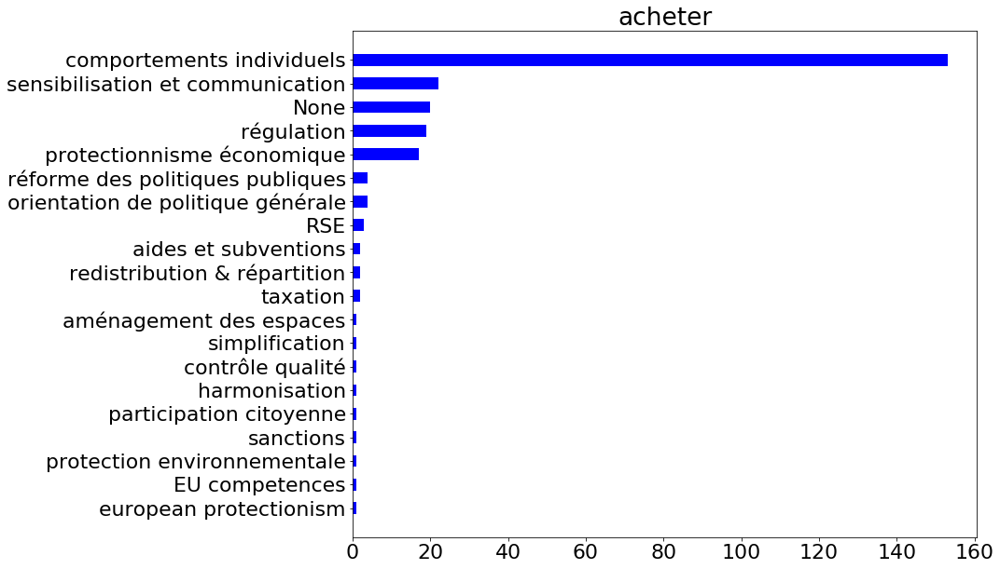



élire
[('reform of the EU institutions', 64), ('participation citoyenne', 21), ('régulation', 4), ('EU competences', 4), ('simplification', 2), ('réforme des politiques publiques', 1), ('comportements individuels', 1), ('sensibilisation et communication', 1), ('sanctions', 1), ('orientation de politique générale', 1), ('budget', 1)]


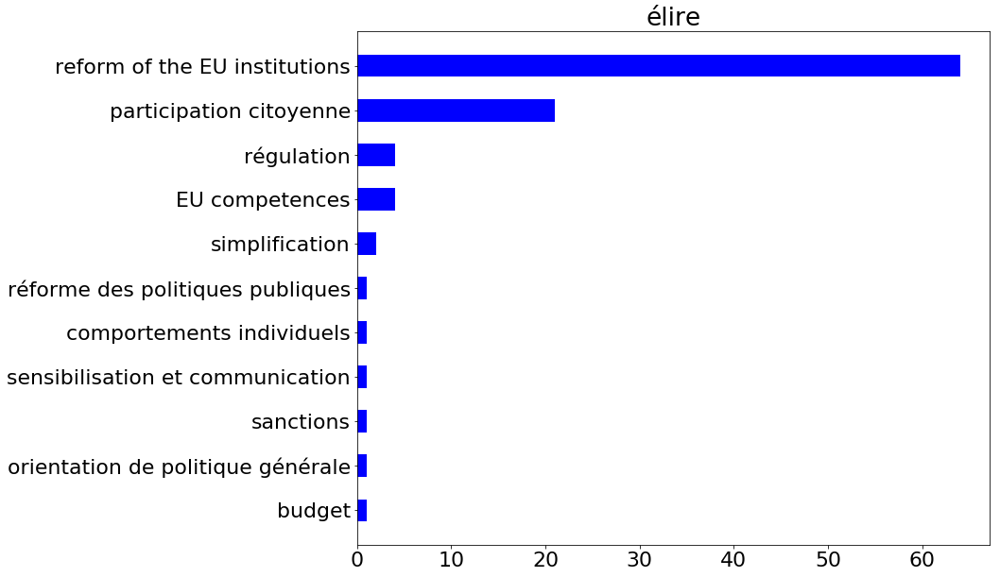



soigner
[('budget', 13), ('formation', 11), ('régulation', 4), ('aides et subventions', 3), ('sensibilisation et communication', 3), ('politique sociale', 2), ('fiscalité & cotisations', 2), ('orientation de politique générale', 1), ('accompagnement & coaching', 1), ('coopération intergouvernementale', 1), ('comportements individuels', 1), ('None', 1), ('sanctions', 1)]


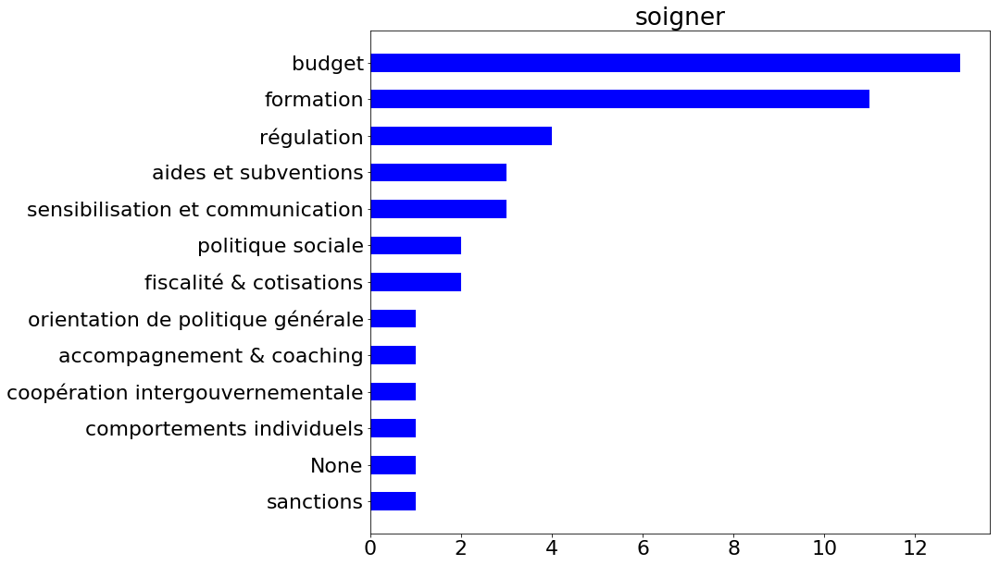



tirer
[('participation citoyenne', 15), ('reform of the EU institutions', 9), ('harmonisation', 4), ('régulation', 3), ('budget', 1), ('taxation', 1), ('orientation de politique générale', 1)]


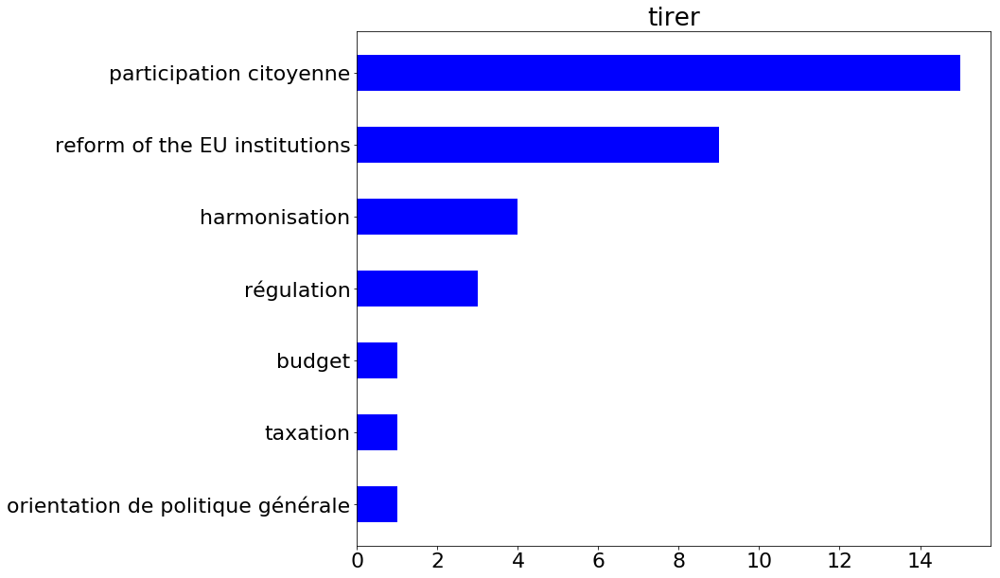



produire
[('régulation', 26), ('None', 8), ('sensibilisation et communication', 8), ('orientation de politique générale', 8), ('comportements individuels', 7), ('protectionnisme économique', 6), ('sanctions', 5), ('aides et subventions', 4), ('aménagement du territoire', 4), ('contrôle qualité', 3), ('taxation', 2), ('réforme des politiques publiques', 2), ('aménagement des espaces', 1), ('RSE', 1), ('redistribution & répartition', 1), ('protection environnementale', 1), ('accompagnement & coaching', 1)]


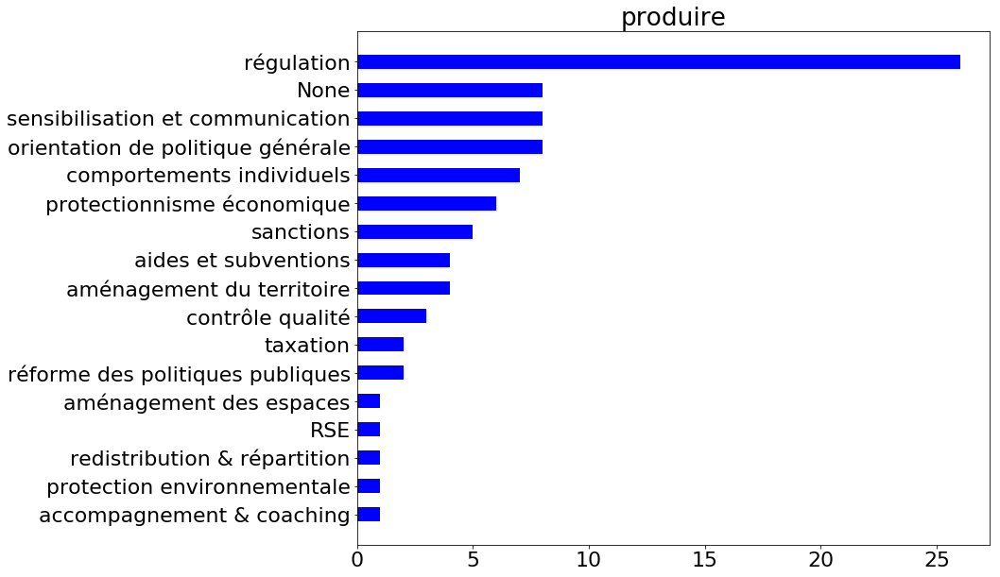



consommer
[('comportements individuels', 94), ('sensibilisation et communication', 22), ('protectionnisme économique', 8), ('régulation', 6), ('None', 5), ('contrôle qualité', 2), ('orientation de politique générale', 2), ('réforme des politiques publiques', 1), ('sanctions', 1), ('taxation', 1), ('european protectionism', 1), ('budget', 1), ('national competences', 1)]


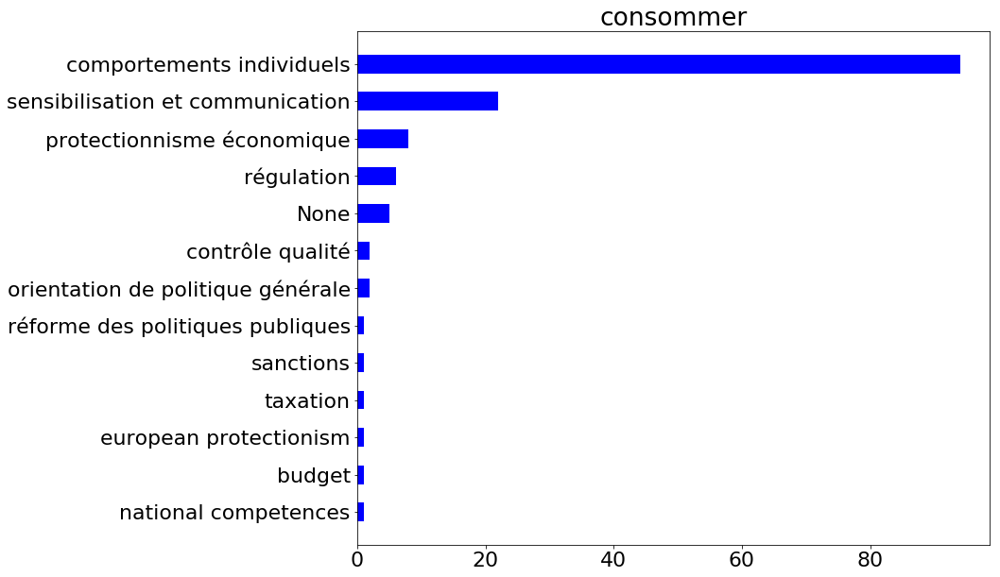



bien manger
[('sensibilisation et communication', 30), ('None', 3), ('comportements individuels', 2), ('contrôle qualité', 1), ('régulation', 1), ('protection environnementale', 1), ('réforme des politiques publiques', 1)]


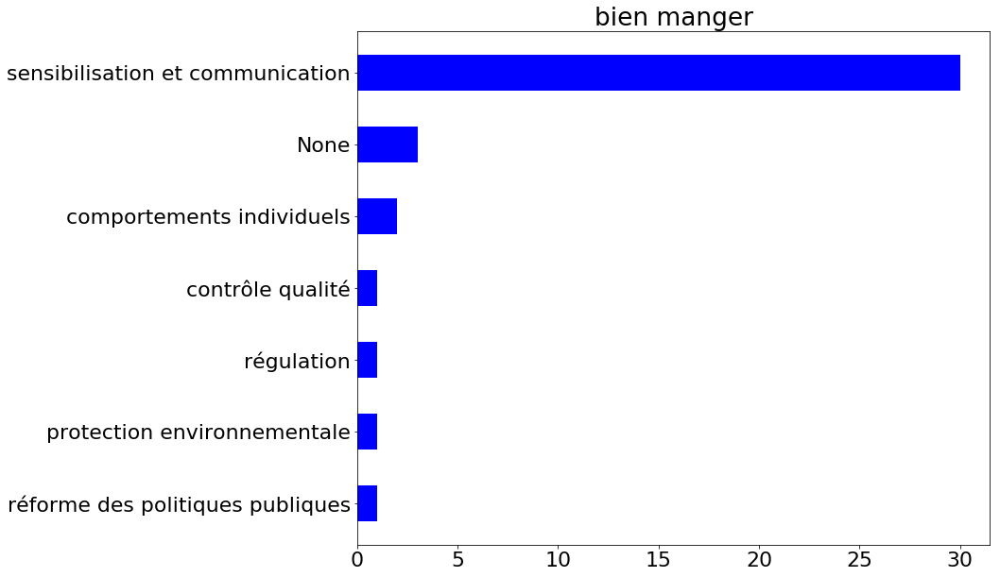



manger
[('comportements individuels', 597), ('sensibilisation et communication', 60), ('régulation', 19), ('None', 15), ('orientation de politique générale', 11), ('protectionnisme économique', 4), ('taxation', 4), ('redistribution & répartition', 4), ('sanctions', 3), ('aménagement du territoire', 2), ('aides et subventions', 2), ("transformation de l'administration", 2), ('harmonisation', 1), ('réforme des politiques publiques', 1), ('participation citoyenne', 1), ('RSE', 1), ('contrôle qualité', 1), ('politique sociale', 1)]


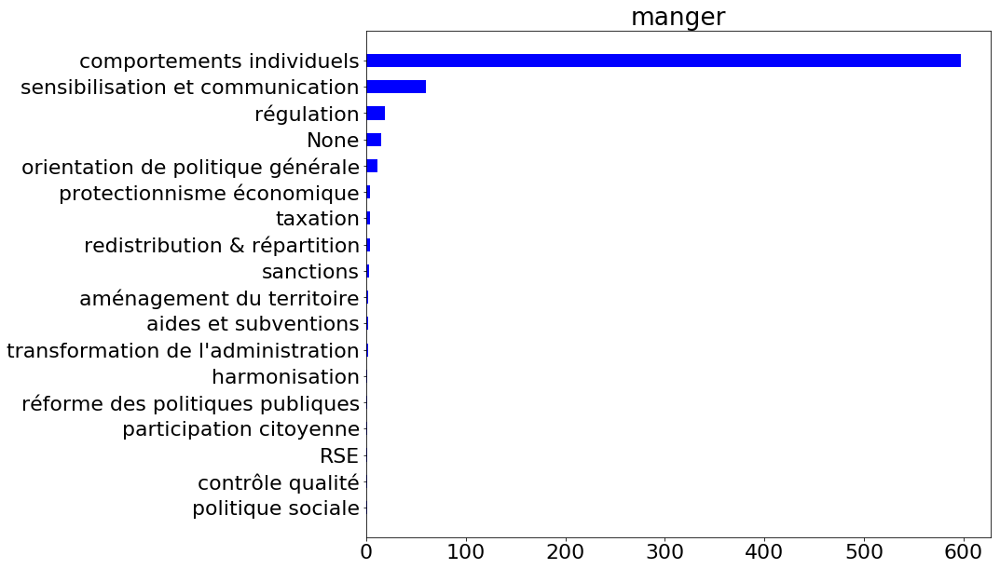



réapprendre
[('comportements individuels', 36), ('sensibilisation et communication', 20), ('orientation de politique générale', 3), ('aménagement du territoire', 1), ('formation', 1)]


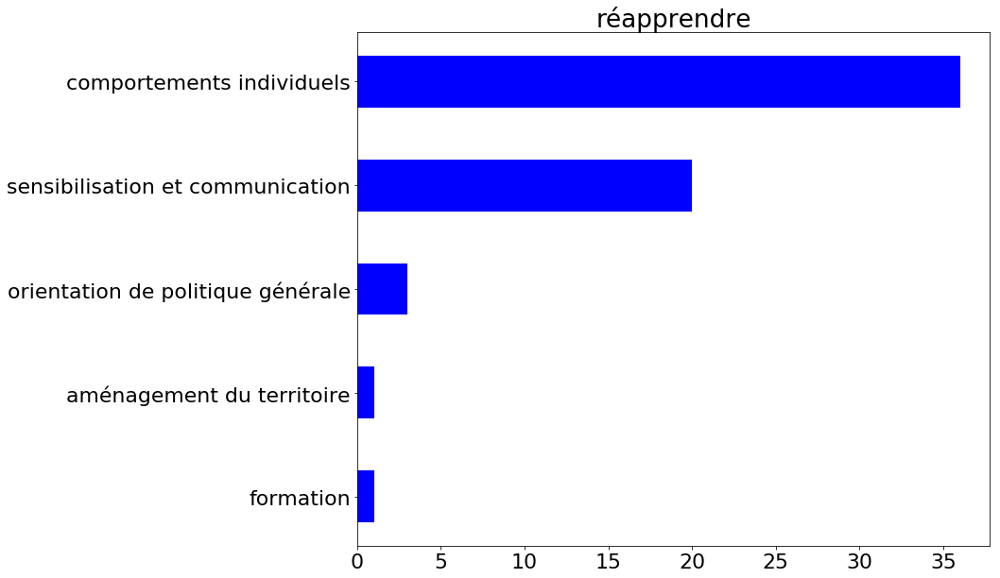



cuisiner
[('comportements individuels', 125), ('sensibilisation et communication', 55), ('orientation de politique générale', 7), ('None', 5), ('régulation', 4), ('protectionnisme économique', 1), ('participation citoyenne', 1), ('RSE', 1)]


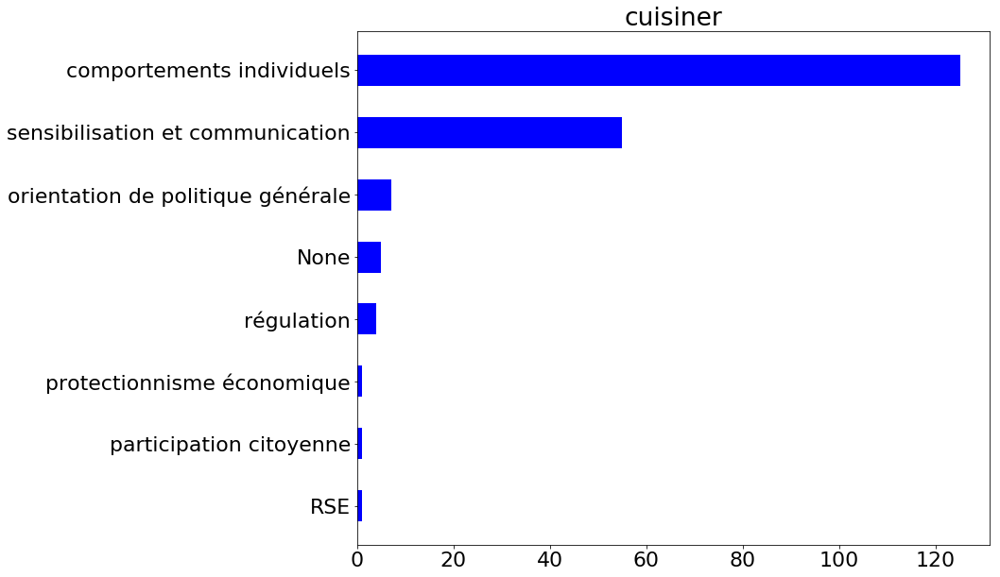



varier
[('comportements individuels', 17), ('sensibilisation et communication', 3), ('None', 3), ('régulation', 2), ('orientation de politique générale', 1), ('formation', 1), ('politique sociale', 1)]


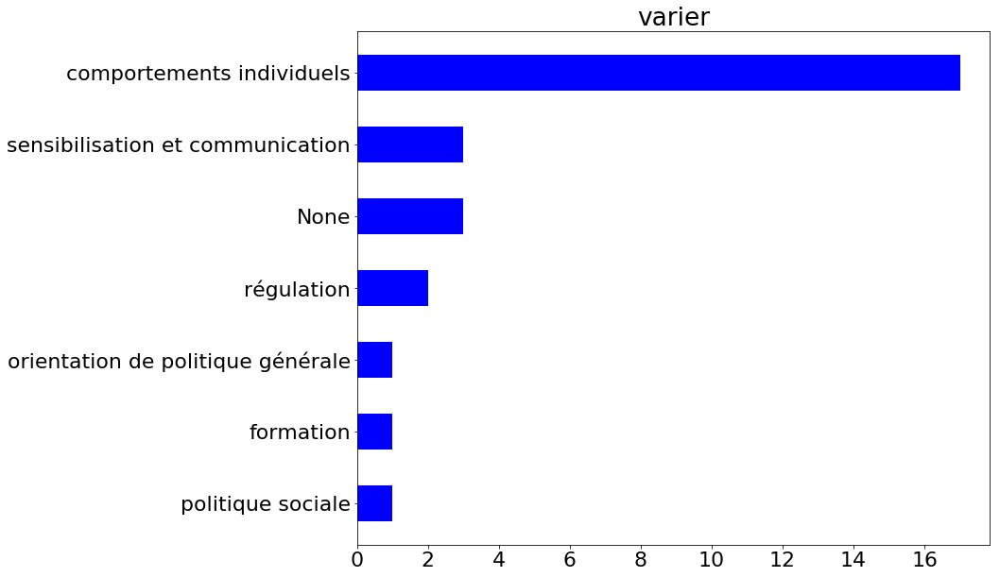



nourrir
[('sensibilisation et communication', 14), ('comportements individuels', 10), ('orientation de politique générale', 7), ('None', 6), ('régulation', 5), ('sanctions', 3), ('aménagement du territoire', 3), ('fiscalité & cotisations', 2), ('protection environnementale', 1), ('réforme des politiques publiques', 1), ('aides et subventions', 1), ('national competences', 1), ('harmonisation', 1), ('participation citoyenne', 1), ('budget', 1)]


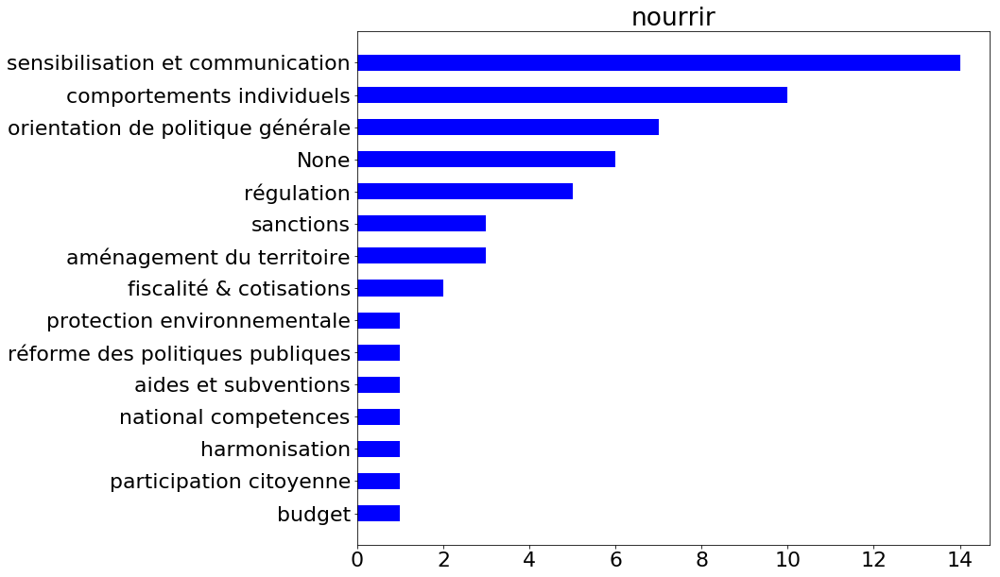



boycotter
[('comportements individuels', 13), ('sanctions', 10), ('protectionnisme économique', 2), ('aménagement du territoire', 1), ('participation citoyenne', 1), ('orientation de politique générale', 1)]


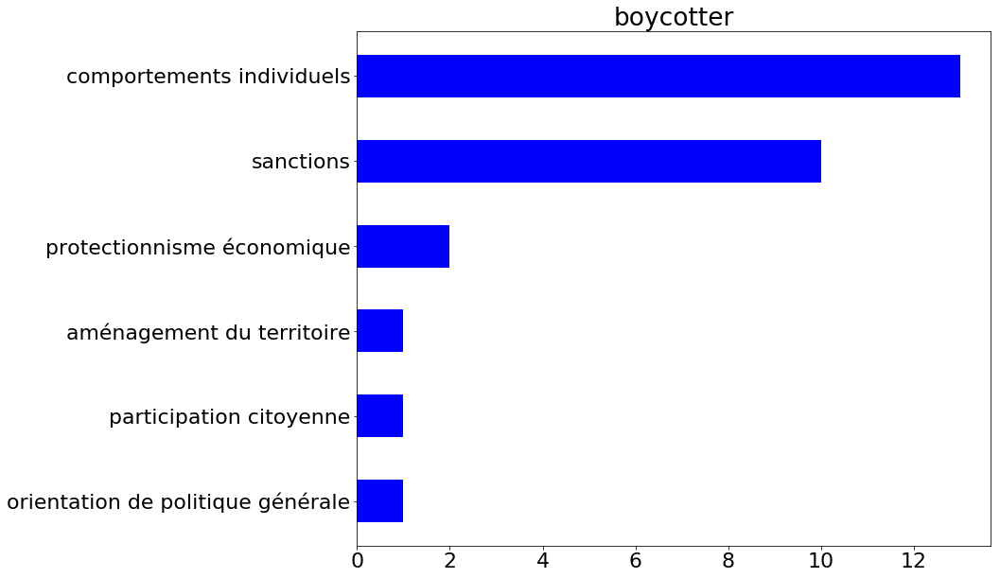



issus
[('taxation', 13), ('régulation', 13), ('comportements individuels', 11), ('None', 7), ('sensibilisation et communication', 5), ('RSE', 2), ('sanctions', 2), ('orientation de politique générale', 2), ('harmonisation', 2), ('aides et subventions', 1), ('simplification', 1), ('réforme des politiques publiques', 1), ('protectionnisme économique', 1), ('european protectionism', 1)]


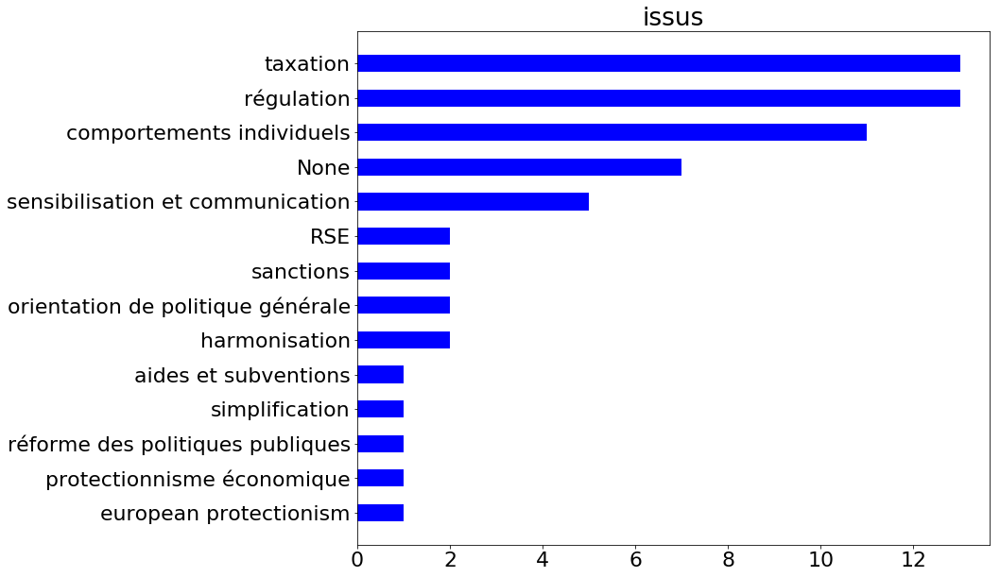



contenir
[('régulation', 15), ('sensibilisation et communication', 8), ('taxation', 7), ('sanctions', 6), ('comportements individuels', 4), ('RSE', 2), ('contrôle qualité', 2), ('protectionnisme économique', 1), ('orientation de politique générale', 1), ('None', 1)]


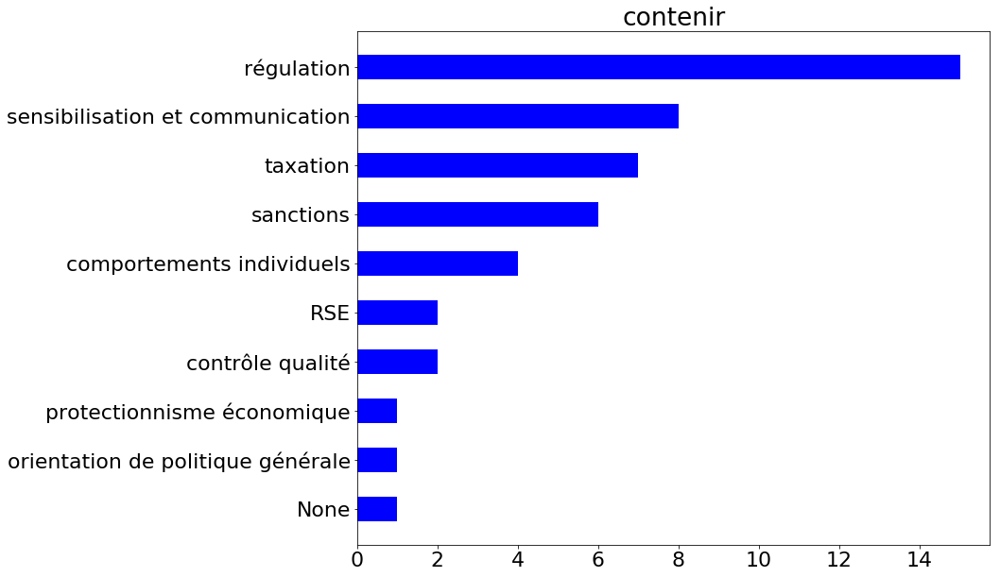



aligner
[('harmonisation', 15), ('régulation', 4), ('coopération intergouvernementale', 1), ('reform of the EU institutions', 1), ('budget', 1), ('orientation de politique générale', 1), ('social protection & public services', 1)]


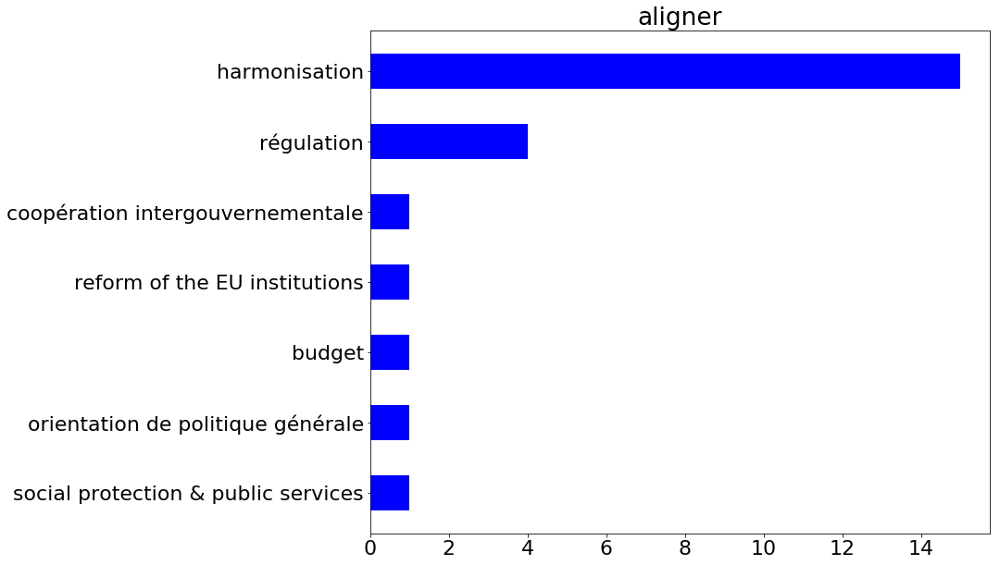



attirer
[('budget', 36), ('sensibilisation et communication', 2), ('politique sociale', 2), ('aménagement du territoire', 1), ('orientation de politique générale', 1), ("transformation de l'administration", 1)]


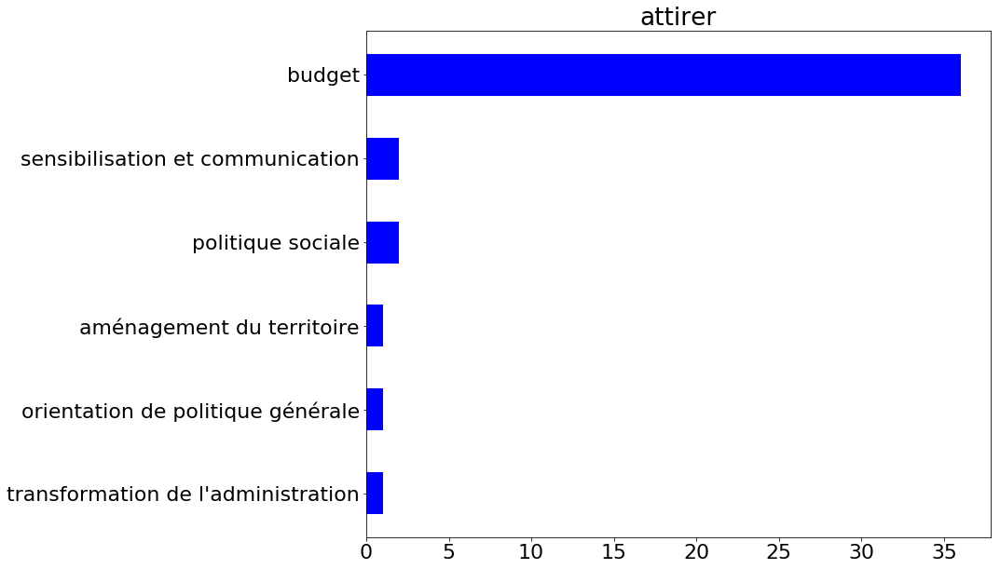



réglementer
[('régulation', 11), ('None', 2), ('simplification', 1), ('taxation', 1)]


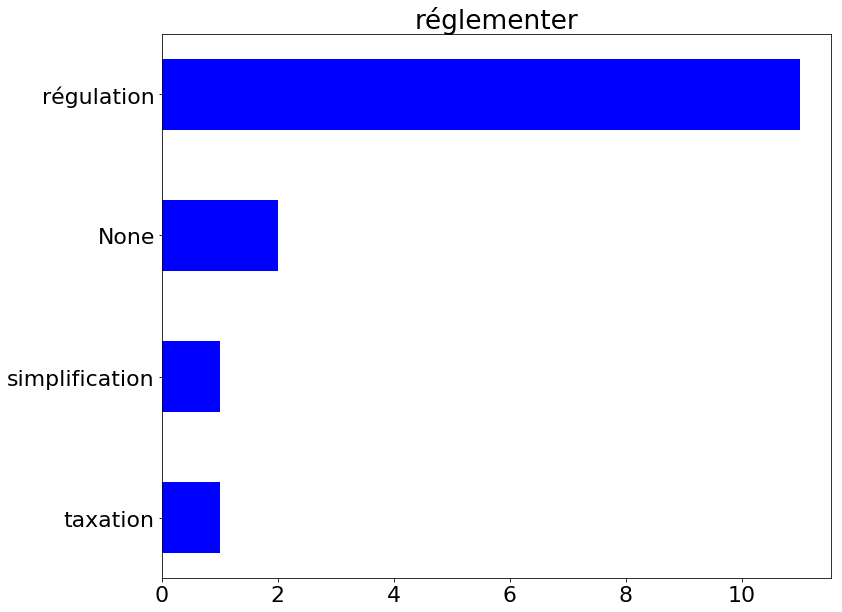



unifier
[('harmonisation', 12), ('justice', 1), ('simplification', 1)]


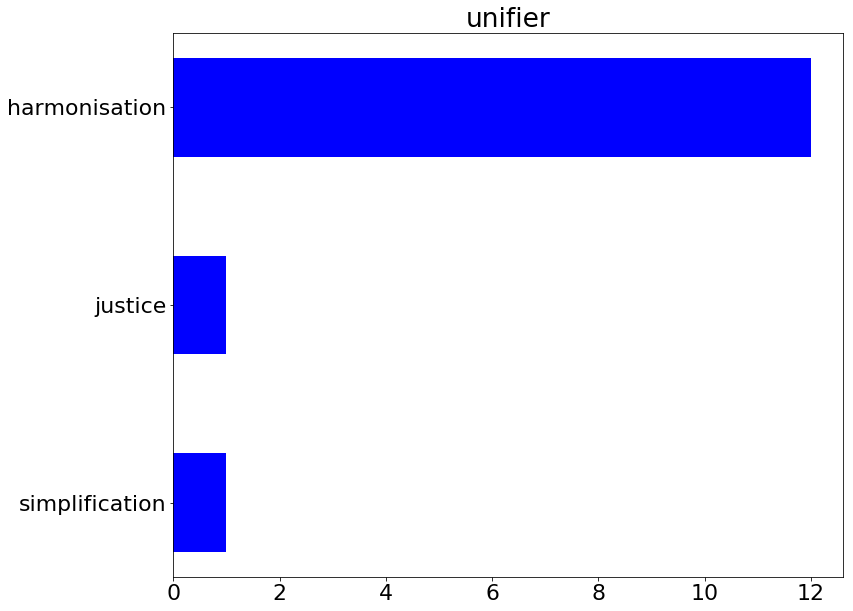



quitter
[('sortie euro et Europe', 71), ('budget', 2), ('régulation', 1)]


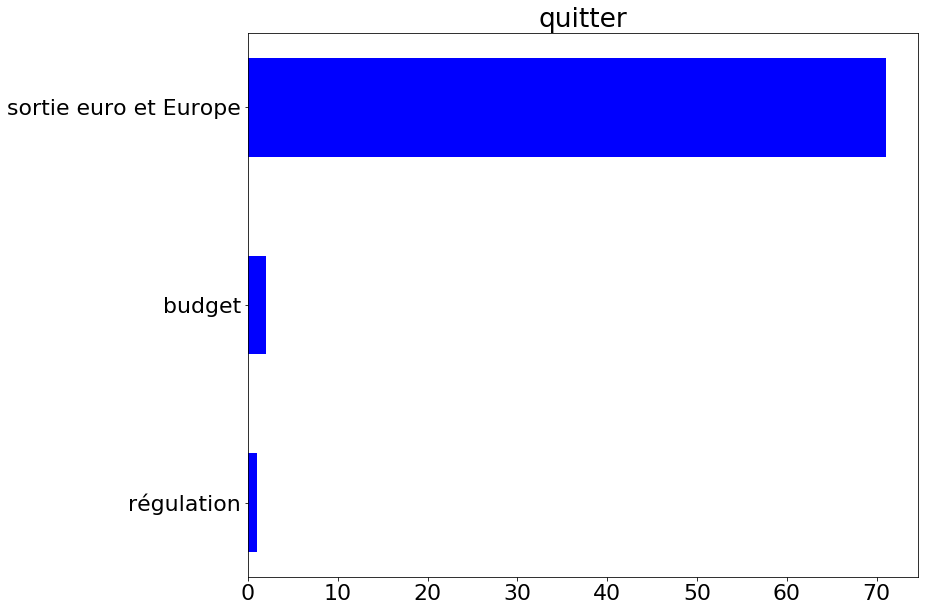



unir
[('coopération intergouvernementale', 11), ('reform of the EU institutions', 7), ('EU competences', 4), ('harmonisation', 3), ('participation citoyenne', 1), ('national competences', 1), ('régulation', 1)]


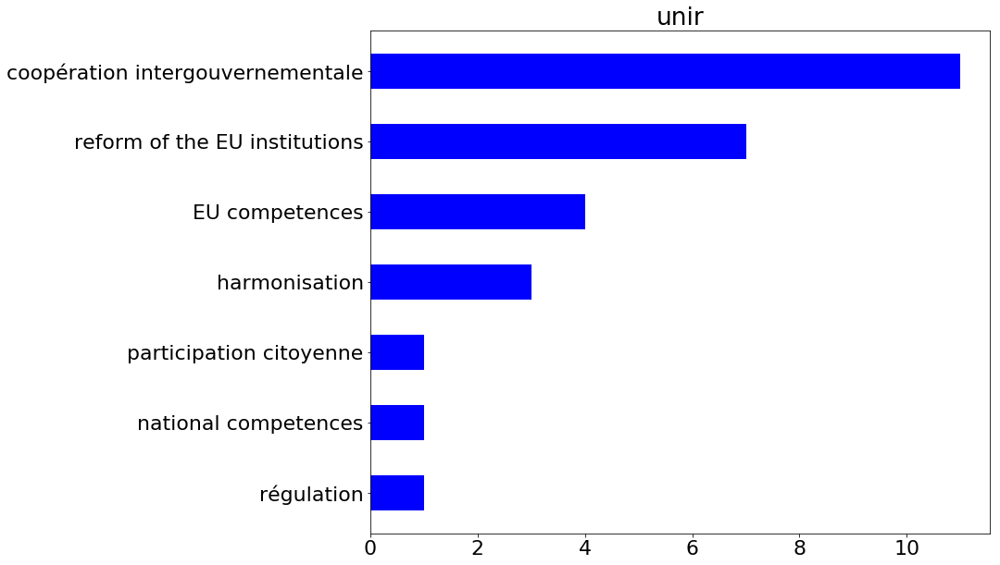



dissoudre
[('sortie euro et Europe', 16), ('reform of the EU institutions', 5), ('participation citoyenne', 2), ('national competences', 1), ('simplification', 1)]


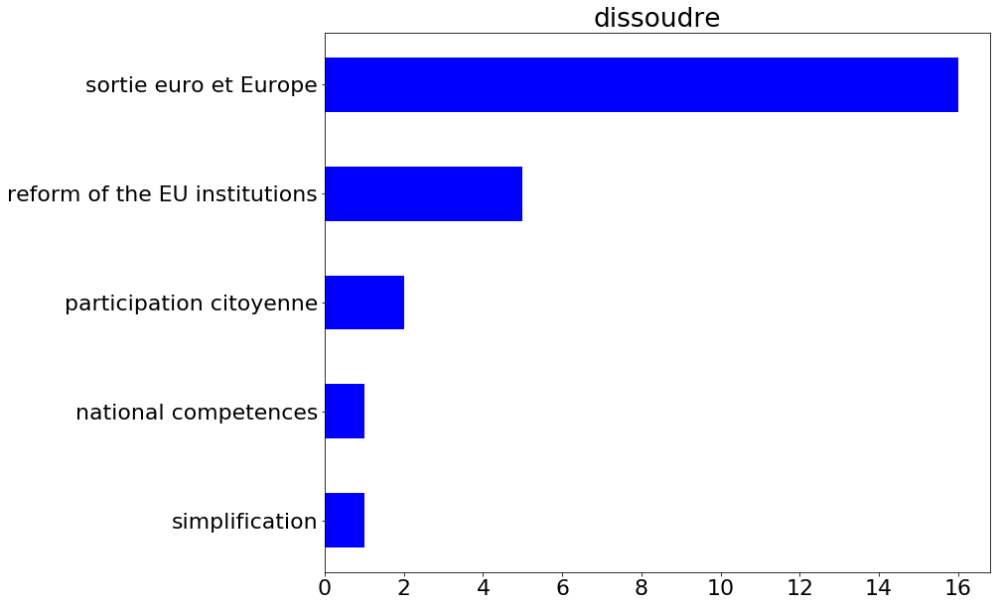



expulser
[('régulation', 12), ('sanctions', 3), ('sortie euro et Europe', 1), ('social protection & public services', 1)]


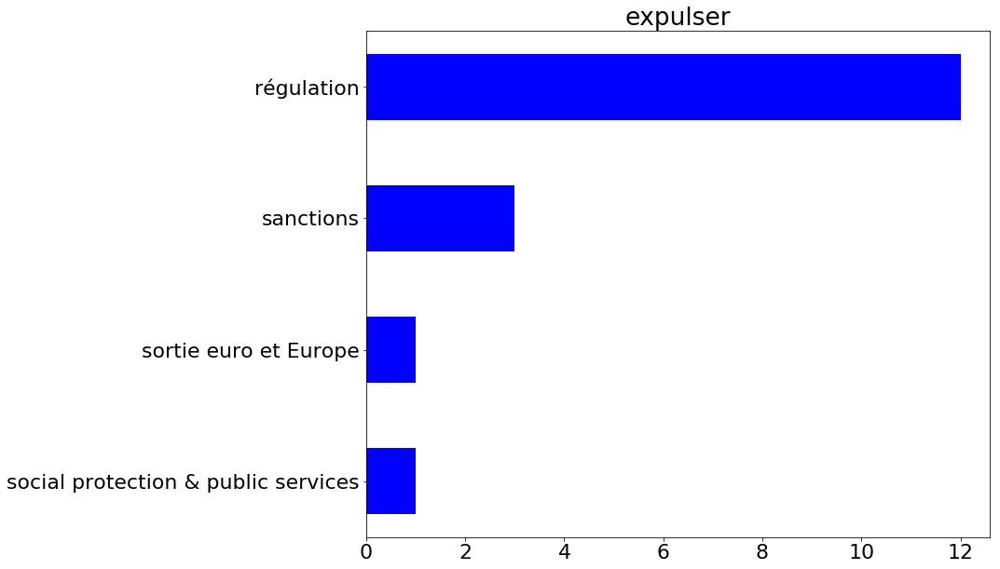



renvoyer
[('régulation', 12), ('orientation de politique générale', 2), ('european protectionism', 1)]


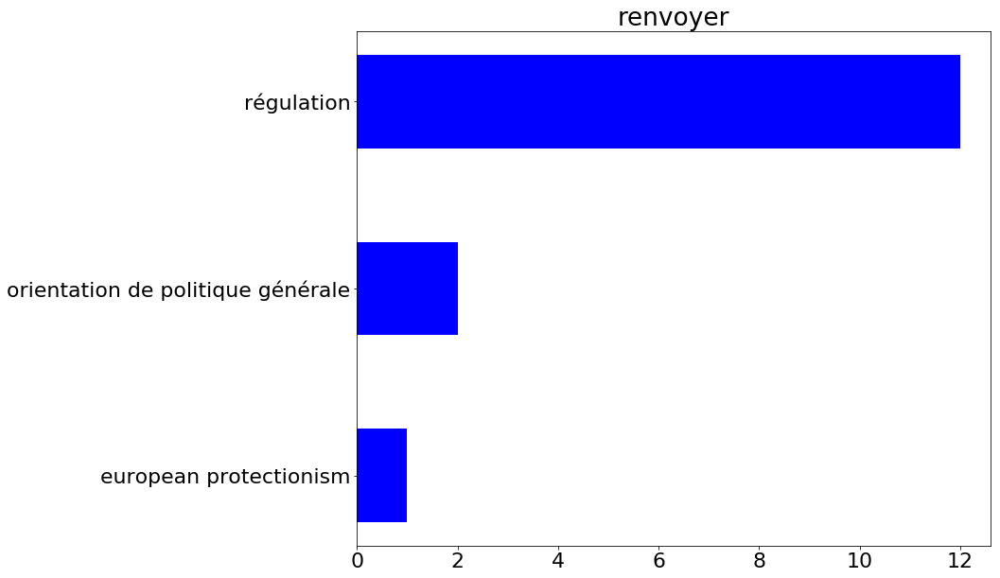

In [18]:
plt.rcParams.update({'font.size': 22})
for k,v in vp2solutioncount.items() : 
    sortedsolution=sorted(vp2solutioncount[k].items(), key=lambda x: x[1], reverse=True)
    if(len(sortedsolution)>1):
        if (sortedsolution[0][1]>10) :
            print(k)
            print(sortedsolution)
            graphe = plt.figure(figsize=(12,10))
            y = range(1,len(sortedsolution)+1)
            height = [j for i,j in sortedsolution]
            width = 0.5
            BarName =[i for i,j in sortedsolution]
            pylab.yticks(y, BarName)
            plt.title(k)
            plt.barh(y, height, width, color='b')
            plt.gca().invert_yaxis()
            plt.show()
            print('\n')

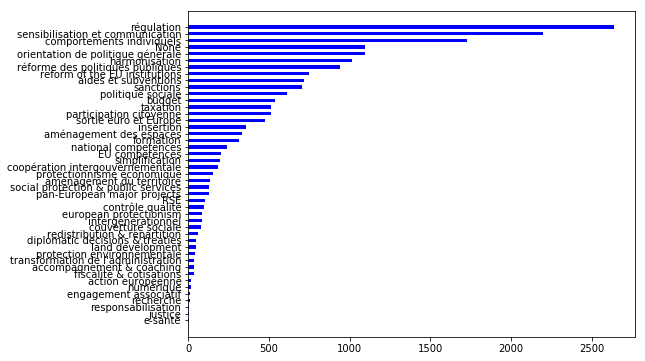

In [101]:
#nombre de proposition par solution
sortedsolutionscount=sorted(solutionscount.items(), key=lambda x: x[1], reverse=True)
graphe = plt.figure(figsize=(8,6))
y = [i for i in range(len(solutionscount))]
height = [j for i,j in sortedsolutionscount]
width = 0.5
BarName =[i for i,j in sortedsolutionscount]
pylab.yticks(y, BarName)
plt.barh(y, height, width, color='b')
plt.gca().invert_yaxis()
plt.show()

In [103]:
print(sorted(solutionscount.items(), key=lambda x: x[1], reverse=True))

[('régulation', 2636), ('sensibilisation et communication', 2201), ('comportements individuels', 1725), ('None', 1094), ('orientation de politique générale', 1092), ('harmonisation', 1014), ('réforme des politiques publiques', 942), ('reform of the EU institutions', 749), ('aides et subventions', 716), ('sanctions', 702), ('politique sociale', 610), ('budget', 538), ('taxation', 512), ('participation citoyenne', 510), ('sortie euro et Europe', 474), ('insertion', 358), ('aménagement des espaces', 333), ('formation', 315), ('national competences', 242), ('EU competences', 201), ('simplification', 193), ('coopération intergouvernementale', 183), ('protectionnisme économique', 151), ('aménagement du territoire', 135), ('social protection & public services', 126), ('pan-European major projects', 125), ('RSE', 104), ('contrôle qualité', 94), ('european protectionism', 87), ('intergénérationnel', 81), ('couverture sociale', 80), ('redistribution & répartition', 60), ('diplomatic decisions & 

appliquer
[('sanctions', 17), ('harmonisation', 13), ('régulation', 10), ('taxation', 9), ('None', 5), ('sensibilisation et communication', 5), ('orientation de politique générale', 4), ('aménagement des espaces', 3), ('réforme des politiques publiques', 2), ('budget', 2), ('national competences', 2), ('insertion', 1), ('participation citoyenne', 1), ('sortie euro et Europe', 1), ('coopération intergouvernementale', 1), ('diplomatic decisions & treaties', 1), ('reform of the EU institutions', 1), ('simplification', 1), ('land development', 1)]


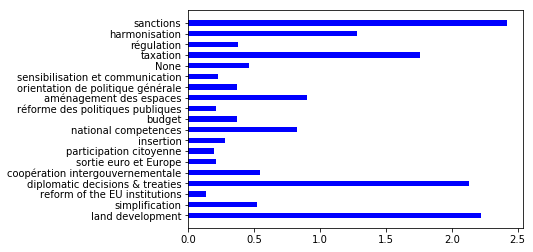



concernant
[('sensibilisation et communication', 12), ('régulation', 6), ('orientation de politique générale', 5), ('formation', 4), ('réforme des politiques publiques', 3), ('aides et subventions', 2), ('national competences', 2), ('sanctions', 1), ('aménagement des espaces', 1), ('budget', 1), ('simplification', 1), ('None', 1), ('e-santé', 1), ('pan-European major projects', 1), ('participation citoyenne', 1)]


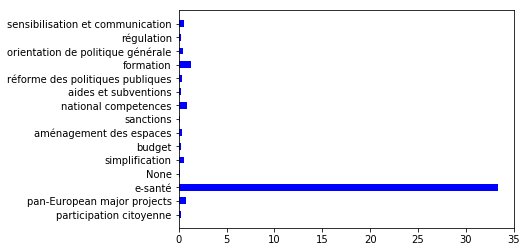



créer
[('reform of the EU institutions', 63), ('sensibilisation et communication', 55), ('politique sociale', 52), ('réforme des politiques publiques', 51), ('EU competences', 41), ('régulation', 38), ('harmonisation', 35), ('budget', 34), ('orientation de politique générale', 33), ('aides et subventions', 28), ('participation citoyenne', 27), ('None', 27), ('coopération intergouvernementale', 23), ('aménagement des espaces', 22), ('aménagement du territoire', 19), ('pan-European major projects', 19), ('taxation', 15), ('formation', 13), ('sanctions', 13), ('intergénérationnel', 11), ('comportements individuels', 10), ('social protection & public services', 8), ('national competences', 7), ('insertion', 6), ('simplification', 6), ('couverture sociale', 6), ('RSE', 5), ('sortie euro et Europe', 5), ('land development', 4), ('redistribution & répartition', 3), ('diplomatic decisions & treaties', 3), ('e-santé', 2), ("transformation de l'administration", 2), ('fiscalité & cotisations', 

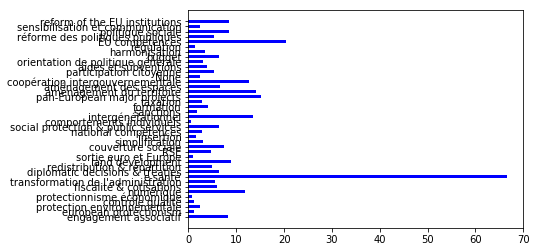



éviter
[('comportements individuels', 82), ('régulation', 44), ('harmonisation', 33), ('sensibilisation et communication', 23), ('orientation de politique générale', 18), ('None', 11), ('aides et subventions', 10), ('sanctions', 9), ('budget', 8), ('simplification', 5), ('protection environnementale', 5), ('politique sociale', 5), ('reform of the EU institutions', 4), ('taxation', 4), ('réforme des politiques publiques', 3), ('formation', 3), ('protectionnisme économique', 3), ('diplomatic decisions & treaties', 3), ('national competences', 3), ('aménagement des espaces', 2), ('coopération intergouvernementale', 2), ('couverture sociale', 2), ("transformation de l'administration", 2), ('contrôle qualité', 1), ('redistribution & répartition', 1), ('action européenne', 1), ('participation citoyenne', 1), ('social protection & public services', 1), ('european protectionism', 1), ('intergénérationnel', 1), ('engagement associatif', 1)]


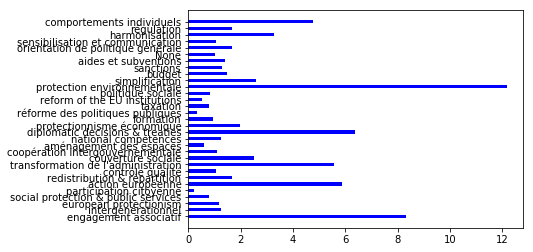



aider
[('aides et subventions', 87), ('None', 26), ('sensibilisation et communication', 15), ('comportements individuels', 15), ('orientation de politique générale', 14), ('régulation', 12), ('politique sociale', 12), ('réforme des politiques publiques', 11), ('insertion', 11), ('formation', 10), ('budget', 8), ('coopération intergouvernementale', 8), ('aménagement des espaces', 6), ('accompagnement & coaching', 6), ("transformation de l'administration", 5), ('participation citoyenne', 4), ('protectionnisme économique', 3), ('social protection & public services', 3), ('intergénérationnel', 3), ('RSE', 3), ('harmonisation', 2), ('simplification', 2), ('sanctions', 2), ('taxation', 2), ('couverture sociale', 2), ('sortie euro et Europe', 1), ('action européenne', 1), ('contrôle qualité', 1), ('redistribution & répartition', 1), ('european protectionism', 1), ('land development', 1), ('pan-European major projects', 1), ('numérique', 1), ('fiscalité & cotisations', 1)]


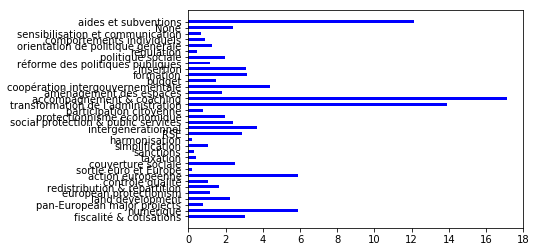



vivre
[('aides et subventions', 16), ('sensibilisation et communication', 15), ('comportements individuels', 15), ('politique sociale', 11), ('budget', 10), ('réforme des politiques publiques', 9), ('régulation', 9), ('None', 7), ('orientation de politique générale', 7), ('pan-European major projects', 3), ('sortie euro et Europe', 2), ('recherche', 2), ('formation', 1), ('action européenne', 1), ('insertion', 1), ('participation citoyenne', 1), ('RSE', 1), ('protectionnisme économique', 1), ('reform of the EU institutions', 1), ('intergénérationnel', 1)]


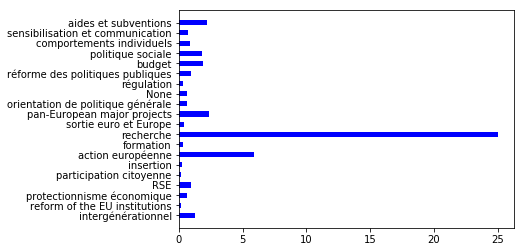



inclure
[('insertion', 15), ('réforme des politiques publiques', 10), ('sensibilisation et communication', 9), ('aides et subventions', 4), ('formation', 3), ('orientation de politique générale', 3), ('participation citoyenne', 3), ('harmonisation', 2), ('None', 2), ('taxation', 2), ('régulation', 2), ('pan-European major projects', 2), ('contrôle qualité', 1), ('reform of the EU institutions', 1), ('comportements individuels', 1), ('fiscalité & cotisations', 1), ('intergénérationnel', 1), ('politique sociale', 1)]


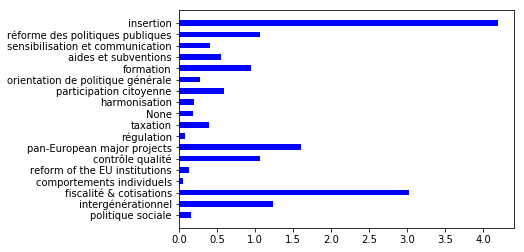



utiliser
[('régulation', 33), ('comportements individuels', 23), ('sensibilisation et communication', 13), ('sanctions', 13), ('réforme des politiques publiques', 6), ('budget', 5), ('None', 5), ('taxation', 5), ('aides et subventions', 4), ('aménagement du territoire', 3), ('orientation de politique générale', 2), ('RSE', 2), ('land development', 2), ('european protectionism', 2), ('formation', 1), ('insertion', 1), ('protectionnisme économique', 1), ('contrôle qualité', 1), ('participation citoyenne', 1), ('harmonisation', 1), ('national competences', 1), ('reform of the EU institutions', 1), ('social protection & public services', 1), ('recherche', 1)]


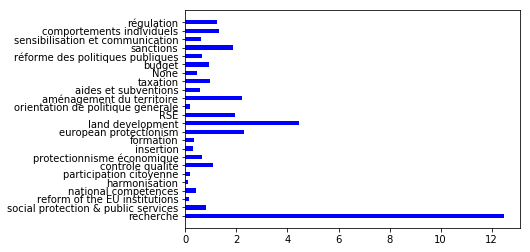



former
[('formation', 109), ('sensibilisation et communication', 44), ('réforme des politiques publiques', 10), ('insertion', 8), ('budget', 6), ('aides et subventions', 5), ('aménagement des espaces', 4), ('participation citoyenne', 4), ('régulation', 4), ('politique sociale', 4), ('orientation de politique générale', 3), ('harmonisation', 2), ('accompagnement & coaching', 2), ('reform of the EU institutions', 2), ('simplification', 1), ('None', 1), ('EU competences', 1), ('RSE', 1), ('comportements individuels', 1), ('couverture sociale', 1)]


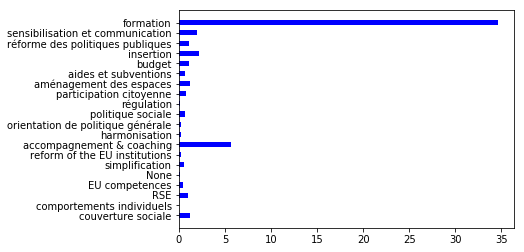



sensibiliser
[('sensibilisation et communication', 139), ('insertion', 6), ('formation', 5), ('orientation de politique générale', 3), ('aménagement des espaces', 1), ('sanctions', 1), ('aides et subventions', 1), ('accompagnement & coaching', 1), ('régulation', 1), ('politique sociale', 1), ('numérique', 1)]


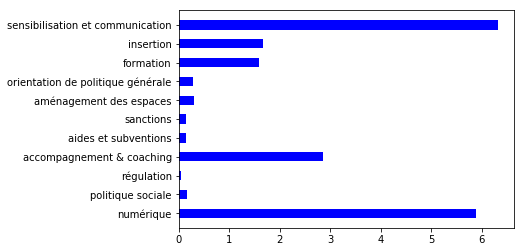



informer
[('sensibilisation et communication', 81), ('formation', 5), ('insertion', 3), ('comportements individuels', 3), ('simplification', 2), ('régulation', 2), ('sanctions', 1), ('accompagnement & coaching', 1)]


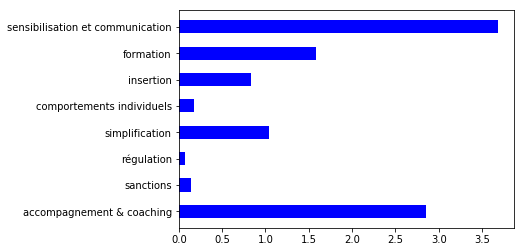



interdire
[('régulation', 286), ('sanctions', 118), ('reform of the EU institutions', 14), ('protectionnisme économique', 7), ('taxation', 6), ('orientation de politique générale', 6), ('réforme des politiques publiques', 5), ('contrôle qualité', 5), ('european protectionism', 5), ('protection environnementale', 3), ('None', 3), ('sensibilisation et communication', 2), ('aides et subventions', 2), ('land development', 2), ('harmonisation', 2), ('budget', 2), ('national competences', 2), ('social protection & public services', 2), ('action européenne', 1), ('participation citoyenne', 1), ('sortie euro et Europe', 1), ('diplomatic decisions & treaties', 1), ('fiscalité & cotisations', 1)]


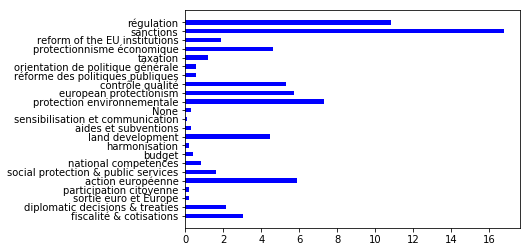



organiser
[('sensibilisation et communication', 18), ('politique sociale', 15), ('participation citoyenne', 8), ('comportements individuels', 7), ('None', 6), ('aménagement du territoire', 4), ('orientation de politique générale', 4), ('coopération intergouvernementale', 3), ('régulation', 3), ('insertion', 2), ('réforme des politiques publiques', 2), ('reform of the EU institutions', 2), ('land development', 2), ('formation', 1), ('protectionnisme économique', 1), ('aides et subventions', 1), ('harmonisation', 1), ('RSE', 1), ('sortie euro et Europe', 1), ('intergénérationnel', 1), ('engagement associatif', 1)]


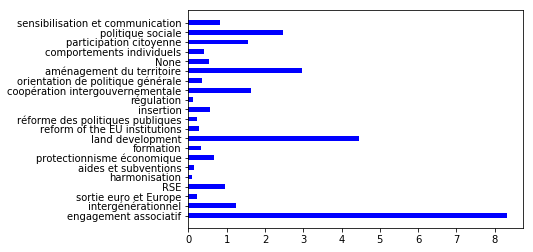



rembourser
[('aides et subventions', 17), ('réforme des politiques publiques', 8), ('budget', 4), ('orientation de politique générale', 2), ('régulation', 1), ('taxation', 1), ('pan-European major projects', 1), ('sanctions', 1), ('couverture sociale', 1)]


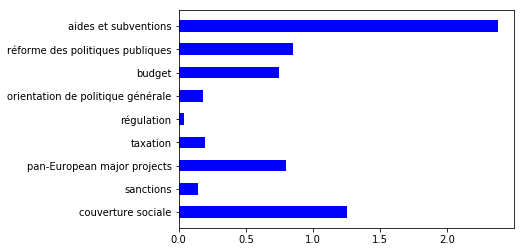



adapter
[('aménagement des espaces', 54), ('politique sociale', 32), ('insertion', 29), ('réforme des politiques publiques', 25), ('aides et subventions', 22), ('formation', 19), ('None', 16), ('orientation de politique générale', 14), ('sensibilisation et communication', 12), ('budget', 11), ('simplification', 6), ('comportements individuels', 6), ('régulation', 6), ('intergénérationnel', 5), ('harmonisation', 4), ('taxation', 2), ('participation citoyenne', 2), ('national competences', 2), ('couverture sociale', 2), ('fiscalité & cotisations', 2), ('aménagement du territoire', 1), ('coopération intergouvernementale', 1), ('social protection & public services', 1), ('RSE', 1), ("transformation de l'administration", 1), ('recherche', 1), ('engagement associatif', 1)]


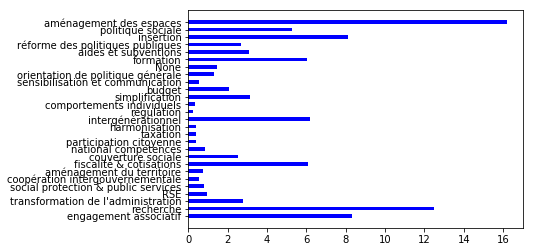



trouver
[('orientation de politique générale', 13), ('sensibilisation et communication', 11), ('None', 8), ('comportements individuels', 8), ('réforme des politiques publiques', 7), ('régulation', 6), ('insertion', 5), ('aides et subventions', 5), ('budget', 4), ('protectionnisme économique', 3), ('formation', 2), ('aménagement des espaces', 2), ('pan-European major projects', 2), ('politique sociale', 2), ('participation citoyenne', 1), ('redistribution & répartition', 1), ('reform of the EU institutions', 1), ('EU competences', 1), ('coopération intergouvernementale', 1), ('social protection & public services', 1), ('RSE', 1)]


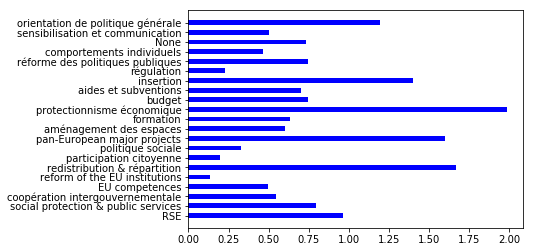



savoir
[('sensibilisation et communication', 27), ('comportements individuels', 17), ('régulation', 10), ('None', 3), ('réforme des politiques publiques', 3), ('formation', 3), ('orientation de politique générale', 2), ('insertion', 2), ('aménagement des espaces', 2), ('aides et subventions', 2), ('protectionnisme économique', 2), ('sortie euro et Europe', 2), ('sanctions', 2), ('politique sociale', 2), ('accompagnement & coaching', 1), ('european protectionism', 1), ('harmonisation', 1), ('social protection & public services', 1), ('participation citoyenne', 1), ('couverture sociale', 1)]


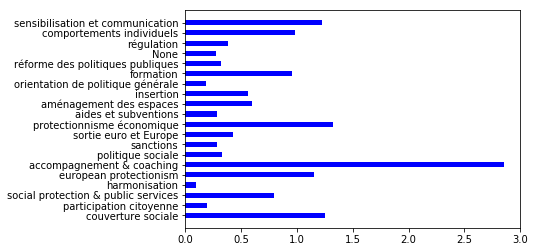



prendre
[('sensibilisation et communication', 52), ('comportements individuels', 46), ('réforme des politiques publiques', 38), ('aides et subventions', 33), ('régulation', 32), ('None', 18), ('orientation de politique générale', 16), ('politique sociale', 13), ('budget', 9), ('participation citoyenne', 9), ('reform of the EU institutions', 8), ('sanctions', 6), ('couverture sociale', 6), ('national competences', 5), ('harmonisation', 5), ('simplification', 4), ('insertion', 3), ('redistribution & répartition', 3), ('formation', 2), ('taxation', 2), ('pan-European major projects', 2), ('coopération intergouvernementale', 2), ("transformation de l'administration", 2), ('protectionnisme économique', 1), ('accompagnement & coaching', 1), ('sortie euro et Europe', 1), ('EU competences', 1), ('social protection & public services', 1), ('RSE', 1), ('fiscalité & cotisations', 1), ('recherche', 1)]


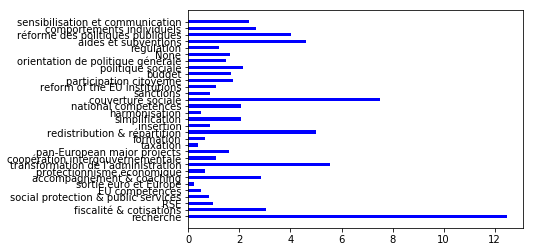



lutter
[('sanctions', 24), ('régulation', 24), ('sensibilisation et communication', 12), ('orientation de politique générale', 7), ('pan-European major projects', 6), ('taxation', 5), ('harmonisation', 5), ('politique sociale', 5), ('participation citoyenne', 3), ('coopération intergouvernementale', 3), ('None', 2), ('comportements individuels', 2), ('redistribution & répartition', 2), ('aides et subventions', 2), ('budget', 2), ('intergénérationnel', 2), ('réforme des politiques publiques', 1), ('accompagnement & coaching', 1), ('sortie euro et Europe', 1), ('reform of the EU institutions', 1), ('RSE', 1), ('EU competences', 1), ('national competences', 1), ('land development', 1), ('numérique', 1), ('fiscalité & cotisations', 1)]


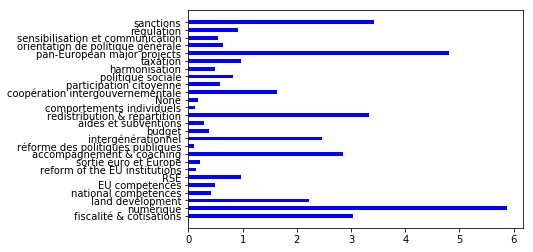



élevés
[('comportements individuels', 12), ('régulation', 8), ('sensibilisation et communication', 4), ('orientation de politique générale', 4), ('harmonisation', 4), ('sanctions', 2), ('réforme des politiques publiques', 1), ('protectionnisme économique', 1), ('sortie euro et Europe', 1), ('None', 1), ('contrôle qualité', 1), ('taxation', 1), ('fiscalité & cotisations', 1), ('budget', 1)]


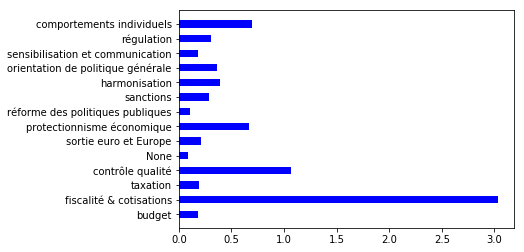



reconnaître
[('réforme des politiques publiques', 44), ('sensibilisation et communication', 27), ('None', 7), ('politique sociale', 7), ('comportements individuels', 5), ('harmonisation', 5), ('participation citoyenne', 4), ('aides et subventions', 4), ('orientation de politique générale', 3), ('insertion', 2), ('aménagement des espaces', 2), ('simplification', 2), ('régulation', 2), ('sanctions', 2), ('formation', 2), ('reform of the EU institutions', 1), ('national competences', 1), ('coopération intergouvernementale', 1), ('budget', 1), ('intergénérationnel', 1), ('couverture sociale', 1)]


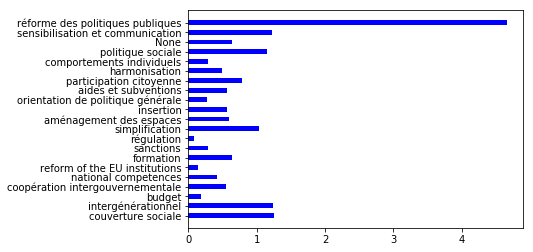



faciliter
[('simplification', 31), ('politique sociale', 19), ('insertion', 16), ('aménagement des espaces', 12), ('aides et subventions', 11), ('orientation de politique générale', 10), ('None', 9), ('réforme des politiques publiques', 7), ('sensibilisation et communication', 7), ('régulation', 6), ('formation', 4), ('harmonisation', 4), ('budget', 4), ('coopération intergouvernementale', 4), ('sanctions', 3), ('comportements individuels', 3), ('couverture sociale', 2), ('intergénérationnel', 2), ("transformation de l'administration", 2), ('protectionnisme économique', 1), ('aménagement du territoire', 1), ('redistribution & répartition', 1), ('accompagnement & coaching', 1), ('participation citoyenne', 1), ('taxation', 1), ('pan-European major projects', 1), ('fiscalité & cotisations', 1), ('engagement associatif', 1)]


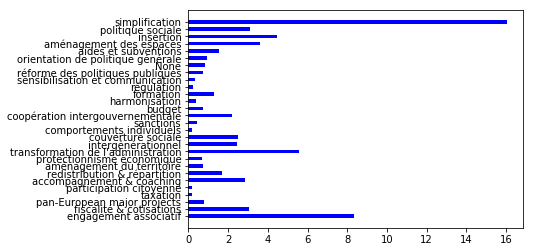



augmenter
[('budget', 56), ('taxation', 27), ('réforme des politiques publiques', 27), ('aides et subventions', 22), ('régulation', 19), ('politique sociale', 15), ('None', 13), ('orientation de politique générale', 10), ('social protection & public services', 10), ('sanctions', 8), ('formation', 8), ('comportements individuels', 7), ('harmonisation', 6), ('sensibilisation et communication', 5), ('insertion', 3), ('aménagement des espaces', 3), ('redistribution & répartition', 3), ('RSE', 3), ('national competences', 3), ('protectionnisme économique', 2), ('coopération intergouvernementale', 2), ('reform of the EU institutions', 2), ('participation citoyenne', 1), ('EU competences', 1), ('diplomatic decisions & treaties', 1), ('intergénérationnel', 1)]


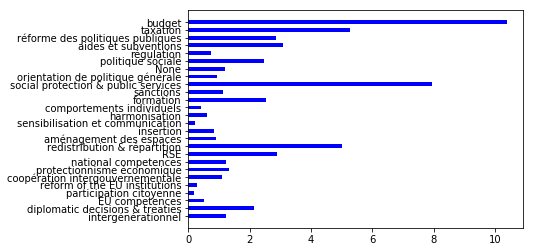



permettre
[('None', 53), ('régulation', 49), ('aides et subventions', 45), ('politique sociale', 44), ('sensibilisation et communication', 42), ('réforme des politiques publiques', 35), ('orientation de politique générale', 30), ('insertion', 29), ('comportements individuels', 25), ('budget', 21), ('aménagement des espaces', 15), ('participation citoyenne', 14), ('formation', 10), ('harmonisation', 9), ('simplification', 7), ('taxation', 7), ('reform of the EU institutions', 7), ('social protection & public services', 7), ('aménagement du territoire', 6), ('couverture sociale', 6), ('redistribution & répartition', 4), ('coopération intergouvernementale', 4), ('national competences', 4), ('sortie euro et Europe', 3), ('pan-European major projects', 3), ('fiscalité & cotisations', 3), ('recherche', 2), ('sanctions', 1), ('protection environnementale', 1), ('EU competences', 1), ('diplomatic decisions & treaties', 1), ('land development', 1), ('intergénérationnel', 1), ('RSE', 1), ('eng

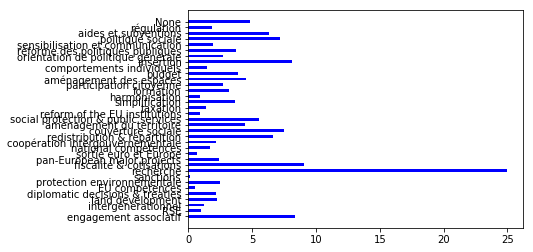



soutenir
[('aides et subventions', 21), ('politique sociale', 13), ('None', 9), ('orientation de politique générale', 7), ('insertion', 5), ('comportements individuels', 5), ('budget', 3), ('protectionnisme économique', 3), ('régulation', 2), ('formation', 2), ('participation citoyenne', 2), ('simplification', 1), ('sensibilisation et communication', 1), ('aménagement du territoire', 1), ('RSE', 1), ('pan-European major projects', 1), ('reform of the EU institutions', 1), ('taxation', 1), ('diplomatic decisions & treaties', 1), ('intergénérationnel', 1)]


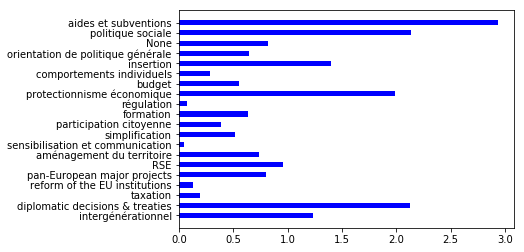



donner
[('sensibilisation et communication', 68), ('aides et subventions', 52), ('budget', 28), ('régulation', 28), ('orientation de politique générale', 22), ('participation citoyenne', 22), ('réforme des politiques publiques', 21), ('None', 19), ('reform of the EU institutions', 19), ('politique sociale', 17), ('comportements individuels', 14), ('harmonisation', 10), ('insertion', 5), ('formation', 5), ('sanctions', 5), ('RSE', 4), ('taxation', 4), ('social protection & public services', 4), ('couverture sociale', 4), ('aménagement du territoire', 3), ('redistribution & répartition', 3), ('protectionnisme économique', 3), ('EU competences', 3), ('aménagement des espaces', 2), ('simplification', 2), ('pan-European major projects', 2), ('accompagnement & coaching', 1), ('responsabilisation', 1), ('national competences', 1), ('coopération intergouvernementale', 1), ('european protectionism', 1)]


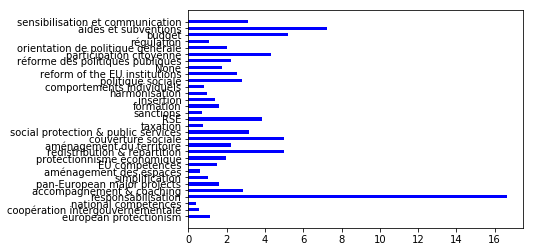



travailler
[('réforme des politiques publiques', 18), ('orientation de politique générale', 16), ('comportements individuels', 12), ('régulation', 11), ('sensibilisation et communication', 10), ('aides et subventions', 8), ('insertion', 6), ('protectionnisme économique', 6), ('None', 5), ('formation', 3), ('budget', 3), ('politique sociale', 3), ('simplification', 2), ('protection environnementale', 2), ('aménagement du territoire', 2), ('pan-European major projects', 2), ('taxation', 2), ('sanctions', 2), ('aménagement des espaces', 1), ('reform of the EU institutions', 1), ('participation citoyenne', 1), ('social protection & public services', 1), ('sortie euro et Europe', 1), ('european protectionism', 1), ('fiscalité & cotisations', 1), ("transformation de l'administration", 1)]


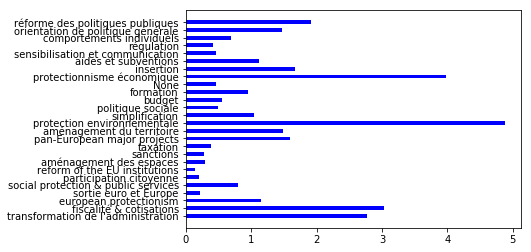



promouvoir
[('sensibilisation et communication', 40), ('orientation de politique générale', 20), ('régulation', 4), ('politique sociale', 4), ('réforme des politiques publiques', 2), ('aides et subventions', 2), ('participation citoyenne', 2), ('insertion', 1), ('budget', 1), ('None', 1), ('contrôle qualité', 1), ('sanctions', 1), ('pan-European major projects', 1), ('harmonisation', 1), ('coopération intergouvernementale', 1), ('taxation', 1), ('intergénérationnel', 1)]


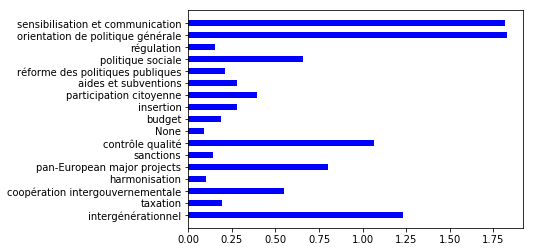



laisser
[('régulation', 17), ('comportements individuels', 14), ('orientation de politique générale', 12), ('politique sociale', 9), ('réforme des politiques publiques', 8), ('None', 8), ('participation citoyenne', 8), ('national competences', 8), ('sensibilisation et communication', 5), ('insertion', 4), ('harmonisation', 3), ('reform of the EU institutions', 3), ('budget', 3), ('formation', 2), ('sanctions', 2), ('coopération intergouvernementale', 2), ('EU competences', 2), ('social protection & public services', 2), ('simplification', 1), ('sortie euro et Europe', 1), ('pan-European major projects', 1), ('aides et subventions', 1), ('engagement associatif', 1), ('intergénérationnel', 1), ('couverture sociale', 1)]


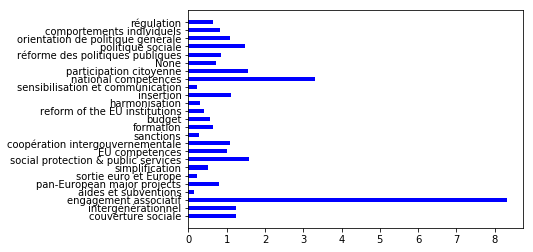



favoriser
[('comportements individuels', 64), ('None', 55), ('orientation de politique générale', 40), ('sensibilisation et communication', 37), ('régulation', 35), ('aides et subventions', 35), ('politique sociale', 26), ('insertion', 24), ('réforme des politiques publiques', 16), ('taxation', 12), ('aménagement du territoire', 12), ('participation citoyenne', 11), ('sanctions', 8), ('harmonisation', 8), ('protectionnisme économique', 8), ('intergénérationnel', 7), ('aménagement des espaces', 6), ('pan-European major projects', 6), ('coopération intergouvernementale', 5), ('formation', 4), ('budget', 4), ('RSE', 4), ('european protectionism', 4), ('reform of the EU institutions', 3), ('national competences', 3), ('simplification', 2), ('diplomatic decisions & treaties', 2), ('land development', 2), ('couverture sociale', 2), ('protection environnementale', 1), ('redistribution & répartition', 1), ('action européenne', 1), ('sortie euro et Europe', 1), ('EU competences', 1), ('engage

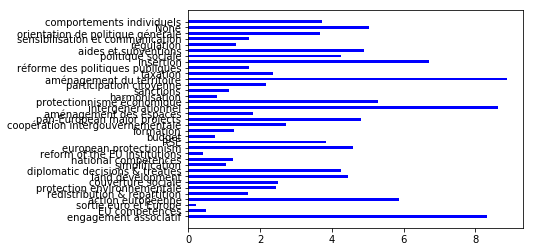



aidant
[('réforme des politiques publiques', 16), ('aides et subventions', 10), ('politique sociale', 8), ('None', 2), ('RSE', 2), ('insertion', 1), ('harmonisation', 1), ('taxation', 1), ('protectionnisme économique', 1), ('régulation', 1), ('budget', 1), ('orientation de politique générale', 1), ('couverture sociale', 1), ('formation', 1)]


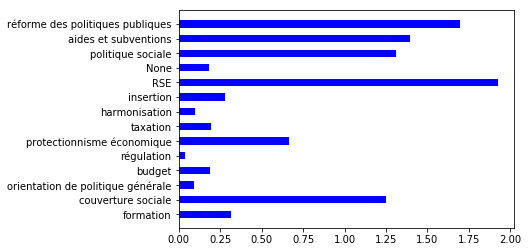



développer
[('politique sociale', 65), ('None', 40), ('sensibilisation et communication', 40), ('orientation de politique générale', 39), ('aides et subventions', 20), ('budget', 18), ('régulation', 17), ('réforme des politiques publiques', 16), ('participation citoyenne', 14), ('aménagement du territoire', 13), ('comportements individuels', 11), ('coopération intergouvernementale', 11), ('intergénérationnel', 10), ('harmonisation', 9), ('aménagement des espaces', 6), ('pan-European major projects', 6), ('land development', 6), ('social protection & public services', 6), ('insertion', 5), ('formation', 5), ('RSE', 4), ('numérique', 4), ('couverture sociale', 4), ('national competences', 3), ('taxation', 2), ('european protectionism', 2), ('simplification', 1), ('protectionnisme économique', 1), ('protection environnementale', 1), ('redistribution & répartition', 1), ('contrôle qualité', 1), ('accompagnement & coaching', 1), ('diplomatic decisions & treaties', 1), ('EU competences', 1

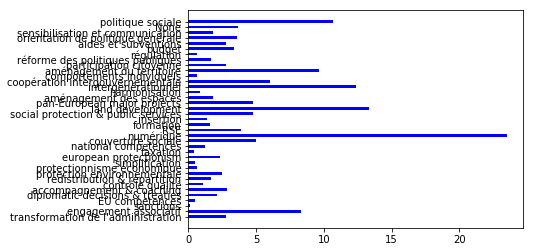



communiquer
[('sensibilisation et communication', 22), ('insertion', 1), ('formation', 1), ('régulation', 1), ('None', 1), ('comportements individuels', 1)]


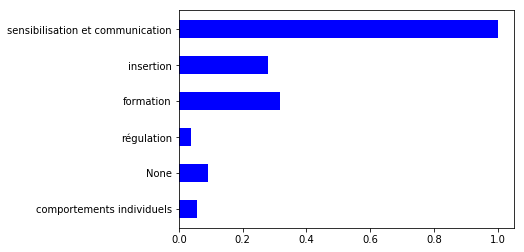



encourager
[('sensibilisation et communication', 32), ('aides et subventions', 21), ('orientation de politique générale', 14), ('régulation', 11), ('None', 10), ('comportements individuels', 10), ('taxation', 6), ('intergénérationnel', 5), ('politique sociale', 4), ('insertion', 3), ('sanctions', 3), ('réforme des politiques publiques', 3), ('participation citoyenne', 2), ('harmonisation', 2), ('budget', 2), ('coopération intergouvernementale', 2), ('simplification', 1), ('protectionnisme économique', 1), ('protection environnementale', 1), ('aménagement du territoire', 1), ('accompagnement & coaching', 1), ('reform of the EU institutions', 1), ('formation', 1), ('engagement associatif', 1)]


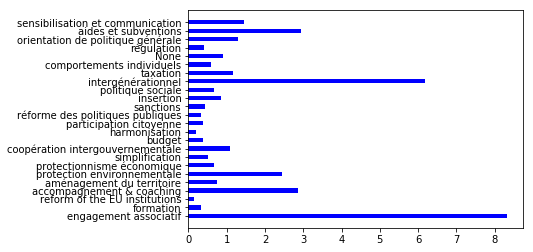



intégrer
[('sensibilisation et communication', 22), ('insertion', 13), ('régulation', 8), ('orientation de politique générale', 6), ('aides et subventions', 5), ('réforme des politiques publiques', 5), ('participation citoyenne', 4), ('diplomatic decisions & treaties', 4), ('formation', 3), ('coopération intergouvernementale', 3), ('reform of the EU institutions', 2), ('intergénérationnel', 2), ('simplification', 1), ('RSE', 1), ('taxation', 1), ('comportements individuels', 1), ('budget', 1), ('engagement associatif', 1), ('numérique', 1), ('politique sociale', 1)]


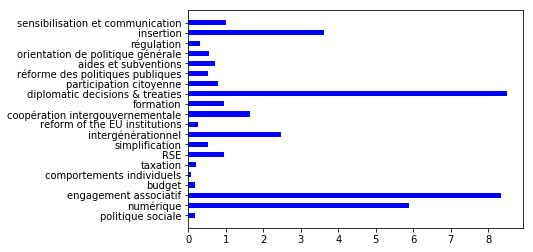



considérer
[('sensibilisation et communication', 30), ('régulation', 9), ('comportements individuels', 7), ('insertion', 5), ('réforme des politiques publiques', 5), ('None', 4), ('orientation de politique générale', 2), ('formation', 2), ('sanctions', 1), ('harmonisation', 1), ('aides et subventions', 1), ('taxation', 1), ('politique sociale', 1), ('budget', 1)]


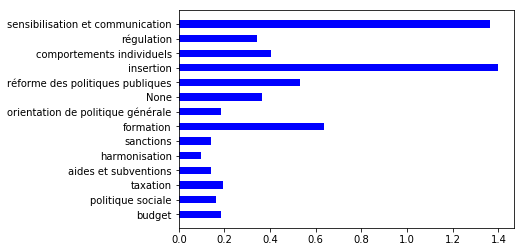



accompagner
[('politique sociale', 17), ('sensibilisation et communication', 15), ('insertion', 14), ('aides et subventions', 13), ('None', 12), ('budget', 11), ('formation', 11), ('réforme des politiques publiques', 10), ('orientation de politique générale', 8), ('régulation', 5), ('comportements individuels', 4), ('participation citoyenne', 2), ('harmonisation', 1), ('sanctions', 1), ('simplification', 1), ('accompagnement & coaching', 1), ('coopération intergouvernementale', 1), ('fiscalité & cotisations', 1)]


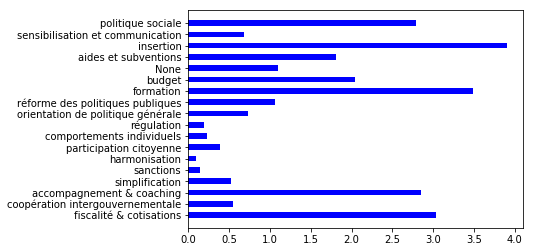



respecter
[('sanctions', 44), ('sensibilisation et communication', 41), ('comportements individuels', 39), ('régulation', 38), ('None', 20), ('national competences', 13), ('orientation de politique générale', 12), ('taxation', 9), ('politique sociale', 9), ('participation citoyenne', 8), ('harmonisation', 5), ('réforme des politiques publiques', 3), ('aménagement des espaces', 3), ('protectionnisme économique', 3), ('sortie euro et Europe', 3), ('budget', 3), ('insertion', 2), ('contrôle qualité', 2), ('reform of the EU institutions', 2), ('EU competences', 2), ('european protectionism', 2), ('coopération intergouvernementale', 2), ('simplification', 1), ('redistribution & répartition', 1), ('RSE', 1), ('diplomatic decisions & treaties', 1), ('pan-European major projects', 1), ('formation', 1), ('aides et subventions', 1)]


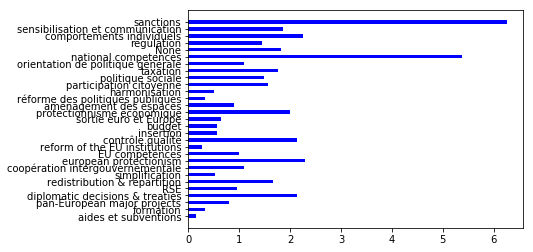



expliquer
[('sensibilisation et communication', 56), ('None', 1), ('comportements individuels', 1), ('régulation', 1), ('accompagnement & coaching', 1), ('participation citoyenne', 1), ('aides et subventions', 1), ('formation', 1), ("transformation de l'administration", 1)]


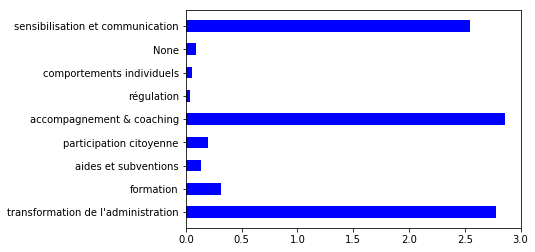



obliger
[('régulation', 51), ('sanctions', 13), ('aménagement des espaces', 12), ('réforme des politiques publiques', 8), ('orientation de politique générale', 7), ('harmonisation', 6), ('None', 6), ('sensibilisation et communication', 4), ('insertion', 3), ('reform of the EU institutions', 3), ('taxation', 3), ('aides et subventions', 2), ('RSE', 2), ('comportements individuels', 2), ('politique sociale', 2), ('contrôle qualité', 1), ('accompagnement & coaching', 1), ('participation citoyenne', 1), ('EU competences', 1), ('european protectionism', 1), ('social protection & public services', 1), ('formation', 1)]


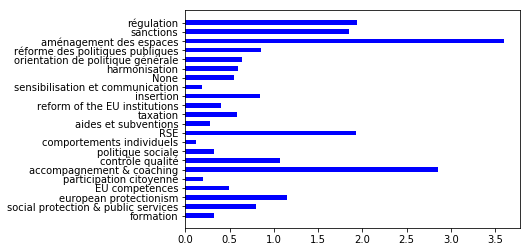



revoir
[('régulation', 34), ('réforme des politiques publiques', 24), ('orientation de politique générale', 11), ('None', 9), ('reform of the EU institutions', 8), ('sensibilisation et communication', 7), ('budget', 7), ('formation', 6), ('harmonisation', 5), ('aides et subventions', 4), ('comportements individuels', 3), ('diplomatic decisions & treaties', 3), ('social protection & public services', 3), ('simplification', 2), ('politique sociale', 2), ('insertion', 1), ('RSE', 1), ('action européenne', 1), ('national competences', 1), ('taxation', 1), ('EU competences', 1), ('pan-European major projects', 1), ("transformation de l'administration", 1), ('couverture sociale', 1)]


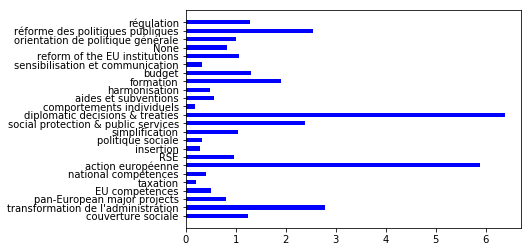



comprendre
[('sensibilisation et communication', 51), ('comportements individuels', 15), ('réforme des politiques publiques', 7), ('formation', 5), ('harmonisation', 5), ('orientation de politique générale', 4), ('sanctions', 4), ('insertion', 3), ('régulation', 3), ('simplification', 3), ('politique sociale', 3), ('None', 2), ('accompagnement & coaching', 2), ('aménagement des espaces', 1), ('aides et subventions', 1), ('budget', 1), ('protection environnementale', 1), ('aménagement du territoire', 1), ('national competences', 1), ('reform of the EU institutions', 1), ('taxation', 1), ('intergénérationnel', 1), ('RSE', 1)]


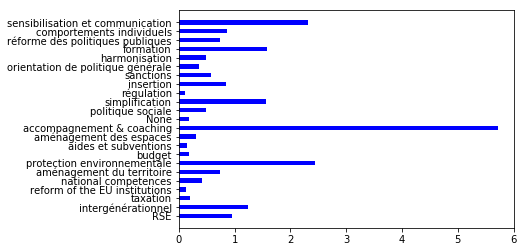



aménager
[('aménagement des espaces', 15), ('aides et subventions', 5), ('orientation de politique générale', 2), ('insertion', 2), ('comportements individuels', 2), ('aménagement du territoire', 2), ('budget', 2), ('sensibilisation et communication', 1), ('None', 1), ('RSE', 1), ('social protection & public services', 1), ('sanctions', 1)]


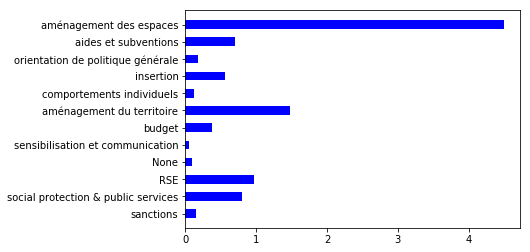



arrêter
[('régulation', 217), ('comportements individuels', 100), ('sensibilisation et communication', 59), ('None', 51), ('sanctions', 44), ('réforme des politiques publiques', 42), ('orientation de politique générale', 40), ('protectionnisme économique', 26), ('budget', 12), ('simplification', 12), ('aides et subventions', 9), ('reform of the EU institutions', 9), ('harmonisation', 8), ('taxation', 8), ('national competences', 8), ('RSE', 7), ('sortie euro et Europe', 5), ('insertion', 4), ('pan-European major projects', 4), ('protection environnementale', 3), ('participation citoyenne', 3), ('social protection & public services', 3), ('european protectionism', 3), ('redistribution & répartition', 2), ('coopération intergouvernementale', 2), ('intergénérationnel', 2), ('formation', 2), ('politique sociale', 2), ('aménagement des espaces', 1), ('action européenne', 1), ('aménagement du territoire', 1), ('contrôle qualité', 1), ('responsabilisation', 1), ('EU competences', 1), ('dipl

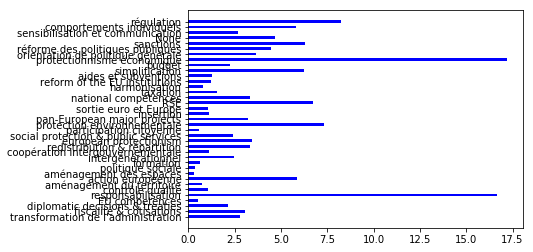



puissent
[('sensibilisation et communication', 16), ('aides et subventions', 12), ('insertion', 10), ('réforme des politiques publiques', 10), ('None', 10), ('budget', 9), ('orientation de politique générale', 9), ('participation citoyenne', 9), ('régulation', 9), ('harmonisation', 7), ('politique sociale', 7), ('comportements individuels', 6), ('aménagement des espaces', 4), ('aménagement du territoire', 3), ('national competences', 3), ('formation', 2), ('coopération intergouvernementale', 2), ('reform of the EU institutions', 2), ('RSE', 1), ('protection environnementale', 1), ('taxation', 1), ('accompagnement & coaching', 1), ('sanctions', 1), ('sortie euro et Europe', 1), ('simplification', 1), ('land development', 1), ('numérique', 1), ('couverture sociale', 1), ('fiscalité & cotisations', 1), ("transformation de l'administration", 1)]


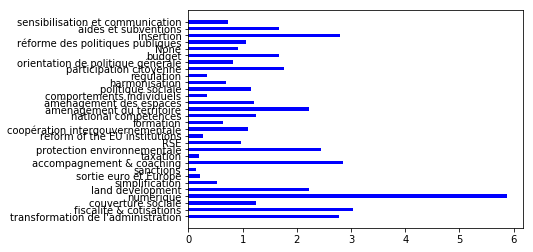



rendre
[('régulation', 43), ('sensibilisation et communication', 35), ('None', 24), ('réforme des politiques publiques', 21), ('aménagement des espaces', 16), ('orientation de politique générale', 15), ('aides et subventions', 15), ('politique sociale', 15), ('harmonisation', 12), ('budget', 9), ('taxation', 8), ('sanctions', 7), ('formation', 5), ('reform of the EU institutions', 5), ('comportements individuels', 4), ('contrôle qualité', 4), ('RSE', 4), ('sortie euro et Europe', 4), ('participation citoyenne', 3), ('insertion', 2), ('national competences', 2), ('simplification', 1), ('redistribution & répartition', 1), ('aménagement du territoire', 1), ('action européenne', 1), ('protection environnementale', 1), ('european protectionism', 1), ('coopération intergouvernementale', 1), ('pan-European major projects', 1), ('couverture sociale', 1)]


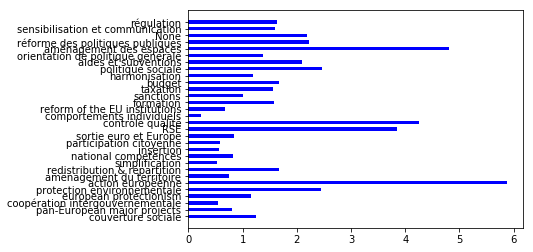



sortir
[('sortie euro et Europe', 210), ('orientation de politique générale', 18), ('régulation', 12), ('None', 7), ('sensibilisation et communication', 7), ('budget', 3), ('réforme des politiques publiques', 3), ('aides et subventions', 3), ('diplomatic decisions & treaties', 3), ('reform of the EU institutions', 3), ('EU competences', 3), ('european protectionism', 3), ('national competences', 2), ('comportements individuels', 2), ('pan-European major projects', 2), ('simplification', 1), ('insertion', 1), ('aménagement des espaces', 1), ('redistribution & répartition', 1), ('protectionnisme économique', 1), ('sanctions', 1), ('participation citoyenne', 1), ('coopération intergouvernementale', 1), ('social protection & public services', 1), ('engagement associatif', 1), ('recherche', 1), ('couverture sociale', 1)]


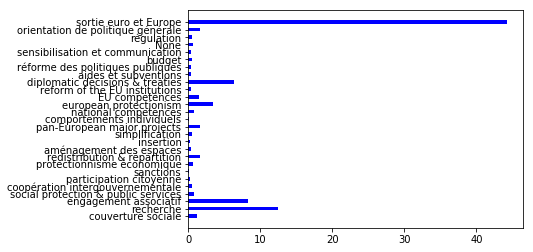



maintenir
[('politique sociale', 17), ('None', 5), ('aides et subventions', 5), ('réforme des politiques publiques', 4), ('sensibilisation et communication', 4), ('couverture sociale', 4), ('aménagement des espaces', 3), ('régulation', 3), ('insertion', 2), ('budget', 2), ('intergénérationnel', 2), ('orientation de politique générale', 1), ('national competences', 1), ('social protection & public services', 1), ('recherche', 1)]


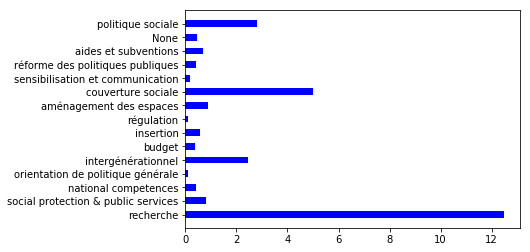



refuser
[('régulation', 11), ('sanctions', 8), ('orientation de politique générale', 3), ('réforme des politiques publiques', 2), ('comportements individuels', 2), ('None', 2), ('reform of the EU institutions', 2), ('sensibilisation et communication', 1), ('aides et subventions', 1), ('participation citoyenne', 1), ('diplomatic decisions & treaties', 1), ('sortie euro et Europe', 1)]


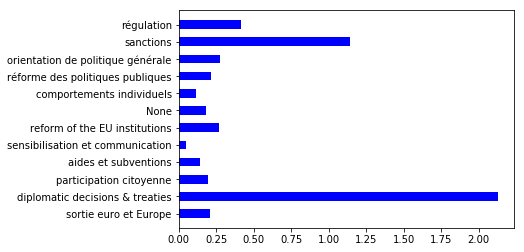



mieux informer
[('sensibilisation et communication', 22), ('aides et subventions', 1)]


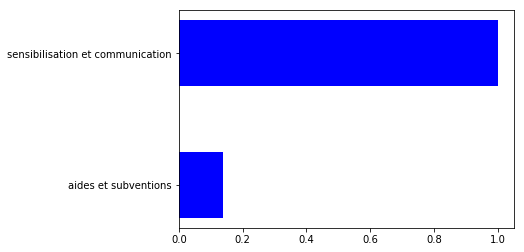



revaloriser
[('sensibilisation et communication', 14), ('politique sociale', 12), ('budget', 9), ('réforme des politiques publiques', 7), ('régulation', 4), ('orientation de politique générale', 3), ('social protection & public services', 3), ('None', 2), ('harmonisation', 1), ('formation', 1), ('RSE', 1)]


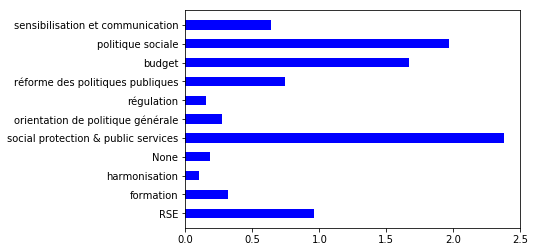



réservées
[('aménagement des espaces', 12), ('sanctions', 10), ('harmonisation', 4), ('orientation de politique générale', 3), ('régulation', 3), ('sensibilisation et communication', 2), ('aménagement du territoire', 2), ('réforme des politiques publiques', 1), ('insertion', 1), ('None', 1)]


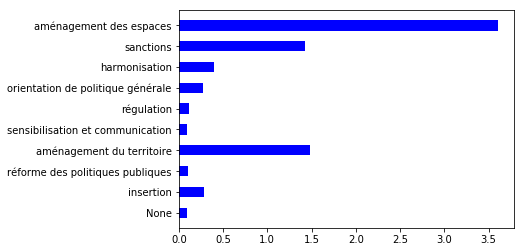



imposer
[('régulation', 64), ('orientation de politique générale', 15), ('taxation', 14), ('sensibilisation et communication', 12), ('réforme des politiques publiques', 9), ('sanctions', 8), ('harmonisation', 7), ('comportements individuels', 6), ('reform of the EU institutions', 5), ('insertion', 4), ('aménagement des espaces', 4), ('None', 4), ('sortie euro et Europe', 4), ('RSE', 4), ('national competences', 3), ('simplification', 2), ('protectionnisme économique', 2), ('action européenne', 2), ('contrôle qualité', 2), ('participation citoyenne', 2), ('protection environnementale', 1), ('aménagement du territoire', 1), ('european protectionism', 1), ('EU competences', 1), ('budget', 1), ('formation', 1), ('numérique', 1)]


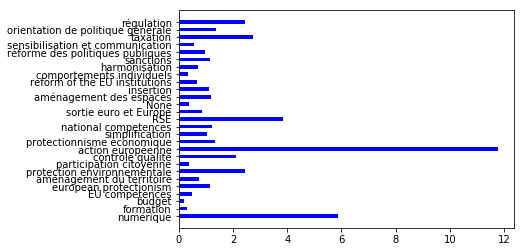



autoriser
[('régulation', 27), ('politique sociale', 6), ('sensibilisation et communication', 4), ('orientation de politique générale', 3), ('insertion', 2), ('réforme des politiques publiques', 2), ('sortie euro et Europe', 2), ('redistribution & répartition', 2), ('budget', 2), ('reform of the EU institutions', 2), ('EU competences', 1), ('harmonisation', 1), ('diplomatic decisions & treaties', 1), ('comportements individuels', 1)]


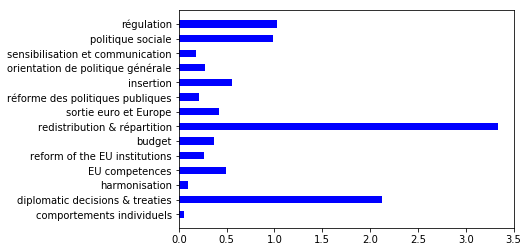



payer
[('régulation', 37), ('taxation', 27), ('comportements individuels', 11), ('sanctions', 8), ('reform of the EU institutions', 7), ('harmonisation', 7), ('réforme des politiques publiques', 6), ('aides et subventions', 6), ('budget', 6), ('politique sociale', 6), ('None', 3), ('RSE', 2), ('orientation de politique générale', 2), ('social protection & public services', 2), ('insertion', 1), ('protectionnisme économique', 1), ('redistribution & répartition', 1), ('sortie euro et Europe', 1), ('national competences', 1), ('EU competences', 1), ('european protectionism', 1), ('fiscalité & cotisations', 1)]


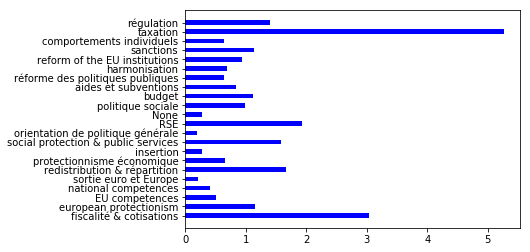



sanctionner
[('sanctions', 21), ('régulation', 2), ('orientation de politique générale', 2), ('sensibilisation et communication', 2), ('harmonisation', 2), ('comportements individuels', 1), ('participation citoyenne', 1), ('taxation', 1), ('formation', 1)]


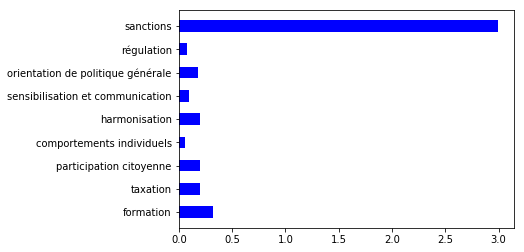



accepter
[('comportements individuels', 25), ('sensibilisation et communication', 9), ('régulation', 8), ('None', 7), ('insertion', 5), ('participation citoyenne', 3), ('reform of the EU institutions', 2), ('orientation de politique générale', 2), ('réforme des politiques publiques', 1), ('RSE', 1), ('redistribution & répartition', 1), ('contrôle qualité', 1), ('coopération intergouvernementale', 1), ('EU competences', 1), ('intergénérationnel', 1), ('politique sociale', 1), ('couverture sociale', 1)]


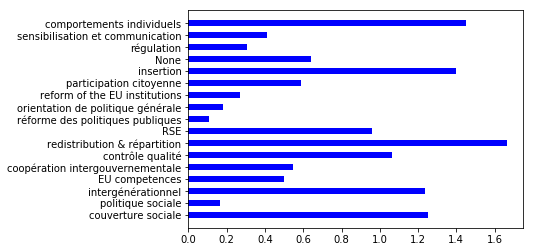



punir
[('sanctions', 22), ('accompagnement & coaching', 1), ('aides et subventions', 1)]


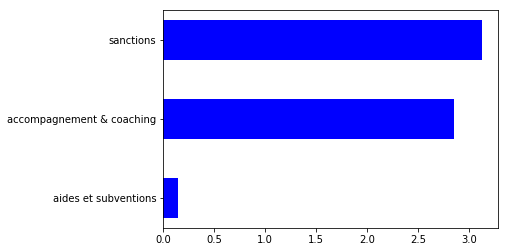



financer
[('budget', 15), ('aides et subventions', 12), ('taxation', 9), ('coopération intergouvernementale', 5), ('harmonisation', 4), ('sensibilisation et communication', 4), ('régulation', 4), ('EU competences', 3), ('réforme des politiques publiques', 2), ('sanctions', 2), ('reform of the EU institutions', 2), ('orientation de politique générale', 2), ('couverture sociale', 2), ('formation', 1), ('pan-European major projects', 1), ('national competences', 1), ('intergénérationnel', 1), ('politique sociale', 1), ('fiscalité & cotisations', 1), ('RSE', 1)]


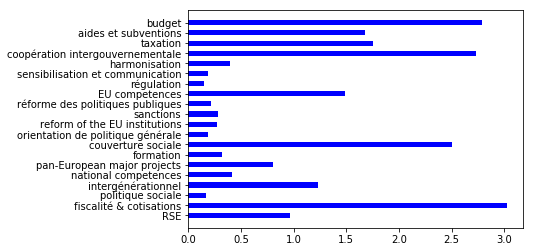



baisser
[('régulation', 45), ('taxation', 25), ('None', 15), ('réforme des politiques publiques', 13), ('budget', 7), ('orientation de politique générale', 7), ('comportements individuels', 3), ('redistribution & répartition', 3), ('harmonisation', 3), ('sensibilisation et communication', 2), ('aides et subventions', 2), ('RSE', 2), ('protectionnisme économique', 2), ('insertion', 1), ('social protection & public services', 1), ('land development', 1), ('couverture sociale', 1)]


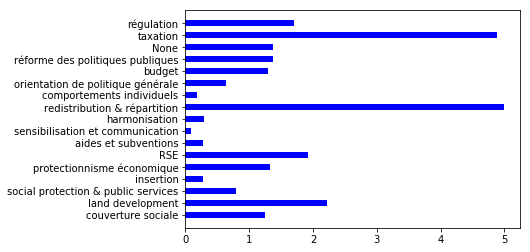



veulent
[('comportements individuels', 15), ('régulation', 7), ('aides et subventions', 6), ('sensibilisation et communication', 6), ('orientation de politique générale', 4), ('insertion', 3), ('reform of the EU institutions', 3), ('participation citoyenne', 3), ('politique sociale', 3), ('aménagement des espaces', 1), ('formation', 1), ('réforme des politiques publiques', 1), ('None', 1), ('sanctions', 1), ('accompagnement & coaching', 1), ('pan-European major projects', 1), ('sortie euro et Europe', 1), ('european protectionism', 1), ('national competences', 1), ('budget', 1), ("transformation de l'administration", 1)]


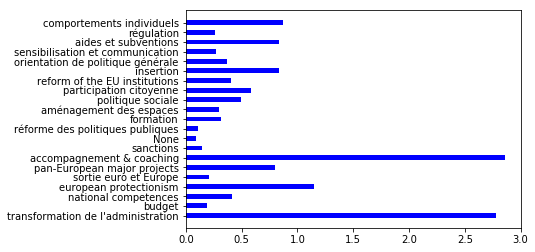



protéger
[('régulation', 18), ('orientation de politique générale', 8), ('european protectionism', 8), ('sanctions', 6), ('pan-European major projects', 6), ('sensibilisation et communication', 5), ('social protection & public services', 4), ('coopération intergouvernementale', 4), ('protection environnementale', 3), ('reform of the EU institutions', 3), ('réforme des politiques publiques', 2), ('comportements individuels', 2), ('land development', 2), ('EU competences', 2), ('aménagement du territoire', 1), ('protectionnisme économique', 1), ('contrôle qualité', 1), ('harmonisation', 1), ('aides et subventions', 1), ('None', 1), ('national competences', 1), ('politique sociale', 1)]


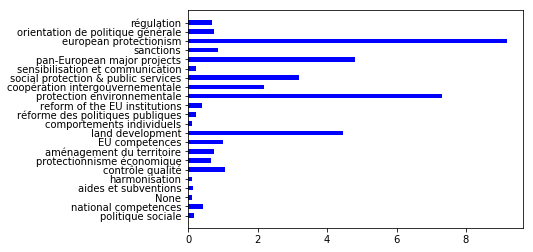



privilégier
[('comportements individuels', 153), ('orientation de politique générale', 32), ('None', 24), ('régulation', 18), ('protectionnisme économique', 16), ('sensibilisation et communication', 12), ('aides et subventions', 8), ('politique sociale', 6), ('sanctions', 5), ('harmonisation', 4), ('insertion', 3), ('european protectionism', 3), ('aménagement du territoire', 2), ('social protection & public services', 2), ('taxation', 2), ('aménagement des espaces', 1), ('RSE', 1), ('redistribution & répartition', 1)]


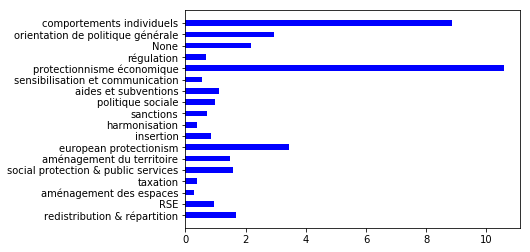



améliorer
[('sensibilisation et communication', 15), ('régulation', 14), ('formation', 11), ('orientation de politique générale', 11), ('aides et subventions', 10), ('None', 9), ('politique sociale', 9), ('réforme des politiques publiques', 7), ('insertion', 5), ('aménagement des espaces', 5), ('contrôle qualité', 4), ('RSE', 4), ('budget', 4), ('harmonisation', 3), ('comportements individuels', 3), ('participation citoyenne', 3), ('couverture sociale', 3), ('coopération intergouvernementale', 2), ('simplification', 1), ('responsabilisation', 1), ('reform of the EU institutions', 1), ('EU competences', 1), ('numérique', 1)]


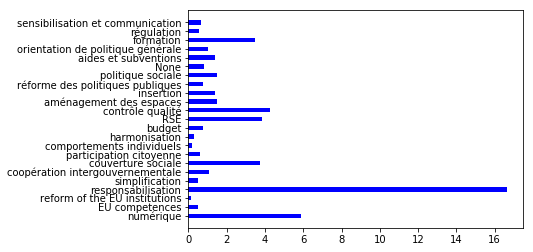



renforcer
[('régulation', 15), ('sensibilisation et communication', 12), ('sanctions', 11), ('harmonisation', 7), ('coopération intergouvernementale', 6), ('politique sociale', 6), ('orientation de politique générale', 4), ('reform of the EU institutions', 4), ('None', 4), ('budget', 3), ('EU competences', 3), ('aides et subventions', 2), ('formation', 2), ('contrôle qualité', 2), ('insertion', 1), ('protectionnisme économique', 1), ('participation citoyenne', 1), ('national competences', 1), ('social protection & public services', 1), ('land development', 1), ('european protectionism', 1), ('pan-European major projects', 1), ('couverture sociale', 1)]


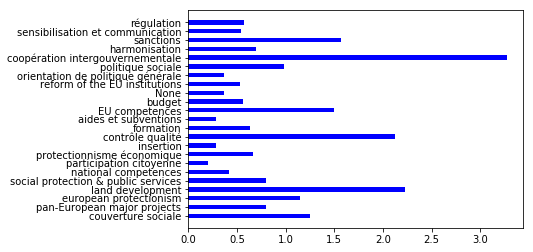



valoriser
[('sensibilisation et communication', 32), ('budget', 16), ('politique sociale', 15), ('réforme des politiques publiques', 11), ('régulation', 11), ('None', 9), ('aides et subventions', 9), ('formation', 8), ('orientation de politique générale', 5), ('comportements individuels', 3), ('taxation', 2), ('social protection & public services', 2), ('insertion', 1), ('simplification', 1), ('contrôle qualité', 1), ('protectionnisme économique', 1), ('harmonisation', 1), ('RSE', 1), ('participation citoyenne', 1), ('intergénérationnel', 1)]


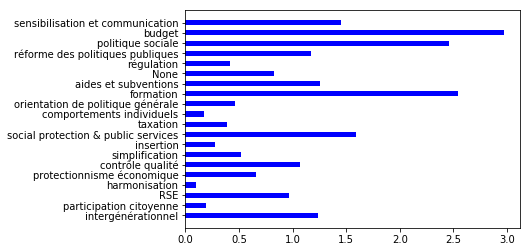



cesser
[('comportements individuels', 16), ('sensibilisation et communication', 14), ('régulation', 12), ('réforme des politiques publiques', 11), ('orientation de politique générale', 8), ('None', 7), ('national competences', 4), ('insertion', 3), ('aides et subventions', 3), ('sortie euro et Europe', 3), ('protectionnisme économique', 2), ('sanctions', 2), ('participation citoyenne', 2), ('harmonisation', 2), ('social protection & public services', 2), ('simplification', 1), ('aménagement du territoire', 1), ('reform of the EU institutions', 1), ('politique sociale', 1)]


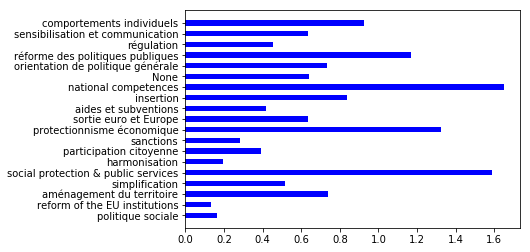



proposer
[('None', 88), ('régulation', 60), ('sensibilisation et communication', 57), ('orientation de politique générale', 52), ('comportements individuels', 28), ('participation citoyenne', 23), ('politique sociale', 21), ('aides et subventions', 17), ('réforme des politiques publiques', 16), ('harmonisation', 13), ('insertion', 11), ('RSE', 10), ('protectionnisme économique', 8), ('budget', 7), ('aménagement du territoire', 7), ('contrôle qualité', 6), ('accompagnement & coaching', 6), ('redistribution & répartition', 5), ('intergénérationnel', 5), ('aménagement des espaces', 4), ('sanctions', 4), ('reform of the EU institutions', 4), ('couverture sociale', 4), ('formation', 2), ('taxation', 2), ('recherche', 2), ('simplification', 1), ('justice', 1), ('protection environnementale', 1), ('EU competences', 1), ('national competences', 1), ('social protection & public services', 1), ('pan-European major projects', 1), ('sortie euro et Europe', 1), ('diplomatic decisions & treaties',

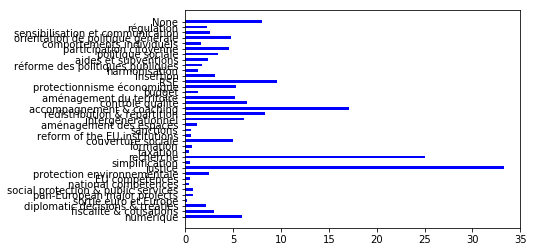



mettre
[('sensibilisation et communication', 98), ('régulation', 72), ('orientation de politique générale', 57), ('harmonisation', 34), ('réforme des politiques publiques', 32), ('None', 30), ('participation citoyenne', 29), ('sanctions', 26), ('comportements individuels', 21), ('taxation', 19), ('politique sociale', 19), ('aides et subventions', 16), ('reform of the EU institutions', 14), ('aménagement des espaces', 13), ('budget', 11), ('insertion', 9), ('aménagement du territoire', 8), ('formation', 7), ('simplification', 4), ('redistribution & répartition', 4), ('sortie euro et Europe', 4), ('coopération intergouvernementale', 4), ('intergénérationnel', 4), ('RSE', 3), ('contrôle qualité', 3), ('protectionnisme économique', 3), ('EU competences', 3), ('pan-European major projects', 3), ('european protectionism', 3), ('fiscalité & cotisations', 3), ('couverture sociale', 3), ('engagement associatif', 3), ('protection environnementale', 2), ('diplomatic decisions & treaties', 2), (

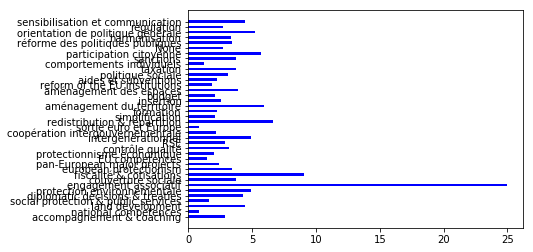



remettre
[('régulation', 26), ('national competences', 11), ('orientation de politique générale', 10), ('sensibilisation et communication', 10), ('None', 6), ('comportements individuels', 5), ('réforme des politiques publiques', 3), ('reform of the EU institutions', 3), ('sortie euro et Europe', 3), ('taxation', 3), ('politique sociale', 3), ('aides et subventions', 2), ('sanctions', 2), ('aménagement du territoire', 2), ('participation citoyenne', 2), ('european protectionism', 2), ('harmonisation', 2), ('insertion', 1), ('redistribution & répartition', 1), ('protection environnementale', 1), ('couverture sociale', 1)]


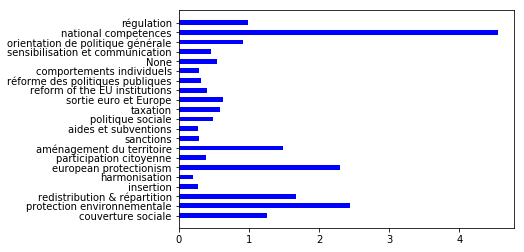



garantir
[('réforme des politiques publiques', 18), ('orientation de politique générale', 11), ('aides et subventions', 7), ('régulation', 7), ('None', 5), ('harmonisation', 4), ('aménagement des espaces', 3), ('budget', 3), ('formation', 2), ('sensibilisation et communication', 2), ('national competences', 2), ('EU competences', 2), ('insertion', 1), ('sanctions', 1), ('action européenne', 1), ('protectionnisme économique', 1), ('contrôle qualité', 1), ('fiscalité & cotisations', 1), ('politique sociale', 1)]


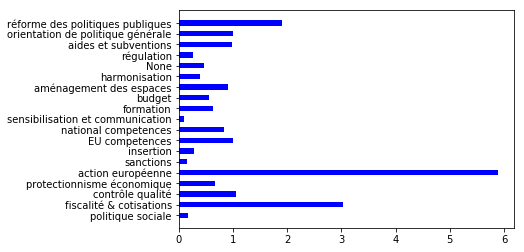



pensions
[('réforme des politiques publiques', 11), ('budget', 7), ('social protection & public services', 6), ('aides et subventions', 5), ('régulation', 1), ('harmonisation', 1), ('fiscalité & cotisations', 1)]


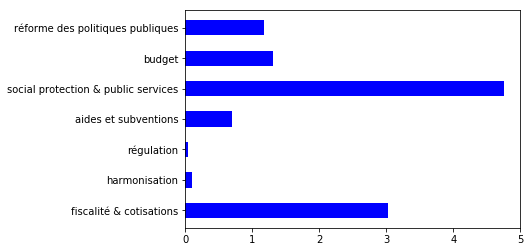



privés
[('régulation', 33), ('réforme des politiques publiques', 6), ('budget', 6), ('sanctions', 5), ('orientation de politique générale', 5), ('aménagement des espaces', 4), ('reform of the EU institutions', 4), ('politique sociale', 4), ('insertion', 3), ('sensibilisation et communication', 3), ('aides et subventions', 2), ('None', 2), ('coopération intergouvernementale', 2), ('EU competences', 2), ('national competences', 2), ('simplification', 1), ('redistribution & répartition', 1), ('contrôle qualité', 1), ('aménagement du territoire', 1), ('comportements individuels', 1), ('formation', 1)]


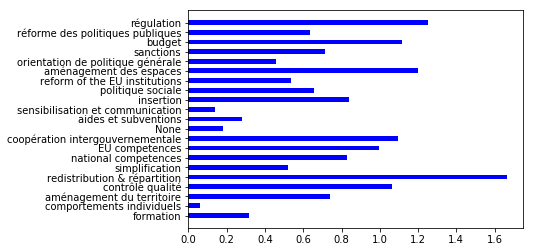



subventionner
[('aides et subventions', 18), ('réforme des politiques publiques', 6), ('régulation', 4), ('sanctions', 2), ('protectionnisme économique', 2), ('taxation', 2), ('simplification', 1), ('redistribution & répartition', 1), ('None', 1)]


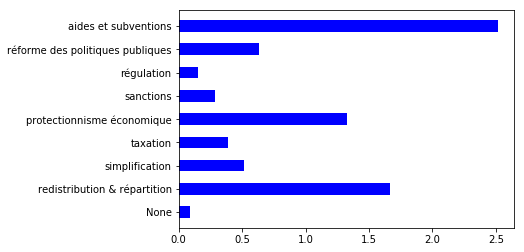



revenir
[('régulation', 30), ('comportements individuels', 23), ('None', 17), ('sortie euro et Europe', 15), ('orientation de politique générale', 13), ('national competences', 6), ('reform of the EU institutions', 5), ('sensibilisation et communication', 4), ('sanctions', 3), ('coopération intergouvernementale', 3), ('réforme des politiques publiques', 2), ('protectionnisme économique', 2), ('aides et subventions', 2), ('RSE', 2), ('simplification', 2), ('participation citoyenne', 2), ('harmonisation', 2), ('insertion', 1), ('aménagement des espaces', 1), ('redistribution & répartition', 1), ('aménagement du territoire', 1), ('EU competences', 1), ('taxation', 1), ('social protection & public services', 1), ('european protectionism', 1), ('intergénérationnel', 1), ('politique sociale', 1)]


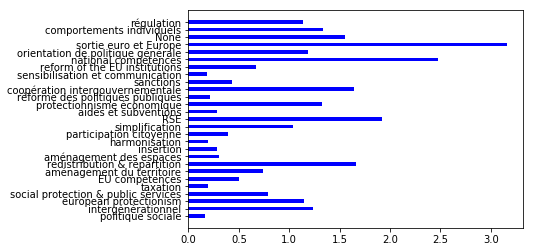



choisir
[('comportements individuels', 14), ('sensibilisation et communication', 10), ('orientation de politique générale', 6), ('None', 5), ('reform of the EU institutions', 5), ('national competences', 4), ('régulation', 4), ('politique sociale', 3), ('réforme des politiques publiques', 2), ('participation citoyenne', 2), ('budget', 2), ('insertion', 1), ('action européenne', 1), ('RSE', 1), ('pan-European major projects', 1), ('harmonisation', 1)]


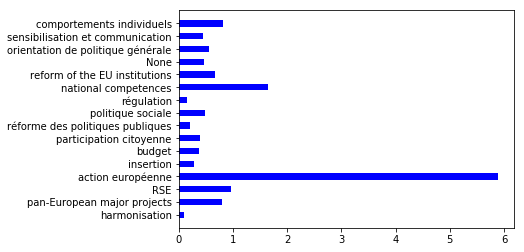



mieux former
[('formation', 16), ('insertion', 2), ('sensibilisation et communication', 2), ('budget', 1)]


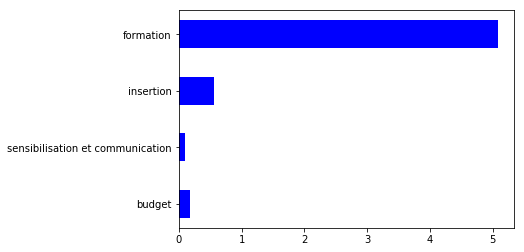



apprendre
[('sensibilisation et communication', 154), ('comportements individuels', 66), ('None', 7), ('orientation de politique générale', 5), ('régulation', 5), ('réforme des politiques publiques', 4), ('accompagnement & coaching', 3), ('responsabilisation', 3), ('harmonisation', 3), ('aménagement du territoire', 2), ('participation citoyenne', 2), ('insertion', 1), ('e-santé', 1)]


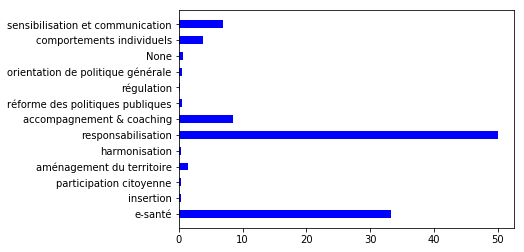



verser
[('réforme des politiques publiques', 12), ('régulation', 7), ('aides et subventions', 5), ('taxation', 2), ('reform of the EU institutions', 2), ('formation', 1), ('harmonisation', 1), ('social protection & public services', 1), ('fiscalité & cotisations', 1), ('couverture sociale', 1)]


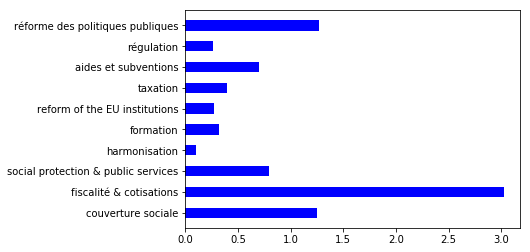



harmoniser
[('harmonisation', 151), ('reform of the EU institutions', 6), ('sanctions', 3), ('sensibilisation et communication', 2), ('régulation', 2), ('orientation de politique générale', 2), ('réforme des politiques publiques', 1), ('social protection & public services', 1), ('fiscalité & cotisations', 1), ('couverture sociale', 1)]


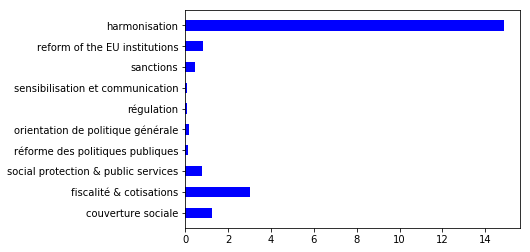



passer
[('régulation', 12), ('comportements individuels', 11), ('aides et subventions', 9), ('orientation de politique générale', 8), ('reform of the EU institutions', 6), ('réforme des politiques publiques', 5), ('sensibilisation et communication', 4), ('None', 2), ('taxation', 2), ('national competences', 2), ('aménagement des espaces', 1), ('participation citoyenne', 1), ('EU competences', 1), ('sanctions', 1), ('budget', 1), ('coopération intergouvernementale', 1), ('harmonisation', 1), ('pan-European major projects', 1), ('intergénérationnel', 1)]


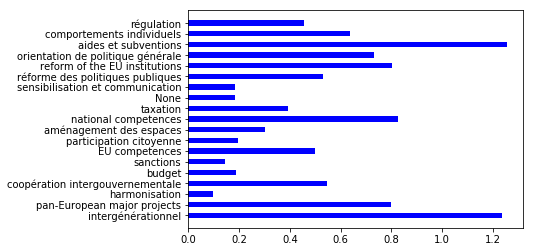



supprimer
[('régulation', 128), ('reform of the EU institutions', 53), ('réforme des politiques publiques', 36), ('sortie euro et Europe', 32), ('sanctions', 31), ('taxation', 24), ('comportements individuels', 14), ('orientation de politique générale', 14), ('None', 13), ('simplification', 12), ('harmonisation', 10), ('budget', 9), ('sensibilisation et communication', 5), ('social protection & public services', 5), ('aides et subventions', 4), ('diplomatic decisions & treaties', 4), ('protectionnisme économique', 3), ('participation citoyenne', 3), ('aménagement des espaces', 2), ('protection environnementale', 2), ('national competences', 2), ('fiscalité & cotisations', 2), ('redistribution & répartition', 1), ('pan-European major projects', 1), ('numérique', 1)]


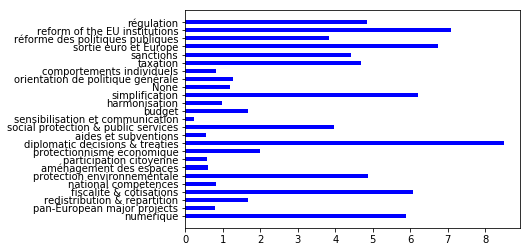



réduire
[('régulation', 67), ('comportements individuels', 64), ('reform of the EU institutions', 20), ('taxation', 17), ('None', 16), ('réforme des politiques publiques', 14), ('budget', 13), ('orientation de politique générale', 12), ('simplification', 12), ('aménagement des espaces', 11), ('sensibilisation et communication', 11), ('harmonisation', 8), ('RSE', 5), ('aides et subventions', 4), ('sanctions', 4), ('protectionnisme économique', 3), ('politique sociale', 3), ('couverture sociale', 3), ('participation citoyenne', 2), ('aménagement du territoire', 2), ('protection environnementale', 2), ('diplomatic decisions & treaties', 2), ('EU competences', 2), ('insertion', 1), ('contrôle qualité', 1), ('accompagnement & coaching', 1), ('national competences', 1), ('pan-European major projects', 1), ('european protectionism', 1), ('intergénérationnel', 1)]


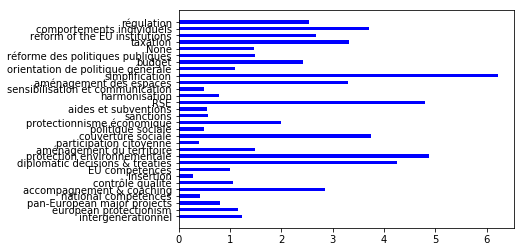



montant
[('réforme des politiques publiques', 11), ('sanctions', 2), ('budget', 2), ('social protection & public services', 2), ('reform of the EU institutions', 1), ('harmonisation', 1), ('régulation', 1), ("transformation de l'administration", 1), ('couverture sociale', 1)]


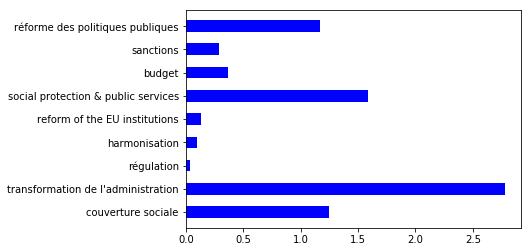



taxer
[('taxation', 151), ('régulation', 8), ('protectionnisme économique', 7), ('sanctions', 4), ('sensibilisation et communication', 3), ('orientation de politique générale', 3), ('harmonisation', 3), ('réforme des politiques publiques', 1), ('EU competences', 1), ('european protectionism', 1), ('sortie euro et Europe', 1)]


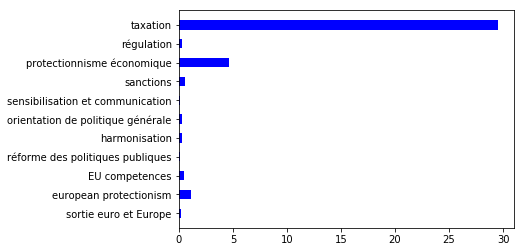



enseigner
[('sensibilisation et communication', 39), ('comportements individuels', 2), ('aménagement des espaces', 1), ('réforme des politiques publiques', 1), ('régulation', 1), ('reform of the EU institutions', 1), ('orientation de politique générale', 1), ('harmonisation', 1)]


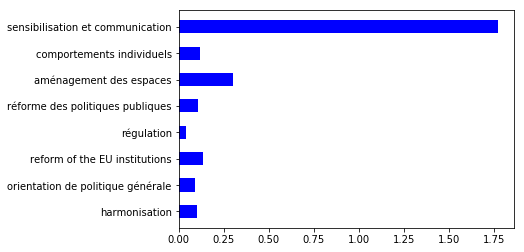



limiter
[('régulation', 92), ('comportements individuels', 24), ('reform of the EU institutions', 13), ('orientation de politique générale', 12), ('None', 10), ('harmonisation', 9), ('taxation', 8), ('sanctions', 7), ('protectionnisme économique', 7), ('sensibilisation et communication', 5), ('european protectionism', 5), ('aides et subventions', 4), ('aménagement du territoire', 3), ('RSE', 3), ('land development', 3), ('aménagement des espaces', 2), ('protection environnementale', 2), ('contrôle qualité', 2), ('participation citoyenne', 2), ('budget', 2), ('réforme des politiques publiques', 1), ('redistribution & répartition', 1), ('sortie euro et Europe', 1), ('diplomatic decisions & treaties', 1), ('national competences', 1), ('social protection & public services', 1), ('politique sociale', 1)]


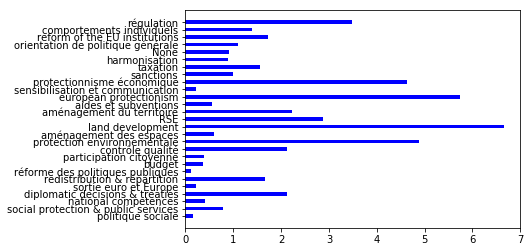



aller
[('comportements individuels', 14), ('orientation de politique générale', 6), ('sensibilisation et communication', 5), ('réforme des politiques publiques', 4), ('régulation', 4), ('politique sociale', 4), ('formation', 2), ('insertion', 2), ('harmonisation', 2), ('None', 2), ('taxation', 2), ('reform of the EU institutions', 2), ('aides et subventions', 1), ('sanctions', 1), ('protectionnisme économique', 1), ('aménagement du territoire', 1), ('accompagnement & coaching', 1), ('coopération intergouvernementale', 1), ('participation citoyenne', 1), ('budget', 1), ('couverture sociale', 1)]


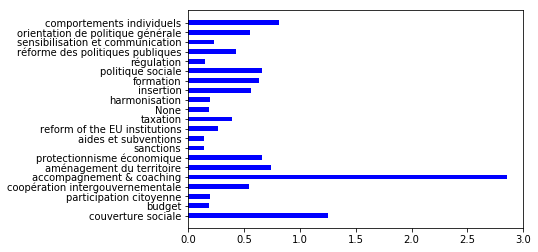



demander
[('régulation', 11), ('sensibilisation et communication', 5), ('sanctions', 4), ('participation citoyenne', 4), ('réforme des politiques publiques', 3), ('None', 2), ('simplification', 2), ('comportements individuels', 2), ('insertion', 1), ('budget', 1), ('aménagement des espaces', 1), ('redistribution & répartition', 1), ('aides et subventions', 1), ('accompagnement & coaching', 1), ('reform of the EU institutions', 1), ('national competences', 1), ('diplomatic decisions & treaties', 1), ('formation', 1), ('fiscalité & cotisations', 1), ('RSE', 1), ("transformation de l'administration", 1)]


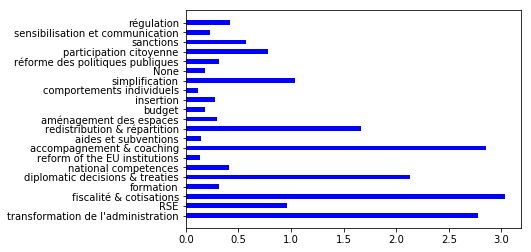



occuper
[('aides et subventions', 14), ('budget', 9), ('formation', 8), ('réforme des politiques publiques', 7), ('régulation', 7), ('politique sociale', 7), ('orientation de politique générale', 4), ('sensibilisation et communication', 4), ('comportements individuels', 3), ('national competences', 3), ('insertion', 2), ('None', 2), ('sanctions', 2), ('reform of the EU institutions', 2), ('intergénérationnel', 2), ('aménagement des espaces', 1), ('aménagement du territoire', 1), ('accompagnement & coaching', 1), ('EU competences', 1), ('couverture sociale', 1), ('RSE', 1), ('participation citoyenne', 1)]


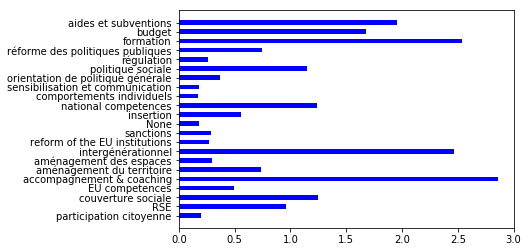



indiquer
[('sensibilisation et communication', 28), ('régulation', 12), ('orientation de politique générale', 1), ('aménagement des espaces', 1), ('None', 1), ('simplification', 1), ('contrôle qualité', 1), ('réforme des politiques publiques', 1), ('politique sociale', 1)]


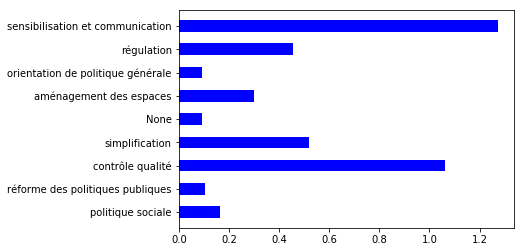



inciter
[('sensibilisation et communication', 23), ('None', 10), ('régulation', 7), ('taxation', 6), ('orientation de politique générale', 4), ('comportements individuels', 4), ('aides et subventions', 3), ('RSE', 3), ('formation', 2), ('sanctions', 2), ('aménagement des espaces', 1), ('réforme des politiques publiques', 1), ('simplification', 1), ('aménagement du territoire', 1), ('land development', 1), ('budget', 1), ('politique sociale', 1)]


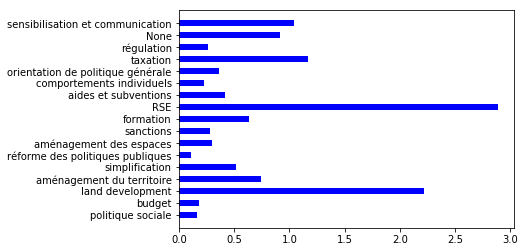



équilibré
[('sensibilisation et communication', 21), ('comportements individuels', 11), ('None', 4), ('régulation', 4), ('orientation de politique générale', 3), ('réforme des politiques publiques', 1), ('redistribution & répartition', 1), ('harmonisation', 1), ('politique sociale', 1)]


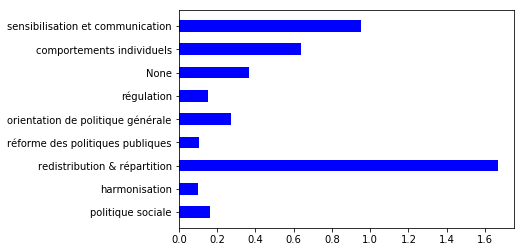



contrôler
[('régulation', 47), ('sanctions', 9), ('contrôle qualité', 4), ('taxation', 4), ('reform of the EU institutions', 3), ('aménagement des espaces', 1), ('protectionnisme économique', 1), ('participation citoyenne', 1), ('sortie euro et Europe', 1), ('simplification', 1), ('national competences', 1), ('european protectionism', 1), ('budget', 1), ('pan-European major projects', 1), ('sensibilisation et communication', 1), ('politique sociale', 1), ('aides et subventions', 1)]


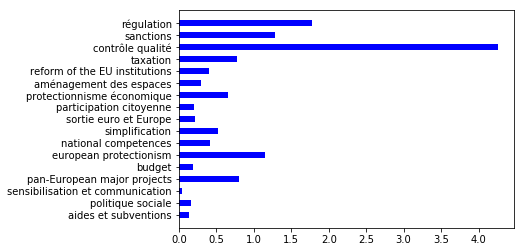



connaître
[('sensibilisation et communication', 22), ('comportements individuels', 6), ('politique sociale', 5), ('régulation', 4), ('réforme des politiques publiques', 3), ('participation citoyenne', 2), ('formation', 2), ('None', 2), ('coopération intergouvernementale', 2), ('aides et subventions', 1), ('orientation de politique générale', 1), ('aménagement des espaces', 1), ('aménagement du territoire', 1), ('accompagnement & coaching', 1), ('budget', 1)]


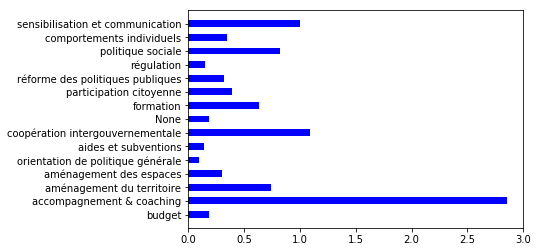



dire
[('sensibilisation et communication', 12), ('régulation', 4), ('orientation de politique générale', 3), ('insertion', 2), ('sanctions', 2), ('comportements individuels', 2), ('reform of the EU institutions', 2), ('participation citoyenne', 2), ('harmonisation', 2), ('réforme des politiques publiques', 1), ('aménagement des espaces', 1), ('accompagnement & coaching', 1), ('taxation', 1), ('pan-European major projects', 1), ('sortie euro et Europe', 1), ('EU competences', 1), ('budget', 1), ('politique sociale', 1)]


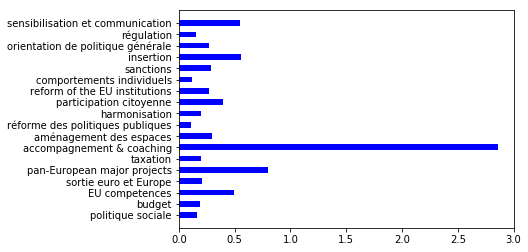



diminuer
[('régulation', 38), ('comportements individuels', 31), ('reform of the EU institutions', 15), ('orientation de politique générale', 12), ('réforme des politiques publiques', 7), ('sensibilisation et communication', 7), ('taxation', 5), ('None', 5), ('simplification', 4), ('aides et subventions', 3), ('protectionnisme économique', 3), ('contrôle qualité', 3), ('budget', 2), ('participation citoyenne', 2), ('politique sociale', 2), ('fiscalité & cotisations', 2), ('insertion', 1), ('redistribution & répartition', 1), ('RSE', 1), ('national competences', 1), ('sanctions', 1), ('harmonisation', 1), ('social protection & public services', 1), ('formation', 1), ('intergénérationnel', 1)]


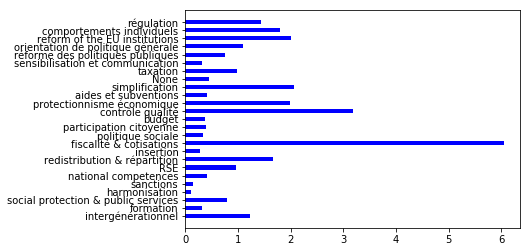



devienne
[('comportements individuels', 11), ('orientation de politique générale', 10), ('EU competences', 8), ('reform of the EU institutions', 6), ('politique sociale', 6), ('None', 5), ('régulation', 5), ('sensibilisation et communication', 4), ('sanctions', 4), ('coopération intergouvernementale', 4), ('national competences', 3), ('formation', 2), ('budget', 2), ('harmonisation', 2), ('réforme des politiques publiques', 2), ('participation citoyenne', 2), ('pan-European major projects', 2), ('insertion', 1), ('aménagement des espaces', 1), ('taxation', 1), ('aménagement du territoire', 1), ('RSE', 1)]


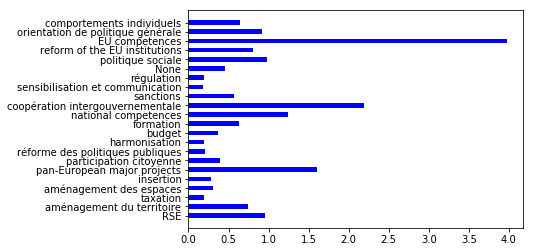



écouter
[('sensibilisation et communication', 20), ('comportements individuels', 14), ('participation citoyenne', 3), ('politique sociale', 3), ('aménagement des espaces', 2), ('orientation de politique générale', 2), ('None', 2), ('aides et subventions', 1), ('pan-European major projects', 1), ('budget', 1), ('régulation', 1)]


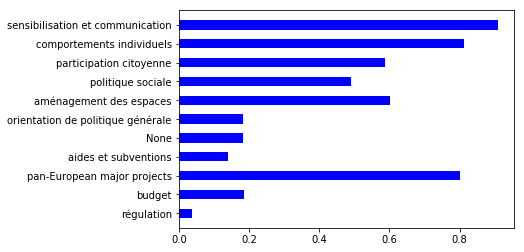



changer
[('sensibilisation et communication', 32), ('comportements individuels', 13), ('régulation', 10), ('orientation de politique générale', 7), ('None', 6), ('reform of the EU institutions', 4), ('insertion', 3), ('participation citoyenne', 3), ('harmonisation', 2), ('réforme des politiques publiques', 2), ('sanctions', 2), ('taxation', 1), ('RSE', 1), ('sortie euro et Europe', 1), ('EU competences', 1), ('diplomatic decisions & treaties', 1), ('pan-European major projects', 1), ('intergénérationnel', 1), ('politique sociale', 1)]


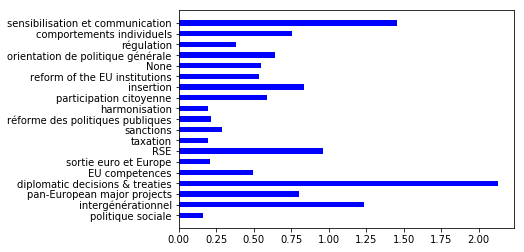



accueillir
[('régulation', 11), ('aménagement des espaces', 9), ('orientation de politique générale', 8), ('aides et subventions', 6), ('budget', 4), ('politique sociale', 4), ('formation', 3), ('insertion', 3), ('coopération intergouvernementale', 3), ('réforme des politiques publiques', 2), ('None', 2), ('national competences', 2), ('sanctions', 1), ('EU competences', 1), ('intergénérationnel', 1)]


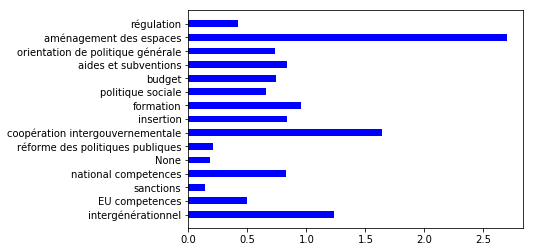



préserver
[('régulation', 11), ('orientation de politique générale', 7), ('None', 4), ('comportements individuels', 2), ('aménagement du territoire', 2), ('sensibilisation et communication', 2), ('sanctions', 1), ('contrôle qualité', 1), ('national competences', 1), ('sortie euro et Europe', 1), ('coopération intergouvernementale', 1), ('taxation', 1), ('participation citoyenne', 1), ('intergénérationnel', 1), ('budget', 1), ('couverture sociale', 1), ('politique sociale', 1)]


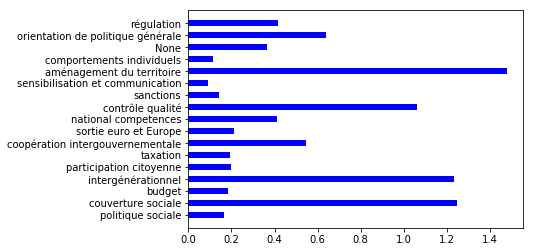



montrer
[('sensibilisation et communication', 19), ('comportements individuels', 3), ('simplification', 1), ('régulation', 1), ('None', 1), ('accompagnement & coaching', 1), ('reform of the EU institutions', 1), ('EU competences', 1), ('orientation de politique générale', 1), ('intergénérationnel', 1)]


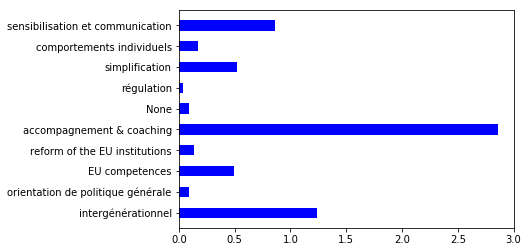



liées
[('sensibilisation et communication', 15), ('régulation', 5), ('insertion', 4), ('orientation de politique générale', 4), ('réforme des politiques publiques', 4), ('formation', 3), ('simplification', 3), ('budget', 2), ('aides et subventions', 2), ('aménagement des espaces', 1), ('None', 1), ('reform of the EU institutions', 1), ('harmonisation', 1), ('sortie euro et Europe', 1), ('pan-European major projects', 1), ('national competences', 1), ('politique sociale', 1), ('couverture sociale', 1)]


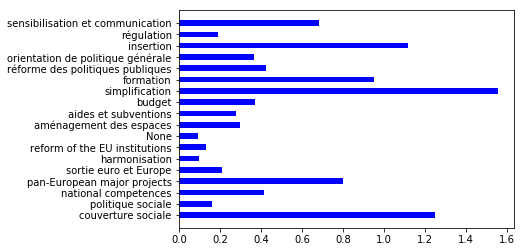



voir
[('sensibilisation et communication', 12), ('None', 7), ('comportements individuels', 7), ('réforme des politiques publiques', 4), ('régulation', 4), ('aides et subventions', 3), ('harmonisation', 3), ('orientation de politique générale', 2), ('insertion', 2), ('reform of the EU institutions', 2), ('politique sociale', 2), ('sanctions', 1), ('protectionnisme économique', 1), ('sortie euro et Europe', 1), ('coopération intergouvernementale', 1), ('budget', 1)]


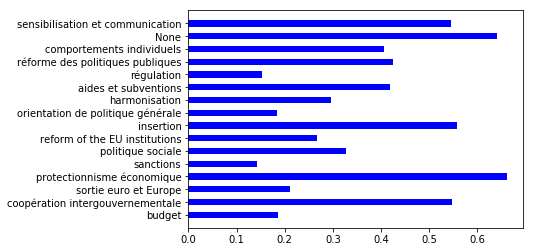



bannir
[('régulation', 20), ('sanctions', 7), ('comportements individuels', 4), ('orientation de politique générale', 3), ('protectionnisme économique', 2), ('réforme des politiques publiques', 1)]


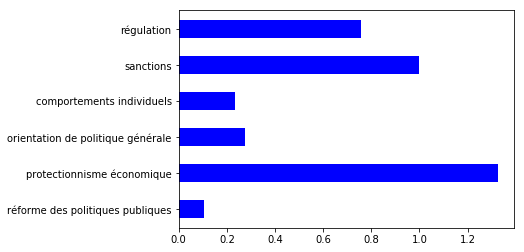



uniformiser
[('harmonisation', 37), ('régulation', 1), ('sensibilisation et communication', 1), ('coopération intergouvernementale', 1), ('politique sociale', 1)]


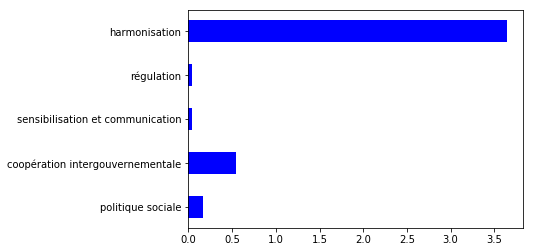



importer
[('protectionnisme économique', 16), ('régulation', 12), ('None', 5), ('comportements individuels', 4), ('orientation de politique générale', 4), ('sensibilisation et communication', 2), ('harmonisation', 2), ('taxation', 2), ('coopération intergouvernementale', 2), ('european protectionism', 2), ('aides et subventions', 1), ('contrôle qualité', 1)]


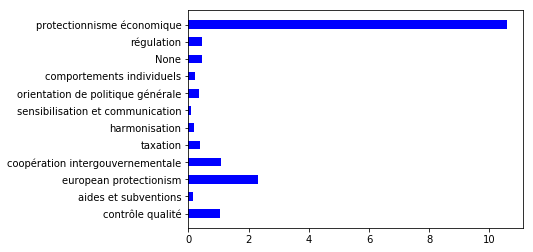



rétablir
[('régulation', 18), ('national competences', 7), ('orientation de politique générale', 5), ('sanctions', 4), ('european protectionism', 4), ('sortie euro et Europe', 4), ('social protection & public services', 4), ('sensibilisation et communication', 2), ('None', 2), ('taxation', 2), ('budget', 2), ('insertion', 1), ('aides et subventions', 1), ('aménagement des espaces', 1), ('action européenne', 1), ('comportements individuels', 1), ('participation citoyenne', 1), ('reform of the EU institutions', 1), ('pan-European major projects', 1), ('couverture sociale', 1), ('fiscalité & cotisations', 1), ('politique sociale', 1)]


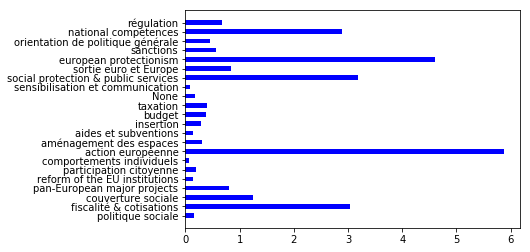



retrouver
[('sortie euro et Europe', 21), ('national competences', 14), ('comportements individuels', 6), ('réforme des politiques publiques', 5), ('régulation', 5), ('None', 4), ('reform of the EU institutions', 4), ('sensibilisation et communication', 3), ('aides et subventions', 3), ('sanctions', 3), ('orientation de politique générale', 2), ('aménagement des espaces', 1), ('taxation', 1), ('protectionnisme économique', 1), ('EU competences', 1), ('coopération intergouvernementale', 1), ('social protection & public services', 1), ('harmonisation', 1), ('european protectionism', 1), ('couverture sociale', 1)]


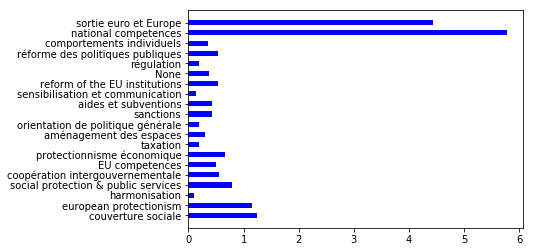



simplifier
[('simplification', 23), ('régulation', 4), ("transformation de l'administration", 4), ('sensibilisation et communication', 2), ('participation citoyenne', 2), ('reform of the EU institutions', 2), ('harmonisation', 2), ('budget', 1), ('aménagement des espaces', 1), ('None', 1), ('sortie euro et Europe', 1), ('politique sociale', 1), ('numérique', 1), ('aides et subventions', 1), ('formation', 1)]


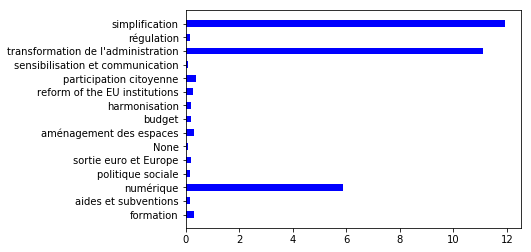



rester
[('politique sociale', 18), ('aides et subventions', 13), ('comportements individuels', 6), ('sensibilisation et communication', 6), ('budget', 5), ('régulation', 5), ('None', 5), ('sortie euro et Europe', 3), ('orientation de politique générale', 2), ('national competences', 2), ('coopération intergouvernementale', 2), ('couverture sociale', 2), ('aménagement des espaces', 1), ('simplification', 1), ('protectionnisme économique', 1), ('harmonisation', 1), ('reform of the EU institutions', 1), ('social protection & public services', 1), ('european protectionism', 1), ('formation', 1), ('fiscalité & cotisations', 1), ('numérique', 1)]


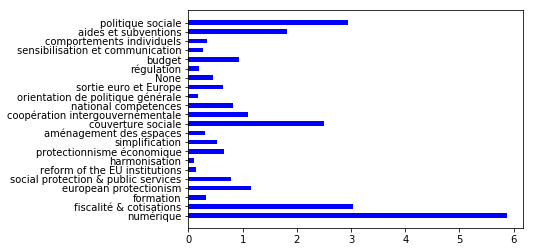



parler
[('sensibilisation et communication', 29), ('comportements individuels', 5), ('régulation', 4), ('reform of the EU institutions', 3), ('harmonisation', 3), ('aménagement des espaces', 2), ('diplomatic decisions & treaties', 2), ('politique sociale', 2), ('None', 1), ('contrôle qualité', 1), ('aides et subventions', 1), ('participation citoyenne', 1), ('sortie euro et Europe', 1), ('pan-European major projects', 1), ('formation', 1), ("transformation de l'administration", 1)]


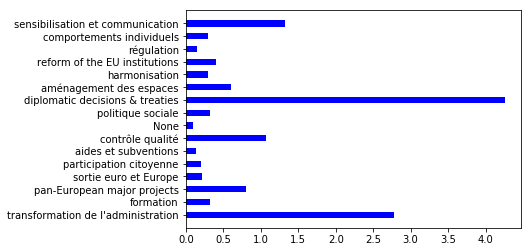



encadrer
[('régulation', 11), ('politique sociale', 3), ('formation', 2), ('réforme des politiques publiques', 2), ('sanctions', 2), ('budget', 1), ('None', 1), ('orientation de politique générale', 1), ('reform of the EU institutions', 1), ('harmonisation', 1), ('EU competences', 1)]


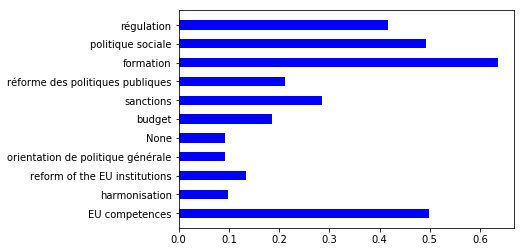



voter
[('participation citoyenne', 13), ('reform of the EU institutions', 11), ('régulation', 6), ('sensibilisation et communication', 5), ('simplification', 3), ('sortie euro et Europe', 3), ('budget', 2), ('harmonisation', 2), ('national competences', 2), ('coopération intergouvernementale', 2), ('None', 1), ('comportements individuels', 1), ('sanctions', 1), ('pan-European major projects', 1), ('EU competences', 1)]


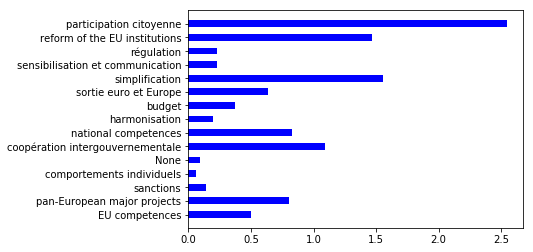



redonner
[('national competences', 13), ('participation citoyenne', 7), ('comportements individuels', 6), ('sensibilisation et communication', 5), ('sortie euro et Europe', 5), ('orientation de politique générale', 4), ('None', 4), ('aides et subventions', 2), ('régulation', 2), ('insertion', 1), ('protection environnementale', 1), ('redistribution & répartition', 1), ('taxation', 1), ('reform of the EU institutions', 1), ('harmonisation', 1), ('land development', 1), ('formation', 1), ('budget', 1), ('politique sociale', 1)]


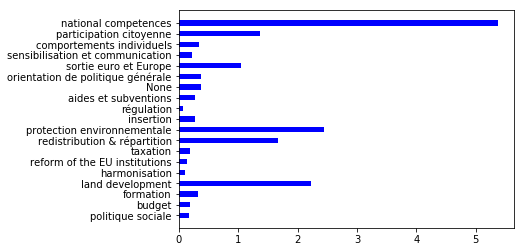



garder
[('aides et subventions', 12), ('national competences', 6), ('politique sociale', 6), ('orientation de politique générale', 5), ('comportements individuels', 5), ('réforme des politiques publiques', 4), ('budget', 4), ('harmonisation', 3), ('None', 3), ('régulation', 3), ('coopération intergouvernementale', 3), ('reform of the EU institutions', 3), ('insertion', 2), ('EU competences', 2), ('social protection & public services', 2), ('sensibilisation et communication', 2), ('sortie euro et Europe', 1), ('couverture sociale', 1), ('engagement associatif', 1), ('fiscalité & cotisations', 1)]


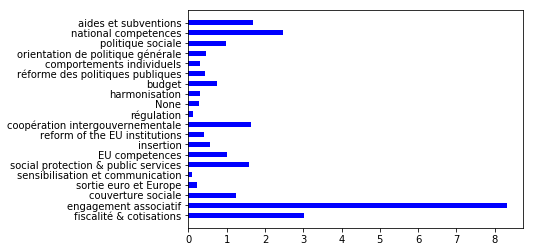



fermer
[('régulation', 19), ('sanctions', 7), ('reform of the EU institutions', 4), ('réforme des politiques publiques', 3), ('sortie euro et Europe', 3), ('european protectionism', 3), ('national competences', 3), ('insertion', 2), ('aides et subventions', 2), ('orientation de politique générale', 2), ('None', 2), ('aménagement des espaces', 1), ('sensibilisation et communication', 1), ('protectionnisme économique', 1), ('responsabilisation', 1), ('participation citoyenne', 1), ('pan-European major projects', 1), ('engagement associatif', 1)]


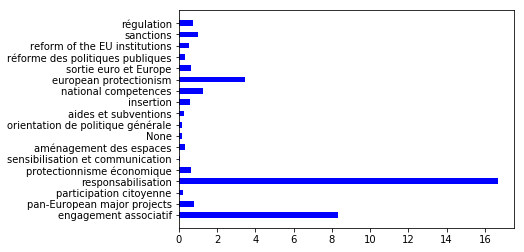



délais
[('simplification', 13), ('None', 4), ('réforme des politiques publiques', 2), ('sanctions', 2), ('régulation', 1)]


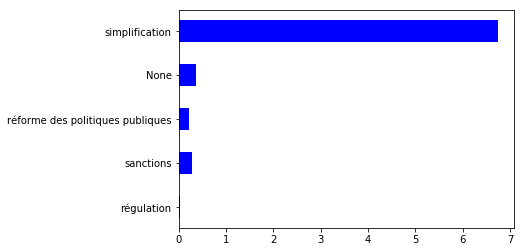



stopper
[('régulation', 65), ('orientation de politique générale', 11), ('sanctions', 11), ('comportements individuels', 5), ('harmonisation', 4), ('None', 3), ('social protection & public services', 3), ('aides et subventions', 2), ('protectionnisme économique', 2), ('réforme des politiques publiques', 2), ('protection environnementale', 2), ('participation citoyenne', 2), ('european protectionism', 2), ('contrôle qualité', 1), ('EU competences', 1), ('reform of the EU institutions', 1), ('coopération intergouvernementale', 1), ('national competences', 1), ('politique sociale', 1)]


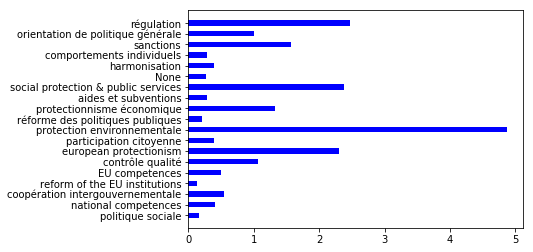



légaliser
[('régulation', 13), ('réforme des politiques publiques', 7), ('sanctions', 1), ('reform of the EU institutions', 1), ('None', 1), ('orientation de politique générale', 1)]


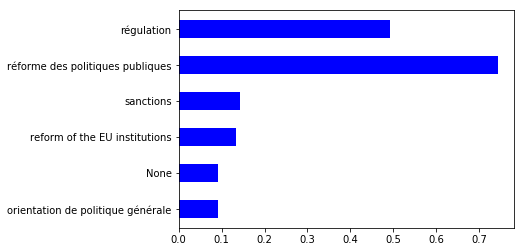



viennent
[('comportements individuels', 15), ('protectionnisme économique', 10), ('sensibilisation et communication', 9), ('régulation', 8), ('None', 7), ('participation citoyenne', 6), ('taxation', 6), ('orientation de politique générale', 5), ('sanctions', 3), ('protection environnementale', 3), ('reform of the EU institutions', 3), ('harmonisation', 2), ('contrôle qualité', 2), ('budget', 2), ('politique sociale', 2), ('european protectionism', 1), ('social protection & public services', 1)]


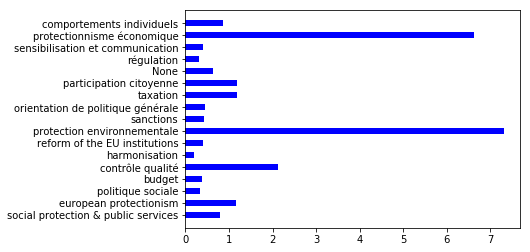



frais
[('comportements individuels', 59), ('sensibilisation et communication', 27), ('régulation', 22), ('None', 17), ('orientation de politique générale', 10), ('aides et subventions', 8), ('réforme des politiques publiques', 8), ('budget', 4), ('taxation', 4), ('protectionnisme économique', 3), ('reform of the EU institutions', 3), ('sanctions', 3), ('harmonisation', 2), ('couverture sociale', 2), ('politique sociale', 2), ('redistribution & répartition', 1), ('aménagement du territoire', 1), ('protection environnementale', 1), ('accompagnement & coaching', 1), ('simplification', 1), ('formation', 1)]


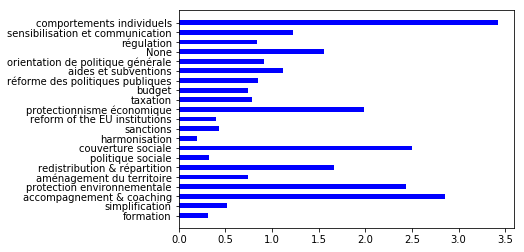



vendre
[('régulation', 45), ('None', 23), ('comportements individuels', 20), ('sensibilisation et communication', 8), ('sanctions', 7), ('orientation de politique générale', 6), ('protectionnisme économique', 6), ('taxation', 5), ('RSE', 5), ('protection environnementale', 4), ('harmonisation', 3), ('budget', 3), ('aides et subventions', 2), ('réforme des politiques publiques', 2), ('insertion', 1), ('participation citoyenne', 1), ('sortie euro et Europe', 1), ('couverture sociale', 1), ('fiscalité & cotisations', 1)]


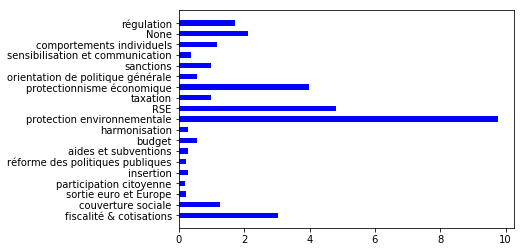



partager
[('sensibilisation et communication', 14), ('participation citoyenne', 11), ('comportements individuels', 8), ('aménagement du territoire', 8), ('harmonisation', 5), ('politique sociale', 5), ('None', 4), ('régulation', 4), ('intergénérationnel', 3), ('insertion', 2), ('orientation de politique générale', 2), ('aménagement des espaces', 2), ('aides et subventions', 2), ('coopération intergouvernementale', 2), ('budget', 1), ('réforme des politiques publiques', 1), ('sortie euro et Europe', 1), ('pan-European major projects', 1), ('social protection & public services', 1), ('land development', 1)]


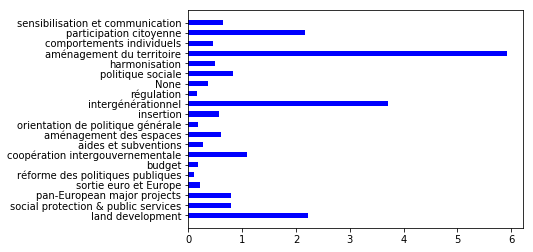



préparés
[('comportements individuels', 40), ('régulation', 15), ('sensibilisation et communication', 13), ('orientation de politique générale', 3), ('None', 2), ('contrôle qualité', 2), ('reform of the EU institutions', 1), ('pan-European major projects', 1), ('social protection & public services', 1), ('aides et subventions', 1)]


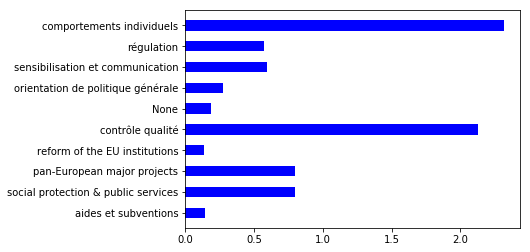



instaurer
[('régulation', 15), ('participation citoyenne', 15), ('harmonisation', 15), ('taxation', 12), ('sensibilisation et communication', 11), ('reform of the EU institutions', 11), ('réforme des politiques publiques', 6), ('sanctions', 6), ('orientation de politique générale', 5), ('RSE', 4), ('social protection & public services', 3), ('pan-European major projects', 3), ('EU competences', 2), ('budget', 2), ('simplification', 1), ('contrôle qualité', 1), ('sortie euro et Europe', 1), ('european protectionism', 1), ('comportements individuels', 1), ('aides et subventions', 1), ('politique sociale', 1), ('intergénérationnel', 1), ('couverture sociale', 1)]


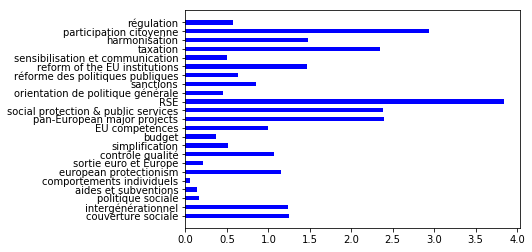



éduquer
[('sensibilisation et communication', 139), ('comportements individuels', 6), ('régulation', 3), ('orientation de politique générale', 2), ('insertion', 1), ('sanctions', 1), ('formation', 1), ('simplification', 1), ('aménagement du territoire', 1), ('harmonisation', 1), ('intergénérationnel', 1)]


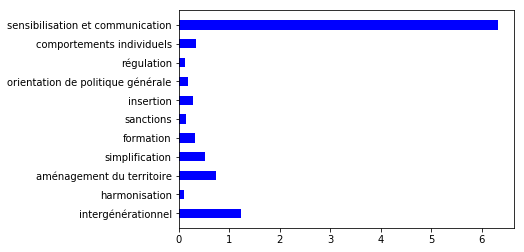



enlever
[('régulation', 13), ('reform of the EU institutions', 5), ('réforme des politiques publiques', 4), ('taxation', 4), ('orientation de politique générale', 2), ('insertion', 1), ('None', 1), ('contrôle qualité', 1), ('comportements individuels', 1)]


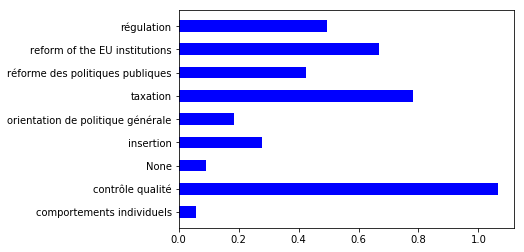



croire
[('sensibilisation et communication', 12), ('comportements individuels', 2), ('None', 2), ('sanctions', 1), ('simplification', 1), ('régulation', 1), ('harmonisation', 1)]


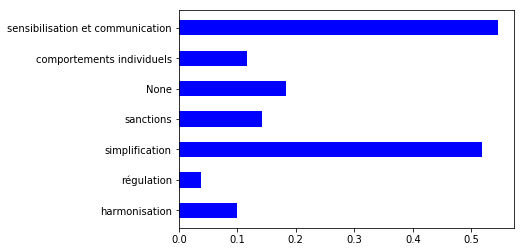



cultiver
[('comportements individuels', 16), ('sensibilisation et communication', 13), ('régulation', 11), ('aménagement du territoire', 8), ('None', 6), ('participation citoyenne', 3), ('contrôle qualité', 1), ('protection environnementale', 1), ('réforme des politiques publiques', 1)]


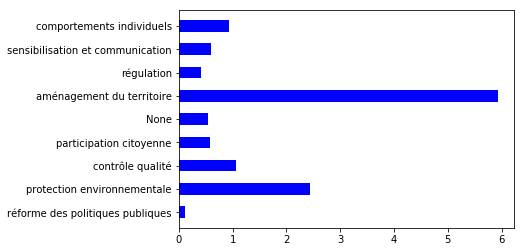



transformés
[('régulation', 40), ('comportements individuels', 37), ('sensibilisation et communication', 25), ('taxation', 9), ('None', 5), ('orientation de politique générale', 3), ('reform of the EU institutions', 3), ('réforme des politiques publiques', 2), ('aides et subventions', 2), ('contrôle qualité', 1), ('harmonisation', 1), ('protectionnisme économique', 1), ('RSE', 1), ('sanctions', 1), ('aménagement du territoire', 1), ('participation citoyenne', 1), ('politique sociale', 1)]


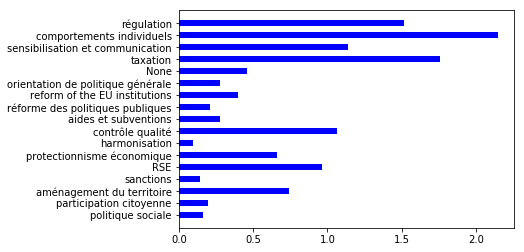



empêcher
[('régulation', 16), ('sanctions', 6), ('national competences', 3), ('orientation de politique générale', 2), ('sensibilisation et communication', 2), ('reform of the EU institutions', 2), ('harmonisation', 2), ('taxation', 2), ('pan-European major projects', 2), ('None', 1), ('aides et subventions', 1), ('coopération intergouvernementale', 1), ('sortie euro et Europe', 1), ('european protectionism', 1), ('EU competences', 1)]


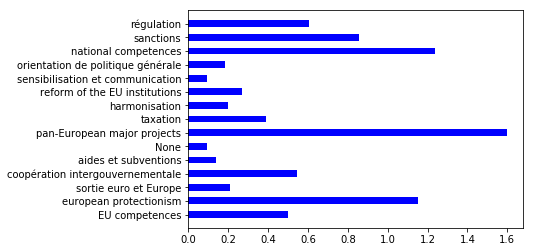



reste
[('régulation', 11), ('aides et subventions', 6), ('comportements individuels', 5), ('national competences', 5), ('couverture sociale', 5), ('sensibilisation et communication', 2), ('réforme des politiques publiques', 2), ('harmonisation', 2), ('politique sociale', 2), ('aménagement des espaces', 1), ('redistribution & répartition', 1), ('orientation de politique générale', 1), ('coopération intergouvernementale', 1), ('reform of the EU institutions', 1), ('pan-European major projects', 1), ('fiscalité & cotisations', 1)]


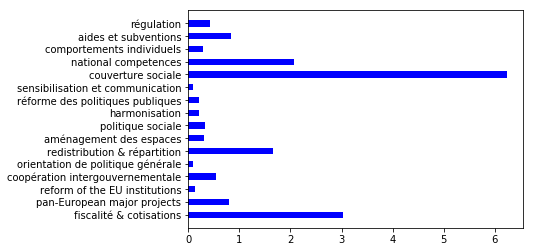



remplacer
[('régulation', 11), ('reform of the EU institutions', 10), ('comportements individuels', 9), ('None', 6), ('aménagement du territoire', 6), ('taxation', 6), ('sensibilisation et communication', 5), ('orientation de politique générale', 5), ('participation citoyenne', 4), ('réforme des politiques publiques', 2), ('aides et subventions', 1), ('protection environnementale', 1), ('action européenne', 1), ('sortie euro et Europe', 1), ('coopération intergouvernementale', 1), ('sanctions', 1), ('harmonisation', 1), ('EU competences', 1), ('simplification', 1), ('budget', 1)]


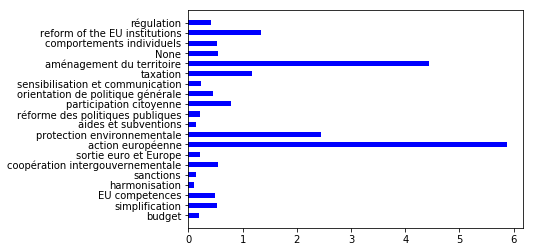



introduire
[('sensibilisation et communication', 12), ('None', 4), ('participation citoyenne', 2), ('harmonisation', 2), ('aides et subventions', 1), ('réforme des politiques publiques', 1), ('comportements individuels', 1), ('régulation', 1), ('reform of the EU institutions', 1), ('taxation', 1), ('orientation de politique générale', 1), ('european protectionism', 1), ('politique sociale', 1)]


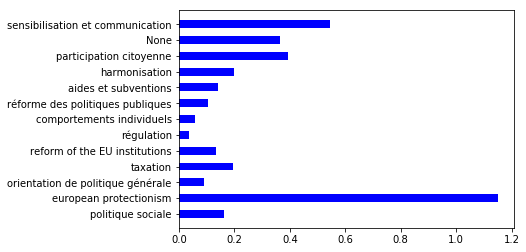



afficher
[('sensibilisation et communication', 17), ('régulation', 4), ('contrôle qualité', 2), ('réforme des politiques publiques', 2), ('None', 2), ('insertion', 1), ('aménagement des espaces', 1), ('orientation de politique générale', 1)]


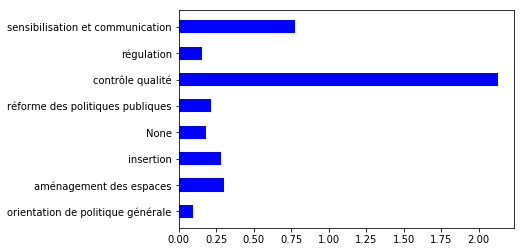



plafonner
[('régulation', 13), ('budget', 2), ('reform of the EU institutions', 2), ('harmonisation', 1), ('politique sociale', 1)]


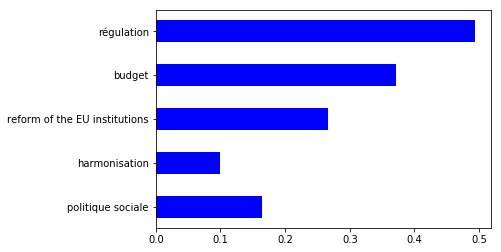



acheter
[('comportements individuels', 144), ('None', 20), ('sensibilisation et communication', 17), ('régulation', 16), ('protectionnisme économique', 15), ('réforme des politiques publiques', 4), ('orientation de politique générale', 4), ('RSE', 3), ('aides et subventions', 2), ('redistribution & répartition', 2), ('taxation', 2), ('aménagement des espaces', 1), ('simplification', 1), ('contrôle qualité', 1), ('harmonisation', 1), ('participation citoyenne', 1), ('sanctions', 1), ('protection environnementale', 1), ('EU competences', 1), ('european protectionism', 1)]


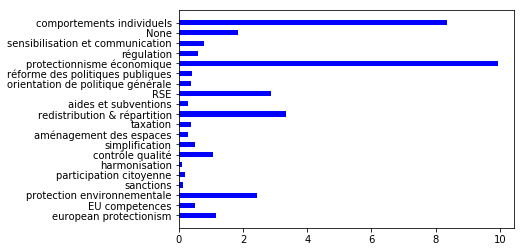



élire
[('reform of the EU institutions', 32), ('participation citoyenne', 12), ('EU competences', 2), ('réforme des politiques publiques', 1), ('budget', 1)]


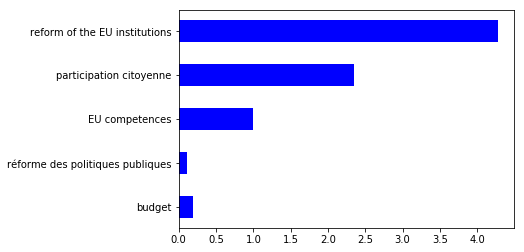



tirés
[('participation citoyenne', 15), ('reform of the EU institutions', 9), ('harmonisation', 3), ('régulation', 2), ('budget', 1), ('taxation', 1), ('orientation de politique générale', 1)]


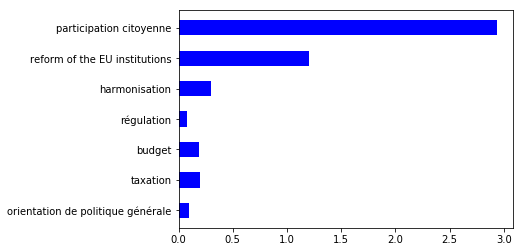



produire
[('régulation', 16), ('None', 7), ('orientation de politique générale', 6), ('comportements individuels', 4), ('protectionnisme économique', 4), ('aménagement du territoire', 4), ('sanctions', 3), ('contrôle qualité', 3), ('aides et subventions', 3), ('sensibilisation et communication', 2), ('taxation', 2), ('réforme des politiques publiques', 2), ('aménagement des espaces', 1), ('RSE', 1), ('redistribution & répartition', 1), ('protection environnementale', 1), ('accompagnement & coaching', 1)]


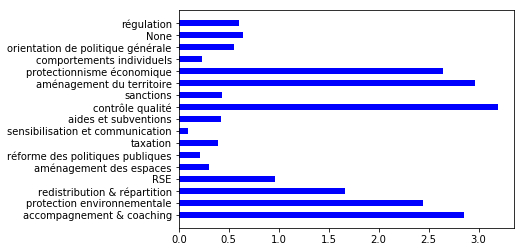



consommer
[('comportements individuels', 93), ('sensibilisation et communication', 27), ('protectionnisme économique', 8), ('régulation', 6), ('None', 6), ('orientation de politique générale', 3), ('contrôle qualité', 2), ('réforme des politiques publiques', 1), ('sanctions', 1), ('taxation', 1), ('european protectionism', 1), ('budget', 1), ('national competences', 1)]


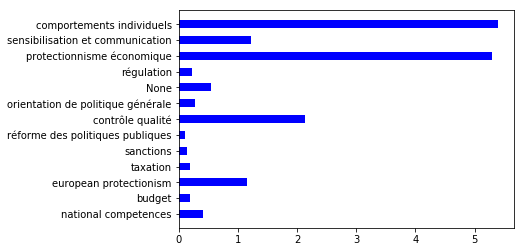



bien manger
[('sensibilisation et communication', 30), ('None', 3), ('comportements individuels', 2), ('contrôle qualité', 1), ('régulation', 1), ('protection environnementale', 1), ('réforme des politiques publiques', 1)]


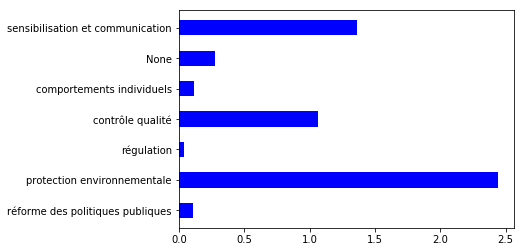



manger
[('comportements individuels', 365), ('sensibilisation et communication', 59), ('régulation', 17), ('None', 14), ('orientation de politique générale', 11), ('protectionnisme économique', 4), ('redistribution & répartition', 4), ('sanctions', 3), ('taxation', 2), ('aménagement du territoire', 2), ('aides et subventions', 2), ("transformation de l'administration", 2), ('harmonisation', 1), ('réforme des politiques publiques', 1), ('participation citoyenne', 1), ('RSE', 1), ('contrôle qualité', 1), ('politique sociale', 1)]


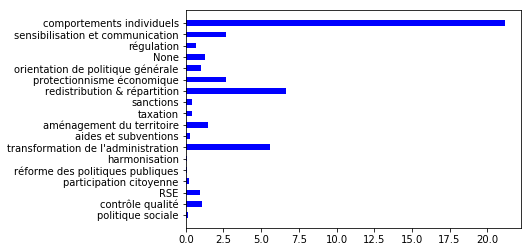



réapprendre
[('comportements individuels', 34), ('sensibilisation et communication', 19), ('orientation de politique générale', 3), ('aménagement du territoire', 1), ('formation', 1)]


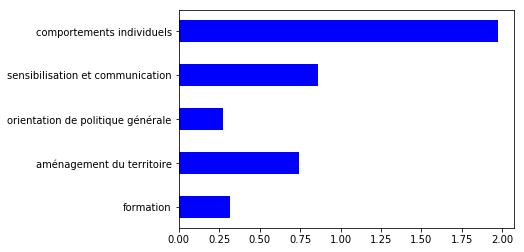



cuisiner
[('comportements individuels', 120), ('sensibilisation et communication', 54), ('orientation de politique générale', 6), ('None', 5), ('régulation', 4), ('protectionnisme économique', 1), ('participation citoyenne', 1), ('RSE', 1)]


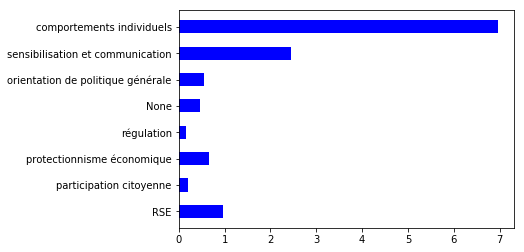



manger mieux
[('comportements individuels', 12), ('sensibilisation et communication', 2), ('réforme des politiques publiques', 1), ('None', 1)]


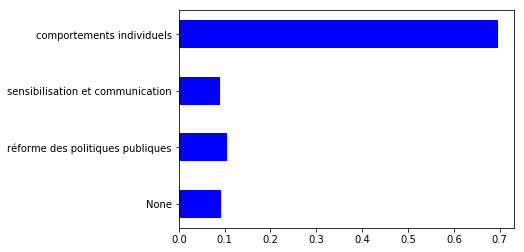



variés
[('comportements individuels', 16), ('sensibilisation et communication', 3), ('None', 3), ('régulation', 2), ('orientation de politique générale', 1), ('formation', 1), ('politique sociale', 1)]


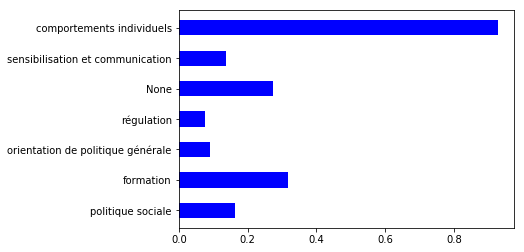



nourrir
[('sensibilisation et communication', 14), ('comportements individuels', 10), ('None', 6), ('orientation de politique générale', 6), ('régulation', 5), ('sanctions', 3), ('aménagement du territoire', 3), ('fiscalité & cotisations', 2), ('protection environnementale', 1), ('réforme des politiques publiques', 1), ('aides et subventions', 1), ('national competences', 1), ('harmonisation', 1), ('participation citoyenne', 1), ('budget', 1)]


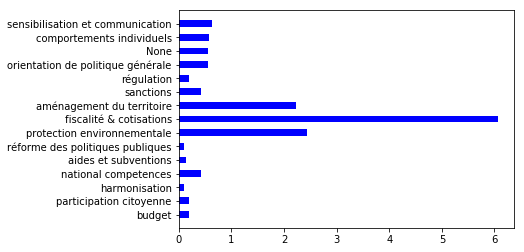



boycotter
[('comportements individuels', 13), ('sanctions', 10), ('protectionnisme économique', 2), ('aménagement du territoire', 1), ('participation citoyenne', 1), ('orientation de politique générale', 1)]


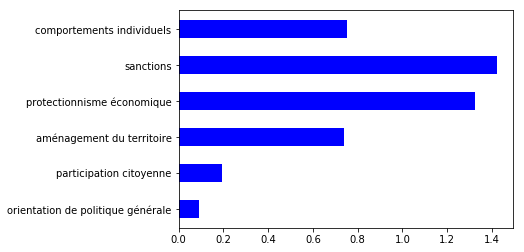



cher
[('régulation', 11), ('None', 9), ('comportements individuels', 3), ('sensibilisation et communication', 2), ('taxation', 2), ('protectionnisme économique', 1), ('harmonisation', 1), ('budget', 1), ('sortie euro et Europe', 1), ('politique sociale', 1)]


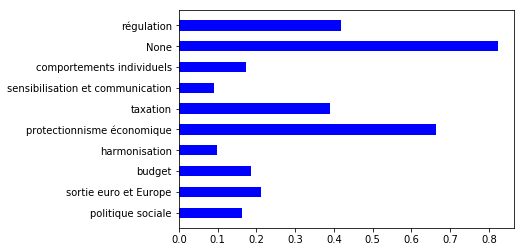



tuer
[('régulation', 12), ('comportements individuels', 3), ('sanctions', 3), ('None', 3), ('sortie euro et Europe', 2), ('orientation de politique générale', 1), ('taxation', 1), ('budget', 1)]


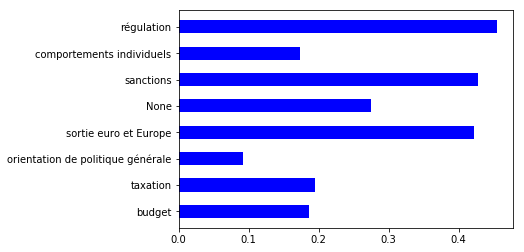



issus
[('régulation', 13), ('comportements individuels', 11), ('taxation', 11), ('None', 8), ('sensibilisation et communication', 6), ('reform of the EU institutions', 3), ('sanctions', 2), ('orientation de politique générale', 2), ('harmonisation', 2), ('aides et subventions', 1), ('RSE', 1), ('simplification', 1), ('réforme des politiques publiques', 1), ('contrôle qualité', 1), ('protectionnisme économique', 1), ('budget', 1), ('european protectionism', 1)]


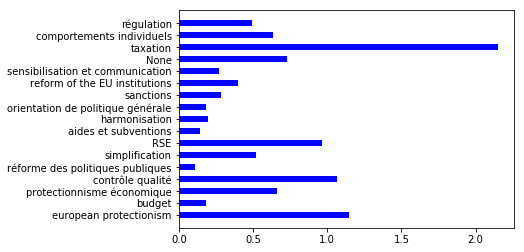



acheter directement
[('comportements individuels', 11), ('protectionnisme économique', 1), ('sensibilisation et communication', 1)]


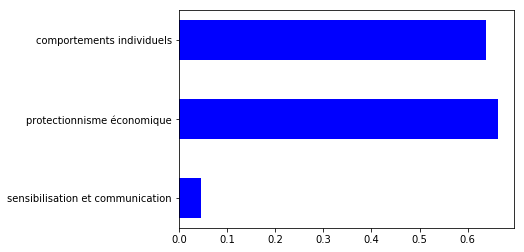



aligner
[('harmonisation', 15), ('régulation', 4), ('réforme des politiques publiques', 1), ('coopération intergouvernementale', 1), ('reform of the EU institutions', 1), ('budget', 1), ('orientation de politique générale', 1), ('social protection & public services', 1)]


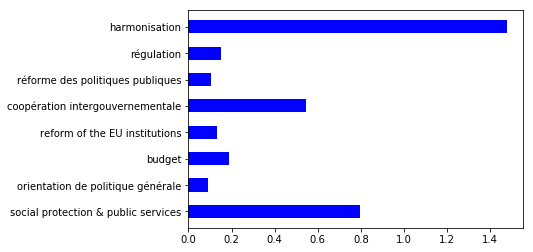



réglementer
[('régulation', 11), ('None', 2), ('simplification', 1), ('taxation', 1)]


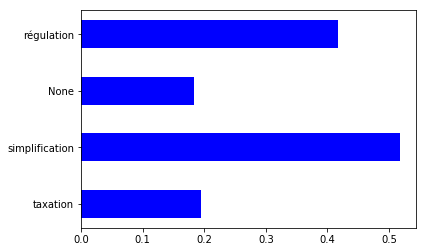



unifier
[('harmonisation', 12), ('justice', 1), ('simplification', 1)]


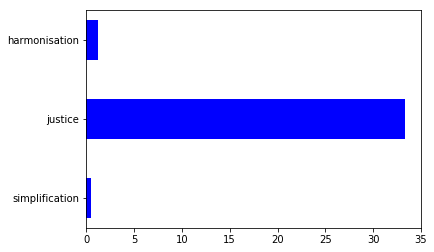



quitter
[('sortie euro et Europe', 51), ('budget', 2), ('régulation', 1)]


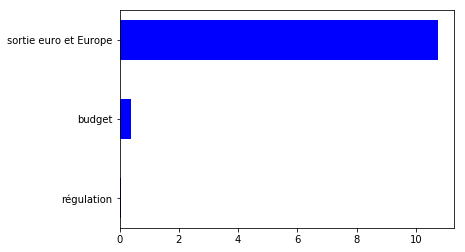



élu
[('reform of the EU institutions', 30), ('participation citoyenne', 9), ('régulation', 4), ('EU competences', 2), ('comportements individuels', 1), ('sensibilisation et communication', 1), ('sanctions', 1), ('simplification', 1), ('orientation de politique générale', 1)]


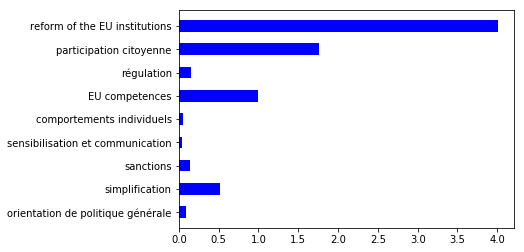



renvoyer
[('régulation', 12), ('orientation de politique générale', 2), ('european protectionism', 1)]


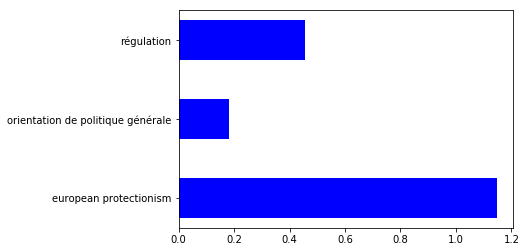

In [104]:
for k,v in vp2solutioncount.items() : 
    sortedsolution=sorted(vp2solutioncount[k].items(), key=lambda x: x[1], reverse=True)
    if(len(sortedsolution)>1):
        if (sortedsolution[0][1]>10) :
            print(k)
            print(sortedsolution)
            graphe = plt.figure()
            y = range(1,len(sortedsolution)+1)
            height = [j/solutionscount[i]*100 for i,j in sortedsolution]
            width = 0.5
            BarName =[i for i,j in sortedsolution]
            pylab.yticks(y, BarName)
            plt.barh(y, height, width, color='b')
            plt.gca().invert_yaxis()
            plt.show()
            print('\n')

harmonisation
[('harmoniser', 152), ('uniformiser', 37), ('mettre', 36), ('créer', 36), ('éviter', 32), ('instaurer', 17), ('aligner', 15), ('appliquer', 13), ('proposer', 13), ('rendre', 13), ('unifier', 12), ('donner', 10), ('payer', 10), ('réduire', 10), ('établir', 10)]


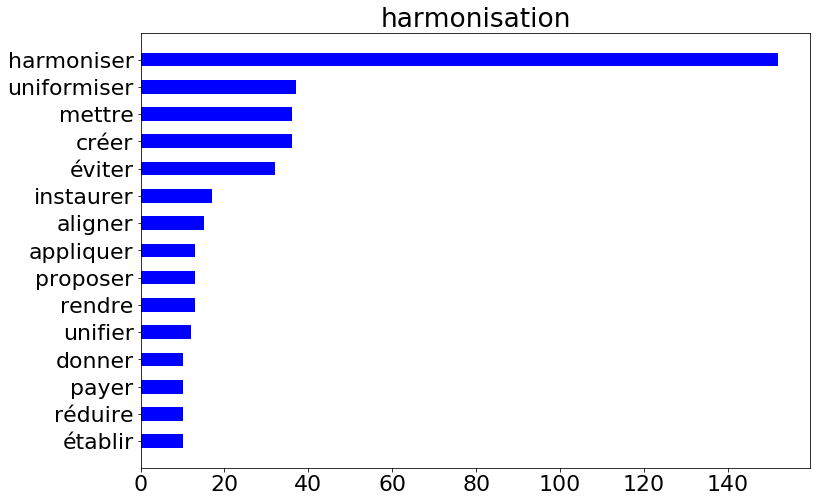



sanctions
[('interdire', 131), ('arrêter', 44), ('respecter', 41), ('supprimer', 34), ('mettre', 29), ('lutter', 24), ('punir', 22), ('sanctionner', 21), ('appliquer', 18), ('obliger', 15), ('utiliser', 15), ('créer', 14), ('stopper', 11), ('réserver', 11), ('renforcer', 11)]


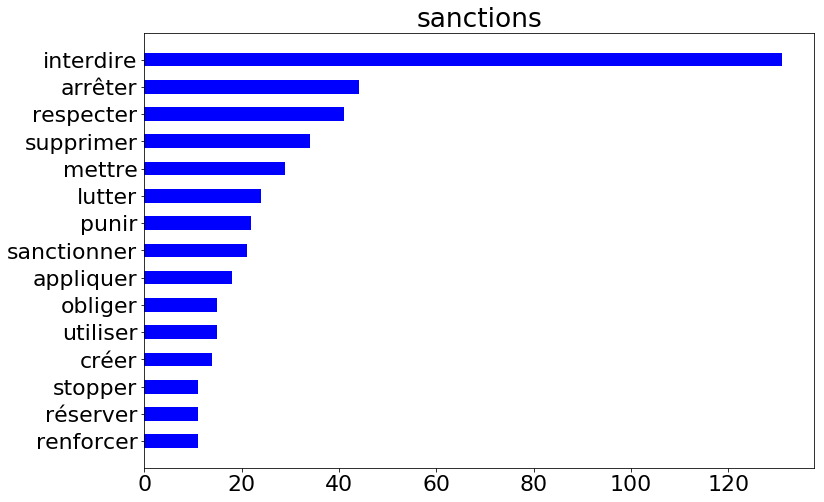



réforme des politiques publiques
[('créer', 54), ('reconnaître', 47), ('prendre', 45), ('arrêter', 44), ('permettre', 38), ('supprimer', 36), ('mettre', 34), ('augmenter', 29), ('aider', 27), ('revoir', 25), ('adapter', 25), ('rendre', 22), ('donner', 22), ('garantir', 18), ('développer', 16)]


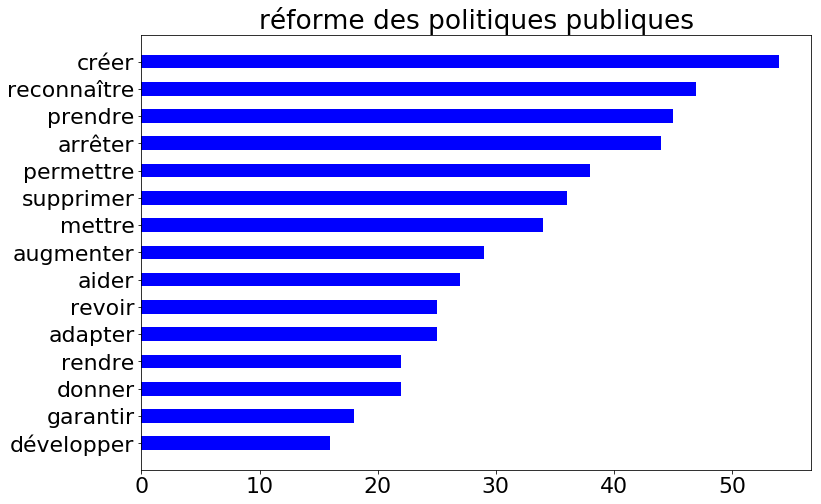



formation
[('former', 110), ('adapter', 20), ('mieux former', 18), ('créer', 13), ('accompagner', 12), ('aider', 11), ('améliorer', 11), ('soigner', 11), ('permettre', 10), ('mettre', 8), ('valoriser', 8), ('qualifier', 8), ('augmenter', 8), ('occuper', 7), ('revoir', 6)]


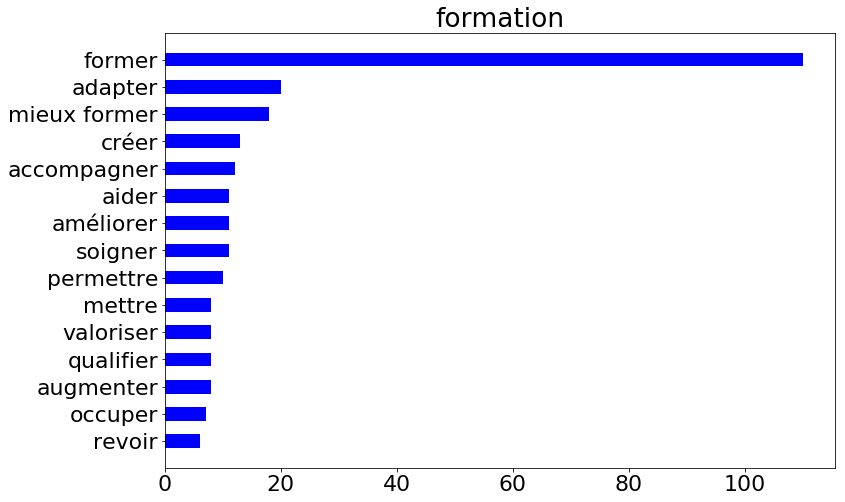



participation citoyenne
[('mettre', 32), ('créer', 29), ('donner', 24), ('proposer', 23), ('élire', 21), ('prendre', 15), ('voter', 15), ('instaurer', 15), ('tirer', 15), ('développer', 14), ('permettre', 14), ('favoriser', 11), ('partager', 11), ('pouvoir', 9), ('respecter', 8)]


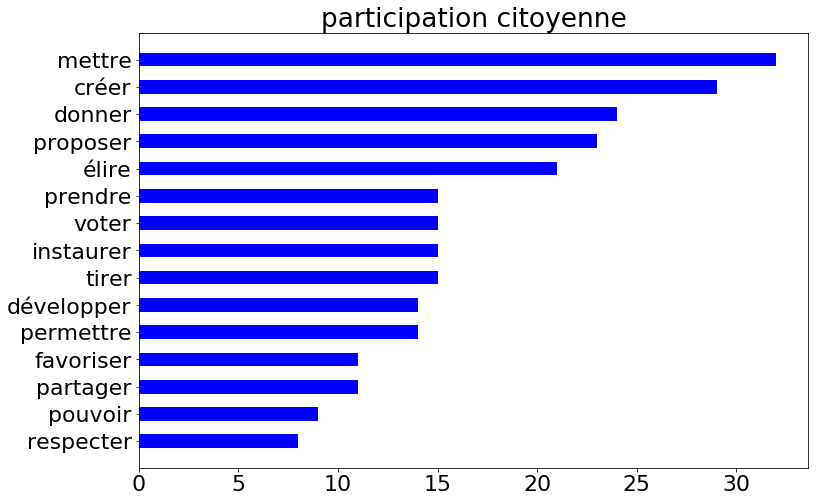



None
[('proposer', 90), ('favoriser', 66), ('permettre', 53), ('arrêter', 51), ('privilégier', 48), ('développer', 40), ('mettre', 32), ('aider', 28), ('créer', 28), ('rendre', 25), ('vendre', 23), ('acheter', 20), ('donner', 20), ('prendre', 19), ('respecter', 18)]


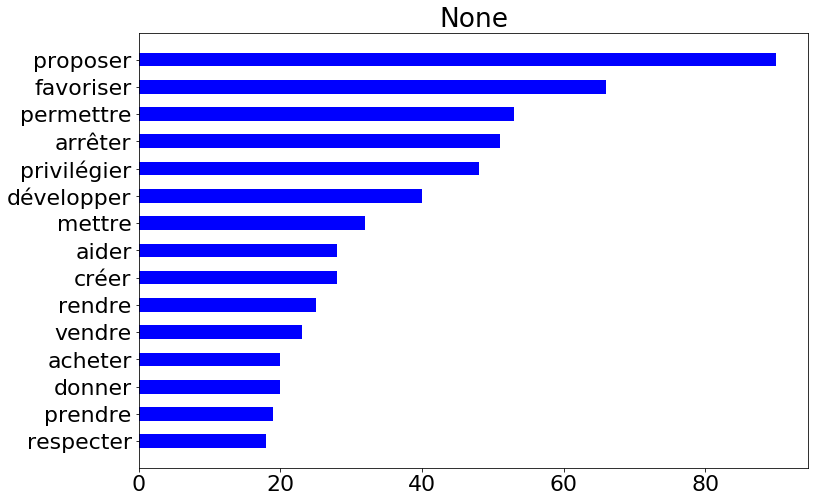



orientation de politique générale
[('mettre', 59), ('proposer', 53), ('arrêter', 49), ('favoriser', 41), ('développer', 38), ('privilégier', 35), ('créer', 35), ('permettre', 30), ('prendre', 24), ('donner', 22), ('promouvoir', 20), ('éviter', 18), ('sortir', 18), ('aider', 16), ('travailler', 16)]


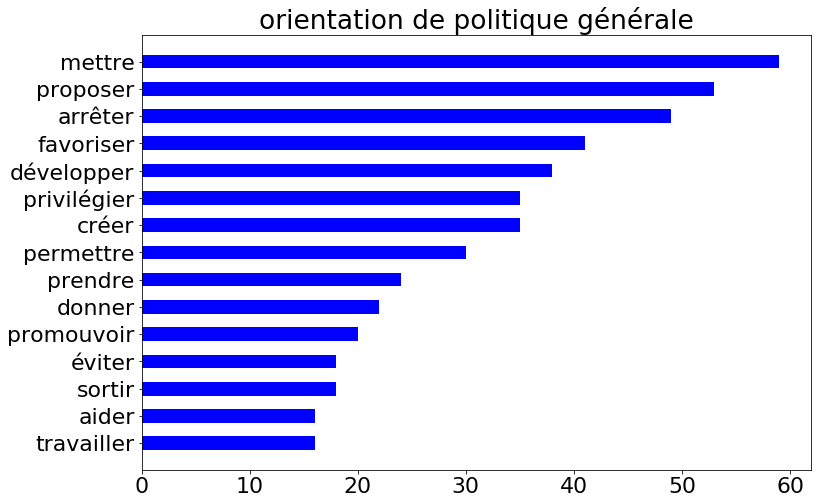



sensibilisation et communication
[('apprendre', 155), ('sensibiliser', 142), ('éduquer', 141), ('mettre', 102), ('informer', 82), ('donner', 70), ('prendre', 62), ('manger', 60), ('proposer', 59), ('arrêter', 59), ('expliquer', 56), ('créer', 55), ('cuisiner', 55), ('comprendre', 52), ('former', 45)]


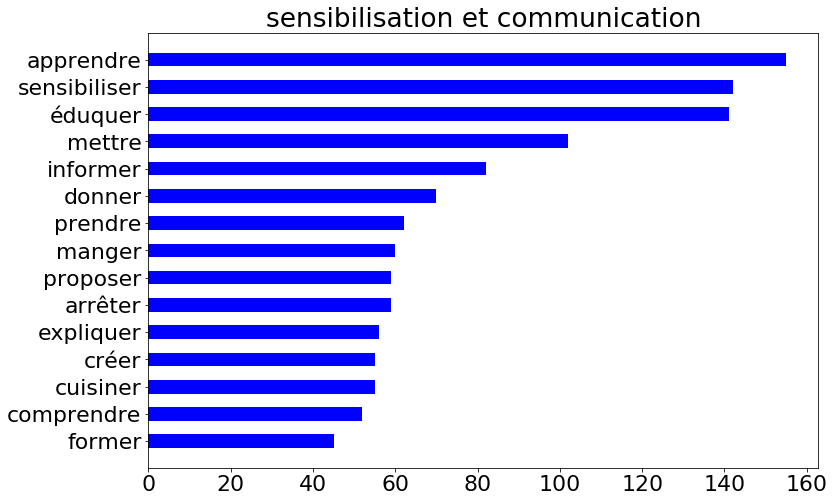



insertion
[('permettre', 29), ('adapter', 28), ('favoriser', 24), ('intégrer', 15), ('faciliter', 15), ('inclure', 15), ('accompagner', 14), ('aider', 12), ('pouvoir', 12), ('proposer', 10), ('mettre', 9), ('former', 8), ('accéder', 8), ('créer', 7), ('scolariser', 7)]


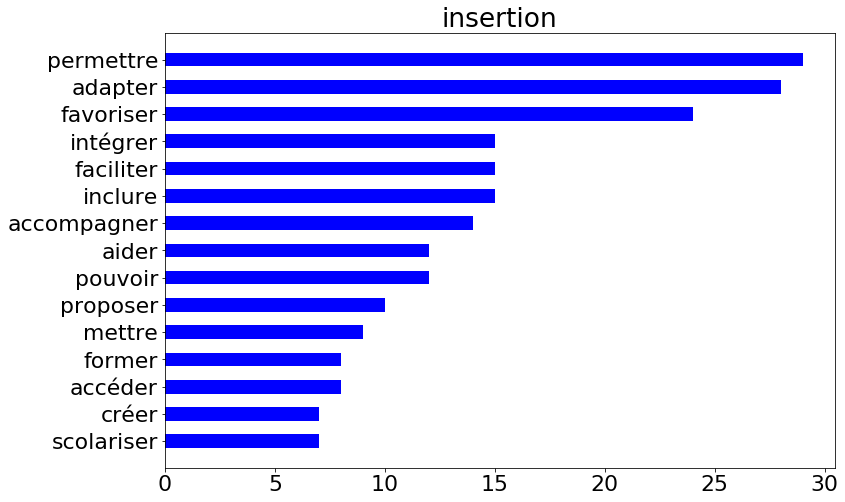



simplification
[('faciliter', 33), ('simplifier', 23), ('déler', 13), ('arrêter', 12), ('réduire', 12), ('supprimer', 11), ('permettre', 9), ('accélérer', 7), ('adapter', 6), ('créer', 6), ('éviter', 5), ('diminuer', 4), ('alléger', 4), ('prendre', 4), ('mettre', 4)]


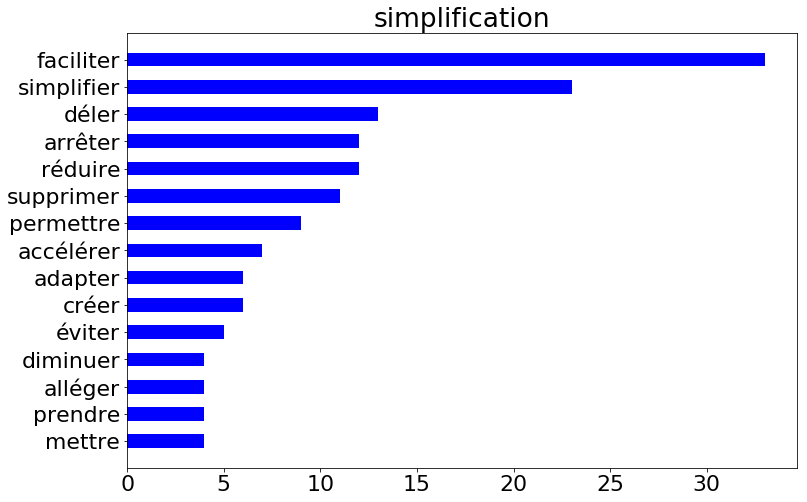



aides et subventions
[('aider', 100), ('donner', 53), ('permettre', 48), ('prendre', 43), ('favoriser', 40), ('créer', 28), ('augmenter', 22), ('adapter', 22), ('encourager', 22), ('soutenir', 21), ('développer', 21), ('vivre', 21), ('mettre', 18), ('rendre', 18), ('proposer', 17)]


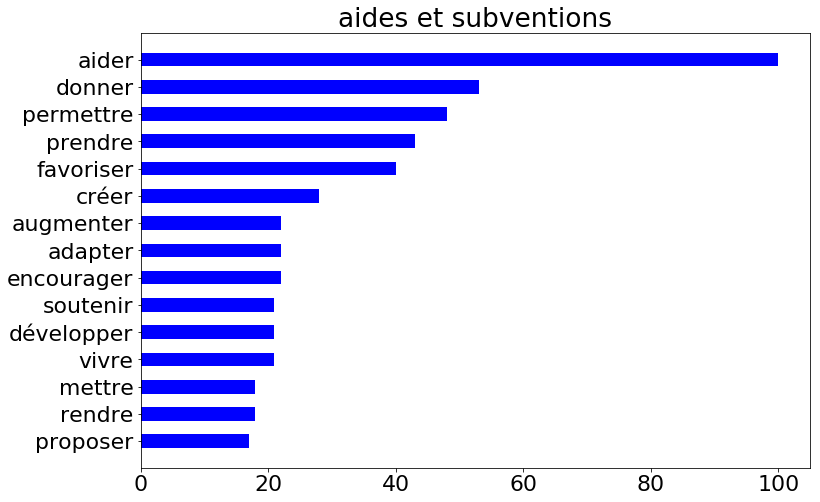



budget
[('augmenter', 56), ('valoriser', 47), ('demande', 37), ('attirer', 36), ('répondre', 36), ('hausse', 36), ('créer', 34), ('donner', 29), ('permettre', 21), ('prendre', 20), ('développer', 19), ('financer', 17), ('réduire', 14), ('vivre', 13), ('soigner', 13)]


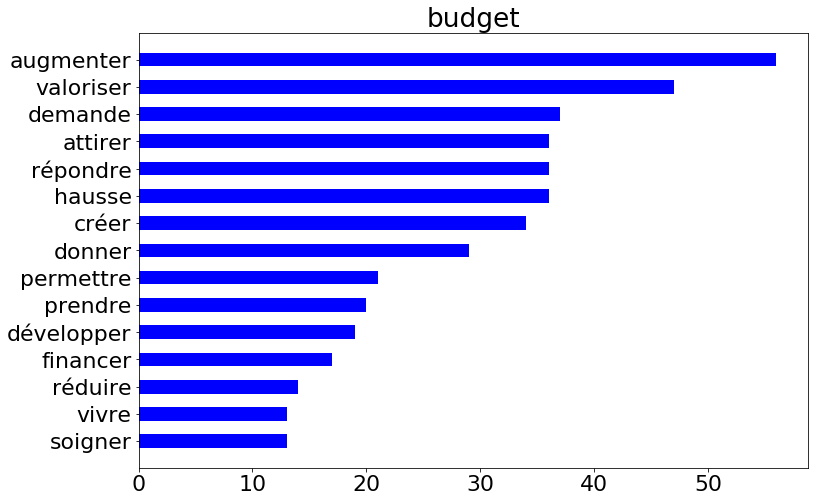



aménagement des espaces
[('adapter', 55), ('créer', 22), ('rendre', 17), ('permettre', 16), ('aménager', 15), ('mettre', 14), ('réserver', 13), ('accueillir', 13), ('faciliter', 12), ('obliger', 12), ('réduire', 11), ('rouler', 10), ('développer', 6), ('ouvrir', 6), ('aider', 6)]


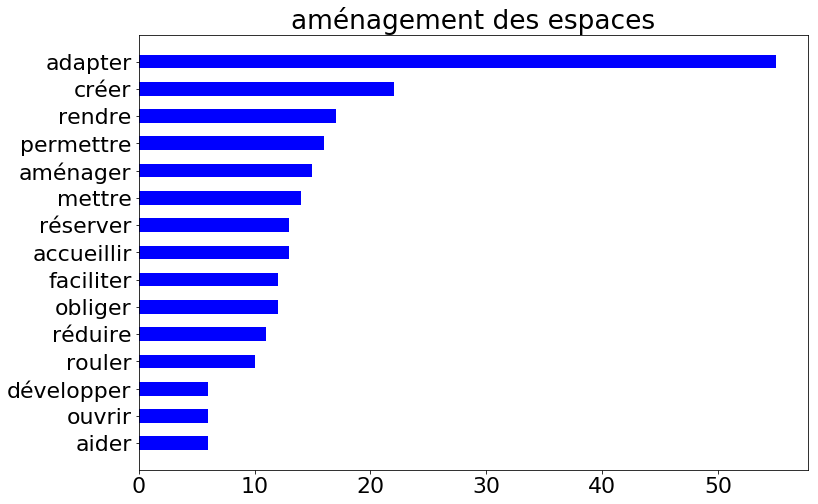



comportements individuels
[('manger', 597), ('privilégier', 181), ('acheter', 153), ('cuisiner', 125), ('arrêter', 102), ('consommer', 94), ('éviter', 81), ('favoriser', 73), ('apprendre', 69), ('réduire', 64), ('frer', 60), ('prendre', 51), ('préparer', 41), ('respecter', 40), ('diminuer', 38)]


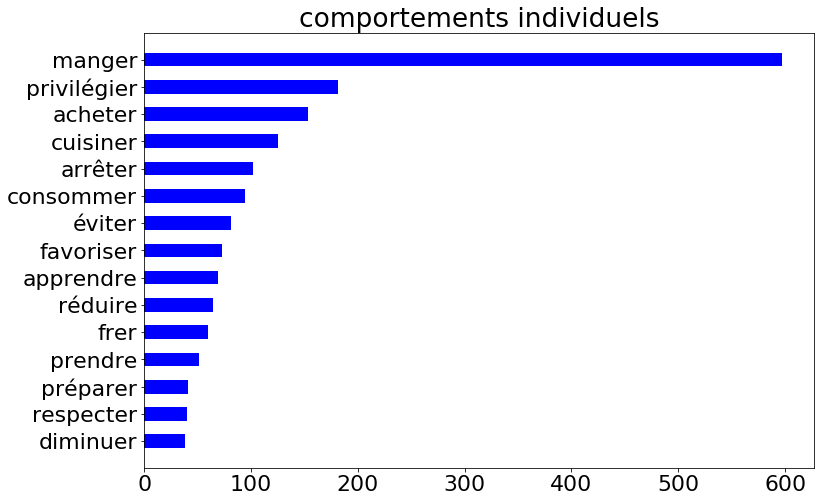



régulation
[('interdire', 327), ('arrêter', 261), ('supprimer', 128), ('limiter', 99), ('mettre', 74), ('stopper', 72), ('réduire', 70), ('imposer', 68), ('proposer', 60), ('obliger', 56), ('permettre', 50), ('contrôler', 47), ('baisser', 47), ('vendre', 46), ('rendre', 45)]


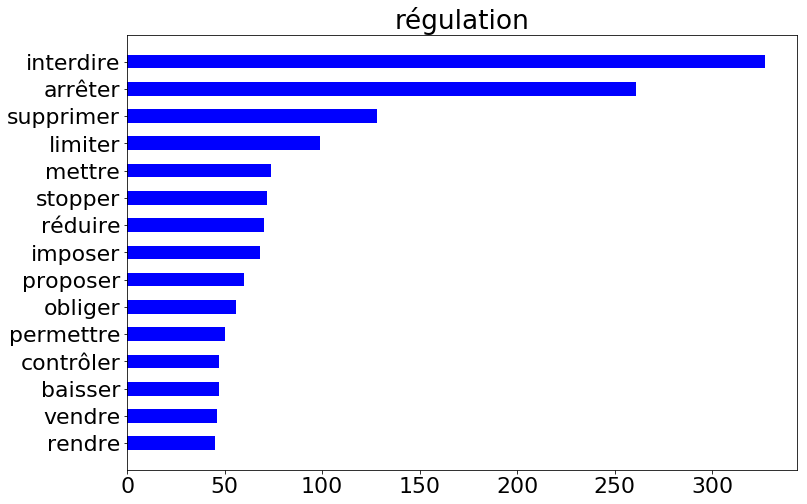



taxation
[('taxer', 163), ('payer', 33), ('baisser', 27), ('augmenter', 26), ('supprimer', 24), ('réduire', 19), ('mettre', 19), ('créer', 15), ('favoriser', 14), ('issus', 13), ('imposer', 13), ('appliquer', 12), ('instaurer', 11), ('fabriquer', 10), ('transformer', 10)]


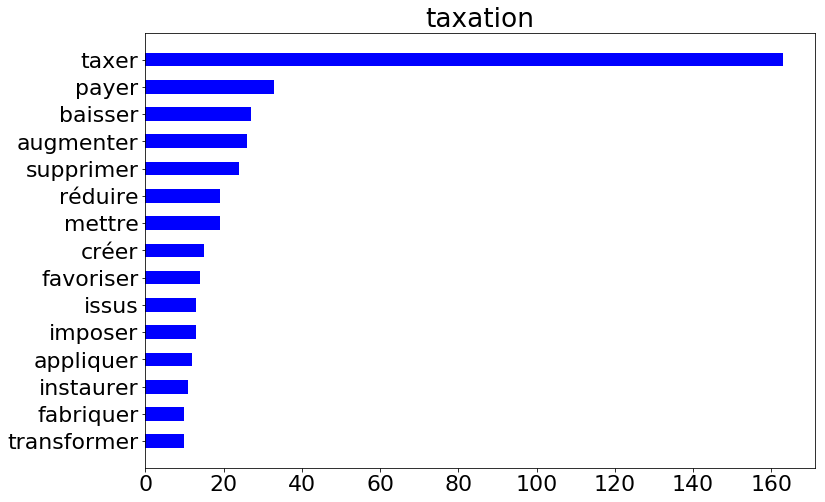



action européenne
[('imposer', 2), ('venir', 2), ('puisse garder', 1), ('choisir', 1), ('vivre', 1), ('travailler davantage', 1), ('garantir', 1), ('définir', 1), ('interdire', 1), ('taxer lourdemer', 1), ('durcir', 1), ('séparer', 1), ('modifier', 1), ('favoriser massivemer', 1), ('revoir', 1)]


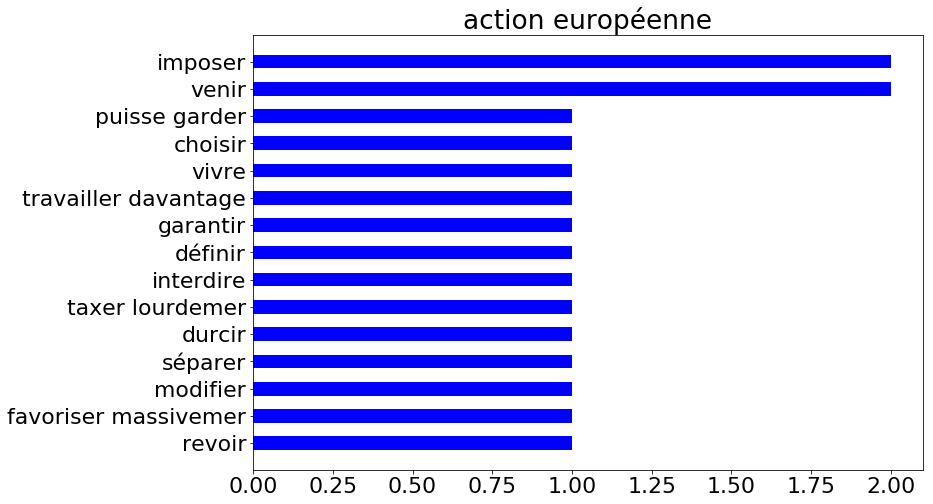



contrôle qualité
[('proposer', 6), ('interdire', 5), ('contrôler', 4), ('rendre', 4), ('améliorer', 4), ('produire', 3), ('mettre', 3), ('diminuer', 3), ('respecter', 2), ('afficher', 2), ('vérifier', 2), ('imposer', 2), ('consommer', 2), ('mieux contrôler', 2), ('contenir', 2)]


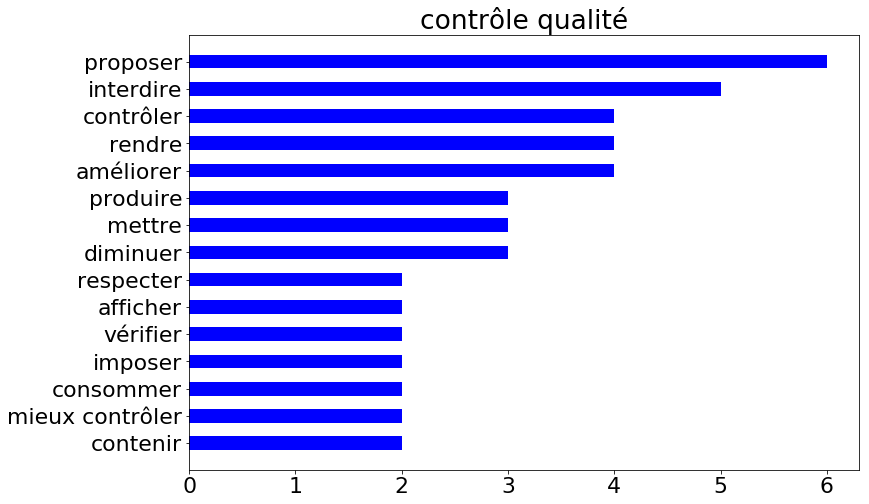



protectionnisme économique
[('arrêter', 26), ('privilégier', 18), ('importer', 18), ('acheter', 17), ('venir', 13), ('interdire', 9), ('consommer', 8), ('favoriser', 8), ('proposer', 8), ('taxer', 7), ('limiter', 7), ('produire', 6), ('vendre', 6), ('travailler', 5), ('manger', 4)]


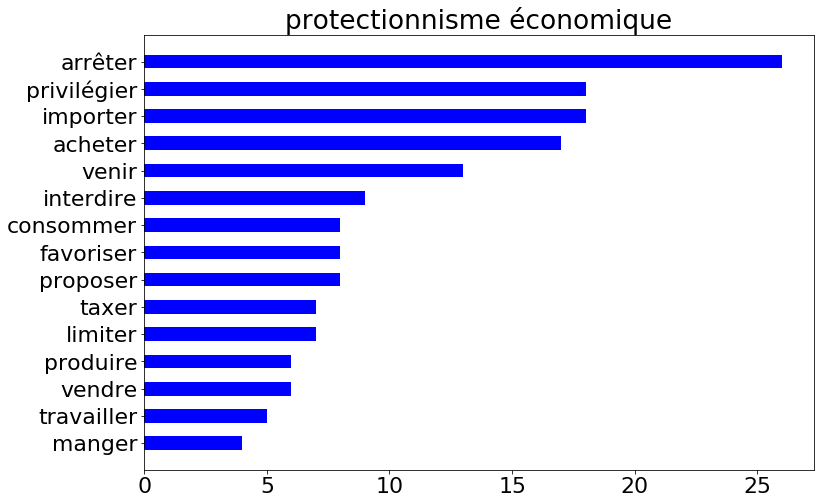



RSE
[('proposer', 9), ('arrêter', 7), ('réduire', 5), ('vendre', 5), ('favoriser', 5), ('créer', 5), ('aider', 5), ('développer', 4), ('donner', 4), ('rendre', 4), ('améliorer', 4), ('instaurer', 4), ('imposer', 4), ('acheter', 3), ('inciter', 3)]


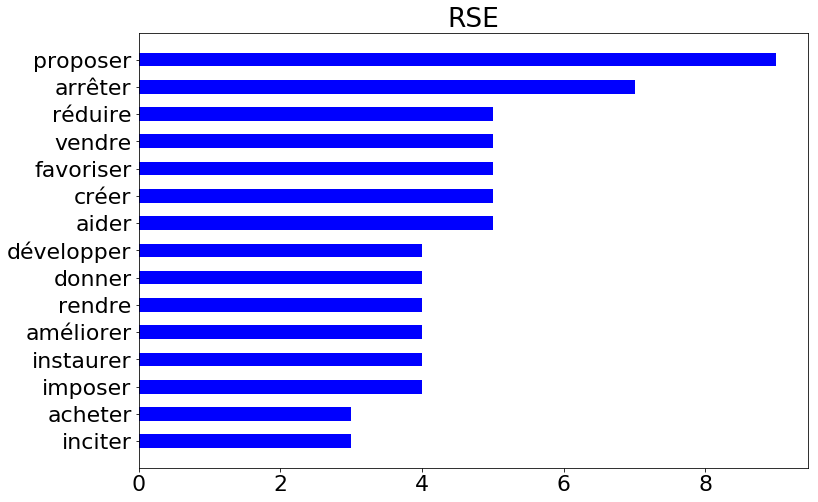



aménagement du territoire
[('créer', 19), ('développer', 12), ('favoriser', 12), ('planter', 10), ('partager', 8), ('mettre', 8), ('cultiver', 8), ('proposer', 7), ('permettre', 6), ('remplacer', 6), ('installer', 4), ('produire', 4), ('organiser', 4), ('multiplier', 4), ('limiter', 3)]


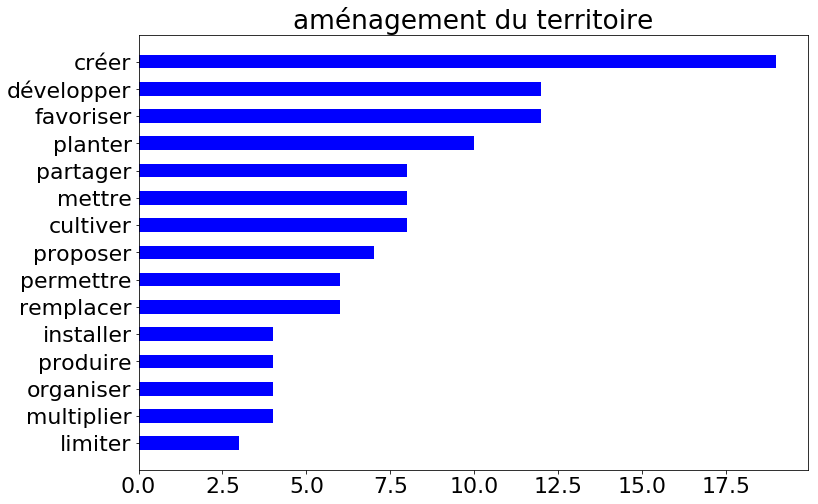



redistribution & répartition
[('proposer', 4), ('mettre', 4), ('manger', 4), ('permettre', 4), ('donner', 4), ('augmenter', 4), ('mieux rémunérer', 4), ('jeter', 4), ('revenir', 3), ('prendre', 3), ('créer', 3), ('baisser', 3), ('gagner', 3), ('distribuer', 3), ('acheter', 2)]


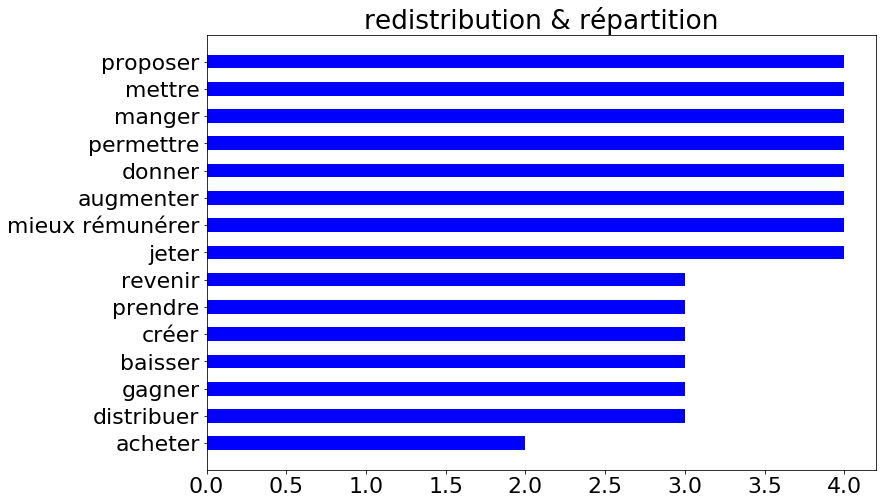



protection environnementale
[('venir', 5), ('éviter', 4), ('interdire', 4), ('protéger', 4), ('vendre', 4), ('arrêter', 3), ('limiter', 2), ('supprimer', 2), ('réduire', 2), ('développer', 2), ('stopper', 2), ('travailler', 2), ('mettre', 2), ('favorise', 1), ('approvisionner', 1)]


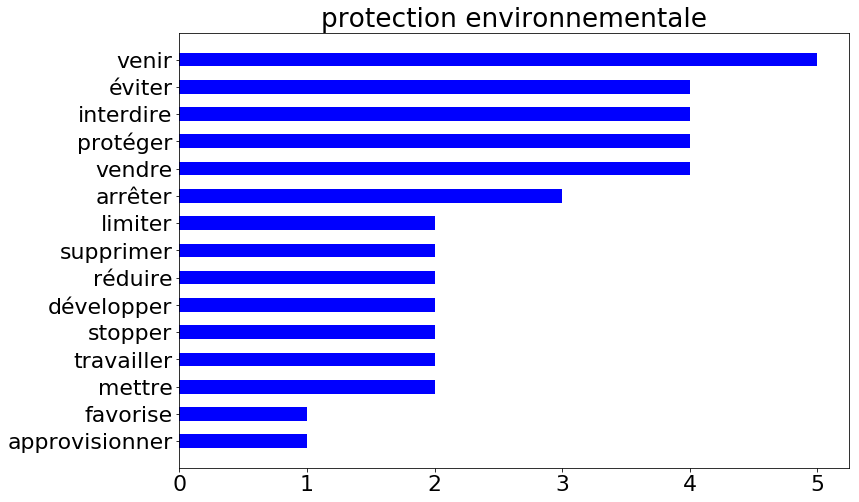



sortie euro et Europe
[('sortir', 1600), ('quitter', 71), ('supprimer', 58), ('retrouver', 19), ('dissoudre', 16), ('revenir', 15), ('reprendre', 8), ('finir', 5), ('redonner', 5), ('créer', 5), ('récupérer', 5), ('arrêter', 5), ('mettre', 5), ('diriger', 4), ('rendre', 4)]


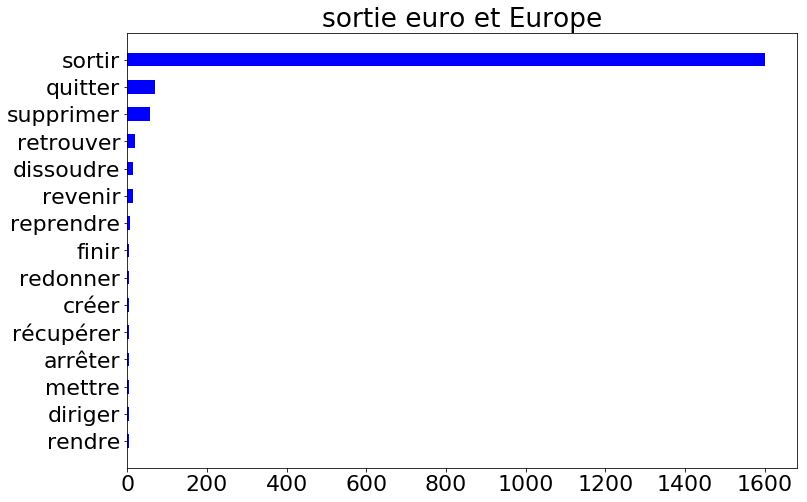



coopération intergouvernementale
[('créer', 24), ('unir', 11), ('développer', 11), ('aider', 8), ('renforcer', 6), ('favoriser', 5), ('financer', 5), ('régler', 5), ('permettre', 4), ('construire', 4), ('faciliter', 4), ('devenir', 4), ('mettre', 4), ('engager', 4), ('protéger', 4)]


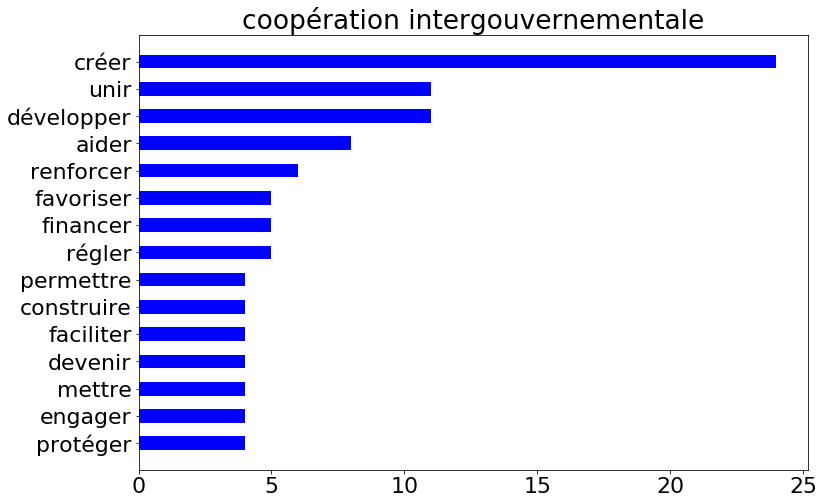



justice
[('poursuivre', 1), ('tricher', 1), ('proposer', 1), ('unifier', 1)]


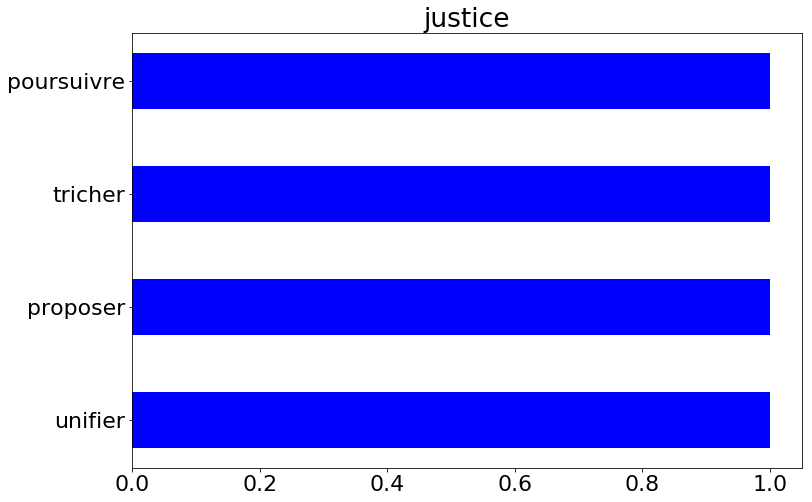



accompagnement & coaching
[('aider', 7), ('proposer', 6), ('apprendre', 3), ('harceler', 2), ('comprendre', 2), ('former', 2), ('mettre', 2), ('prendre', 1), ('pouvoir', 1), ('prémunir', 1), ('passer', 1), ('occuper', 1), ('souffrir', 1), ('mal', 1), ('pencher davantage', 1)]


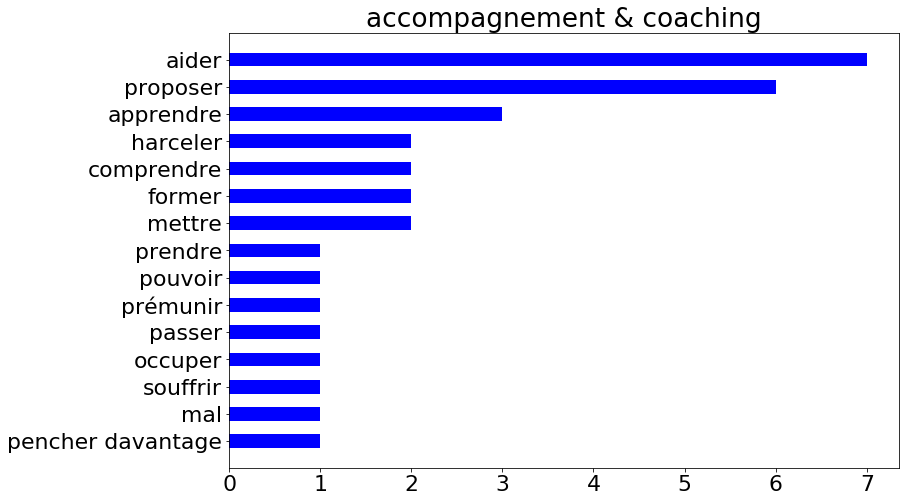



responsabilisation
[('apprendre', 3), ('importer', 1), ('commencer', 1), ('responsabiliser', 1), ('améliorer', 1), ('partir', 1), ('lancer', 1), ('arrêter', 1), ('fermer', 1), ('donner', 1)]


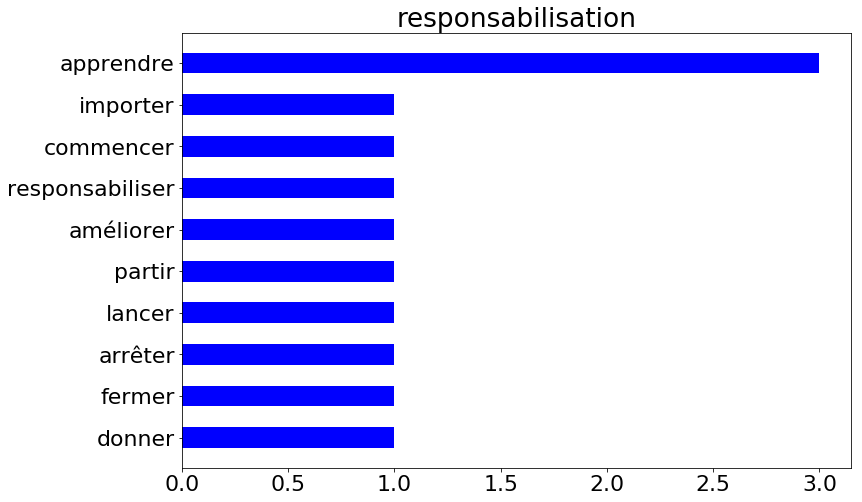



e-santé
[('créer', 2), ('apprendre', 1), ('accéder', 1), ('concerner', 1)]


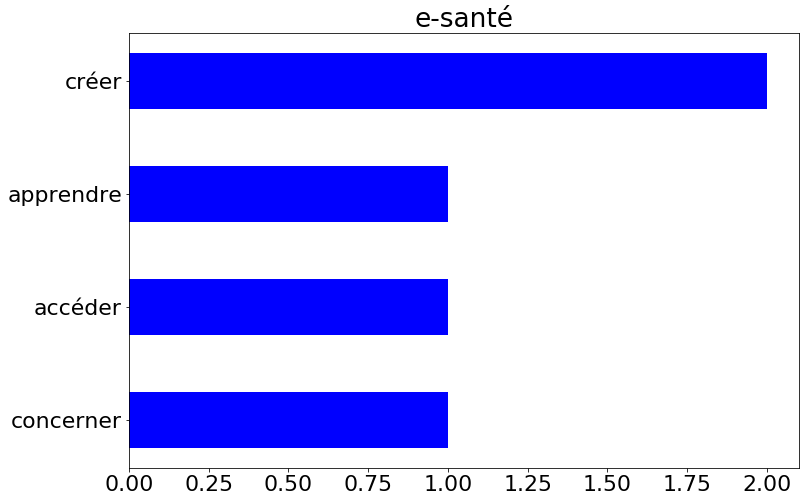



reform of the EU institutions
[('créer', 81), ('élire', 64), ('supprimer', 55), ('réduire', 23), ('prendre', 20), ('donner', 19), ('mettre', 16), ('interdire', 15), ('diminuer', 15), ('limiter', 14), ('voter', 12), ('instaurer', 11), ('remplacer', 10), ('représenter', 9), ('arrêter', 9)]


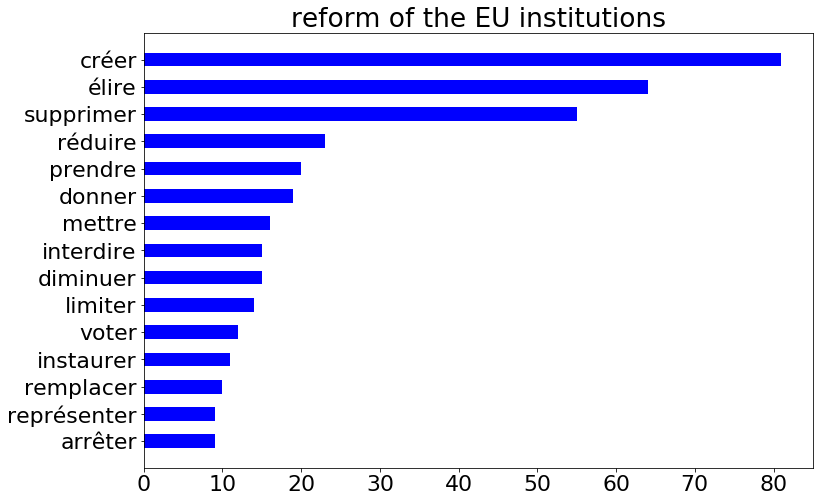



national competences
[('remettre', 16), ('redonner', 13), ('respecter', 12), ('retrouve', 9), ('laisser', 8), ('arrêter', 8), ('nationaliser', 8), ('créer', 7), ('rétablir', 7), ('prendre', 6), ('revenir', 6), ('garder', 6), ('reste', 5), ('retrouver', 5), ('favoriser', 5)]


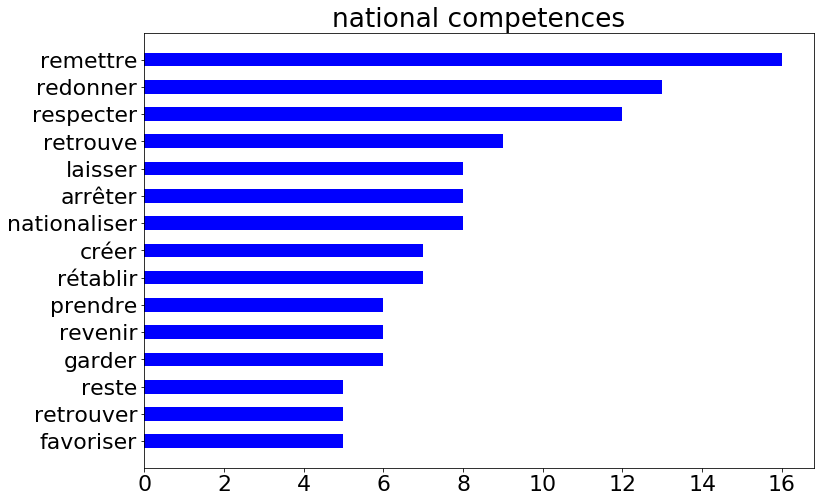



pan-European major projects
[('créer', 21), ('favoriser', 7), ('protéger', 6), ('lutter', 6), ('arrêter', 5), ('développer', 5), ('mettre', 4), ('vivre', 3), ('permettre', 3), ('instaurer', 3), ('prendre', 2), ('davantage', 2), ('travailler', 2), ('inclure', 2), ('devenir', 2)]


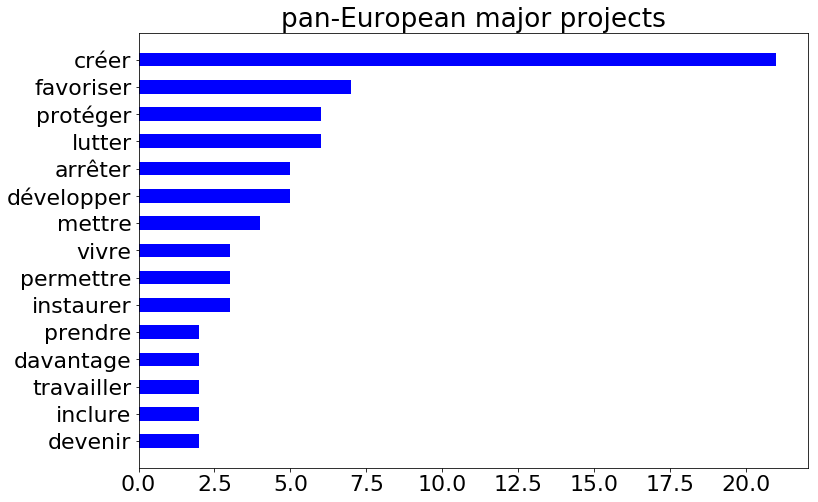



EU competences
[('créer', 52), ('devenir', 8), ('élire', 4), ('unir', 4), ('renforcer', 3), ('sortir', 3), ('mettre', 3), ('financer', 3), ('établir', 3), ('donner', 3), ('dépendre', 3), ('assurer', 2), ('commencer', 2), ('garder', 2), ('dote', 2)]


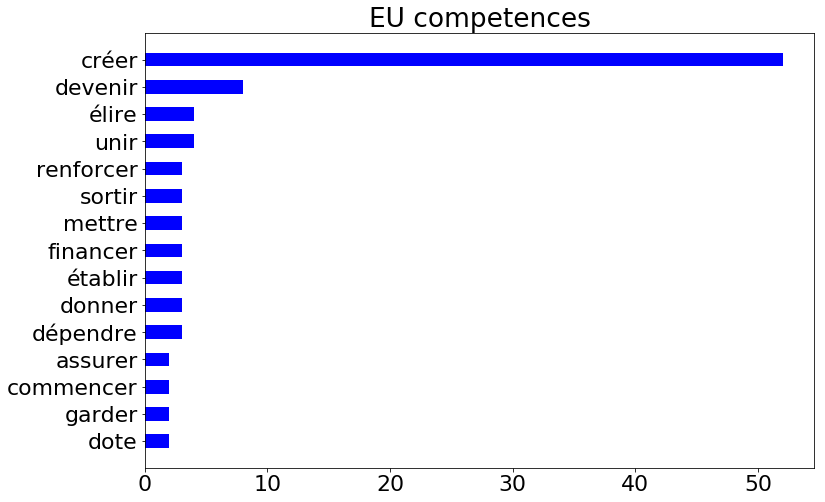



diplomatic decisions & treaties
[('intégrer', 5), ('supprimer', 4), ('revoir', 3), ('sortir', 3), ('éviter', 3), ('créer', 3), ('mettre', 2), ('parler', 2), ('interdire', 2), ('renégocier', 2), ('réduire', 2), ('favoriser', 2), ('ratifier', 1), ('refuser', 1), ('changer', 1)]


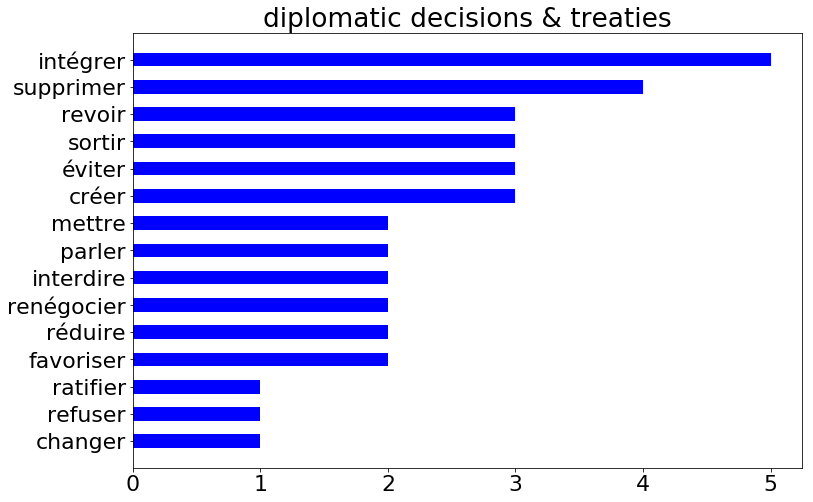



social protection & public services
[('augmenter', 10), ('créer', 8), ('permettre', 7), ('penser', 7), ('développer', 6), ('supprimer', 5), ('protéger', 4), ('rétablir', 4), ('donner', 4), ('stopper', 3), ('revaloriser', 3), ('instaurer', 3), ('aider', 3), ('revoir', 3), ('privilégier', 2)]


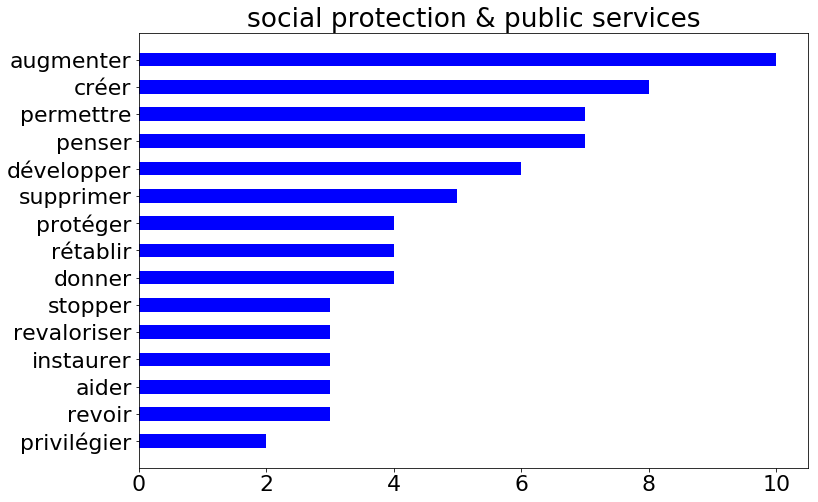



european protectionism
[('protéger', 9), ('fermer', 5), ('limiter', 5), ('interdire', 5), ('rétablir', 4), ('favoriser', 4), ('sortir', 3), ('mettre', 3), ('privilégier', 3), ('arrêter', 3), ('respecter', 2), ('réguler', 2), ('remettre', 2), ('stopper', 2), ('importer', 2)]


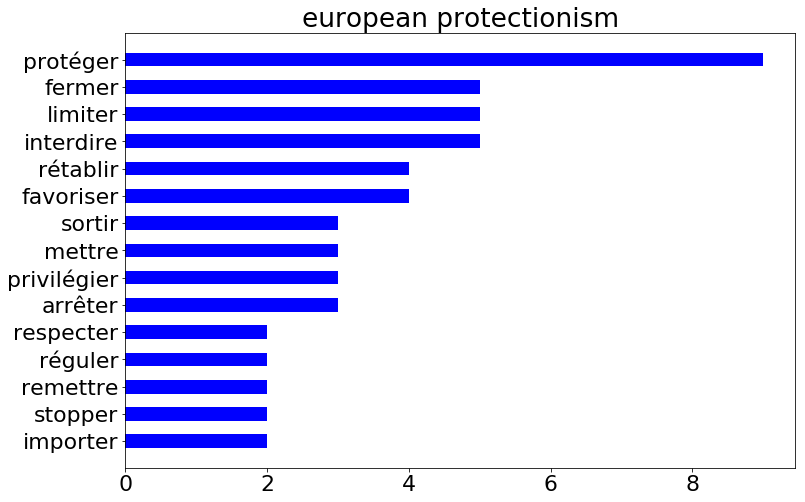



land development
[('développer', 7), ('protéger', 5), ('replanter', 4), ('recréer', 4), ('créer', 4), ('limiter', 3), ('relancer', 3), ('réinventer', 2), ('interdire', 2), ('utiliser', 2), ('reprendre', 2), ('organiser', 2), ('favoriser', 2), ('déplacer', 2), ('mettre', 2)]


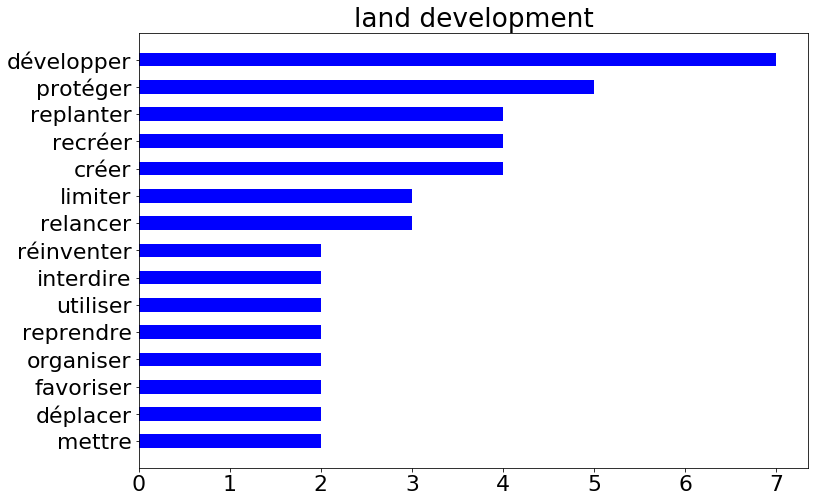



numérique
[('développer', 4), ('créer', 2), ('conserver', 1), ('supprimer', 1), ('allier avancer', 1), ('va maintenir', 1), ('mobiliser', 1), ('intégrer', 1), ('prendre', 1), ('aider', 1), ('rester', 1), ('lutter', 1), ('équiper', 1), ('simplifier', 1), ('échanger', 1)]


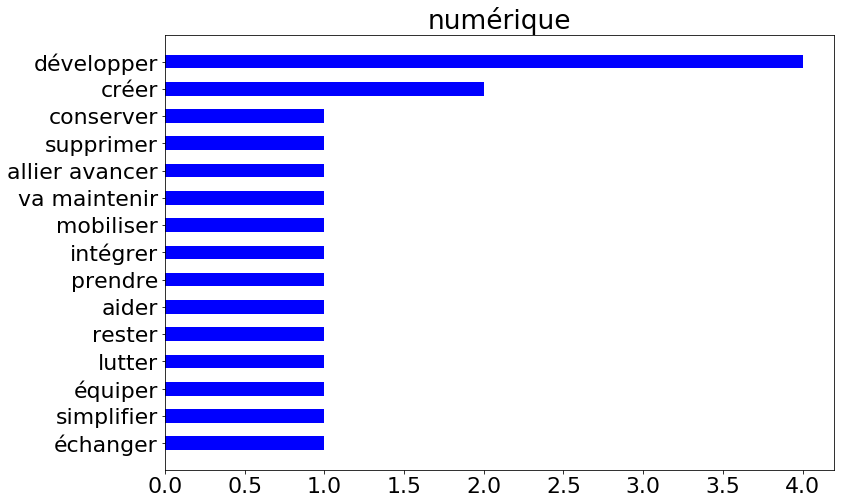



politique sociale
[('développer', 70), ('créer', 52), ('permettre', 45), ('favoriser', 34), ('adapter', 33), ('prendre', 23), ('proposer', 21), ('rester', 20), ('aider', 20), ('faciliter', 19), ('mettre', 19), ('maintenir', 18), ('valoriser', 18), ('donner', 17), ('accompagner', 16)]


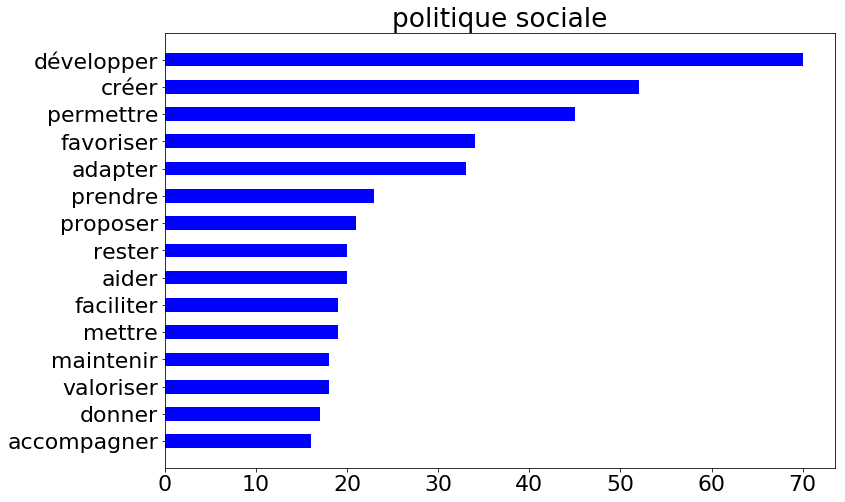



couverture sociale
[('prendre', 9), ('permettre', 6), ('créer', 6), ('reste', 5), ('maintenir', 4), ('proposer', 4), ('donner', 4), ('développer', 4), ('prévoir', 3), ('financer', 3), ('aider', 3), ('mettre', 3), ('améliorer', 3), ('réduire', 3), ('frer', 2)]


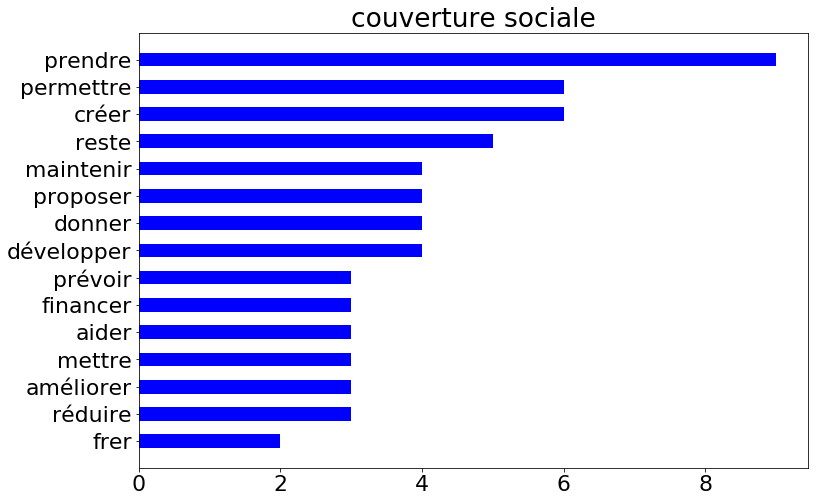



engagement associatif
[('mettre', 3), ('intégrer', 1), ('aller proposer', 1), ('rejoindre', 1), ('pourraient transmettre', 1), ('apporter', 1), ('développer', 1), ('favoriser', 1), ('encourager', 1), ('garder', 1), ('laisser', 1), ('installer', 1), ('stimuler', 1), ('permettre', 1), ('sortir', 1)]


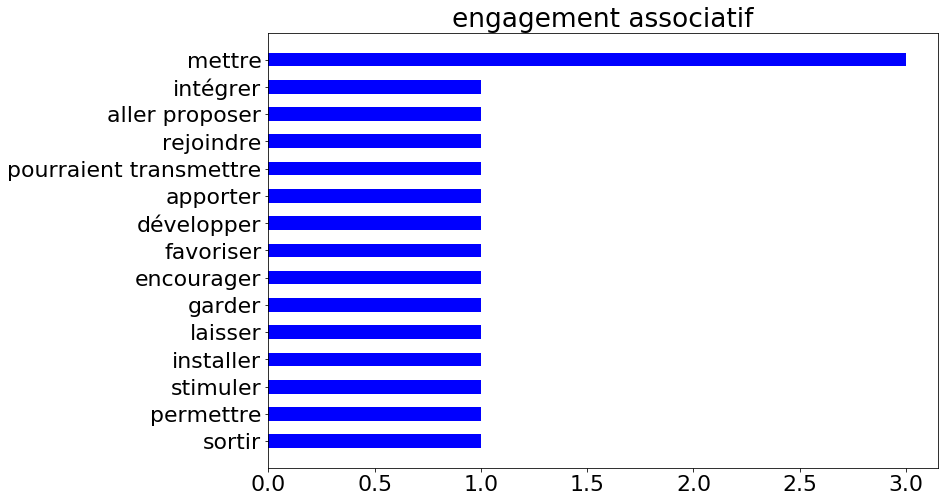



transformation de l'administration
[('aider', 5), ('simplifier', 4), ('laver', 2), ('manger', 2), ('grouper', 2), ('négocier', 2), ('baisse', 2), ('centraliser', 2), ('dédier', 2), ('prendre', 2), ('créer', 2), ('éviter', 2), ('accélérer', 2), ('faciliter', 2), ('revoir', 1)]


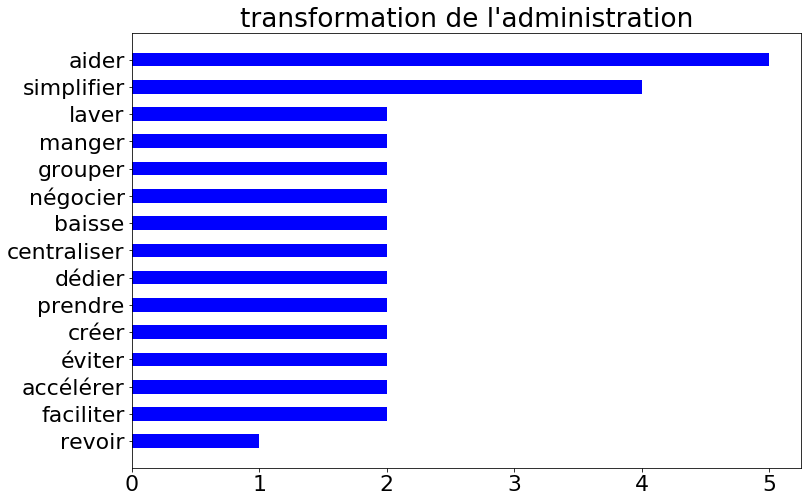



intergénérationnel
[('développer', 12), ('créer', 11), ('favoriser', 8), ('proposer', 5), ('adapter', 5), ('encourager', 5), ('mettre', 4), ('ouvrir', 3), ('partager', 3), ('lutter', 3), ('aider', 3), ('modérer', 2), ('mélanger', 2), ('arrêter', 2), ('inter', 2)]


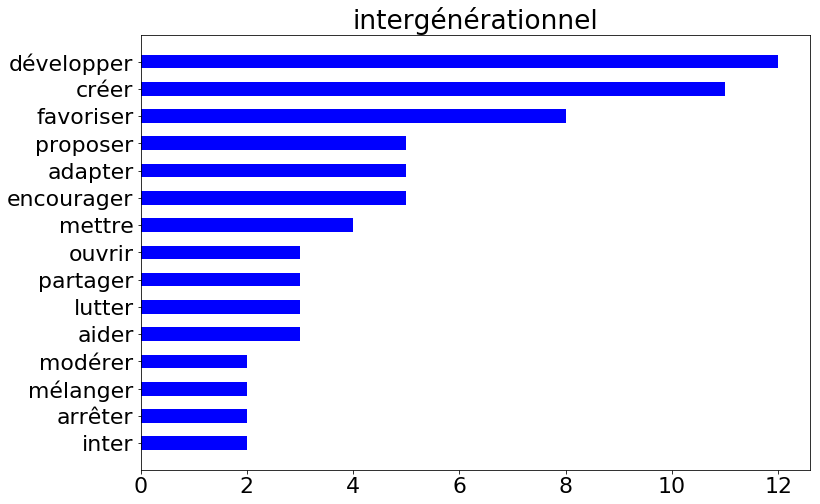



fiscalité & cotisations
[('permettre', 3), ('mettre', 3), ('adapter', 2), ('supprimer', 2), ('soigner', 2), ('envisager', 2), ('créer', 2), ('nourrir', 2), ('revenir', 1), ('élever', 1), ('assurer', 1), ('rester', 1), ('inclure', 1), ('vivre', 1), ('harmoniser', 1)]


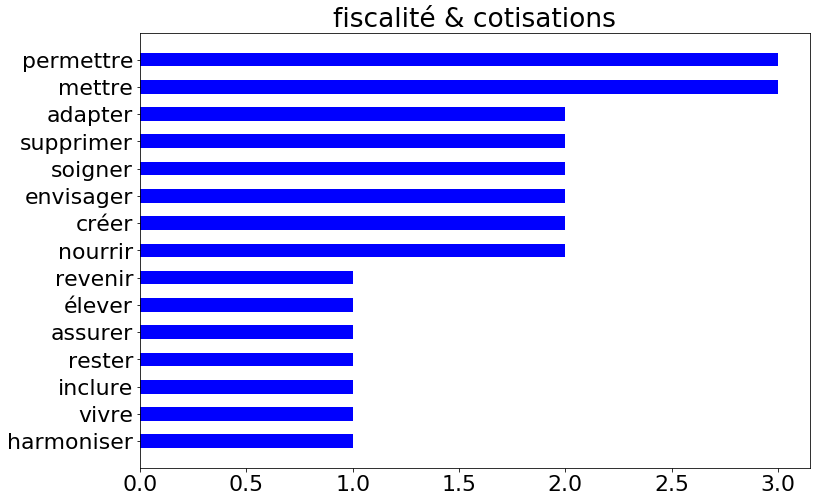



recherche
[('permettre', 2), ('vivre', 2), ('proposer', 2), ('maintenir', 1), ('souher', 1), ('repenser', 1), ('libérer', 1), ('représenter', 1), ('recenser', 1), ('adapter', 1), ('développer', 1), ('prendre', 1), ('imaginer', 1), ('utiliser', 1), ('sortir', 1)]


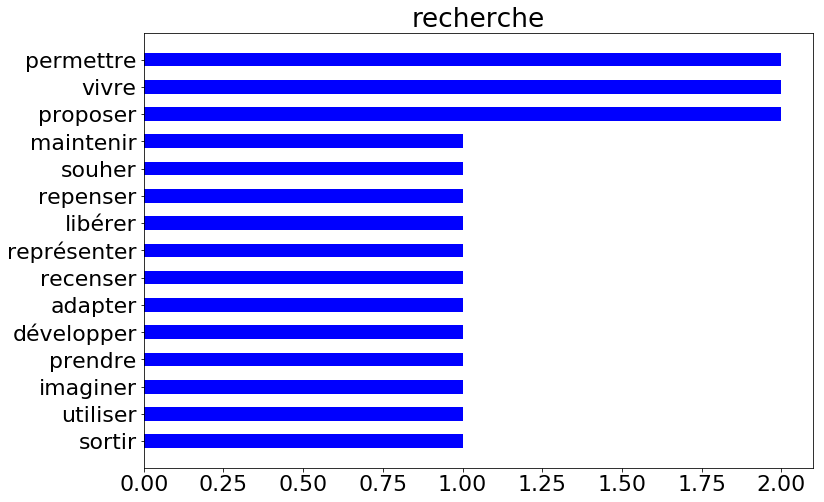

In [16]:
#regarder les mots clés dans les solutions et non inverse : 

plt.rcParams.update({'font.size': 22})
for k in solutions2vp.keys() :
    print(k)
    sort=sorted(solutions2vp[k].items(), key=lambda x: x[1], reverse=True)[:15]
    print(sort)
    graphe = plt.figure(figsize=(12,8))
    y = range(1,len(sort)+1)
    height = [j for i,j in sort]
    width = 0.5
    BarName =[i for i,j in sort]
    plt.title(k)
    pylab.yticks(y, BarName)
    plt.barh(y, height, width, color='b')
    plt.gca().invert_yaxis()
    plt.show()
    print('\n')